## Model Training

We'll attempt to train a multi-class support vector machine on our feature-engineered data.

### Retrieve feature-engineered data into pandas dataframe

In [1]:
import config
import mysql
import mysql.connector
from mysql.connector import errorcode

# DB FUNCTIONS

def connect(db_name=None):
    if db_name:
        cnx = mysql.connector.connect(
            host = config.rds_host,
            user = config.rds_user,
            passwd = config.rds_password,
            database = db_name)
    else:
        cnx = mysql.connector.connect(
            host = config.rds_host,
            user = config.rds_user,
            passwd = config.rds_password)
    cursor = cnx.cursor()
    return cursor, cnx


In [35]:
import pandas as pd

cur, cnx = connect('instruments')
cur.execute('''SELECT * FROM harmonic_content''')

df = pd.DataFrame(cur.fetchall())
df.columns = [i[0] for i in cur.description]
cnx.close()

In [37]:
df

,sample_id,frequency_id,amplitude
0,1,0,0.003238
1,1,1,0.003516
2,1,2,0.003653
3,1,3,0.004583
4,1,4,0.005378
...,...,...,...
4786171,1847,2043,0.002954
4786172,1847,2044,0.002266
4786173,1847,2045,0.002954
4786174,1847,2046,0.001999


In [36]:
import pandas as pd

cur, cnx = connect('instruments')
cur.execute('''SELECT * FROM samples''')

sample_info = pd.DataFrame(cur.fetchall())
sample_info.columns = [i[0] for i in cur.description]
cnx.close()

In [40]:
sample_info.set_index('sample_id', inplace=True)
sample_info

,instrument_name,note,expression,source,file_extension
sample_id,,,,,
1,Flute,Gb6,vib,Iowa2012,aif
2,Flute,Bb5,vib,Iowa2012,aif
3,Flute,G4,vib,Iowa2012,aif
4,Flute,Eb5,vib,Iowa2012,aif
5,Flute,A6,vib,Iowa2012,aif
...,...,...,...,...,...
2333,Crotale,Gb6,,Iowa2012,aif
2334,Crotale,A7,,Iowa2012,aif
2335,Crotale,E6,,Iowa2012,aif


In [59]:
data = df.set_index(['sample_id', 'frequency_id'])

In [60]:
data2 = data.unstack(level=-1)

In [66]:
print(list(data2.columns))

[('instrument_name', 0), ('instrument_name', 1), ('instrument_name', 2), ('instrument_name', 3), ('instrument_name', 4), ('instrument_name', 5), ('instrument_name', 6), ('instrument_name', 7), ('instrument_name', 8), ('instrument_name', 9), ('instrument_name', 10), ('instrument_name', 11), ('instrument_name', 12), ('instrument_name', 13), ('instrument_name', 14), ('instrument_name', 15), ('instrument_name', 16), ('instrument_name', 17), ('instrument_name', 18), ('instrument_name', 19), ('instrument_name', 20), ('instrument_name', 21), ('instrument_name', 22), ('instrument_name', 23), ('instrument_name', 24), ('instrument_name', 25), ('instrument_name', 26), ('instrument_name', 27), ('instrument_name', 28), ('instrument_name', 29), ('instrument_name', 30), ('instrument_name', 31), ('instrument_name', 32), ('instrument_name', 33), ('instrument_name', 34), ('instrument_name', 35), ('instrument_name', 36), ('instrument_name', 37), ('instrument_name', 38), ('instrument_name', 39), ('instrum

In [53]:
df.head()

,frequency_id,sample_id,instrument_name,note,expression,source,file_extension,amplitude,frequency,log_2_frequency
0,0,1,Flute,Gb6,vib,Iowa2012,aif,0.003238,10.766602,3.428491
1,0,2,Flute,Bb5,vib,Iowa2012,aif,0.002859,10.766602,3.428491
2,0,3,Flute,G4,vib,Iowa2012,aif,0.470771,10.766602,3.428491
3,0,4,Flute,Eb5,vib,Iowa2012,aif,0.005541,10.766602,3.428491
4,0,5,Flute,A6,vib,Iowa2012,aif,0.003521,10.766602,3.428491


In [39]:
data = df.pivot(index='sample_id', columns='frequency_id', values='amplitude')
data

frequency_id,0,1,2,3,4,5,6,7,8,9,...,2038,2039,2040,2041,2042,2043,2044,2045,2046,2047
sample_id,,,,,,,,,,,,,,,,,,,,,
1,0.003238,0.003516,0.003653,0.004583,0.005378,0.005542,0.005779,0.005876,0.006885,0.006476,...,0.076767,0.073233,0.073390,0.071249,0.067423,0.074807,0.071793,0.074314,0.065015,0.060249
2,0.002859,0.004412,0.006860,0.010949,0.013922,0.015170,0.017266,0.020821,0.021021,0.021095,...,0.060817,0.060192,0.063314,0.061040,0.062658,0.058267,0.060641,0.061230,0.057176,0.052379
3,0.470771,0.314912,0.120817,0.095654,0.085359,0.060197,0.037835,0.032554,0.027049,0.026489,...,0.003026,0.002823,0.002957,0.003481,0.003591,0.003186,0.003226,0.003548,0.003635,0.003283
4,0.005541,0.009706,0.013444,0.023435,0.032274,0.034287,0.033264,0.040268,0.040223,0.034025,...,0.041233,0.033820,0.032133,0.029678,0.030990,0.035940,0.036911,0.036216,0.038078,0.038489
5,0.003521,0.003417,0.003128,0.003775,0.003662,0.004113,0.004573,0.005411,0.006391,0.005843,...,0.042432,0.043850,0.041825,0.037201,0.036231,0.039358,0.046034,0.049473,0.047220,0.040782
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2333,0.005842,0.006696,0.005504,0.008009,0.010848,0.008933,0.005405,0.005450,0.004055,0.004462,...,0.000296,0.000293,0.000254,0.000225,0.000219,0.000230,0.000214,0.000199,0.000189,0.000159
2334,0.011724,0.013896,0.011100,0.013689,0.022415,0.020919,0.010713,0.008141,0.006795,0.008993,...,0.000432,0.000410,0.000409,0.000413,0.000424,0.000351,0.000316,0.000306,0.000334,0.000327
2335,0.014983,0.020384,0.016735,0.018972,0.027308,0.021950,0.012783,0.012019,0.008091,0.008059,...,0.000304,0.000357,0.000451,0.000693,0.000934,0.000752,0.000527,0.000734,0.000921,0.000812


In [15]:
data.columns = data.columns.get_level_values(0)
data['sample_id'] = data.index
data

frequency_id,0,1,2,3,4,5,6,7,8,9,...,2039,2040,2041,2042,2043,2044,2045,2046,2047,sample_id
sample_id,,,,,,,,,,,,,,,,,,,,,
1,0.003238,0.003516,0.003653,0.004583,0.005378,0.005542,0.005779,0.005876,0.006885,0.006476,...,0.073233,0.073390,0.071249,0.067423,0.074807,0.071793,0.074314,0.065015,0.060249,1
2,0.002859,0.004412,0.006860,0.010949,0.013922,0.015170,0.017266,0.020821,0.021021,0.021095,...,0.060192,0.063314,0.061040,0.062658,0.058267,0.060641,0.061230,0.057176,0.052379,2
3,0.470771,0.314912,0.120817,0.095654,0.085359,0.060197,0.037835,0.032554,0.027049,0.026489,...,0.002823,0.002957,0.003481,0.003591,0.003186,0.003226,0.003548,0.003635,0.003283,3
4,0.005541,0.009706,0.013444,0.023435,0.032274,0.034287,0.033264,0.040268,0.040223,0.034025,...,0.033820,0.032133,0.029678,0.030990,0.035940,0.036911,0.036216,0.038078,0.038489,4
5,0.003521,0.003417,0.003128,0.003775,0.003662,0.004113,0.004573,0.005411,0.006391,0.005843,...,0.043850,0.041825,0.037201,0.036231,0.039358,0.046034,0.049473,0.047220,0.040782,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2333,0.005842,0.006696,0.005504,0.008009,0.010848,0.008933,0.005405,0.005450,0.004055,0.004462,...,0.000293,0.000254,0.000225,0.000219,0.000230,0.000214,0.000199,0.000189,0.000159,2333
2334,0.011724,0.013896,0.011100,0.013689,0.022415,0.020919,0.010713,0.008141,0.006795,0.008993,...,0.000410,0.000409,0.000413,0.000424,0.000351,0.000316,0.000306,0.000334,0.000327,2334
2335,0.014983,0.020384,0.016735,0.018972,0.027308,0.021950,0.012783,0.012019,0.008091,0.008059,...,0.000357,0.000451,0.000693,0.000934,0.000752,0.000527,0.000734,0.000921,0.000812,2335


In [34]:
[x for x in list(sample_info.index) if x not in list(data.index)]

[1847]

In [32]:
list(sample_info.index)

[1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125,
 126,
 127,
 128,
 129,
 130,
 131,
 132,
 133,
 134,
 135,
 136,
 137,
 138,
 139,
 140,
 141,
 142,
 143,
 144,
 145,
 146,
 147,
 148,
 149,
 150,
 151,
 152,
 153,
 154,
 155,
 156,
 157,
 158,
 159,
 160,
 161,
 162,
 163,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 172,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 181,
 182,
 183,
 184,
 185

In [41]:
data2 = data.join(sample_info)
data2

,0,1,2,3,4,5,6,7,8,9,...,2043,2044,2045,2046,2047,instrument_name,note,expression,source,file_extension
sample_id,,,,,,,,,,,,,,,,,,,,,
1,0.003238,0.003516,0.003653,0.004583,0.005378,0.005542,0.005779,0.005876,0.006885,0.006476,...,0.074807,0.071793,0.074314,0.065015,0.060249,Flute,Gb6,vib,Iowa2012,aif
2,0.002859,0.004412,0.006860,0.010949,0.013922,0.015170,0.017266,0.020821,0.021021,0.021095,...,0.058267,0.060641,0.061230,0.057176,0.052379,Flute,Bb5,vib,Iowa2012,aif
3,0.470771,0.314912,0.120817,0.095654,0.085359,0.060197,0.037835,0.032554,0.027049,0.026489,...,0.003186,0.003226,0.003548,0.003635,0.003283,Flute,G4,vib,Iowa2012,aif
4,0.005541,0.009706,0.013444,0.023435,0.032274,0.034287,0.033264,0.040268,0.040223,0.034025,...,0.035940,0.036911,0.036216,0.038078,0.038489,Flute,Eb5,vib,Iowa2012,aif
5,0.003521,0.003417,0.003128,0.003775,0.003662,0.004113,0.004573,0.005411,0.006391,0.005843,...,0.039358,0.046034,0.049473,0.047220,0.040782,Flute,A6,vib,Iowa2012,aif
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2333,0.005842,0.006696,0.005504,0.008009,0.010848,0.008933,0.005405,0.005450,0.004055,0.004462,...,0.000230,0.000214,0.000199,0.000189,0.000159,Crotale,Gb6,,Iowa2012,aif
2334,0.011724,0.013896,0.011100,0.013689,0.022415,0.020919,0.010713,0.008141,0.006795,0.008993,...,0.000351,0.000316,0.000306,0.000334,0.000327,Crotale,A7,,Iowa2012,aif
2335,0.014983,0.020384,0.016735,0.018972,0.027308,0.021950,0.012783,0.012019,0.008091,0.008059,...,0.000752,0.000527,0.000734,0.000921,0.000812,Crotale,E6,,Iowa2012,aif


In [42]:
import matplotlib.pyplot as plt
%matplotlib inline  
from sklearn import svm
from sklearn.model_selection import train_test_split

import numpy as np

In [87]:
from sklearn.svm import LinearSVC

In [131]:
svc = SVC(kernel='rbf', gamma='scale')

In [132]:
X = data2[list(range(2047))]
y = data2['instrument_name']

In [133]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

In [134]:
svc.fit(X_train, y_train)

SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma='scale', kernel='rbf',
    max_iter=-1, probability=False, random_state=None, shrinking=True,
    tol=0.001, verbose=False)

In [135]:
y_pred = svc.predict(X_test)

In [136]:
y_train

sample_id
443           AltoSax
1104            Cello
607     TenorTrombone
951             Viola
270        BbClarinet
            ...      
1433             Bass
2134       Vibraphone
1120            Cello
1702          Marimba
1175            Cello
Name: instrument_name, Length: 1869, dtype: object

In [137]:
results = list(zip(list(y_pred), list(y_train)))

In [138]:
len([x for x in results if x[0]==x[1]]) / len(results)

0.1517094017094017

In [139]:
results

[('Vibraphone', 'AltoSax'),
 ('Bass', 'Cello'),
 ('Viola', 'TenorTrombone'),
 ('Flute', 'Viola'),
 ('Violin', 'BbClarinet'),
 ('Violin', 'Viola'),
 ('Marimba', 'Bass'),
 ('Bass', 'Xylophone'),
 ('Bass', 'SopSax'),
 ('Marimba', 'BassTrombone'),
 ('Vibraphone', 'Oboe'),
 ('Marimba', 'Vibraphone'),
 ('Marimba', 'Bass'),
 ('Violin', 'Cello'),
 ('Marimba', 'TenorTrombone'),
 ('Viola', 'Marimba'),
 ('Marimba', 'Violin'),
 ('Marimba', 'bells'),
 ('Viola', 'bells'),
 ('Marimba', 'Vibraphone'),
 ('Marimba', 'Bass'),
 ('Bass', 'SopSax'),
 ('Marimba', 'Vibraphone'),
 ('Marimba', 'Xylophone'),
 ('Marimba', 'Vibraphone'),
 ('Marimba', 'Viola'),
 ('Marimba', 'Marimba'),
 ('Marimba', 'Xylophone'),
 ('Violin', 'Vibraphone'),
 ('Marimba', 'AltoSax'),
 ('Marimba', 'SopSax'),
 ('Cello', 'Violin'),
 ('Marimba', 'Cello'),
 ('Marimba', 'Vibraphone'),
 ('Violin', 'bells'),
 ('Marimba', 'EbClarinet'),
 ('Marimba', 'Marimba'),
 ('Xylophone', 'Horn'),
 ('Bass', 'Bass'),
 ('Marimba', 'Cello'),
 ('Vibraphone', 'F

In [21]:
import librosa
from math import log

sr = 44100
n_fft = 4096
freqs = librosa.core.fft_frequencies(sr=sr, n_fft=n_fft)[1:]

values = []

for idx, freq in enumerate(freqs):
    values.append( (idx, float(freq), log(freq, 2)) )

frequency_insert_query = '''INSERT INTO frequencies (frequency_id, frequency, log_2_frequency)
                            VALUES (%s, %s, %s)'''
    
cur, cnx = connect('instruments')
cur.executemany(frequency_insert_query, values)
cnx.commit()
cnx.close()

In [23]:
create_harmonic_content_table_query = '''CREATE TABLE harmonic_content (
                                        sample_id INT NOT NULL,
                                        frequency_id INT NOT NULL,
                                        amplitude DOUBLE NOT NULL,
                                        FOREIGN KEY (sample_id) REFERENCES samples(sample_id),
                                        FOREIGN KEY (frequency_id) REFERENCES frequencies(frequency_id))'''

cur, cnx = connect('instruments')
cur.execute(create_harmonic_content_table_query)
cnx.close()

### Extract Harmonic Content from Samples to Populate Table

In [49]:
import config
import logging
import boto3
from botocore.exceptions import ClientError

def download_file(object_name, bucket='instrument-samples-1337', file_name=None):
    """Download a file from an S3 bucket

    :param object_name: S3 object to download
    :param bucket: Bucket to download from
    :param file_name: file name to download to. If not specified then object_name is used
    :return: True if file was uploaded, else False
    """

    # If S3 object_name was not specified, use file_name
    if file_name is None:
        file_name = object_name

    # Upload the file
    s3_client = boto3.client('s3',
                             aws_access_key_id=config.aws_access_key_id,
                             aws_secret_access_key=config.aws_secret_access_key)
    try:
        response = s3_client.download_file(bucket, object_name, file_name)
    except ClientError as e:
        logging.error(e)
        return False
    return True

In [66]:
import pandas as pd
import librosa.core as lrc
import os
import matplotlib.pyplot as plt
from IPython.display import display


def process_sample(sample_id):
    cur, cnx = connect('instruments')
    cur.execute(f"""SELECT * FROM instruments.samples
                    WHERE sample_id = {sample_id}""")
    df = pd.DataFrame(cur.fetchall())
    df.columns = [i[0] for i in cur.description]
    sample_metadata = df.iloc[0]
    print('Attemping to download the following sample:')
    print(sample_metadata)
    sample_id = int(sample_metadata['sample_id'])
    sample_file_ext = sample_metadata['file_extension']
    object_name = f'{str(sample_id)}.{sample_file_ext}'
    print(object_name)
    if download_file(object_name):
        print('Analyzing sample...')
        y, sr = lrc.load(object_name, sr=None)
        n_fft = 4096
        stft = librosa.stft(y, n_fft=n_fft)[1:] # Short Time Fourier Transform
        fig, ax = plt.subplots(figsize=(20,5))
        freqs = librosa.core.fft_frequencies(sr=sr, n_fft=n_fft)[1:]
        log_2_freqs = list(map(lambda x: log(x, 2), freqs))
        ax.plot(log_2_freqs, np.abs(stft).mean(axis=1))
        ax.set_xlabel('log_2 of frequency')
        ax.set_ylabel('average amplitude')
        display(fig)
        plt.close(fig)
        values = []
        print('Inserting harmonic content into database...')
        for idx, value in enumerate(np.abs(stft).mean(axis=1)):
            values.append( (sample_id, idx, float(value)) )
        cur.executemany(f"""INSERT INTO harmonic_content (sample_id, frequency_id, amplitude)
                    VALUES (%s, %s, %s)""", values)
        os.remove(object_name)
        cnx.commit()
        cnx.close()
        print('Done!')
    else:
        print('Download failed.')
        cnx.close()

Attemping to download the following sample:
sample_id                1860
instrument_name     Xylophone
note                      Gb4
expression         hardrubber
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
1860.aif
Analyzing sample...


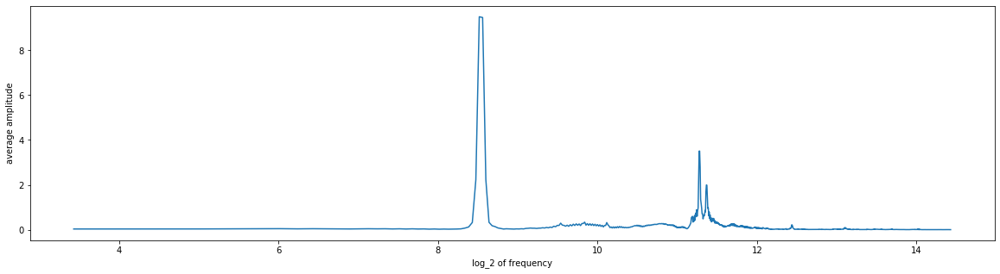

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                1861
instrument_name     Xylophone
note                       B6
expression         hardrubber
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
1861.aif
Analyzing sample...


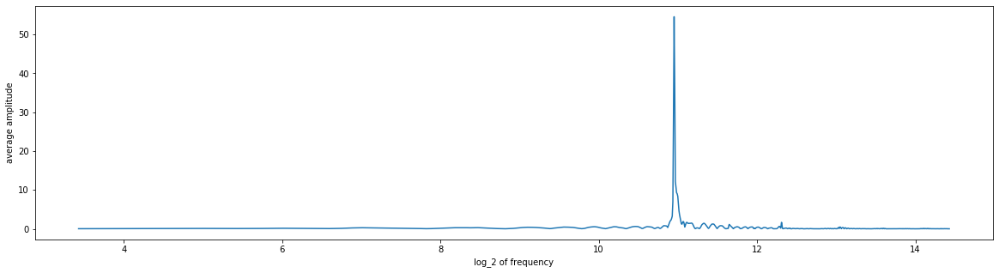

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                1862
instrument_name     Xylophone
note                      Eb7
expression         hardrubber
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
1862.aif
Analyzing sample...


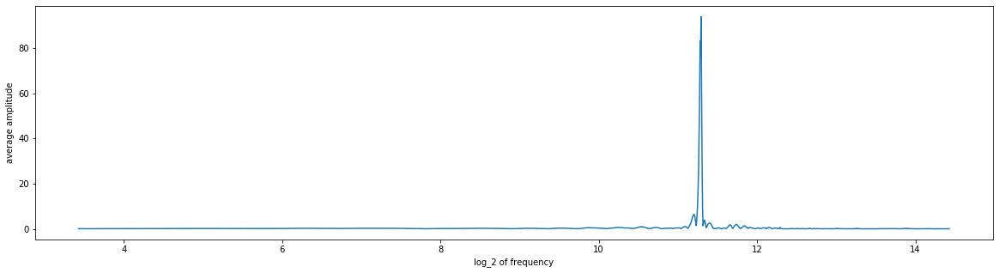

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                1863
instrument_name     Xylophone
note                      Bb7
expression         hardrubber
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
1863.aif
Analyzing sample...


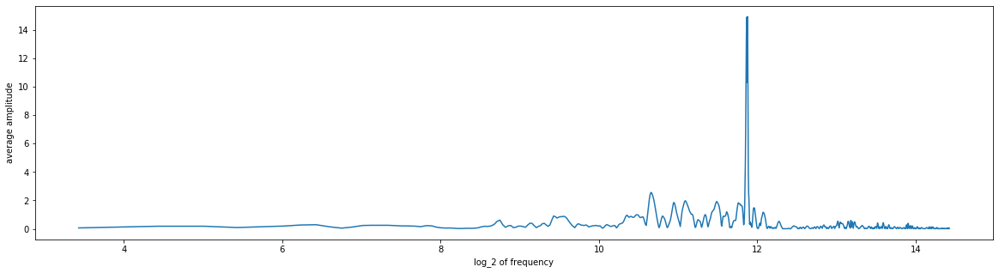

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                1864
instrument_name     Xylophone
note                       C7
expression         hardrubber
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
1864.aif
Analyzing sample...


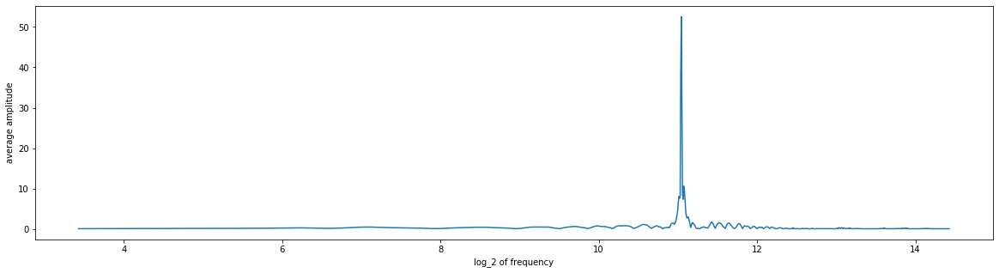

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                1865
instrument_name     Xylophone
note                       E5
expression         hardrubber
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
1865.aif
Analyzing sample...


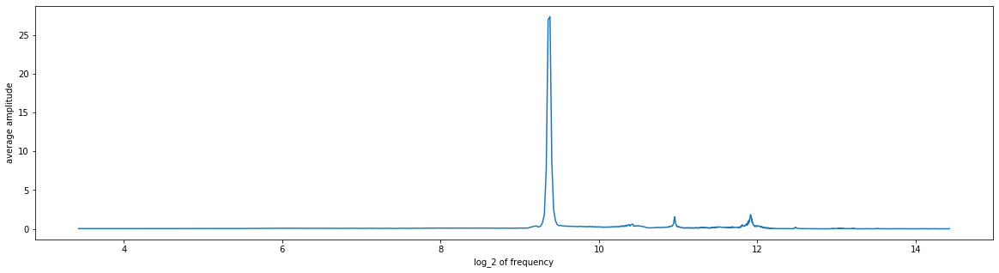

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                1866
instrument_name     Xylophone
note                      Db7
expression         hardrubber
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
1866.aif
Analyzing sample...


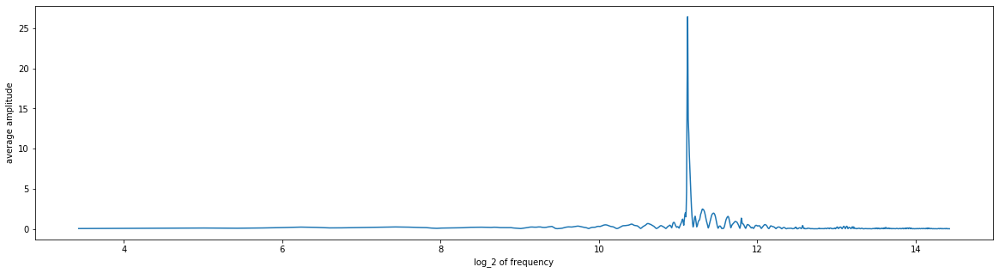

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                1867
instrument_name     Xylophone
note                      Ab4
expression         hardrubber
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
1867.aif
Analyzing sample...


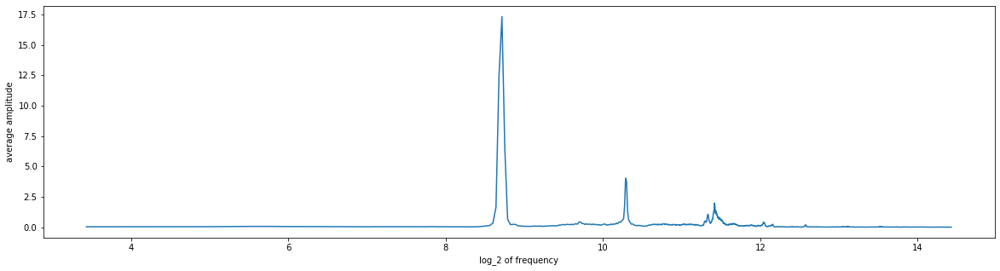

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                1868
instrument_name     Xylophone
note                       F7
expression         hardrubber
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
1868.aif
Analyzing sample...


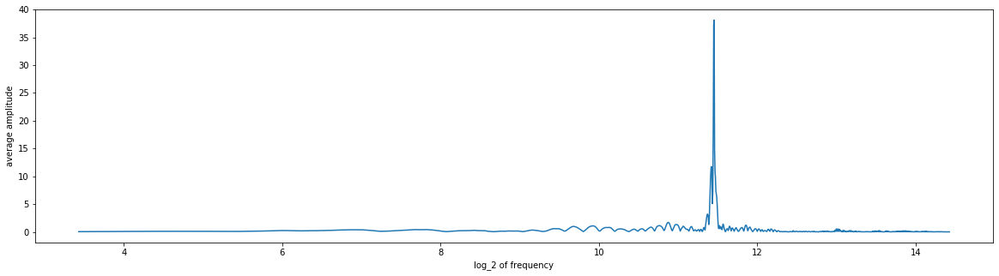

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                1869
instrument_name     Xylophone
note                       G6
expression         hardrubber
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
1869.aif
Analyzing sample...


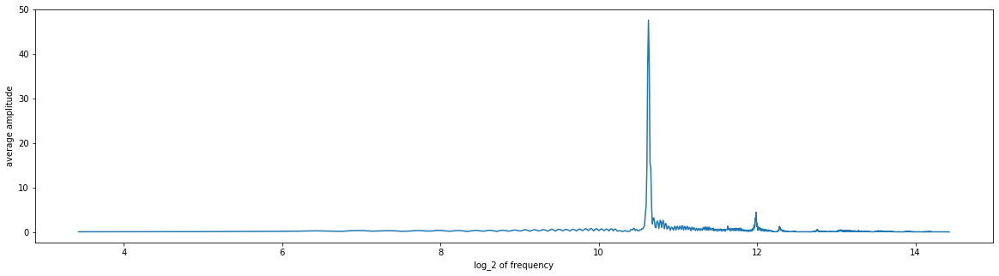

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                1870
instrument_name     Xylophone
note                       A4
expression         hardrubber
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
1870.aif
Analyzing sample...


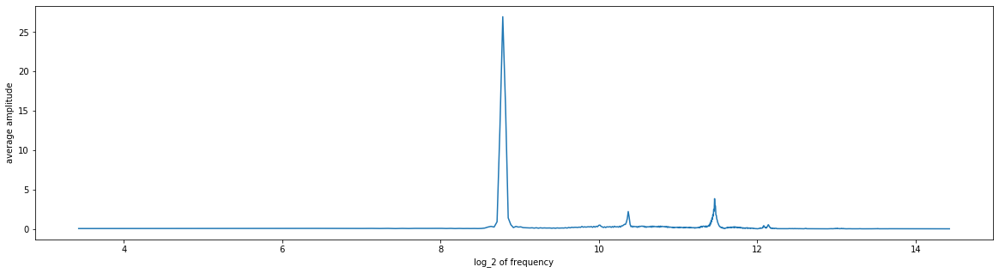

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                1871
instrument_name     Xylophone
note                      Ab7
expression         hardrubber
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
1871.aif
Analyzing sample...


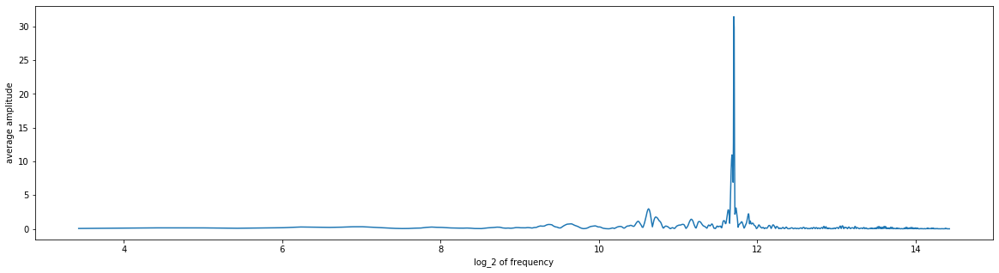

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                1872
instrument_name     Xylophone
note                       F4
expression         hardrubber
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
1872.aif
Analyzing sample...


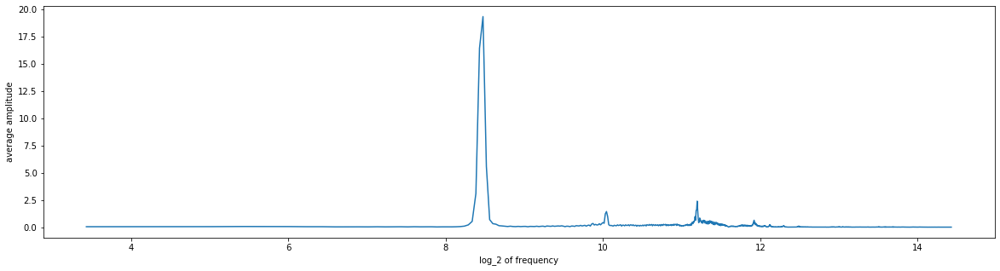

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                1873
instrument_name     Xylophone
note                       G5
expression         hardrubber
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
1873.aif
Analyzing sample...


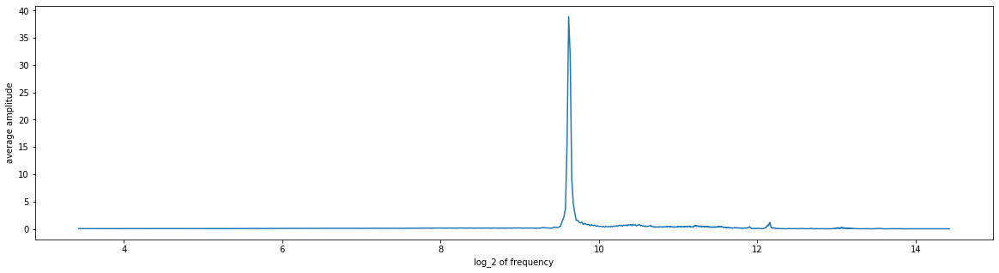

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                1874
instrument_name     Xylophone
note                       A7
expression         hardrubber
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
1874.aif
Analyzing sample...


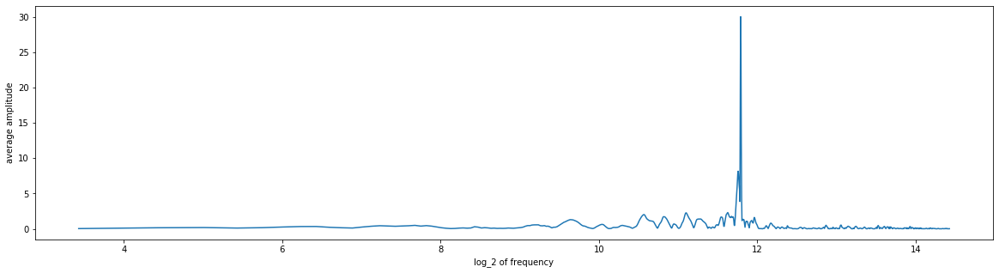

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                1875
instrument_name     Xylophone
note                      Bb4
expression         hardrubber
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
1875.aif
Analyzing sample...


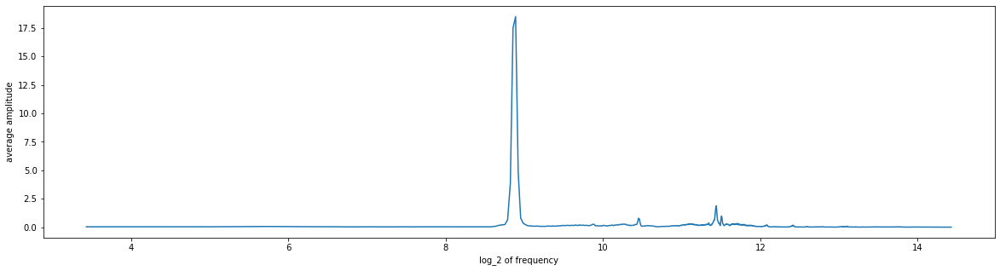

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                1876
instrument_name     Xylophone
note                       D7
expression         hardrubber
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
1876.aif
Analyzing sample...


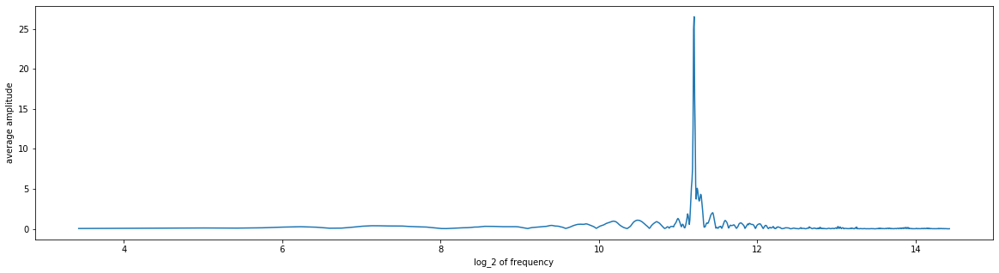

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                1877
instrument_name     Xylophone
note                      Gb7
expression         hardrubber
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
1877.aif
Analyzing sample...


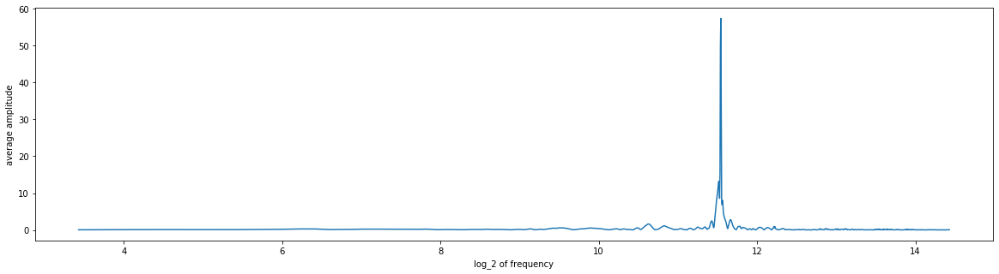

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                1878
instrument_name     Xylophone
note                       B5
expression         hardrubber
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
1878.aif
Analyzing sample...


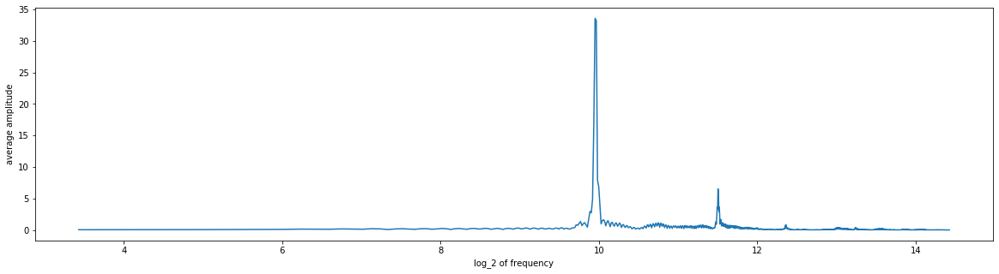

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                1879
instrument_name     Xylophone
note                       E6
expression         hardrubber
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
1879.aif
Analyzing sample...


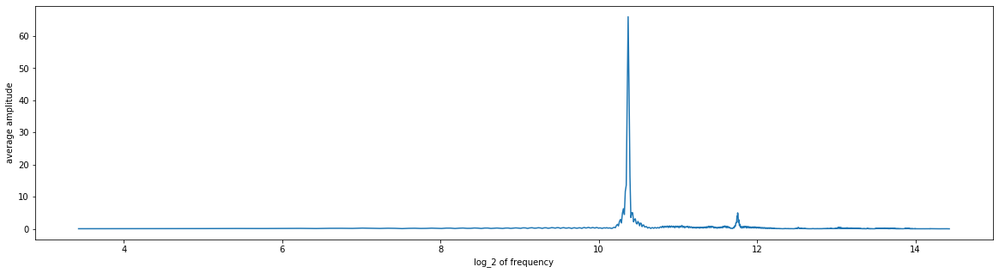

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                1880
instrument_name     Xylophone
note                      Db6
expression         hardrubber
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
1880.aif
Analyzing sample...


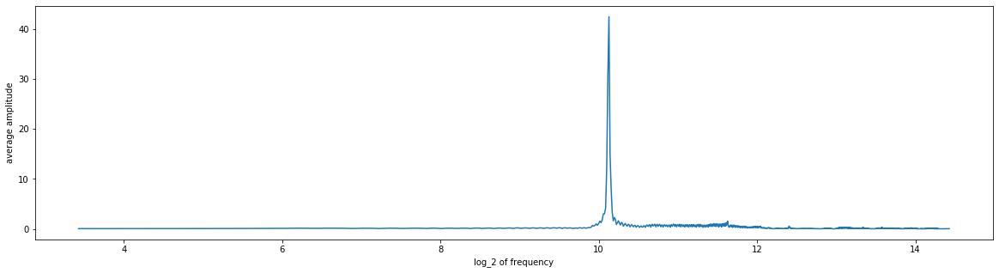

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                1881
instrument_name     Xylophone
note                       F6
expression         hardrubber
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
1881.aif
Analyzing sample...


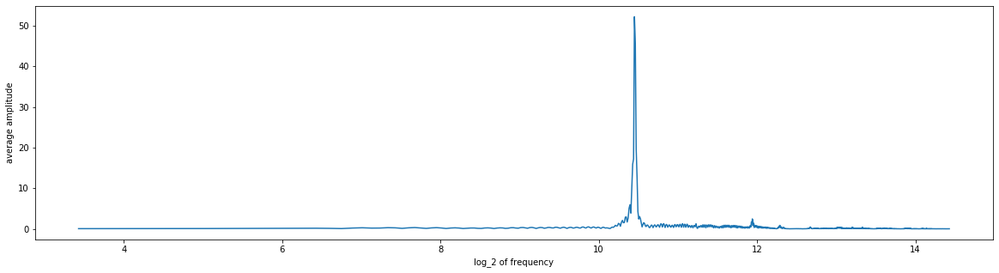

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                1882
instrument_name     Xylophone
note                      Ab5
expression         hardrubber
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
1882.aif
Analyzing sample...


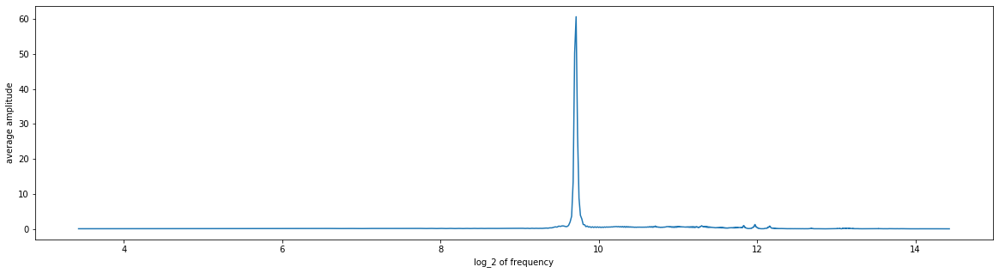

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                1883
instrument_name     Xylophone
note                       G7
expression         hardrubber
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
1883.aif
Analyzing sample...


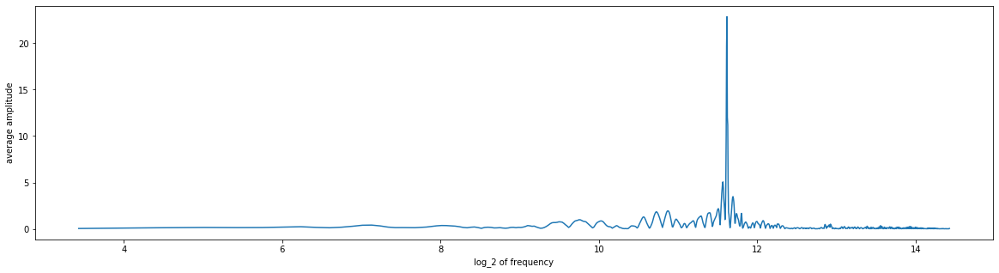

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                1884
instrument_name     Xylophone
note                       A5
expression         hardrubber
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
1884.aif
Analyzing sample...


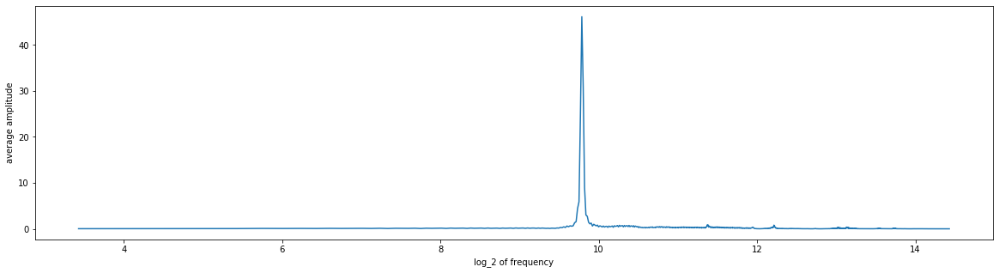

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                1885
instrument_name     Xylophone
note                       D5
expression         hardrubber
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
1885.aif
Analyzing sample...


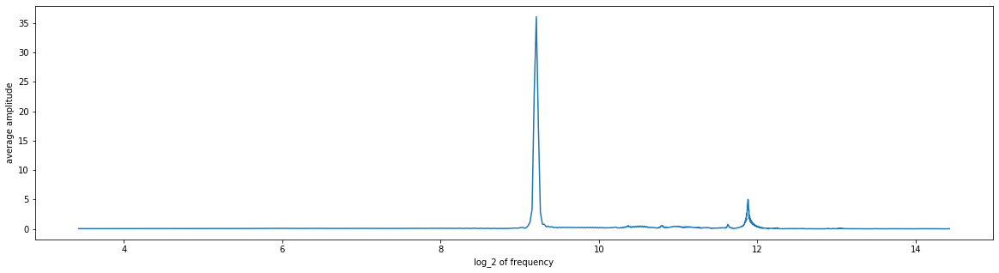

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                1886
instrument_name     Xylophone
note                      Gb5
expression         hardrubber
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
1886.aif
Analyzing sample...


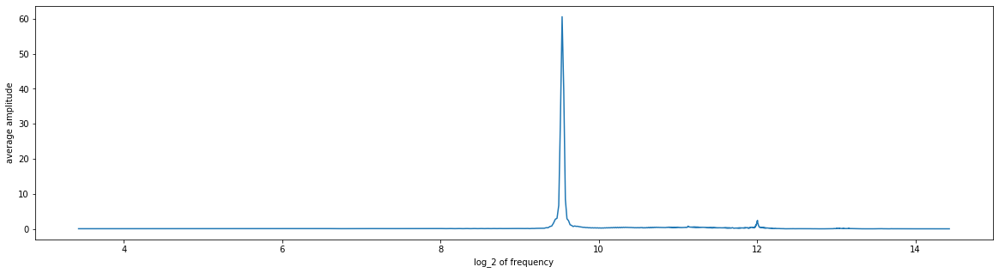

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                1887
instrument_name     Xylophone
note                       B7
expression         hardrubber
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
1887.aif
Analyzing sample...


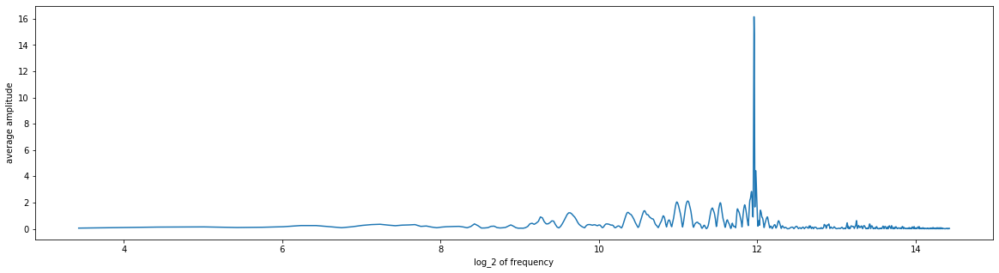

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                1888
instrument_name     Xylophone
note                      Eb6
expression         hardrubber
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
1888.aif
Analyzing sample...


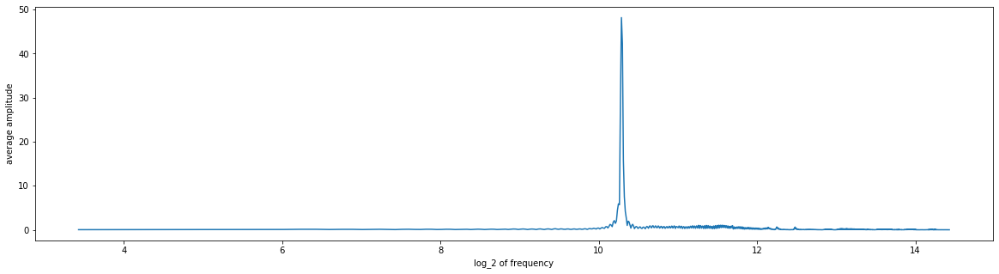

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                1889
instrument_name     Xylophone
note                      Bb6
expression         hardrubber
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
1889.aif
Analyzing sample...


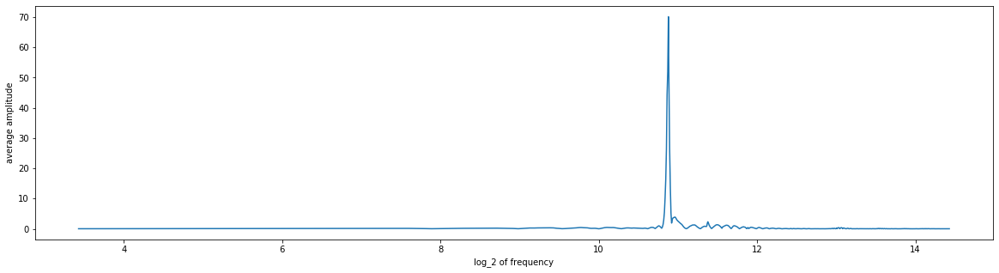

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                1890
instrument_name     Xylophone
note                       C6
expression         hardrubber
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
1890.aif
Analyzing sample...


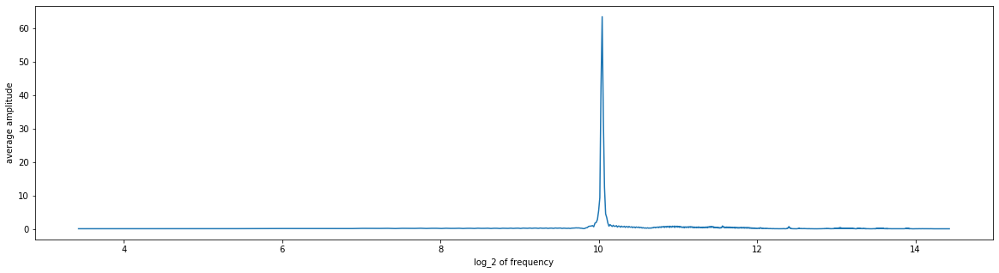

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                1891
instrument_name     Xylophone
note                       E7
expression         hardrubber
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
1891.aif
Analyzing sample...


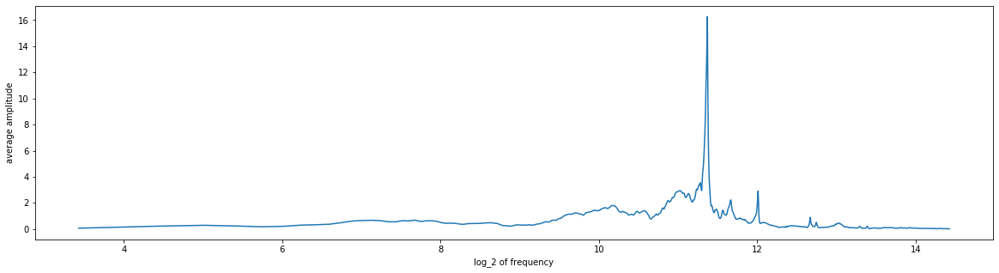

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                1892
instrument_name     Xylophone
note                       C5
expression         hardrubber
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
1892.aif
Analyzing sample...


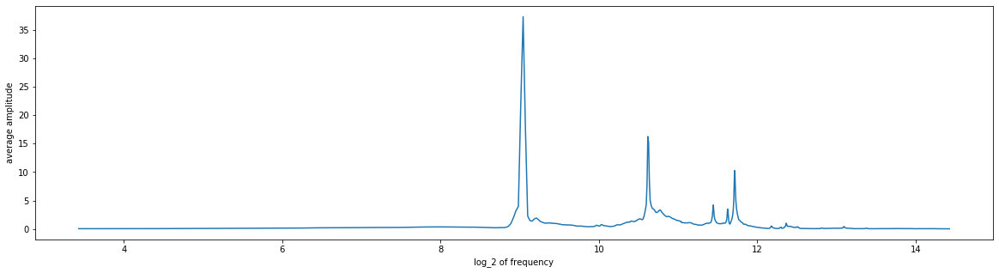

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                1893
instrument_name     Xylophone
note                       B4
expression         hardrubber
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
1893.aif
Analyzing sample...


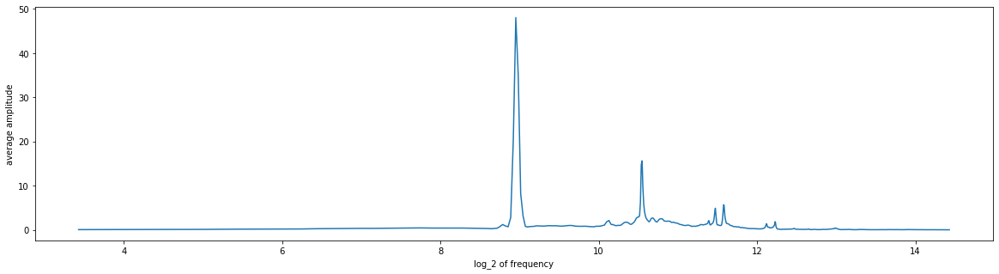

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                1894
instrument_name     Xylophone
note                      Eb5
expression         hardrubber
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
1894.aif
Analyzing sample...


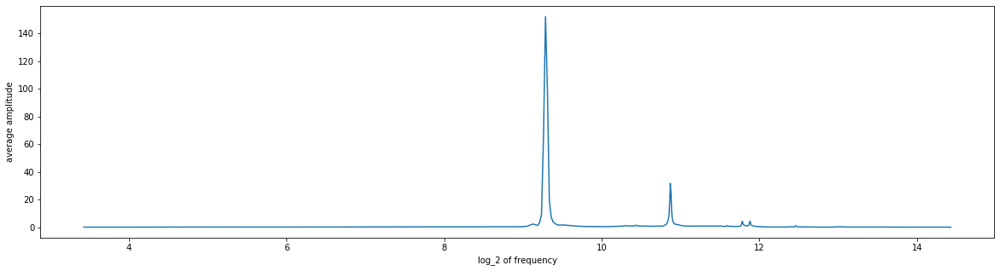

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                1895
instrument_name     Xylophone
note                       D6
expression         hardrubber
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
1895.aif
Analyzing sample...


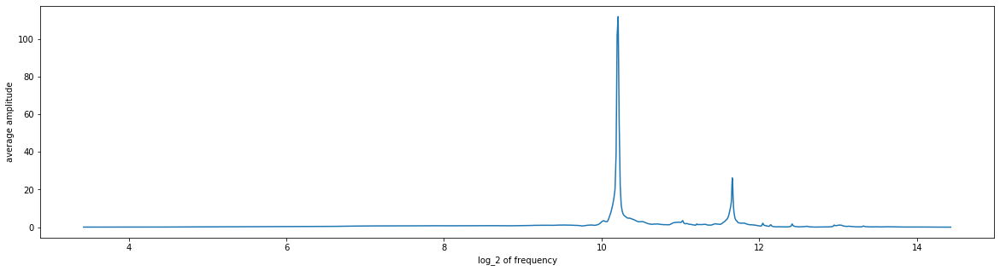

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                1896
instrument_name     Xylophone
note                      Bb5
expression         hardrubber
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
1896.aif
Analyzing sample...


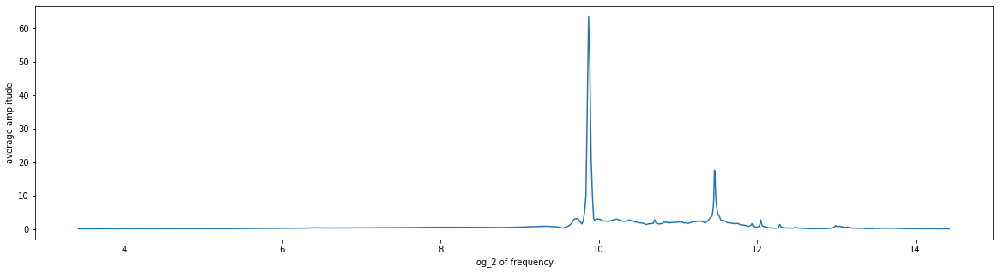

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                1897
instrument_name     Xylophone
note                       C8
expression         hardrubber
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
1897.aif
Analyzing sample...


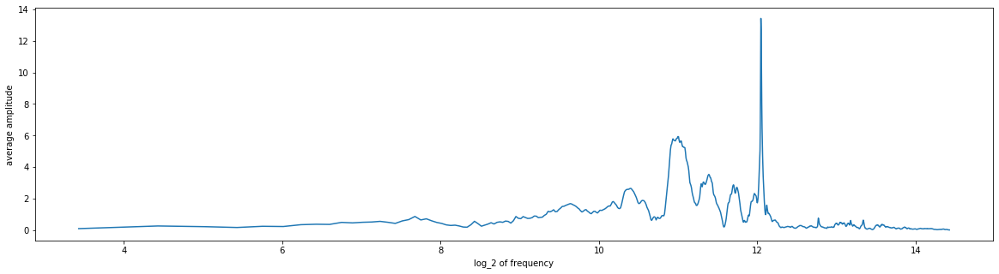

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                1898
instrument_name     Xylophone
note                      Gb6
expression         hardrubber
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
1898.aif
Analyzing sample...


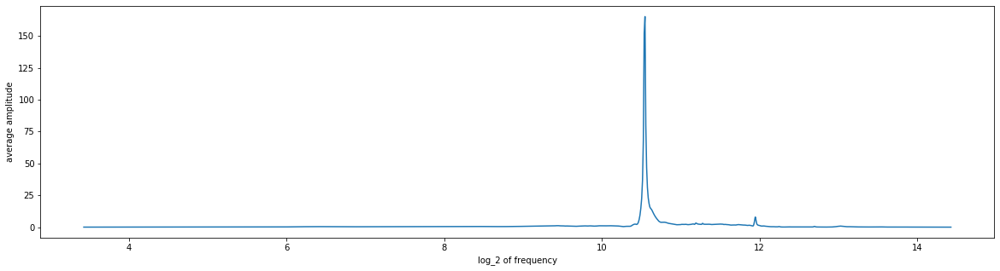

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                1899
instrument_name     Xylophone
note                       A6
expression         hardrubber
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
1899.aif
Analyzing sample...


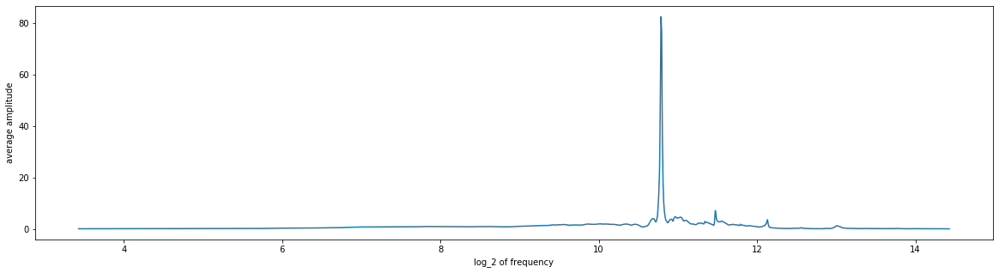

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                1900
instrument_name     Xylophone
note                       G4
expression         hardrubber
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
1900.aif
Analyzing sample...


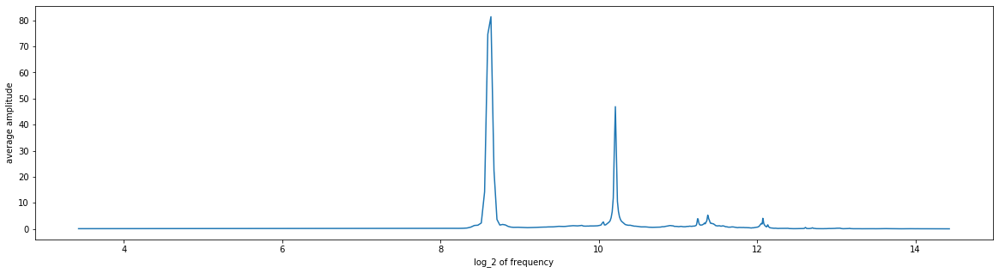

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                1901
instrument_name     Xylophone
note                      Ab6
expression         hardrubber
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
1901.aif
Analyzing sample...


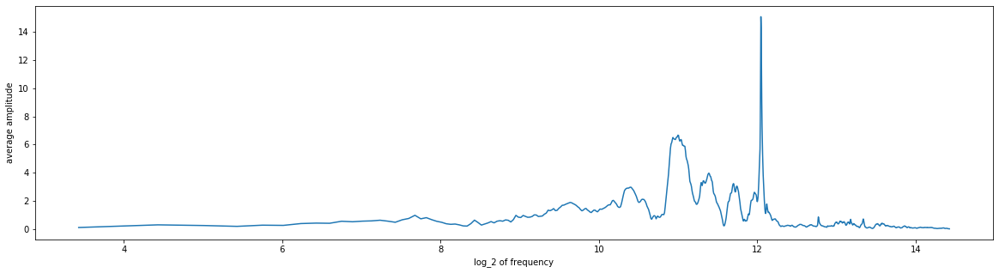

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                1902
instrument_name     Xylophone
note                       F5
expression         hardrubber
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
1902.aif
Analyzing sample...


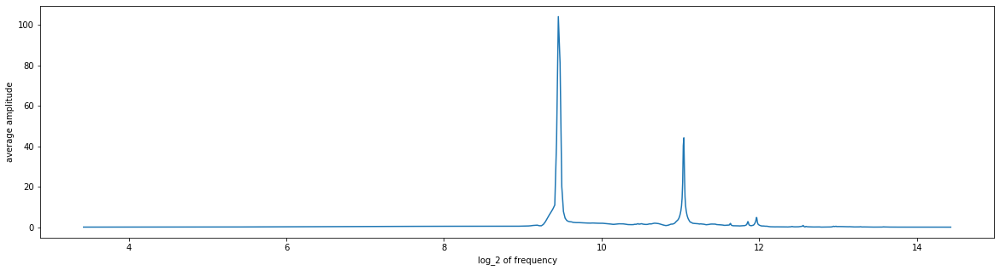

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                1903
instrument_name     Xylophone
note                      Db5
expression         hardrubber
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
1903.aif
Analyzing sample...


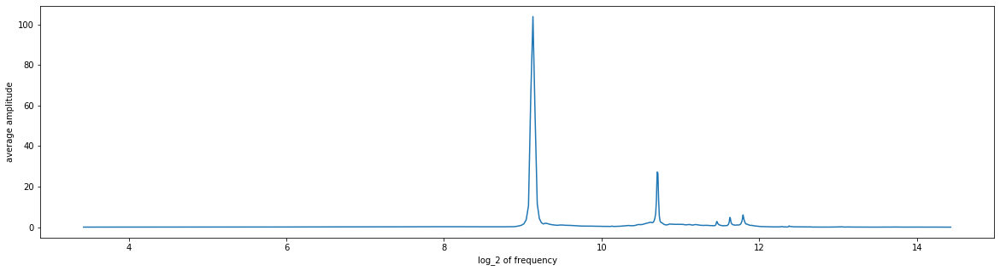

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                1904
instrument_name     Xylophone
note                       E5
expression         hardrubber
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
1904.aif
Analyzing sample...


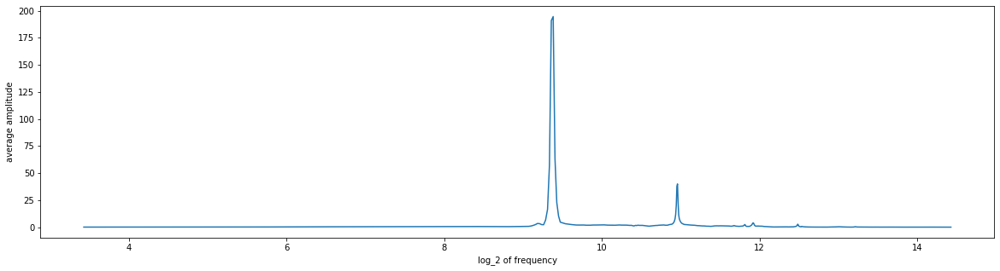

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                1905
instrument_name     Xylophone
note                       C7
expression         hardrubber
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
1905.aif
Analyzing sample...


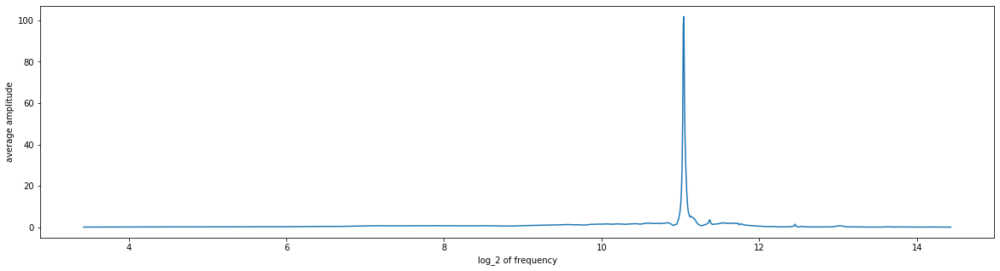

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                1906
instrument_name     Xylophone
note                      Gb4
expression         hardrubber
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
1906.aif
Analyzing sample...


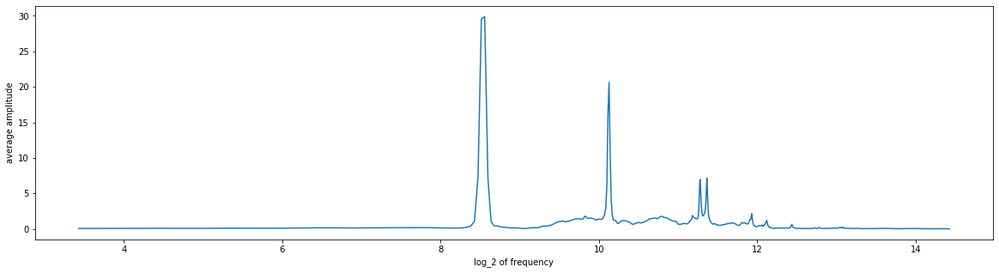

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                1907
instrument_name     Xylophone
note                       B6
expression         hardrubber
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
1907.aif
Analyzing sample...


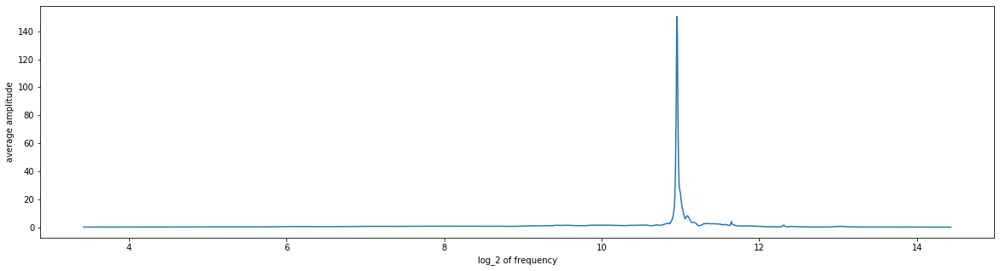

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                1908
instrument_name     Xylophone
note                      Eb7
expression         hardrubber
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
1908.aif
Analyzing sample...


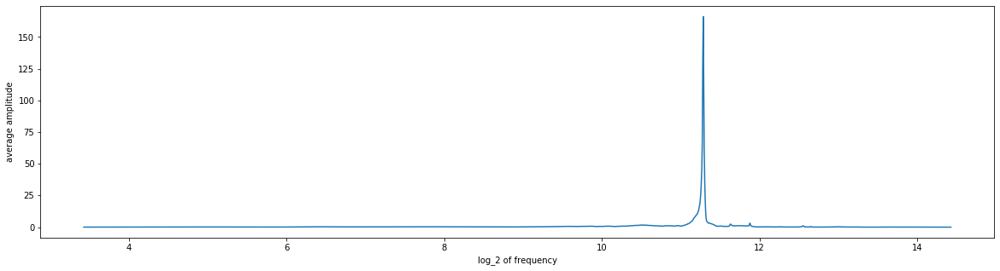

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                1909
instrument_name     Xylophone
note                      Bb7
expression         hardrubber
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
1909.aif
Analyzing sample...


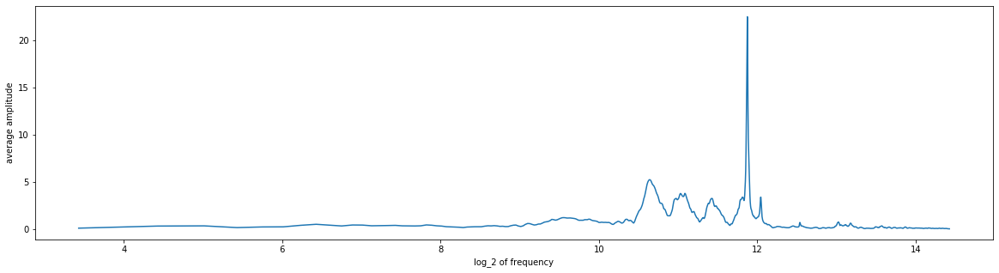

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                1910
instrument_name     Xylophone
note                       A4
expression         hardrubber
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
1910.aif
Analyzing sample...


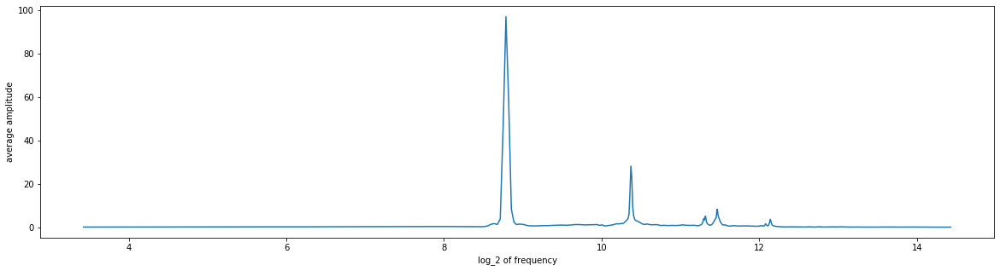

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                1911
instrument_name     Xylophone
note                       G6
expression         hardrubber
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
1911.aif
Analyzing sample...


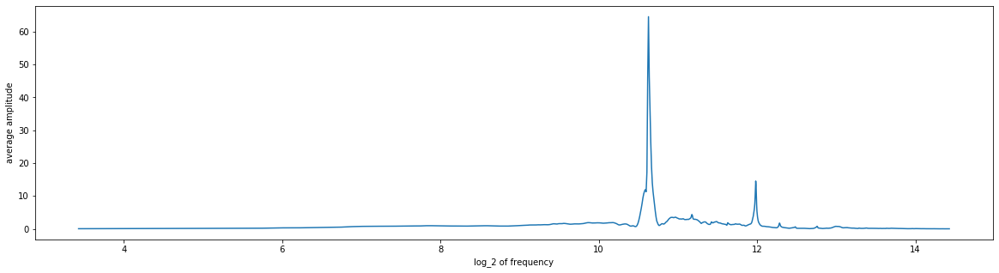

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                1912
instrument_name     Xylophone
note                       F7
expression         hardrubber
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
1912.aif
Analyzing sample...


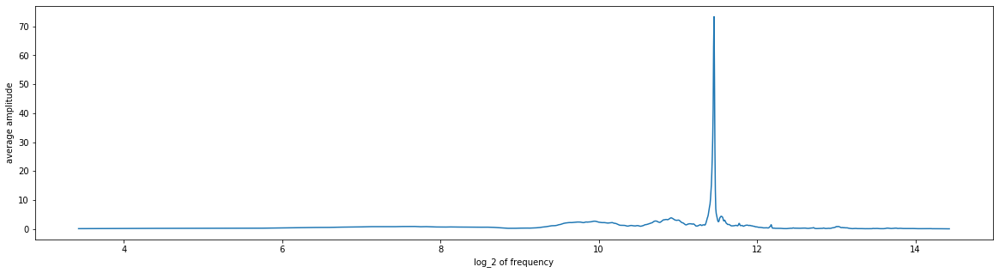

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                1913
instrument_name     Xylophone
note                      Db7
expression         hardrubber
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
1913.aif
Analyzing sample...


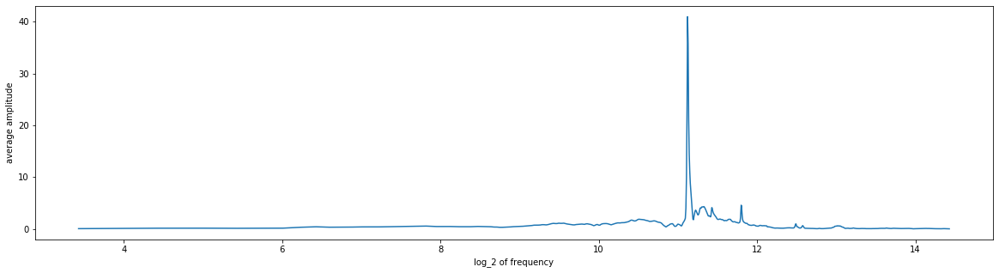

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                1914
instrument_name     Xylophone
note                      Ab4
expression         hardrubber
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
1914.aif
Analyzing sample...


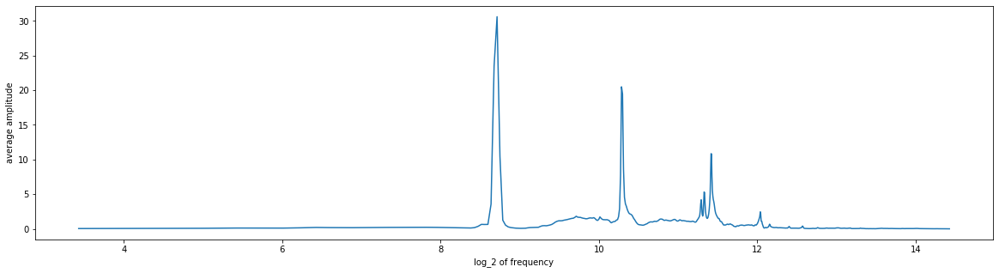

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                1915
instrument_name     Xylophone
note                       A7
expression         hardrubber
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
1915.aif
Analyzing sample...


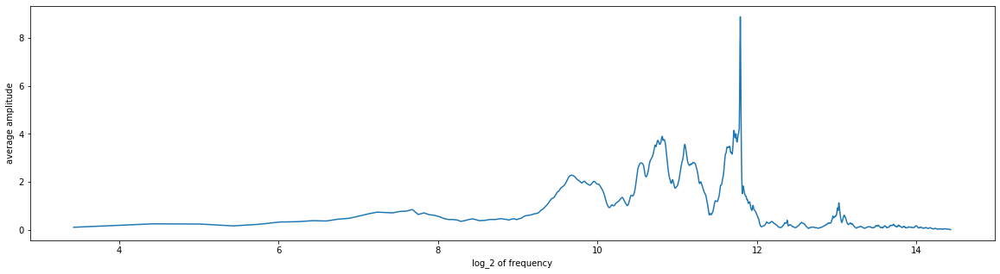

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                1916
instrument_name     Xylophone
note                       G5
expression         hardrubber
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
1916.aif
Analyzing sample...


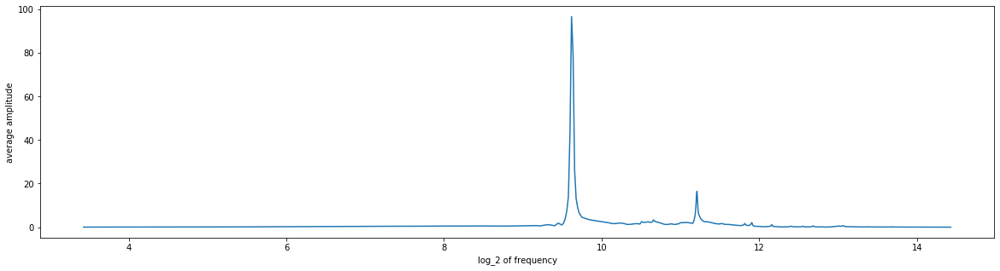

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                1917
instrument_name     Xylophone
note                      Ab7
expression         hardrubber
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
1917.aif
Analyzing sample...


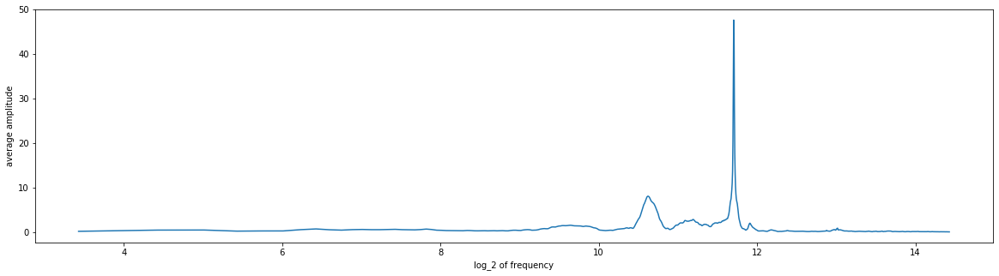

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                1918
instrument_name     Xylophone
note                       F4
expression         hardrubber
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
1918.aif
Analyzing sample...


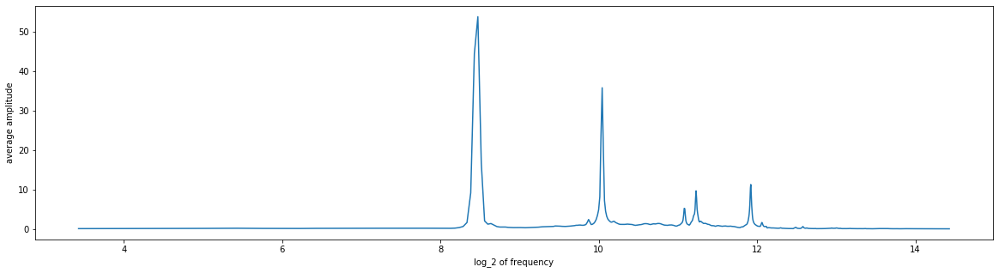

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                1919
instrument_name     Xylophone
note                       E6
expression         hardrubber
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
1919.aif
Analyzing sample...


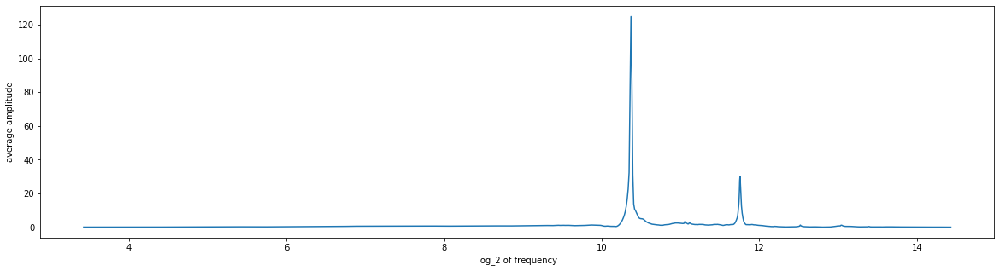

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                1920
instrument_name     Xylophone
note                       B5
expression         hardrubber
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
1920.aif
Analyzing sample...


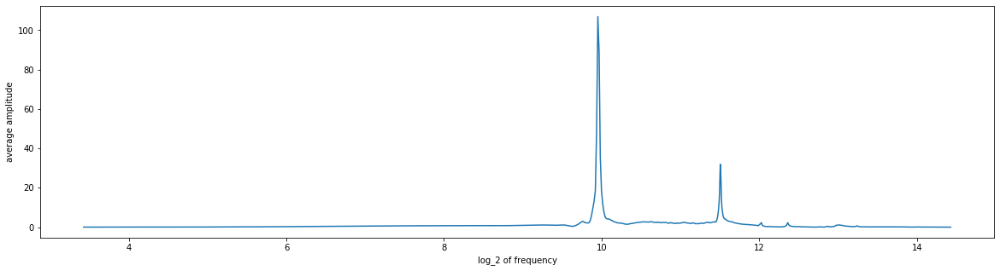

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                1921
instrument_name     Xylophone
note                       D7
expression         hardrubber
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
1921.aif
Analyzing sample...


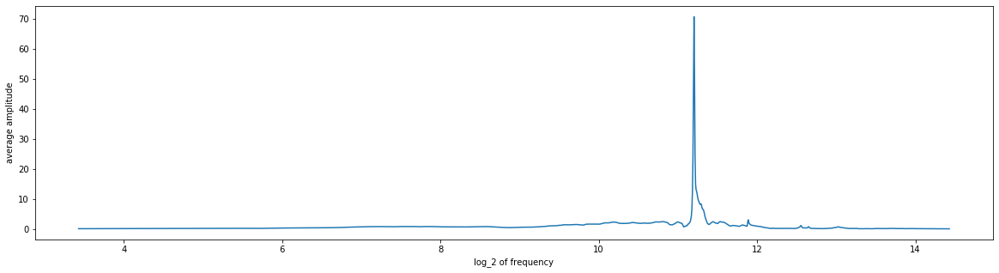

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                1922
instrument_name     Xylophone
note                      Bb4
expression         hardrubber
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
1922.aif
Analyzing sample...


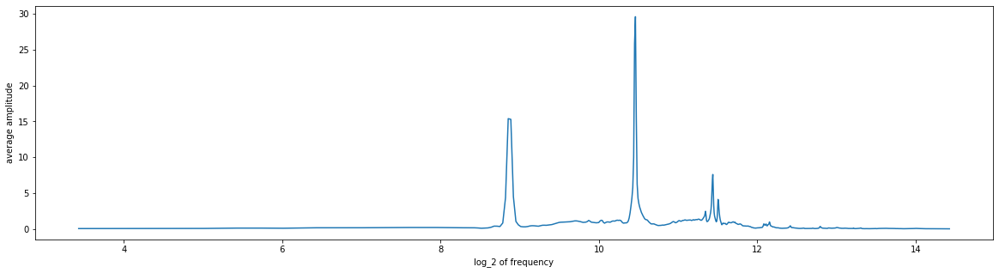

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                1923
instrument_name     Xylophone
note                      Gb7
expression         hardrubber
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
1923.aif
Analyzing sample...


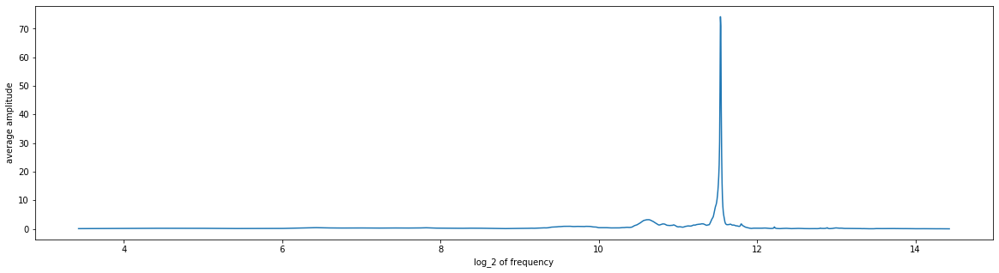

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                1924
instrument_name     Xylophone
note                       A5
expression         hardrubber
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
1924.aif
Analyzing sample...


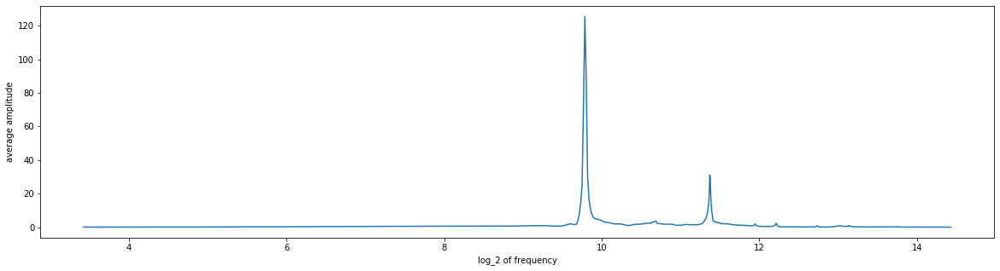

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                1925
instrument_name     Xylophone
note                       G7
expression         hardrubber
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
1925.aif
Analyzing sample...


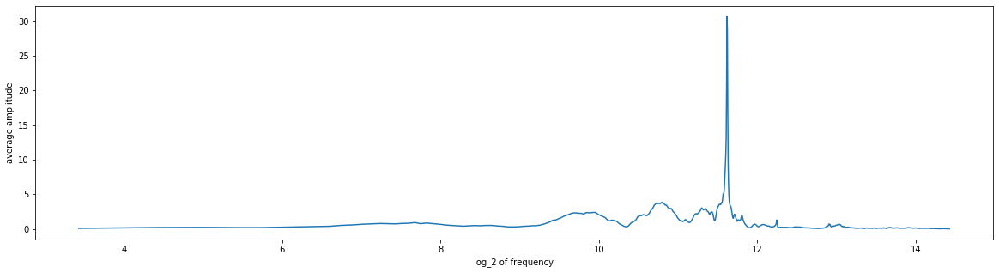

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                1926
instrument_name     Xylophone
note                       F6
expression         hardrubber
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
1926.aif
Analyzing sample...


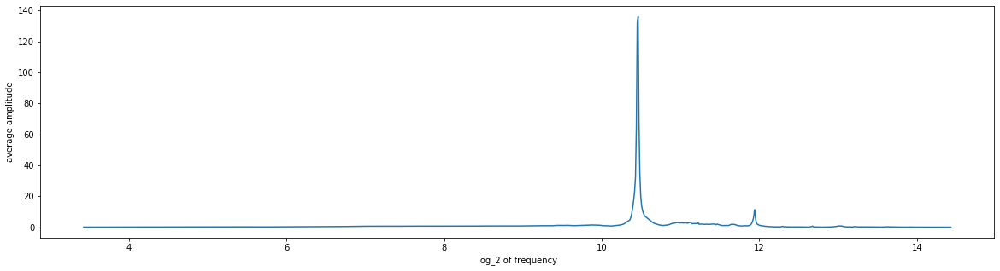

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                1927
instrument_name     Xylophone
note                      Db6
expression         hardrubber
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
1927.aif
Analyzing sample...


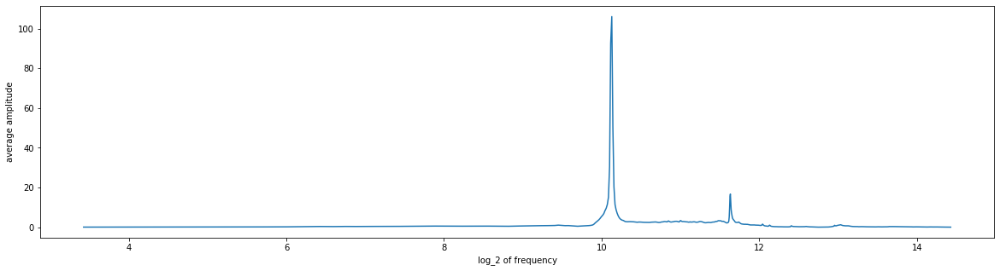

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                1928
instrument_name     Xylophone
note                      Ab5
expression         hardrubber
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
1928.aif
Analyzing sample...


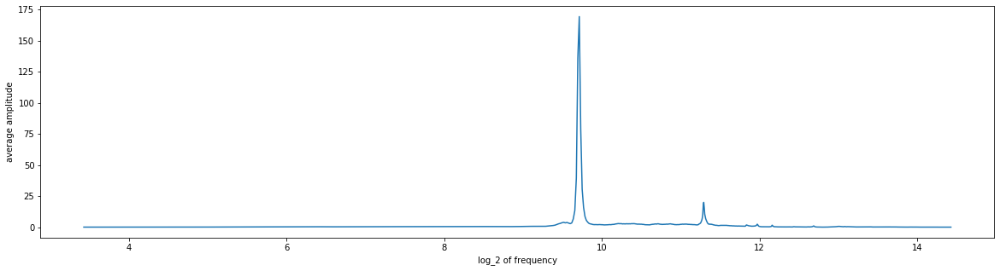

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                1929
instrument_name     Xylophone
note                       C6
expression         hardrubber
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
1929.aif
Analyzing sample...


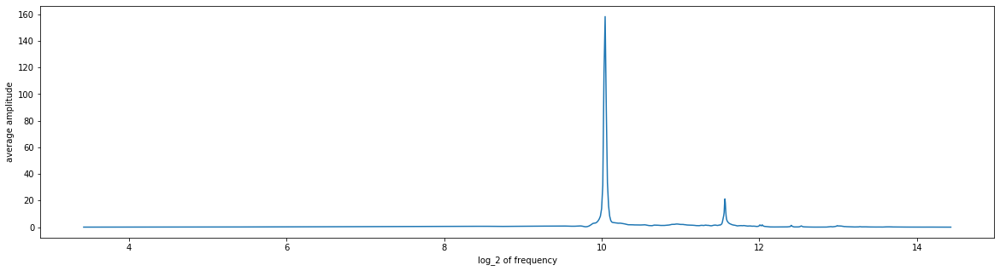

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                1930
instrument_name     Xylophone
note                      Gb5
expression         hardrubber
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
1930.aif
Analyzing sample...


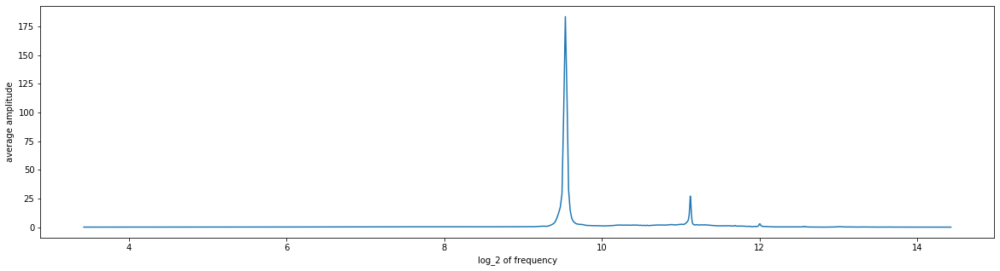

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                1931
instrument_name     Xylophone
note                       B7
expression         hardrubber
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
1931.aif
Analyzing sample...


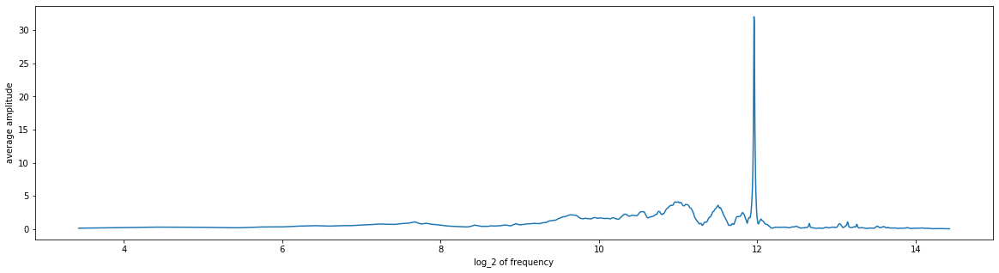

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                1932
instrument_name     Xylophone
note                      Eb6
expression         hardrubber
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
1932.aif
Analyzing sample...


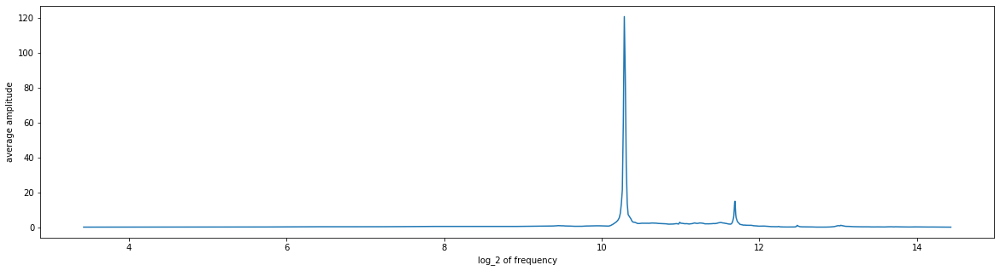

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                1933
instrument_name     Xylophone
note                       D5
expression         hardrubber
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
1933.aif
Analyzing sample...


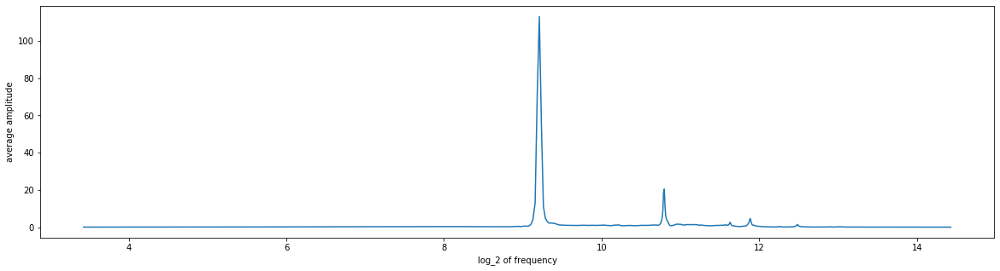

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                1934
instrument_name     Xylophone
note                      Bb6
expression         hardrubber
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
1934.aif
Analyzing sample...


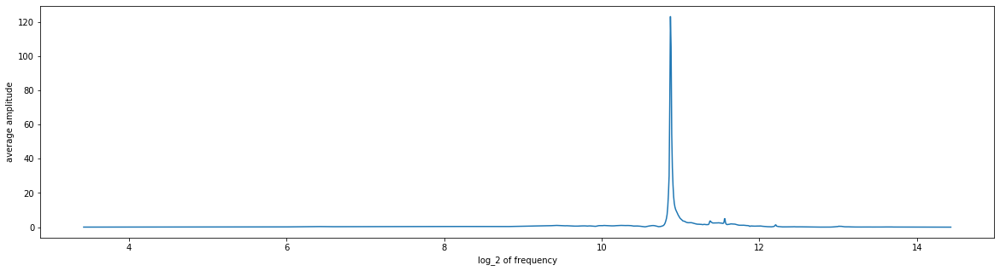

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id               1935
instrument_name    Xylophone
note                      G7
expression          rosewood
source              Iowa2012
file_extension           aif
Name: 0, dtype: object
1935.aif
Analyzing sample...


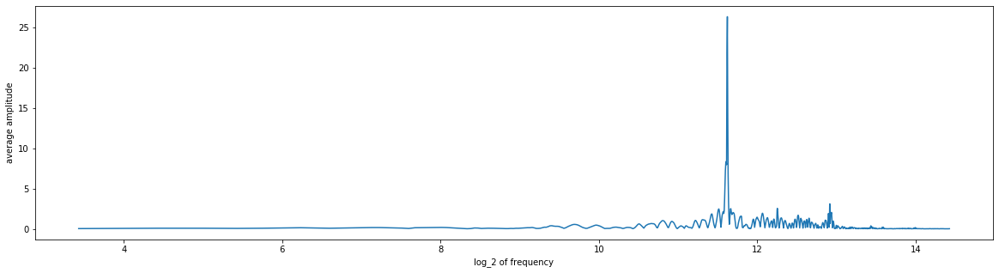

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id               1936
instrument_name    Xylophone
note                      A5
expression          rosewood
source              Iowa2012
file_extension           aif
Name: 0, dtype: object
1936.aif
Analyzing sample...


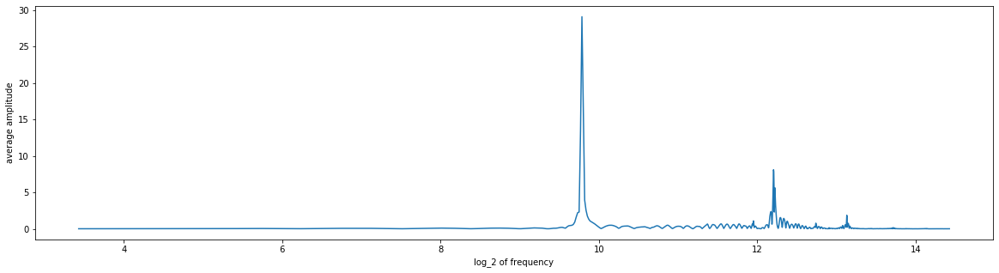

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id               1937
instrument_name    Xylophone
note                     Ab4
expression          rosewood
source              Iowa2012
file_extension           aif
Name: 0, dtype: object
1937.aif
Analyzing sample...


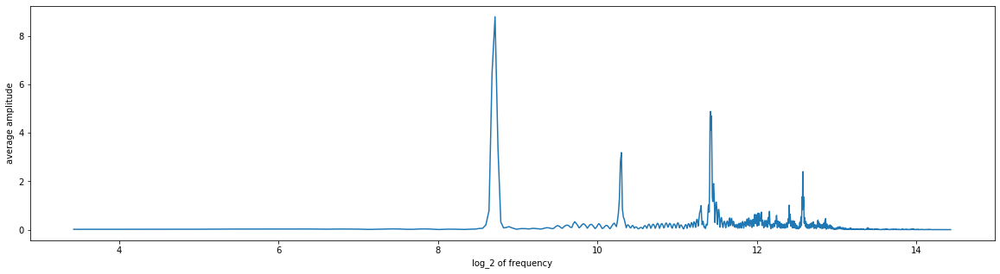

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id               1938
instrument_name    Xylophone
note                      F6
expression          rosewood
source              Iowa2012
file_extension           aif
Name: 0, dtype: object
1938.aif
Analyzing sample...


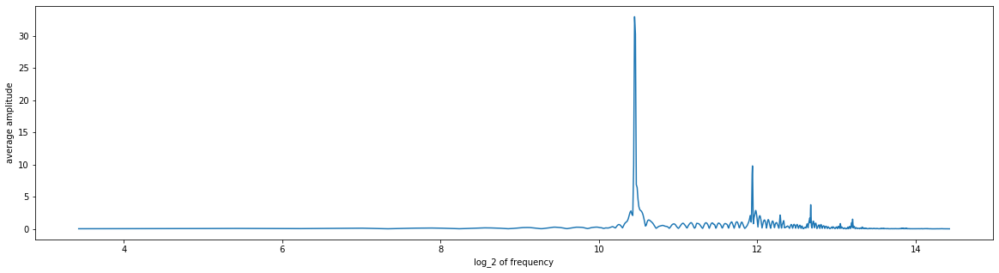

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id               1939
instrument_name    Xylophone
note                     Db7
expression          rosewood
source              Iowa2012
file_extension           aif
Name: 0, dtype: object
1939.aif
Analyzing sample...


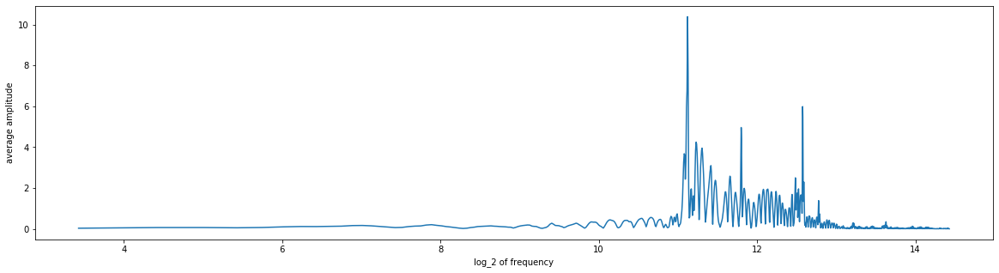

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id               1940
instrument_name    Xylophone
note                      C6
expression          rosewood
source              Iowa2012
file_extension           aif
Name: 0, dtype: object
1940.aif
Analyzing sample...


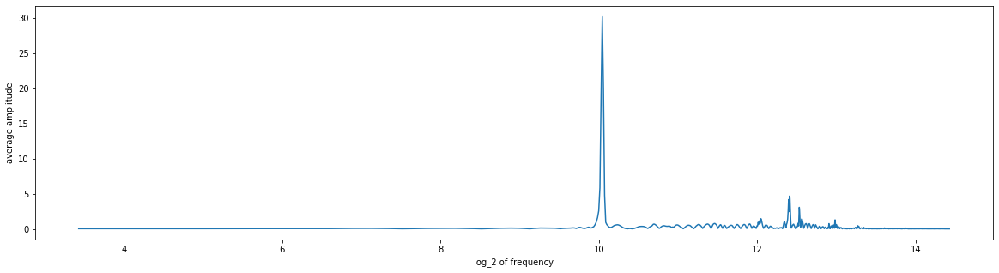

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id               1941
instrument_name    Xylophone
note                      D5
expression          rosewood
source              Iowa2012
file_extension           aif
Name: 0, dtype: object
1941.aif
Analyzing sample...


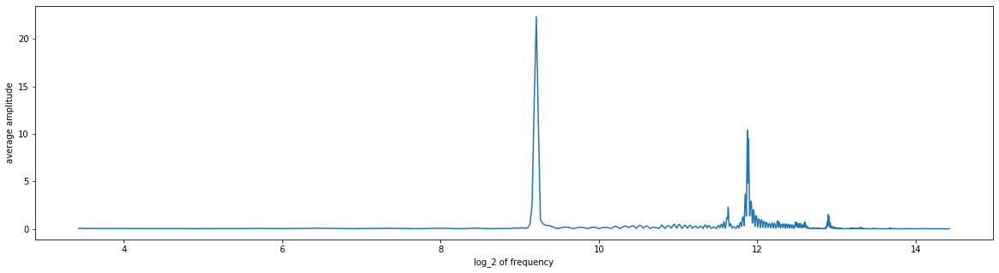

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id               1942
instrument_name    Xylophone
note                      B7
expression          rosewood
source              Iowa2012
file_extension           aif
Name: 0, dtype: object
1942.aif
Analyzing sample...


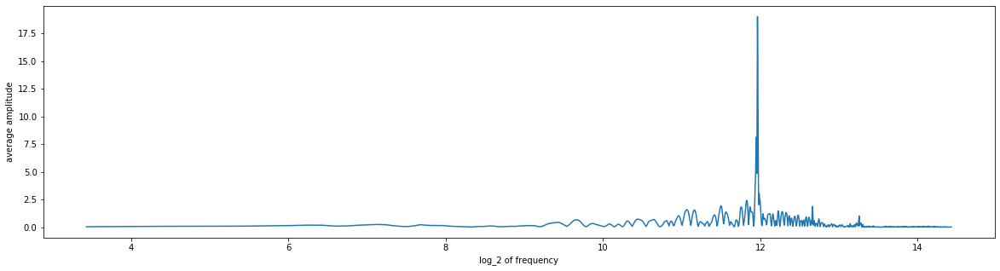

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id               1943
instrument_name    Xylophone
note                     Bb7
expression          rosewood
source              Iowa2012
file_extension           aif
Name: 0, dtype: object
1943.aif
Analyzing sample...


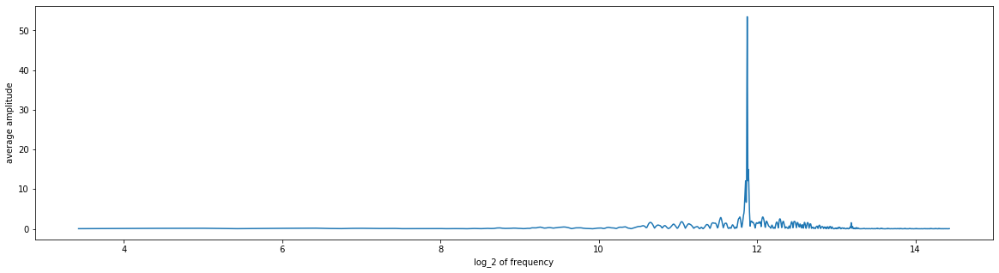

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id               1944
instrument_name    Xylophone
note                     Eb7
expression          rosewood
source              Iowa2012
file_extension           aif
Name: 0, dtype: object
1944.aif
Analyzing sample...


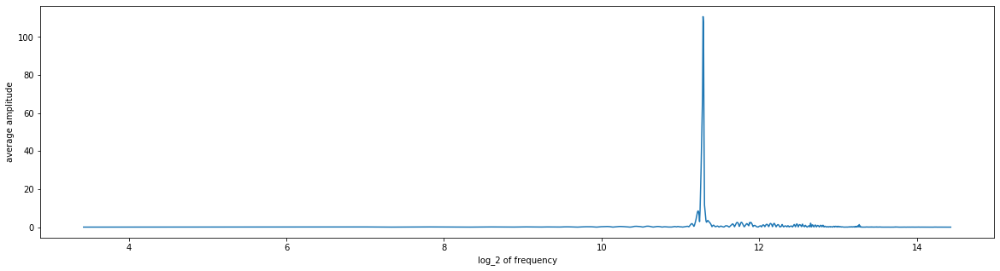

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id               1945
instrument_name    Xylophone
note                     Gb4
expression          rosewood
source              Iowa2012
file_extension           aif
Name: 0, dtype: object
1945.aif
Analyzing sample...


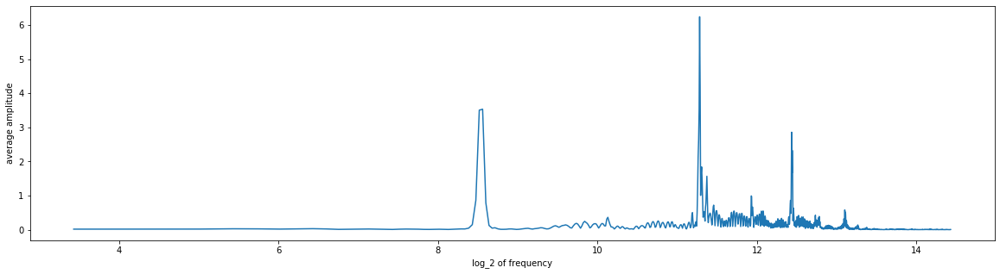

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id               1946
instrument_name    Xylophone
note                      G5
expression          rosewood
source              Iowa2012
file_extension           aif
Name: 0, dtype: object
1946.aif
Analyzing sample...


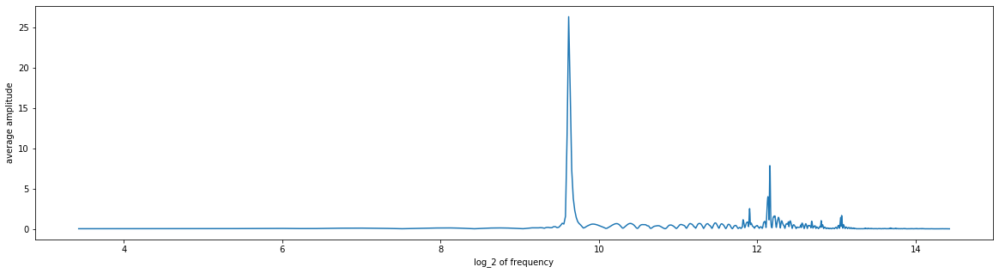

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id               1947
instrument_name    Xylophone
note                      A7
expression          rosewood
source              Iowa2012
file_extension           aif
Name: 0, dtype: object
1947.aif
Analyzing sample...


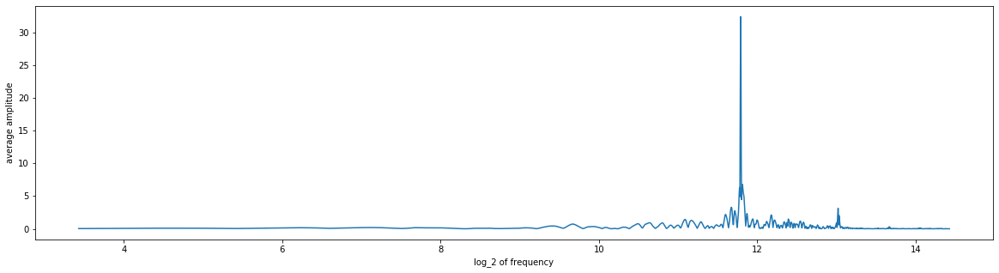

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id               1948
instrument_name    Xylophone
note                      F4
expression          rosewood
source              Iowa2012
file_extension           aif
Name: 0, dtype: object
1948.aif
Analyzing sample...


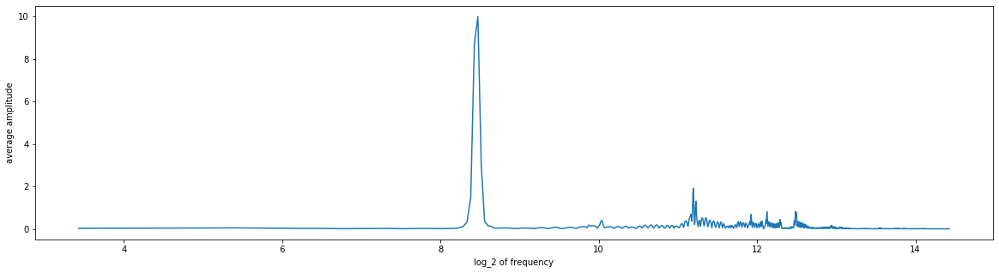

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id               1949
instrument_name    Xylophone
note                     Db5
expression          rosewood
source              Iowa2012
file_extension           aif
Name: 0, dtype: object
1949.aif
Analyzing sample...


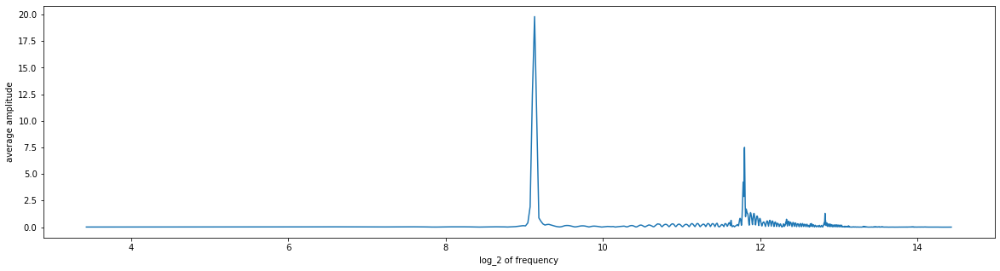

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id               1950
instrument_name    Xylophone
note                     Ab6
expression          rosewood
source              Iowa2012
file_extension           aif
Name: 0, dtype: object
1950.aif
Analyzing sample...


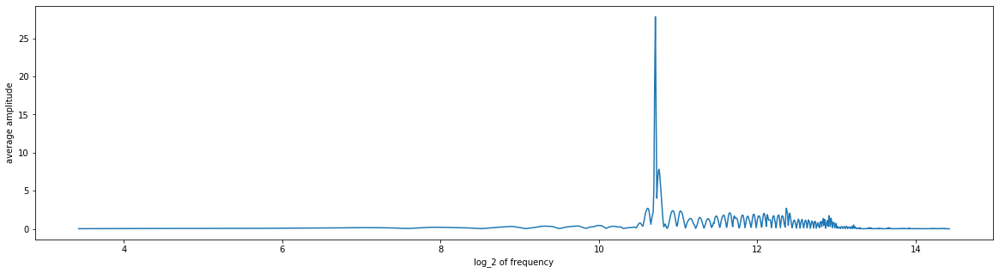

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id               1951
instrument_name    Xylophone
note                      E6
expression          rosewood
source              Iowa2012
file_extension           aif
Name: 0, dtype: object
1951.aif
Analyzing sample...


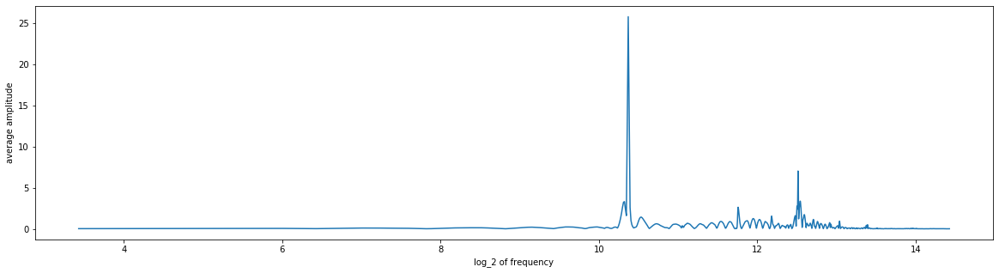

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id               1952
instrument_name    Xylophone
note                     Gb6
expression          rosewood
source              Iowa2012
file_extension           aif
Name: 0, dtype: object
1952.aif
Analyzing sample...


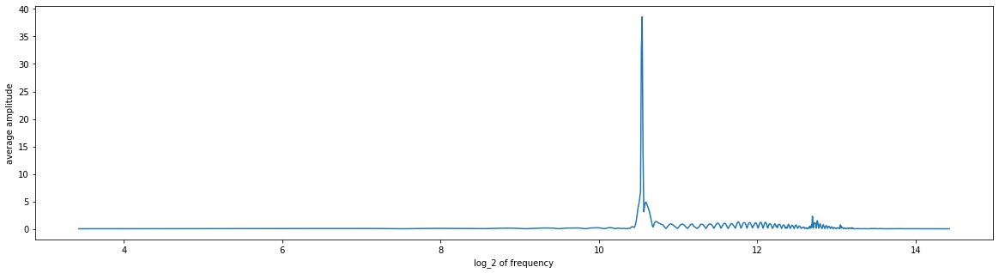

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id               1953
instrument_name    Xylophone
note                      D7
expression          rosewood
source              Iowa2012
file_extension           aif
Name: 0, dtype: object
1953.aif
Analyzing sample...


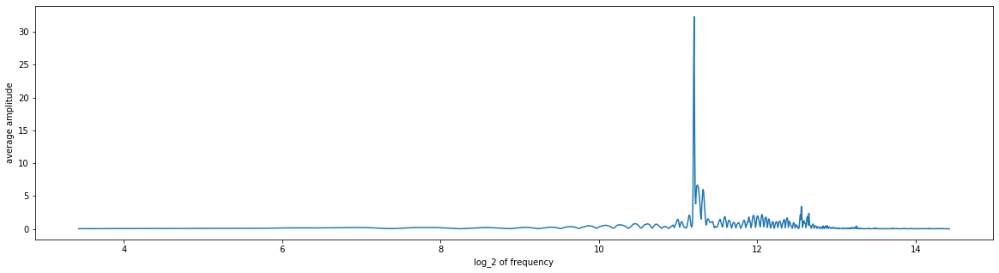

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id               1954
instrument_name    Xylophone
note                      B5
expression          rosewood
source              Iowa2012
file_extension           aif
Name: 0, dtype: object
1954.aif
Analyzing sample...


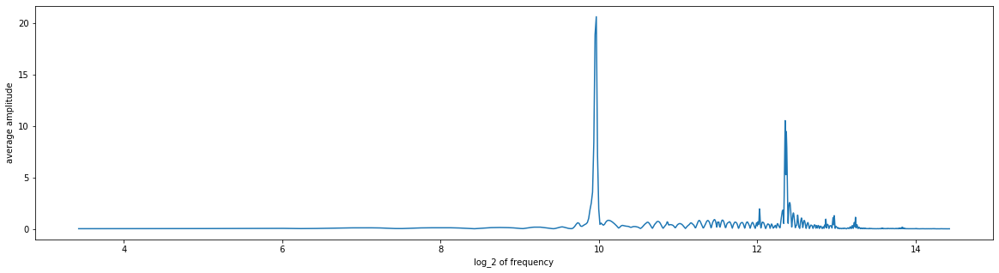

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id               1955
instrument_name    Xylophone
note                     Bb5
expression          rosewood
source              Iowa2012
file_extension           aif
Name: 0, dtype: object
1955.aif
Analyzing sample...


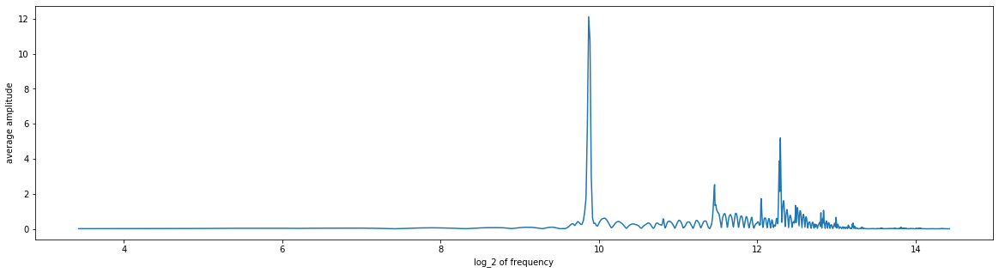

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id               1956
instrument_name    Xylophone
note                     Eb5
expression          rosewood
source              Iowa2012
file_extension           aif
Name: 0, dtype: object
1956.aif
Analyzing sample...


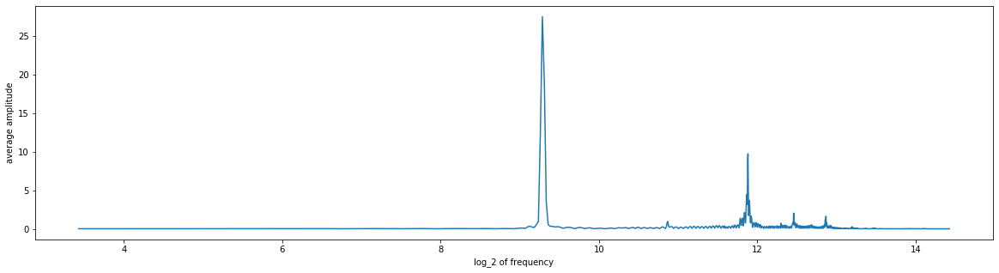

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id               1957
instrument_name    Xylophone
note                      C7
expression          rosewood
source              Iowa2012
file_extension           aif
Name: 0, dtype: object
1957.aif
Analyzing sample...


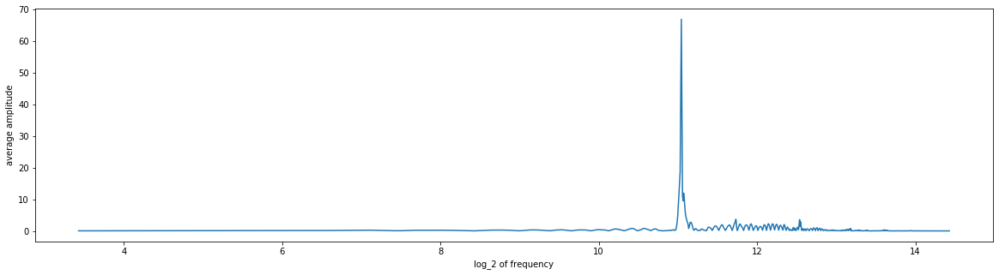

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id               1958
instrument_name    Xylophone
note                      E5
expression          rosewood
source              Iowa2012
file_extension           aif
Name: 0, dtype: object
1958.aif
Analyzing sample...


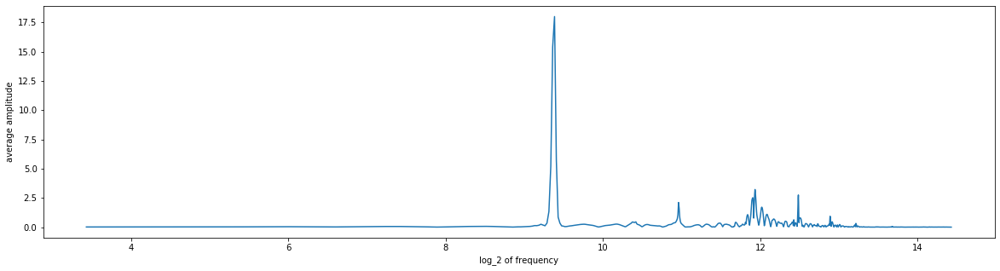

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id               1959
instrument_name    Xylophone
note                     Bb6
expression          rosewood
source              Iowa2012
file_extension           aif
Name: 0, dtype: object
1959.aif
Analyzing sample...


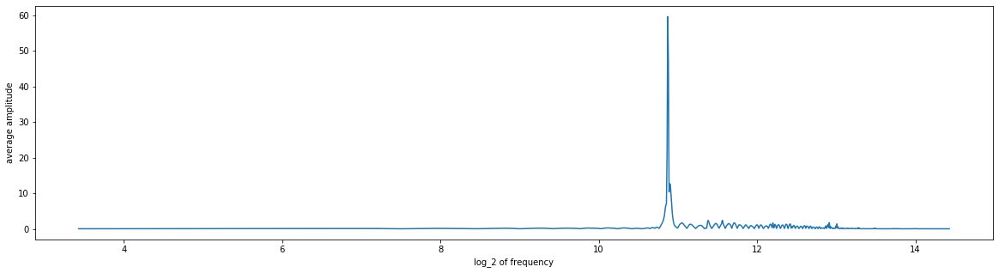

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id               1960
instrument_name    Xylophone
note                     Eb6
expression          rosewood
source              Iowa2012
file_extension           aif
Name: 0, dtype: object
1960.aif
Analyzing sample...


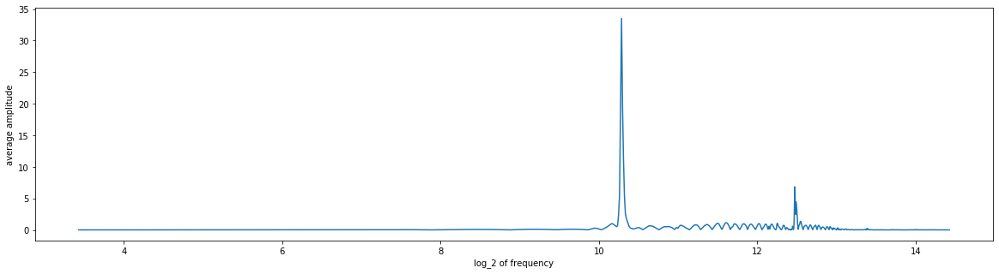

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id               1961
instrument_name    Xylophone
note                      B6
expression          rosewood
source              Iowa2012
file_extension           aif
Name: 0, dtype: object
1961.aif
Analyzing sample...


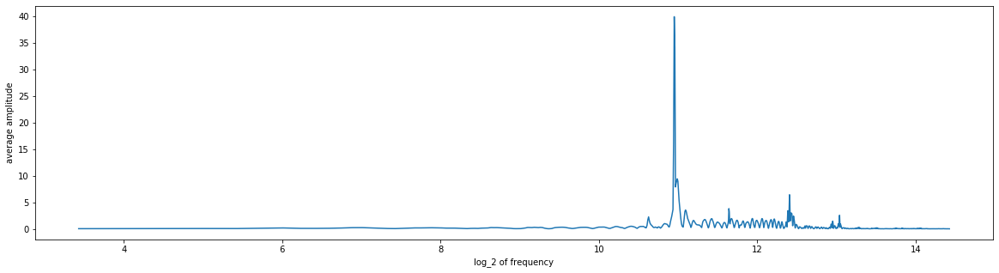

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id               1962
instrument_name    Xylophone
note                     Gb5
expression          rosewood
source              Iowa2012
file_extension           aif
Name: 0, dtype: object
1962.aif
Analyzing sample...


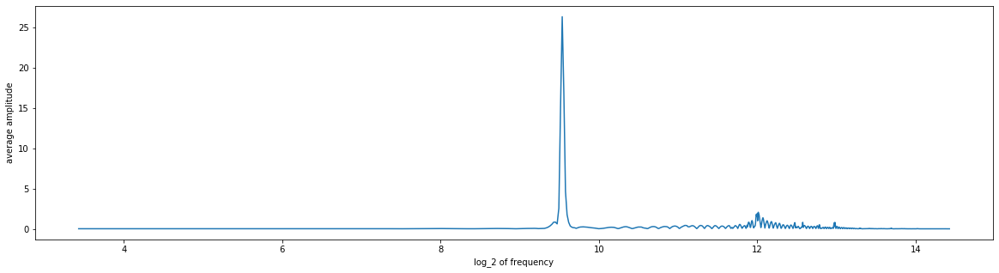

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id               1963
instrument_name    Xylophone
note                      G6
expression          rosewood
source              Iowa2012
file_extension           aif
Name: 0, dtype: object
1963.aif
Analyzing sample...


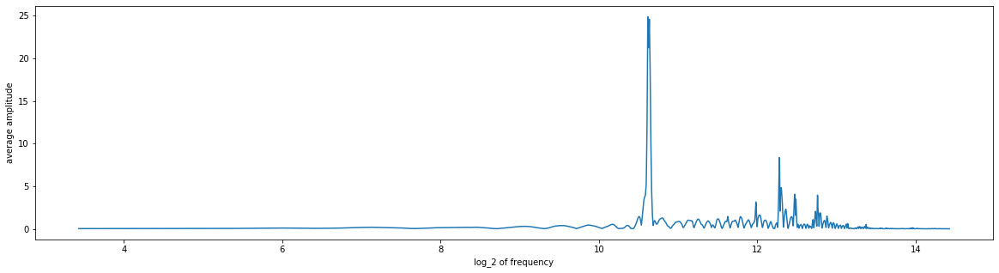

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id               1964
instrument_name    Xylophone
note                      A4
expression          rosewood
source              Iowa2012
file_extension           aif
Name: 0, dtype: object
1964.aif
Analyzing sample...


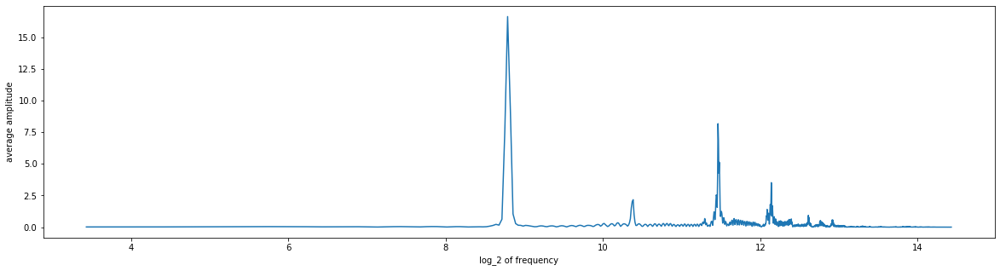

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id               1965
instrument_name    Xylophone
note                     Ab5
expression          rosewood
source              Iowa2012
file_extension           aif
Name: 0, dtype: object
1965.aif
Analyzing sample...


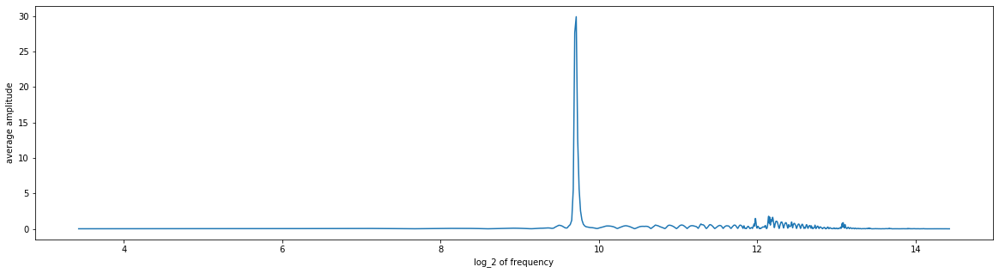

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id               1966
instrument_name    Xylophone
note                     Db6
expression          rosewood
source              Iowa2012
file_extension           aif
Name: 0, dtype: object
1966.aif
Analyzing sample...


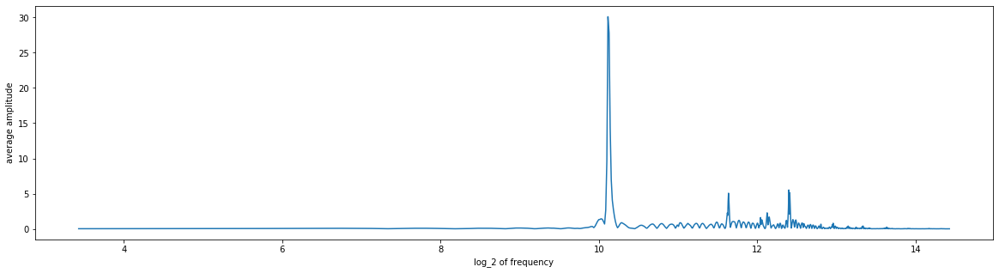

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id               1967
instrument_name    Xylophone
note                      F7
expression          rosewood
source              Iowa2012
file_extension           aif
Name: 0, dtype: object
1967.aif
Analyzing sample...


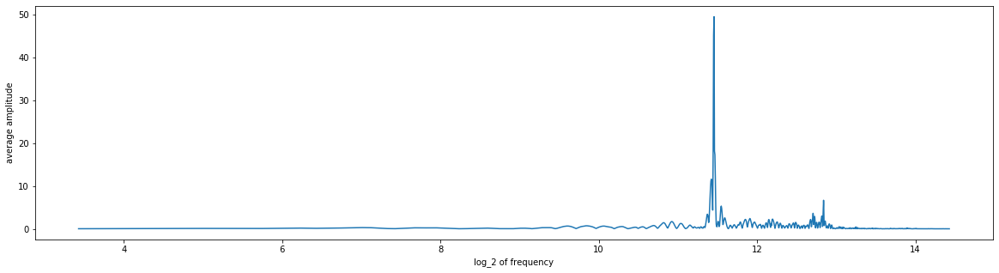

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id               1968
instrument_name    Xylophone
note                      C5
expression          rosewood
source              Iowa2012
file_extension           aif
Name: 0, dtype: object
1968.aif
Analyzing sample...


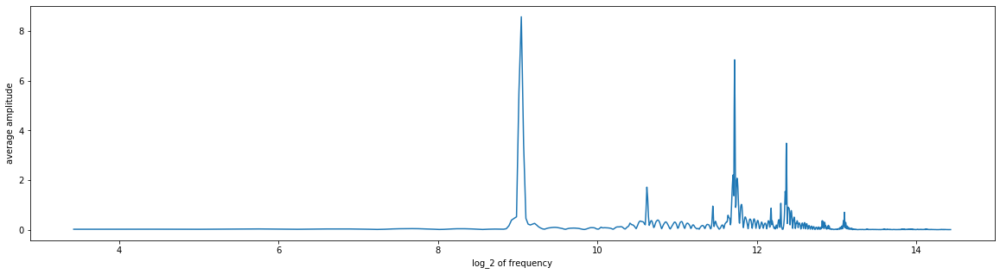

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id               1969
instrument_name    Xylophone
note                      E7
expression          rosewood
source              Iowa2012
file_extension           aif
Name: 0, dtype: object
1969.aif
Analyzing sample...


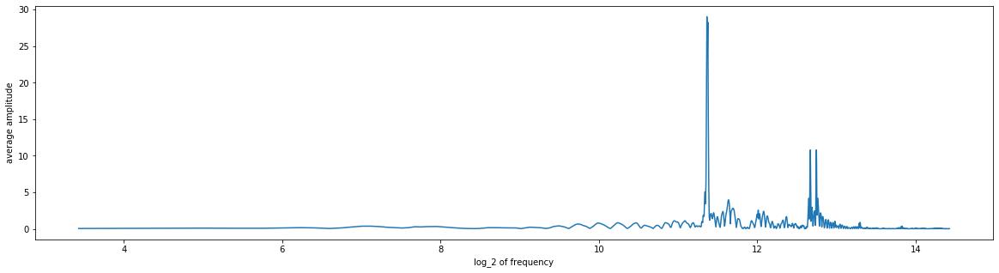

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id               1970
instrument_name    Xylophone
note                     Gb7
expression          rosewood
source              Iowa2012
file_extension           aif
Name: 0, dtype: object
1970.aif
Analyzing sample...


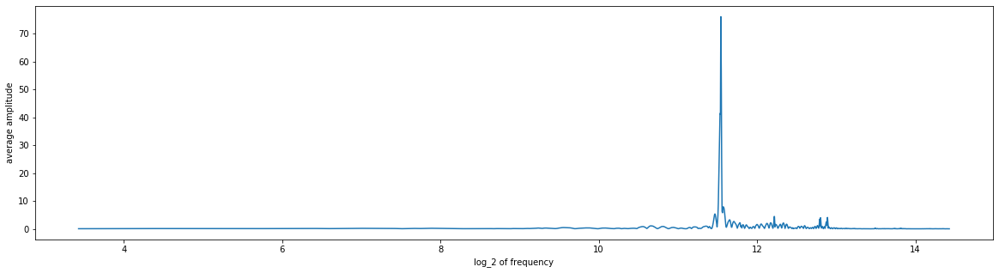

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id               1971
instrument_name    Xylophone
note                      C8
expression          rosewood
source              Iowa2012
file_extension           aif
Name: 0, dtype: object
1971.aif
Analyzing sample...


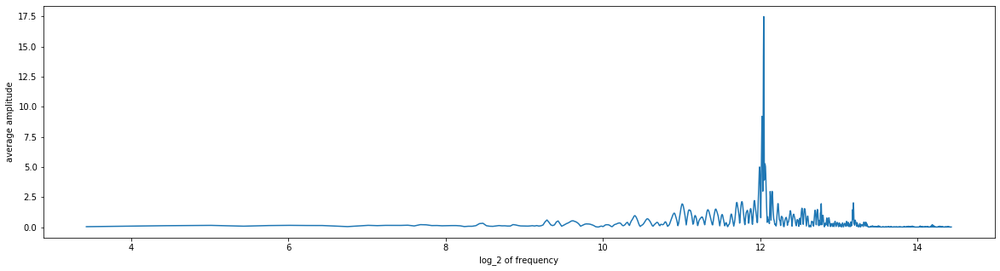

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id               1972
instrument_name    Xylophone
note                     Bb4
expression          rosewood
source              Iowa2012
file_extension           aif
Name: 0, dtype: object
1972.aif
Analyzing sample...


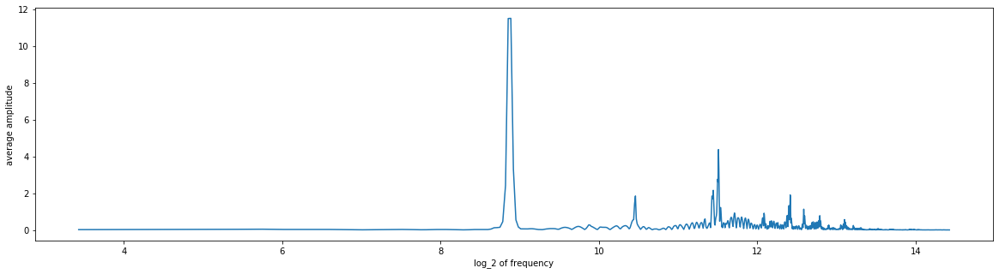

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id               1973
instrument_name    Xylophone
note                      D6
expression          rosewood
source              Iowa2012
file_extension           aif
Name: 0, dtype: object
1973.aif
Analyzing sample...


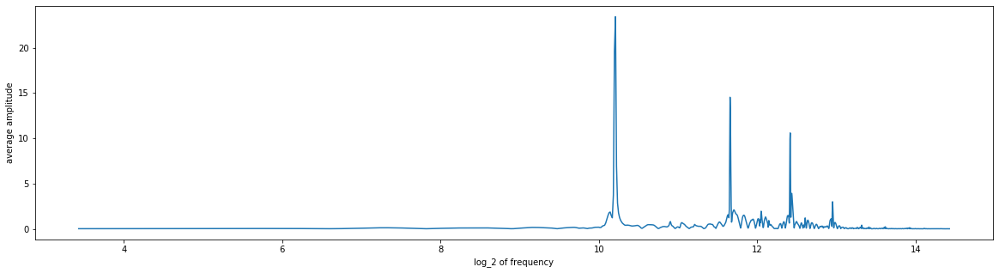

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id               1974
instrument_name    Xylophone
note                      B4
expression          rosewood
source              Iowa2012
file_extension           aif
Name: 0, dtype: object
1974.aif
Analyzing sample...


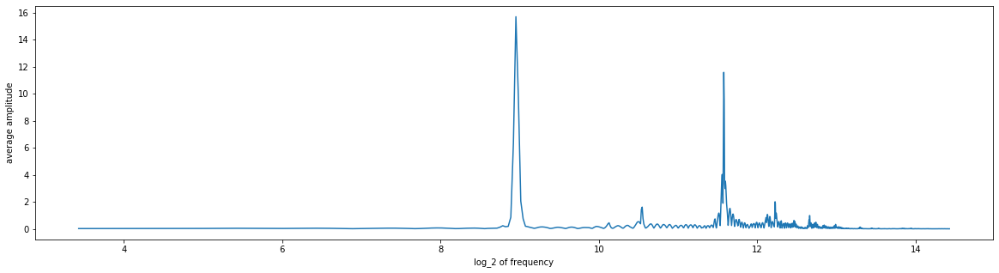

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id               1975
instrument_name    Xylophone
note                      G4
expression          rosewood
source              Iowa2012
file_extension           aif
Name: 0, dtype: object
1975.aif
Analyzing sample...


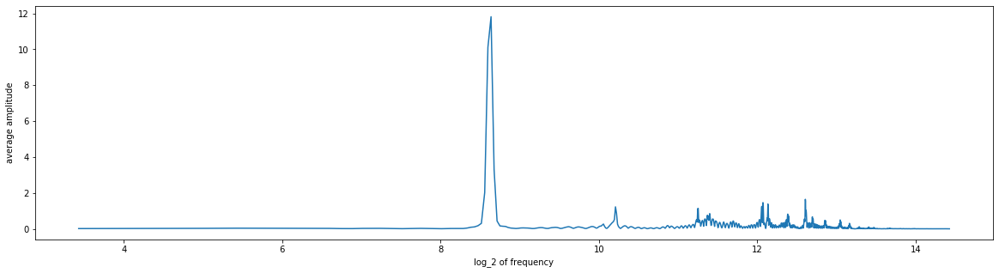

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id               1976
instrument_name    Xylophone
note                      A6
expression          rosewood
source              Iowa2012
file_extension           aif
Name: 0, dtype: object
1976.aif
Analyzing sample...


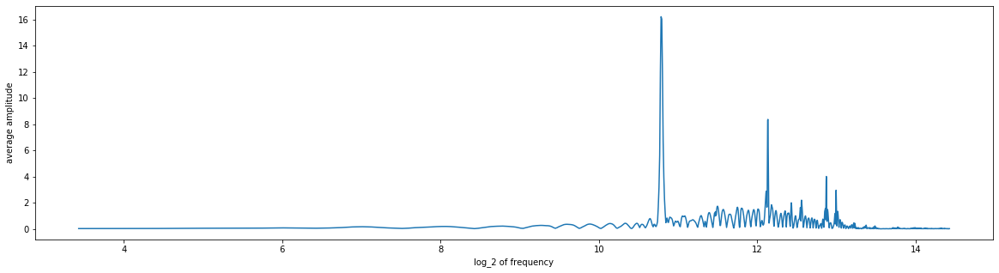

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id               1977
instrument_name    Xylophone
note                      F5
expression          rosewood
source              Iowa2012
file_extension           aif
Name: 0, dtype: object
1977.aif
Analyzing sample...


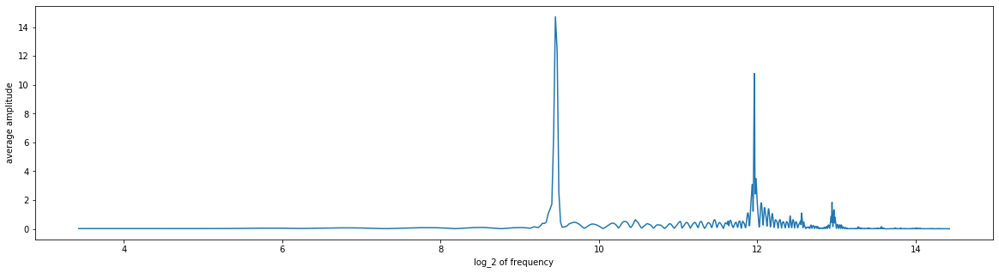

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id               1978
instrument_name    Xylophone
note                     Ab7
expression          rosewood
source              Iowa2012
file_extension           aif
Name: 0, dtype: object
1978.aif
Analyzing sample...


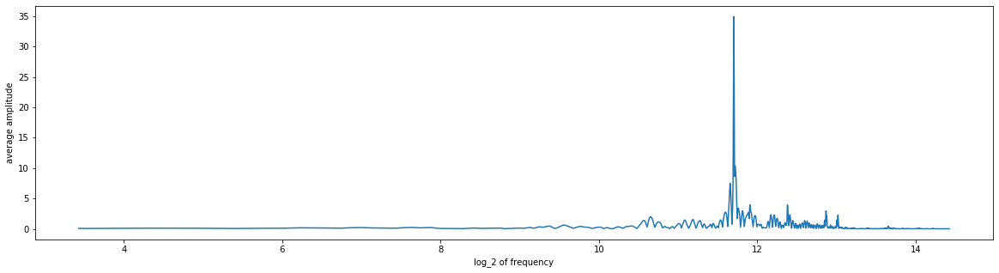

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id               1979
instrument_name    Xylophone
note                      E6
expression          rosewood
source              Iowa2012
file_extension           aif
Name: 0, dtype: object
1979.aif
Analyzing sample...


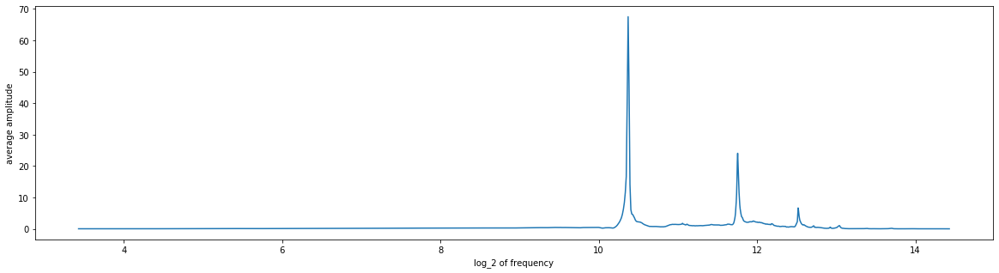

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id               1980
instrument_name    Xylophone
note                     Gb5
expression          rosewood
source              Iowa2012
file_extension           aif
Name: 0, dtype: object
1980.aif
Analyzing sample...


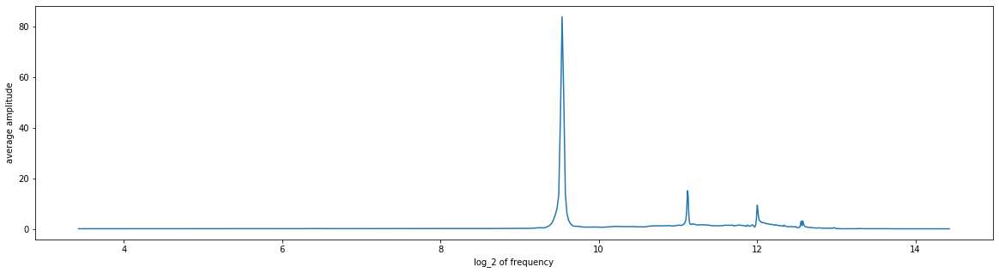

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id               1981
instrument_name    Xylophone
note                     Eb6
expression          rosewood
source              Iowa2012
file_extension           aif
Name: 0, dtype: object
1981.aif
Analyzing sample...


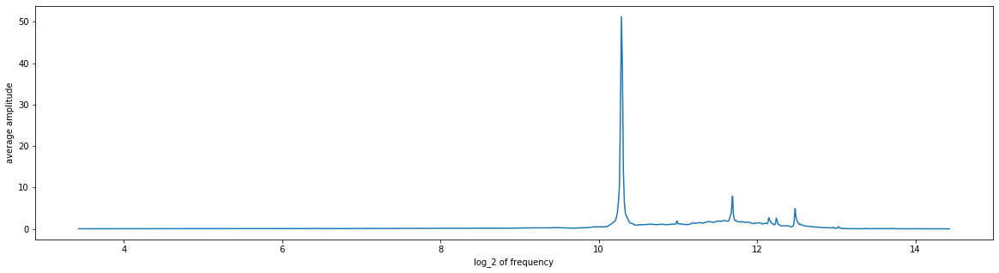

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id               1982
instrument_name    Xylophone
note                     Bb6
expression          rosewood
source              Iowa2012
file_extension           aif
Name: 0, dtype: object
1982.aif
Analyzing sample...


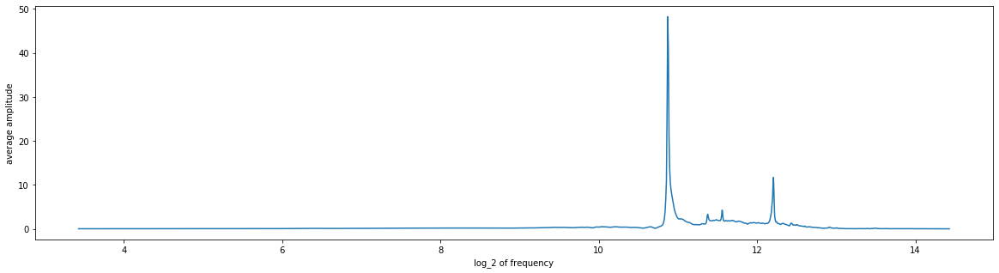

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id               1983
instrument_name    Xylophone
note                      D7
expression          rosewood
source              Iowa2012
file_extension           aif
Name: 0, dtype: object
1983.aif
Analyzing sample...


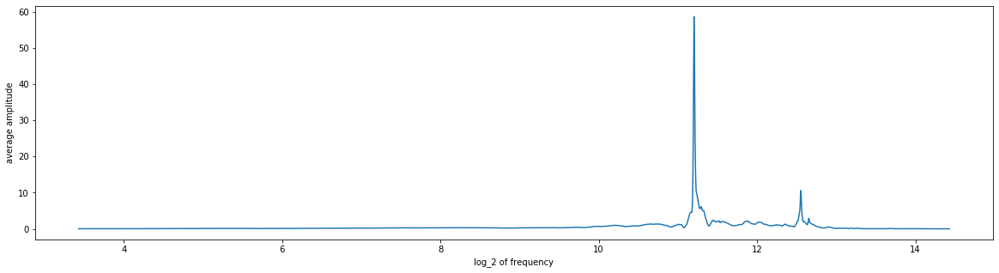

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id               1984
instrument_name    Xylophone
note                      B5
expression          rosewood
source              Iowa2012
file_extension           aif
Name: 0, dtype: object
1984.aif
Analyzing sample...


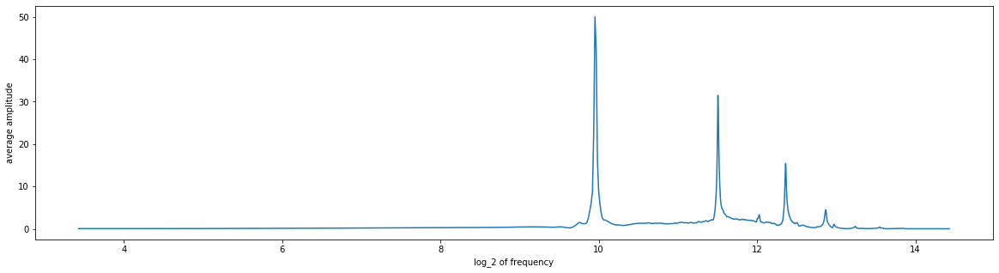

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id               1985
instrument_name    Xylophone
note                     Db6
expression          rosewood
source              Iowa2012
file_extension           aif
Name: 0, dtype: object
1985.aif
Analyzing sample...


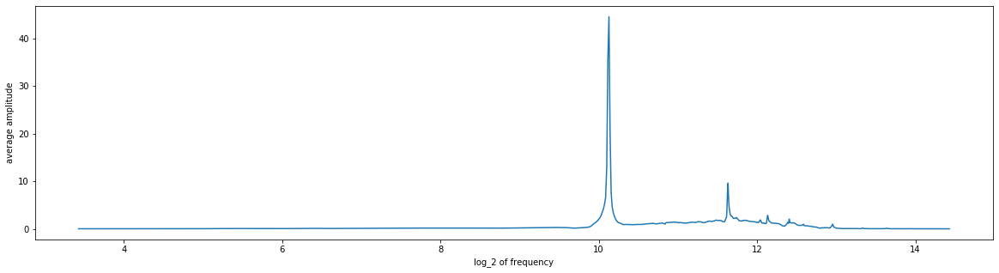

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id               1986
instrument_name    Xylophone
note                      G5
expression          rosewood
source              Iowa2012
file_extension           aif
Name: 0, dtype: object
1986.aif
Analyzing sample...


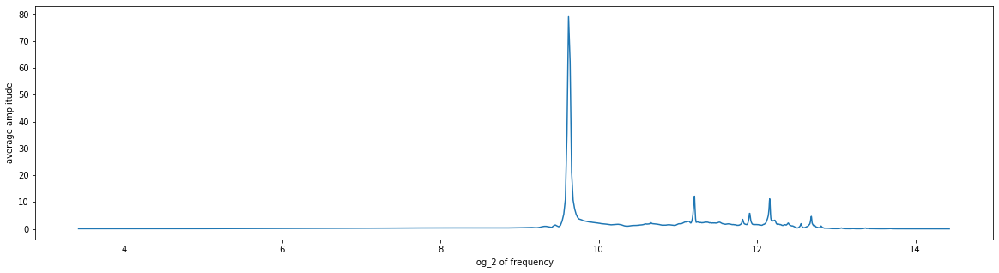

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id               1987
instrument_name    Xylophone
note                      A7
expression          rosewood
source              Iowa2012
file_extension           aif
Name: 0, dtype: object
1987.aif
Analyzing sample...


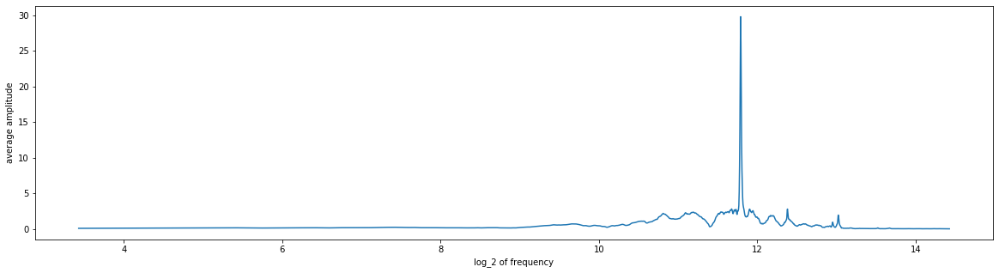

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id               1988
instrument_name    Xylophone
note                     Ab5
expression          rosewood
source              Iowa2012
file_extension           aif
Name: 0, dtype: object
1988.aif
Analyzing sample...


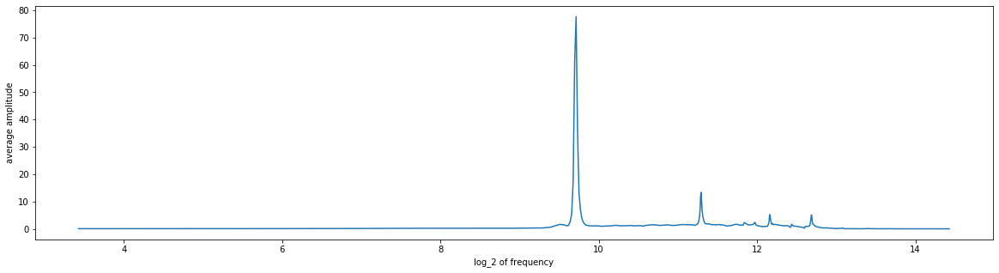

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id               1989
instrument_name    Xylophone
note                      F4
expression          rosewood
source              Iowa2012
file_extension           aif
Name: 0, dtype: object
1989.aif
Analyzing sample...


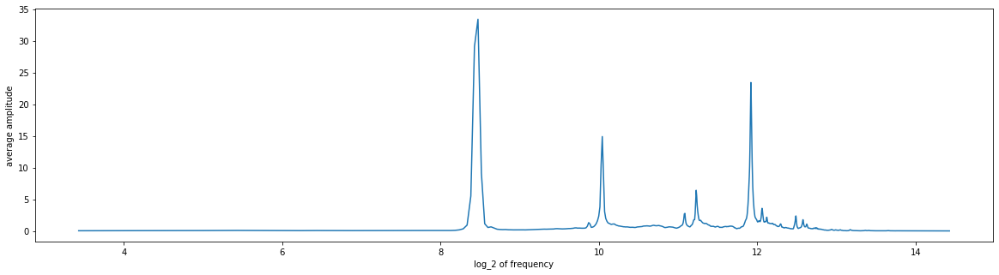

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id               1990
instrument_name    Xylophone
note                     Bb4
expression          rosewood
source              Iowa2012
file_extension           aif
Name: 0, dtype: object
1990.aif
Analyzing sample...


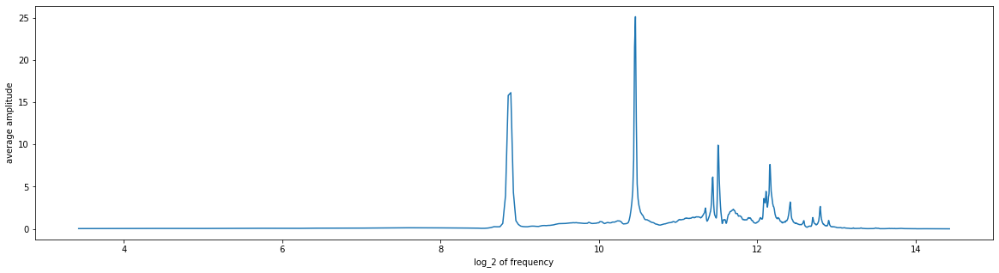

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id               1991
instrument_name    Xylophone
note                      C6
expression          rosewood
source              Iowa2012
file_extension           aif
Name: 0, dtype: object
1991.aif
Analyzing sample...


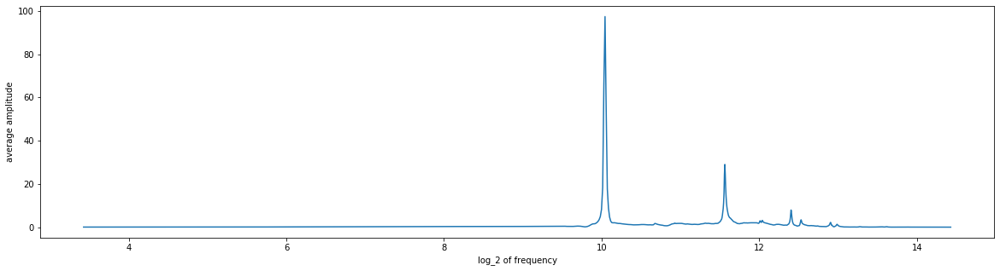

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id               1992
instrument_name    Xylophone
note                     Gb7
expression          rosewood
source              Iowa2012
file_extension           aif
Name: 0, dtype: object
1992.aif
Analyzing sample...


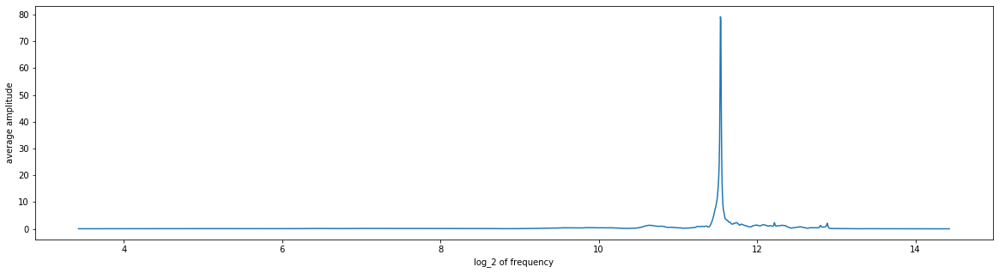

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id               1993
instrument_name    Xylophone
note                      D5
expression          rosewood
source              Iowa2012
file_extension           aif
Name: 0, dtype: object
1993.aif
Analyzing sample...


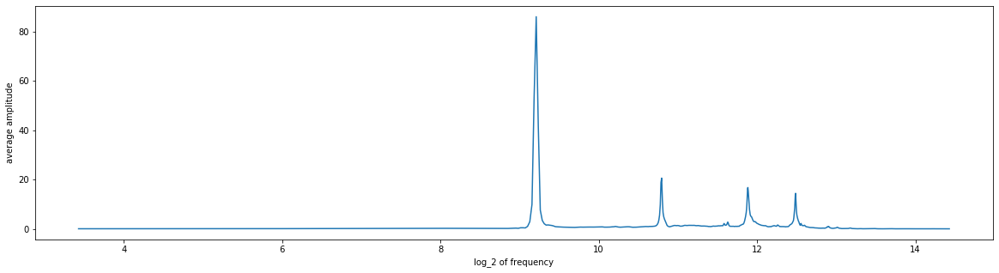

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id               1994
instrument_name    Xylophone
note                      B7
expression          rosewood
source              Iowa2012
file_extension           aif
Name: 0, dtype: object
1994.aif
Analyzing sample...


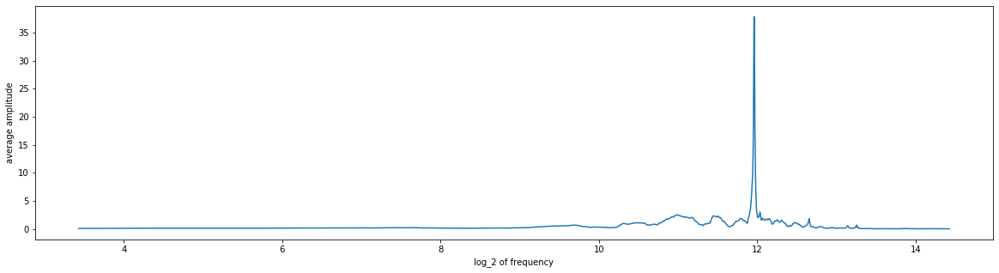

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id               1995
instrument_name    Xylophone
note                      G7
expression          rosewood
source              Iowa2012
file_extension           aif
Name: 0, dtype: object
1995.aif
Analyzing sample...


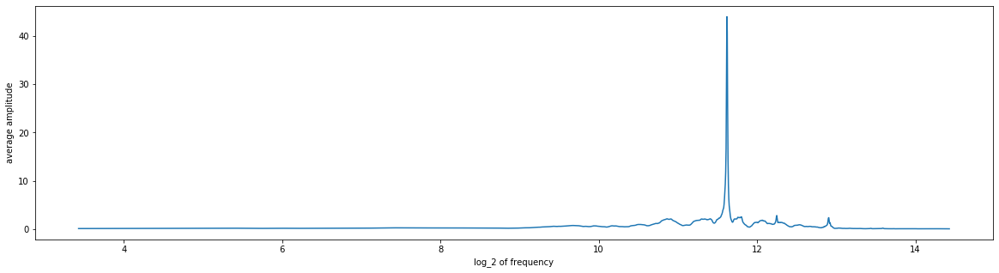

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id               1996
instrument_name    Xylophone
note                      A5
expression          rosewood
source              Iowa2012
file_extension           aif
Name: 0, dtype: object
1996.aif
Analyzing sample...


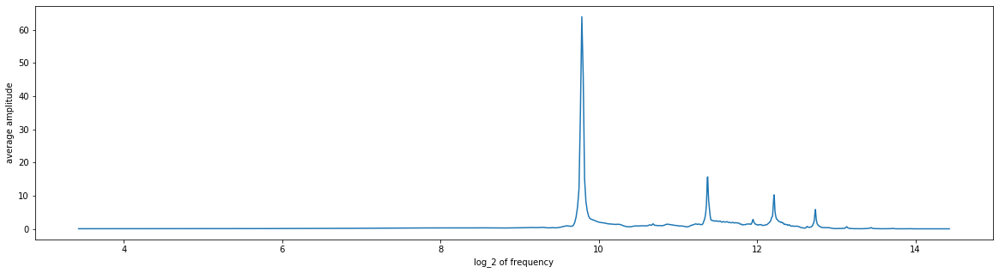

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id               1997
instrument_name    Xylophone
note                     Ab7
expression          rosewood
source              Iowa2012
file_extension           aif
Name: 0, dtype: object
1997.aif
Analyzing sample...


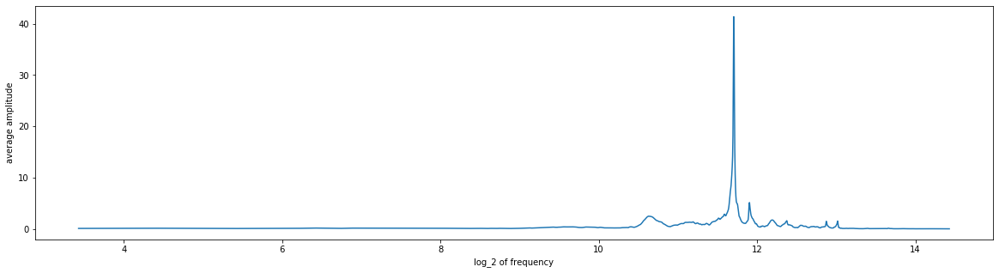

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id               1998
instrument_name    Xylophone
note                      F6
expression          rosewood
source              Iowa2012
file_extension           aif
Name: 0, dtype: object
1998.aif
Analyzing sample...


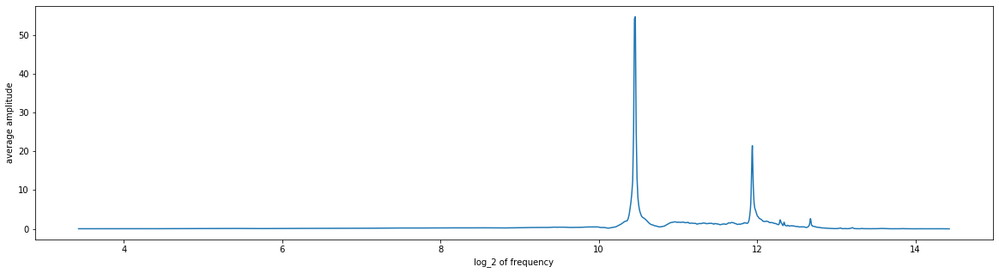

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id               1999
instrument_name    Xylophone
note                     Db7
expression          rosewood
source              Iowa2012
file_extension           aif
Name: 0, dtype: object
1999.aif
Analyzing sample...


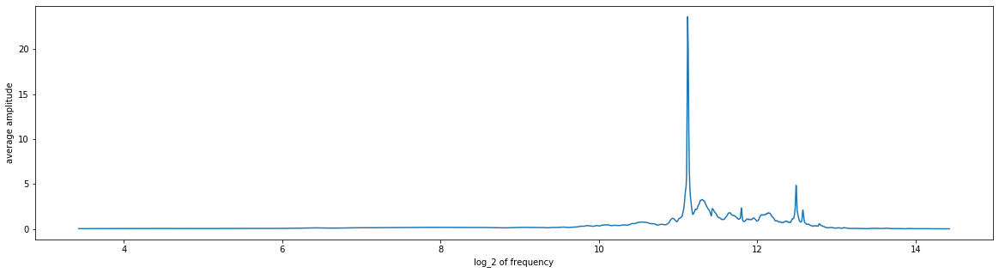

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id               2000
instrument_name    Xylophone
note                     Ab4
expression          rosewood
source              Iowa2012
file_extension           aif
Name: 0, dtype: object
2000.aif
Analyzing sample...


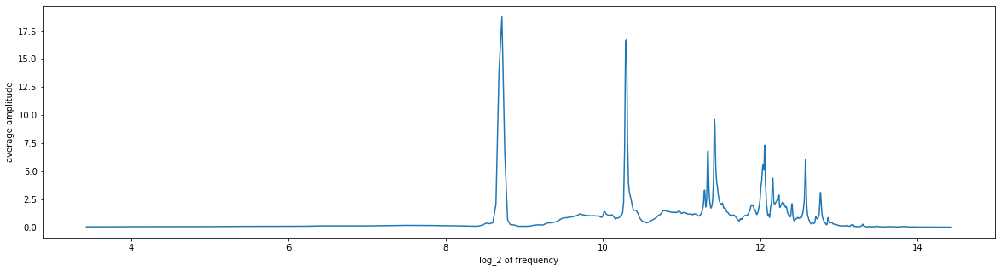

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id               2001
instrument_name    Xylophone
note                      G4
expression          rosewood
source              Iowa2012
file_extension           aif
Name: 0, dtype: object
2001.aif
Analyzing sample...


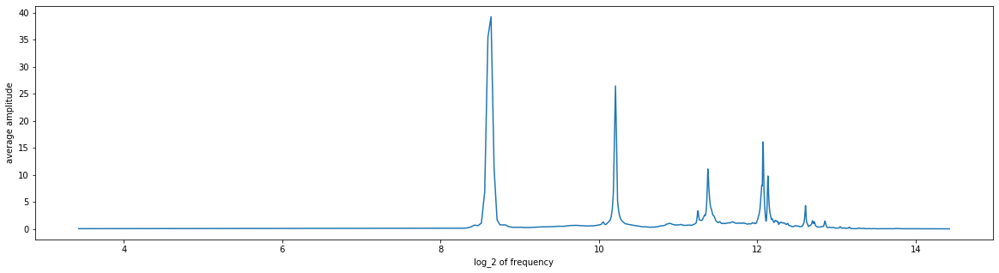

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id               2002
instrument_name    Xylophone
note                      A6
expression          rosewood
source              Iowa2012
file_extension           aif
Name: 0, dtype: object
2002.aif
Analyzing sample...


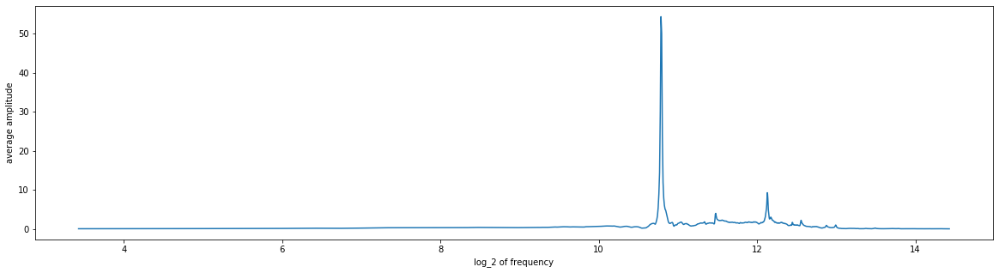

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id               2003
instrument_name    Xylophone
note                      F5
expression          rosewood
source              Iowa2012
file_extension           aif
Name: 0, dtype: object
2003.aif
Analyzing sample...


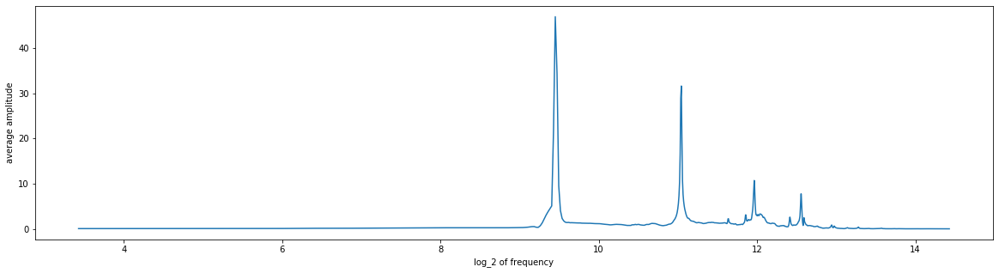

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id               2004
instrument_name    Xylophone
note                     Gb4
expression          rosewood
source              Iowa2012
file_extension           aif
Name: 0, dtype: object
2004.aif
Analyzing sample...


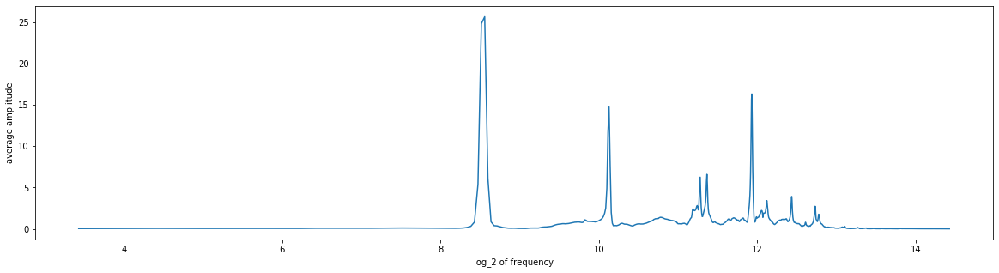

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id               2005
instrument_name    Xylophone
note                      C5
expression          rosewood
source              Iowa2012
file_extension           aif
Name: 0, dtype: object
2005.aif
Analyzing sample...


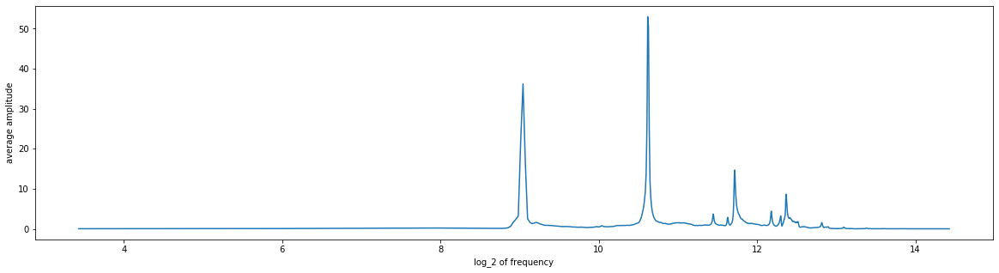

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id               2006
instrument_name    Xylophone
note                      E7
expression          rosewood
source              Iowa2012
file_extension           aif
Name: 0, dtype: object
2006.aif
Analyzing sample...


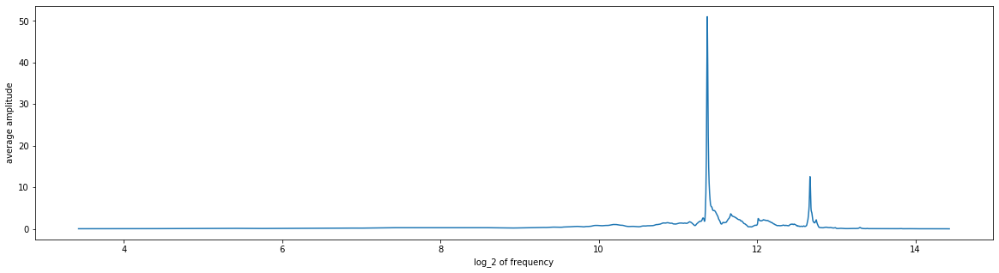

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id               2007
instrument_name    Xylophone
note                     Eb7
expression          rosewood
source              Iowa2012
file_extension           aif
Name: 0, dtype: object
2007.aif
Analyzing sample...


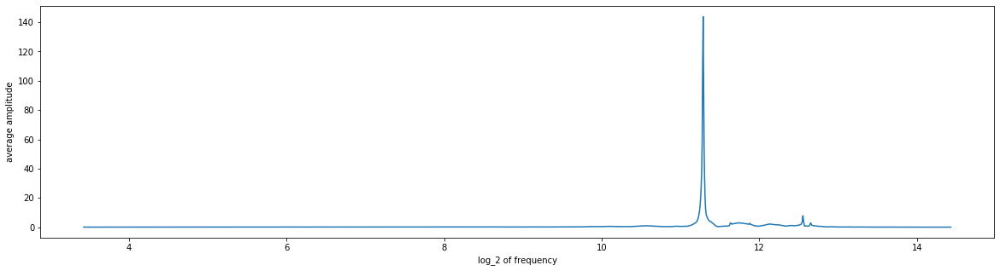

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id               2008
instrument_name    Xylophone
note                     Bb7
expression          rosewood
source              Iowa2012
file_extension           aif
Name: 0, dtype: object
2008.aif
Analyzing sample...


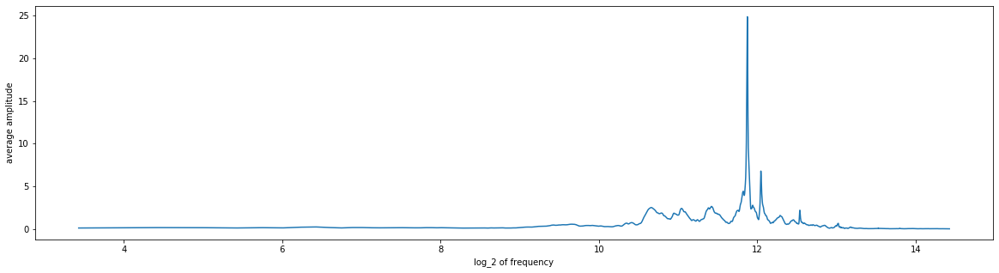

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id               2009
instrument_name    Xylophone
note                      C8
expression          rosewood
source              Iowa2012
file_extension           aif
Name: 0, dtype: object
2009.aif
Analyzing sample...


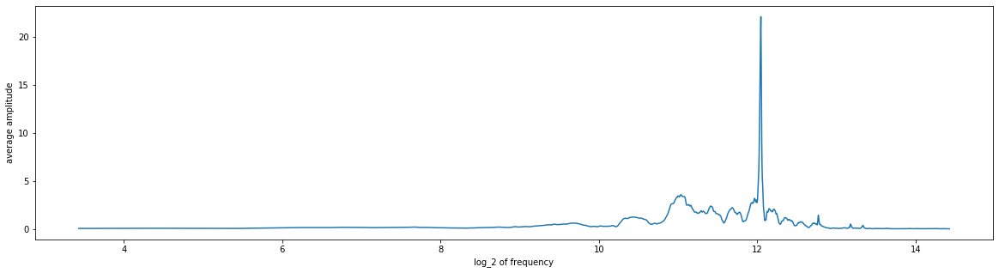

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id               2010
instrument_name    Xylophone
note                      D6
expression          rosewood
source              Iowa2012
file_extension           aif
Name: 0, dtype: object
2010.aif
Analyzing sample...


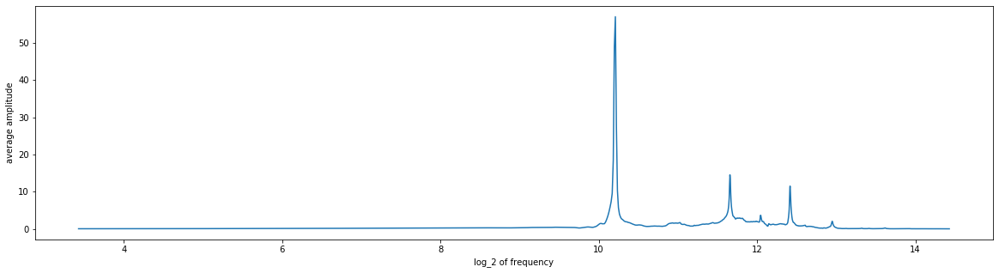

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id               2011
instrument_name    Xylophone
note                      B4
expression          rosewood
source              Iowa2012
file_extension           aif
Name: 0, dtype: object
2011.aif
Analyzing sample...


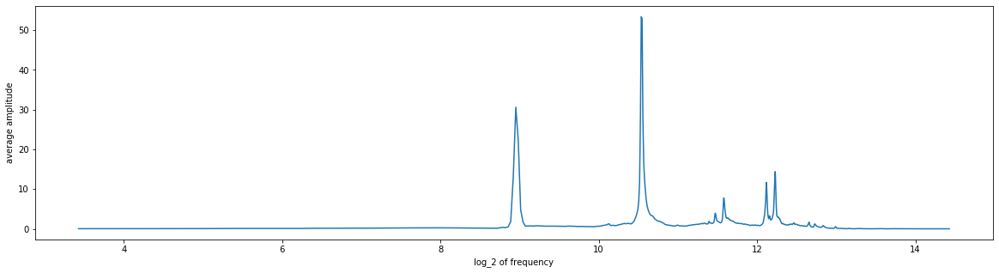

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id               2012
instrument_name    Xylophone
note                     Ab6
expression          rosewood
source              Iowa2012
file_extension           aif
Name: 0, dtype: object
2012.aif
Analyzing sample...


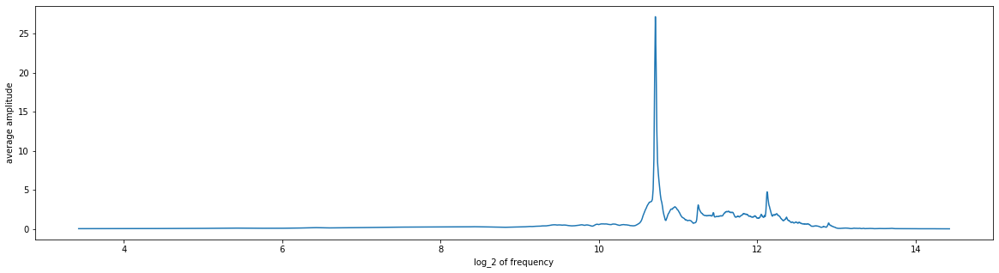

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id               2013
instrument_name    Xylophone
note                      G6
expression          rosewood
source              Iowa2012
file_extension           aif
Name: 0, dtype: object
2013.aif
Analyzing sample...


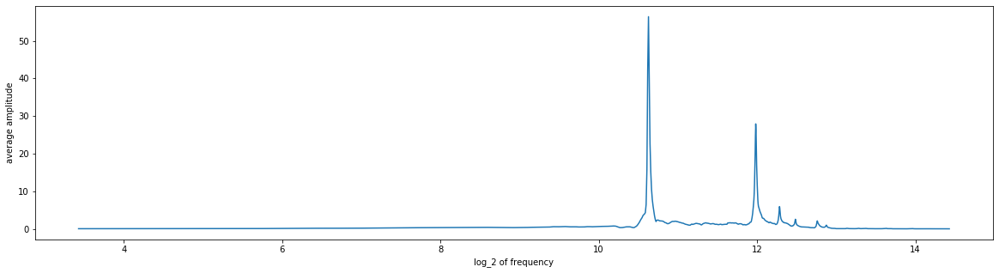

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id               2014
instrument_name    Xylophone
note                      A4
expression          rosewood
source              Iowa2012
file_extension           aif
Name: 0, dtype: object
2014.aif
Analyzing sample...


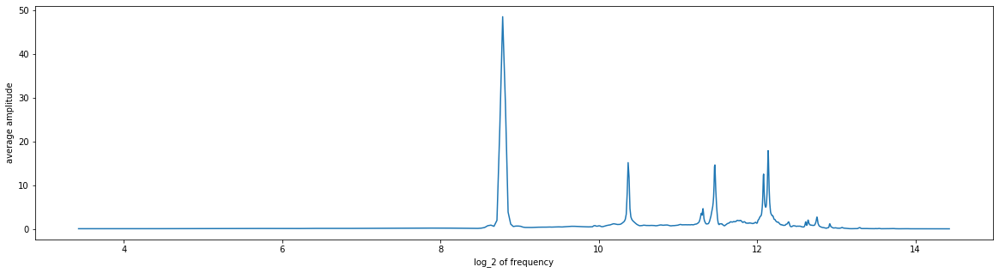

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id               2015
instrument_name    Xylophone
note                     Db5
expression          rosewood
source              Iowa2012
file_extension           aif
Name: 0, dtype: object
2015.aif
Analyzing sample...


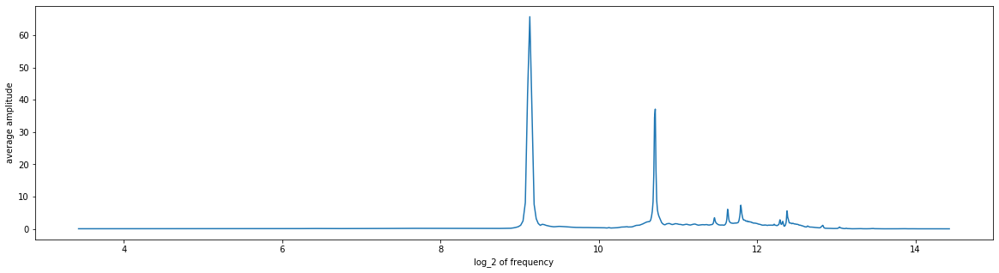

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id               2016
instrument_name    Xylophone
note                      F7
expression          rosewood
source              Iowa2012
file_extension           aif
Name: 0, dtype: object
2016.aif
Analyzing sample...


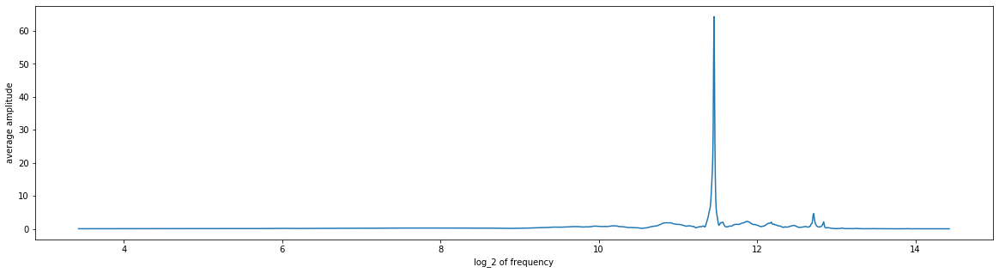

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id               2017
instrument_name    Xylophone
note                     Eb5
expression          rosewood
source              Iowa2012
file_extension           aif
Name: 0, dtype: object
2017.aif
Analyzing sample...


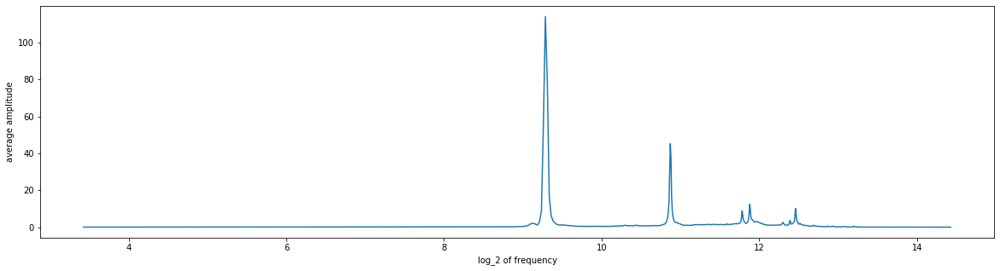

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id               2018
instrument_name    Xylophone
note                     Bb5
expression          rosewood
source              Iowa2012
file_extension           aif
Name: 0, dtype: object
2018.aif
Analyzing sample...


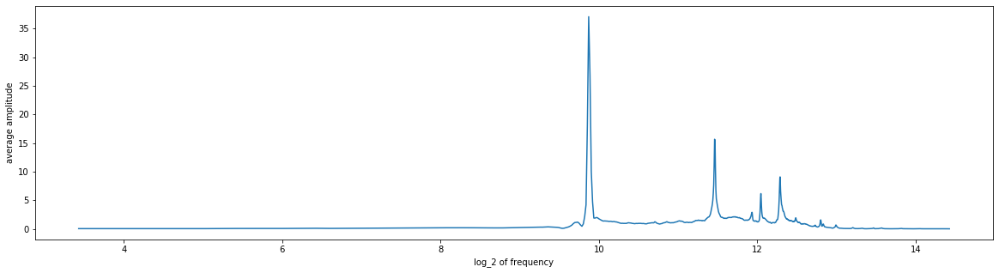

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id               2019
instrument_name    Xylophone
note                     Gb6
expression          rosewood
source              Iowa2012
file_extension           aif
Name: 0, dtype: object
2019.aif
Analyzing sample...


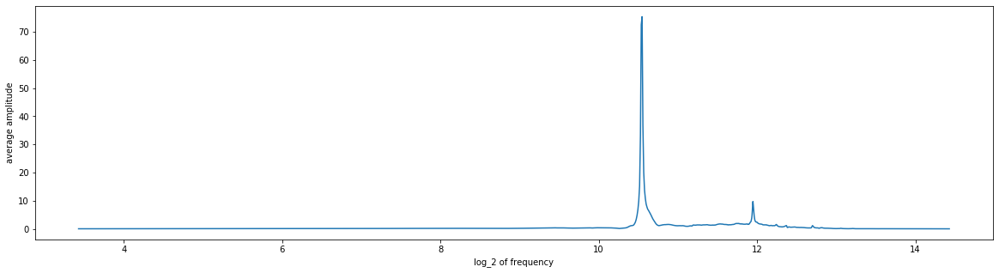

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id               2020
instrument_name    Xylophone
note                      E5
expression          rosewood
source              Iowa2012
file_extension           aif
Name: 0, dtype: object
2020.aif
Analyzing sample...


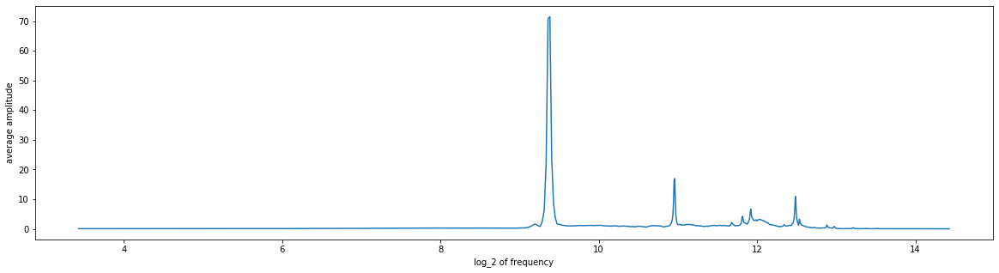

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id               2021
instrument_name    Xylophone
note                      B6
expression          rosewood
source              Iowa2012
file_extension           aif
Name: 0, dtype: object
2021.aif
Analyzing sample...


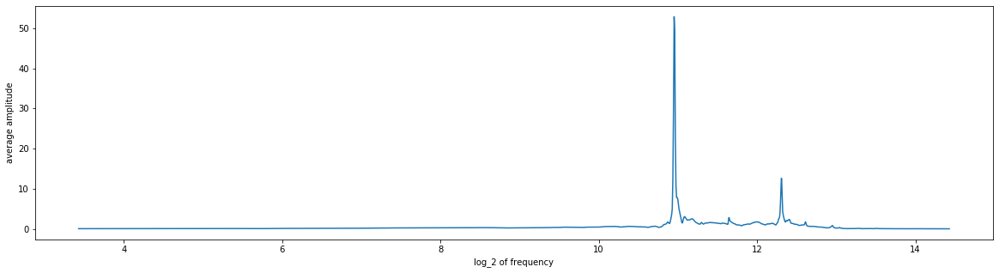

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2022
instrument_name    Vibraphone
note                      Bb3
expression            sustain
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2022.aif
Analyzing sample...


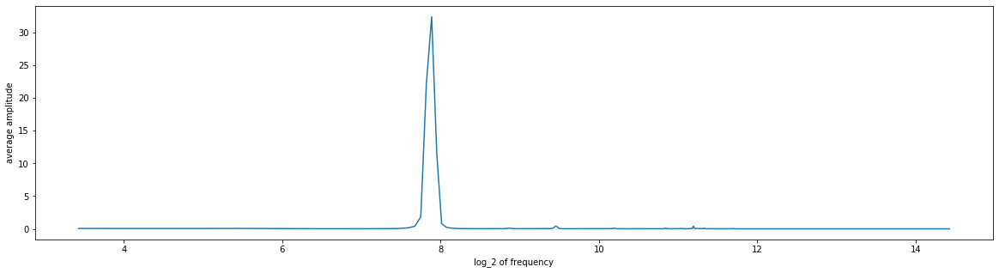

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2023
instrument_name    Vibraphone
note                      Eb3
expression            sustain
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2023.aif
Analyzing sample...


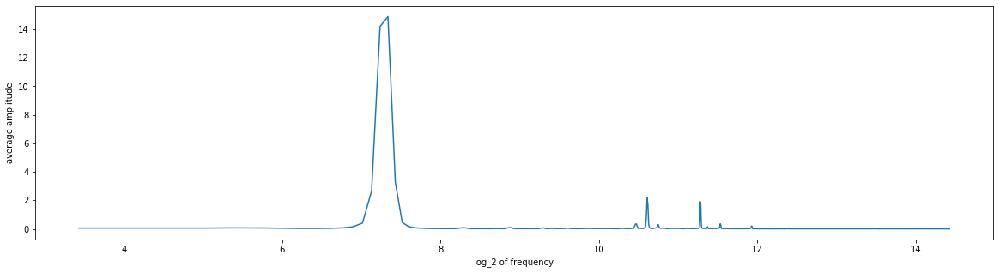

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2024
instrument_name    Vibraphone
note                       D6
expression            sustain
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2024.aif
Analyzing sample...


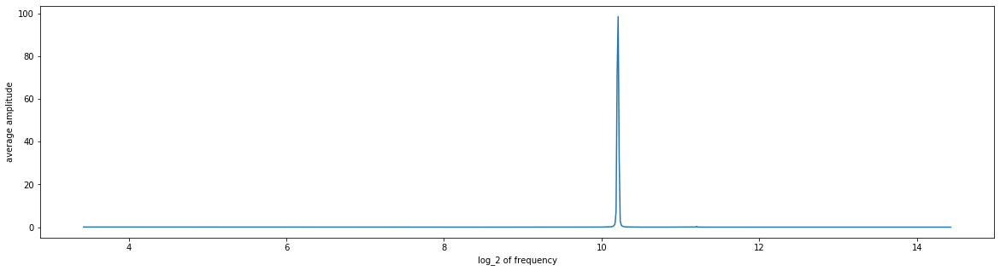

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2025
instrument_name    Vibraphone
note                       A3
expression            sustain
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2025.aif
Analyzing sample...


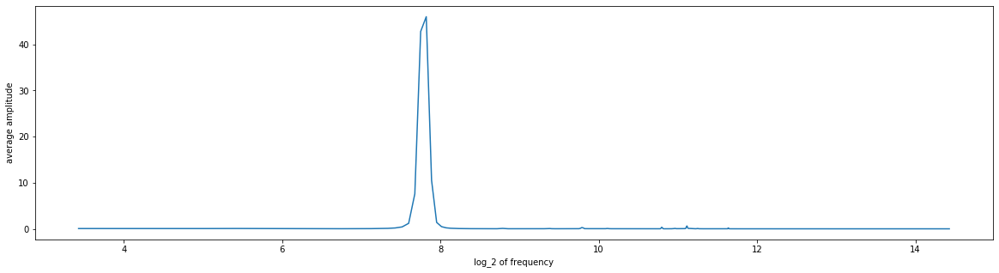

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2026
instrument_name    Vibraphone
note                       B4
expression            sustain
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2026.aif
Analyzing sample...


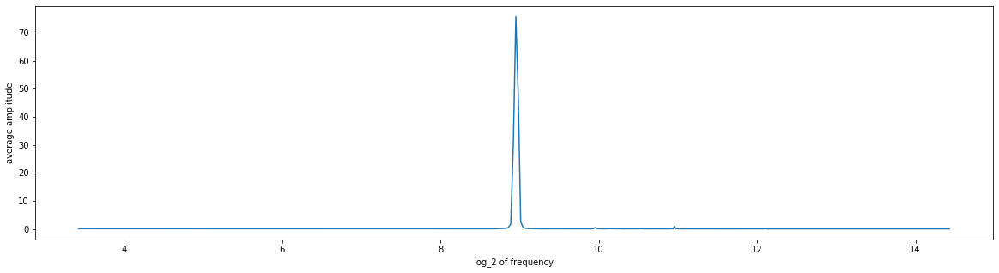

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2027
instrument_name    Vibraphone
note                       C5
expression            sustain
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2027.aif
Analyzing sample...


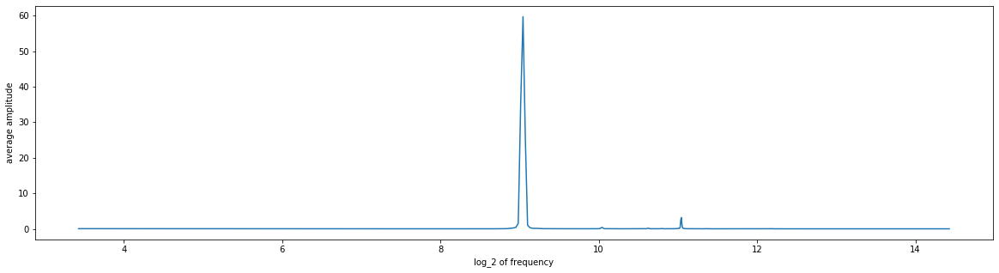

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2028
instrument_name    Vibraphone
note                      Ab5
expression            sustain
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2028.aif
Analyzing sample...


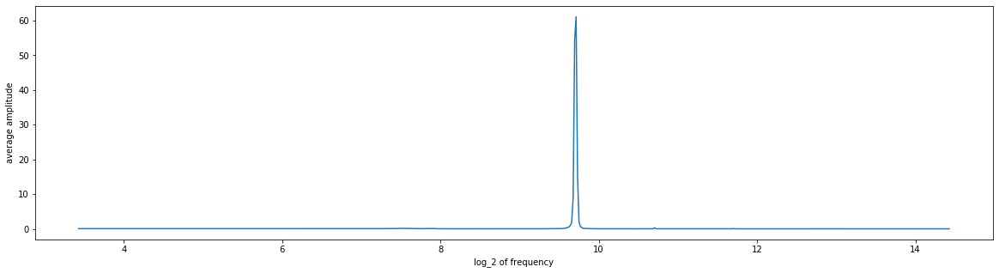

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2029
instrument_name    Vibraphone
note                      Db6
expression            sustain
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2029.aif
Analyzing sample...


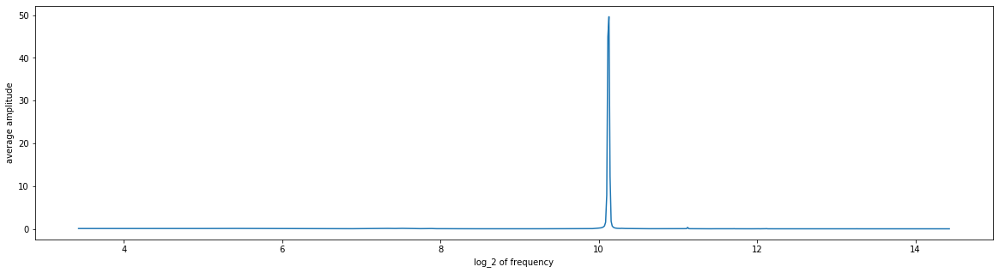

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2030
instrument_name    Vibraphone
note                       F5
expression            sustain
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2030.aif
Analyzing sample...


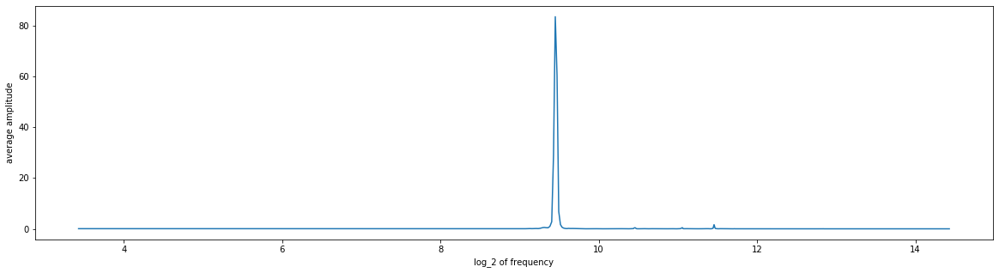

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2031
instrument_name    Vibraphone
note                      Db3
expression            sustain
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2031.aif
Analyzing sample...


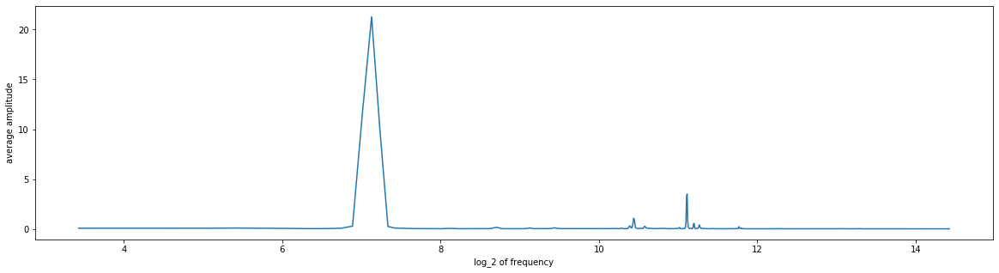

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2032
instrument_name    Vibraphone
note                      Eb6
expression            sustain
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2032.aif
Analyzing sample...


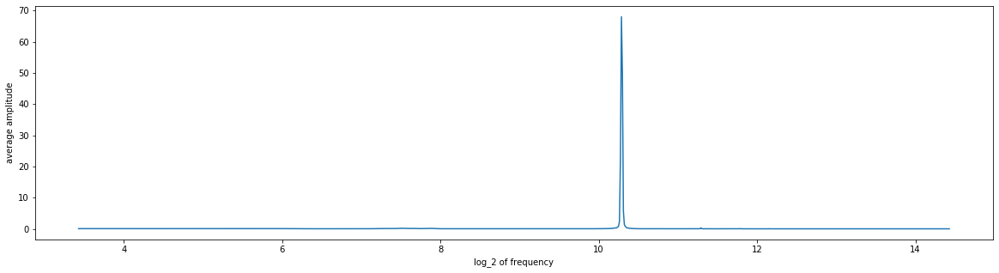

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2033
instrument_name    Vibraphone
note                       D3
expression            sustain
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2033.aif
Analyzing sample...


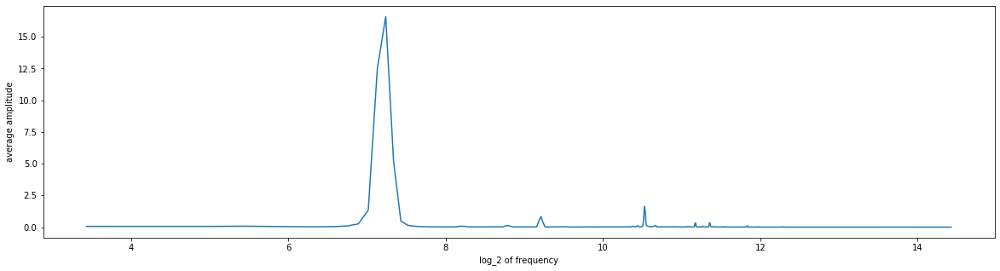

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2034
instrument_name    Vibraphone
note                       G4
expression            sustain
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2034.aif
Analyzing sample...


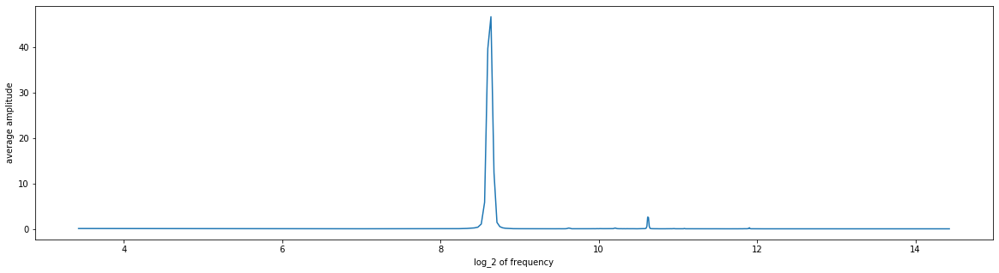

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2035
instrument_name    Vibraphone
note                      Gb5
expression            sustain
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2035.aif
Analyzing sample...


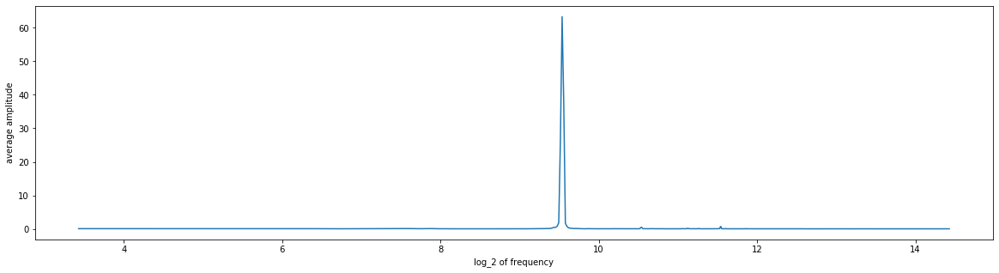

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2036
instrument_name    Vibraphone
note                       D4
expression            sustain
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2036.aif
Analyzing sample...


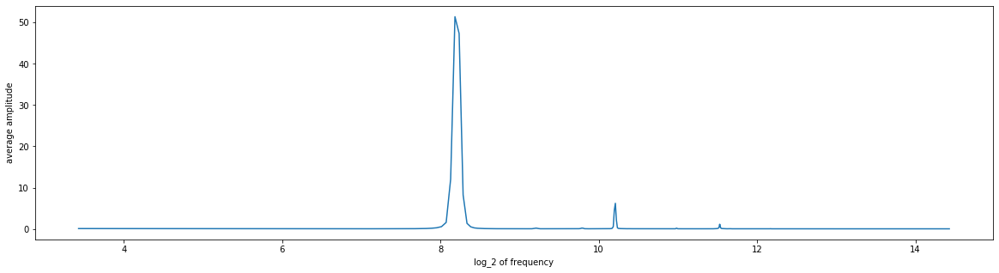

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2037
instrument_name    Vibraphone
note                       G3
expression            sustain
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2037.aif
Analyzing sample...


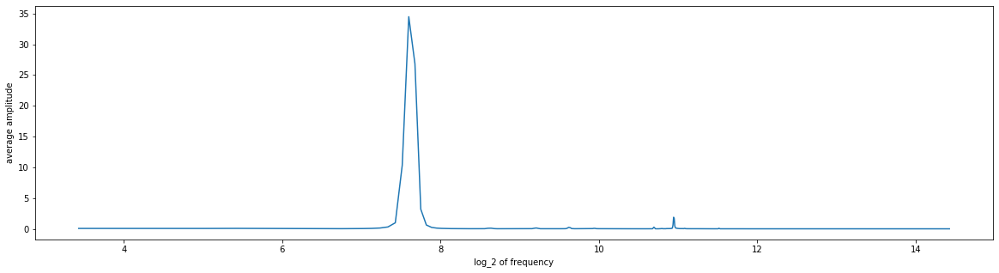

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2038
instrument_name    Vibraphone
note                      Db4
expression            sustain
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2038.aif
Analyzing sample...


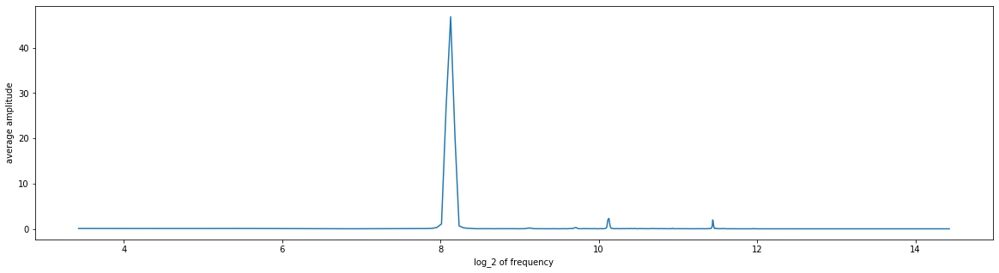

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2039
instrument_name    Vibraphone
note                       E5
expression            sustain
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2039.aif
Analyzing sample...


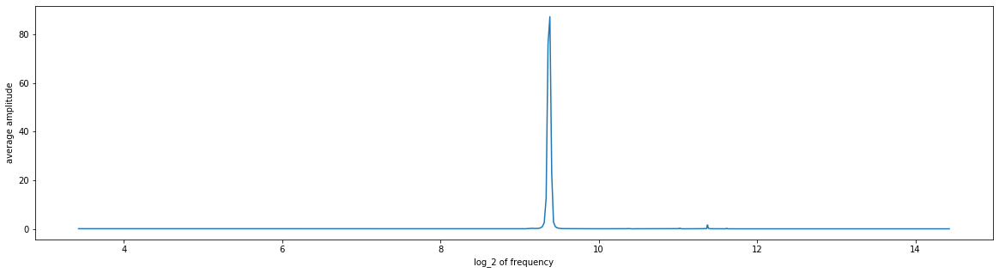

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2040
instrument_name    Vibraphone
note                       A4
expression            sustain
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2040.aif
Analyzing sample...


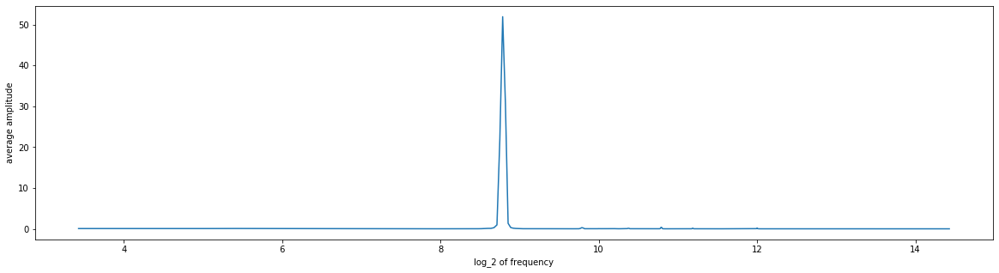

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2041
instrument_name    Vibraphone
note                       B3
expression            sustain
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2041.aif
Analyzing sample...


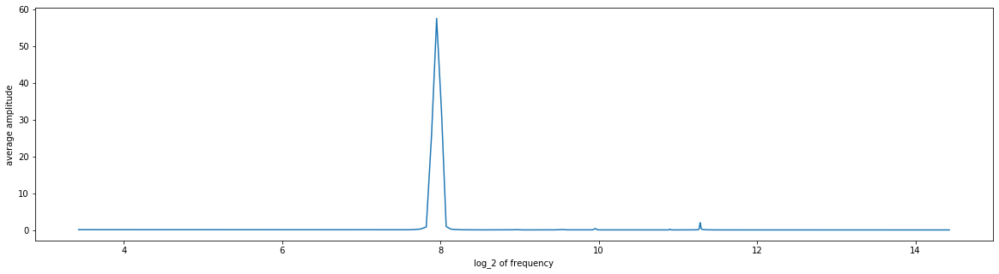

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2042
instrument_name    Vibraphone
note                      Bb4
expression            sustain
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2042.aif
Analyzing sample...


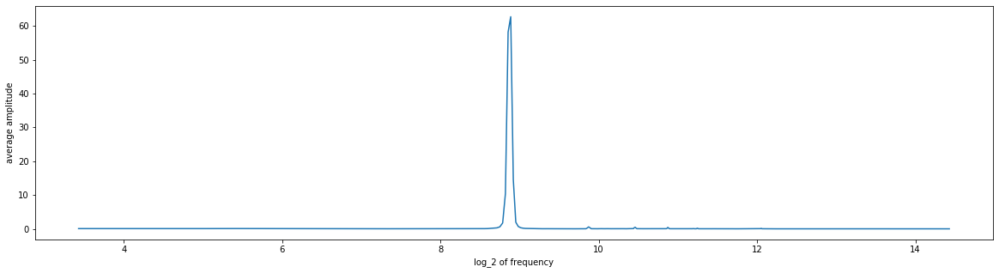

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2043
instrument_name    Vibraphone
note                       F4
expression            sustain
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2043.aif
Analyzing sample...


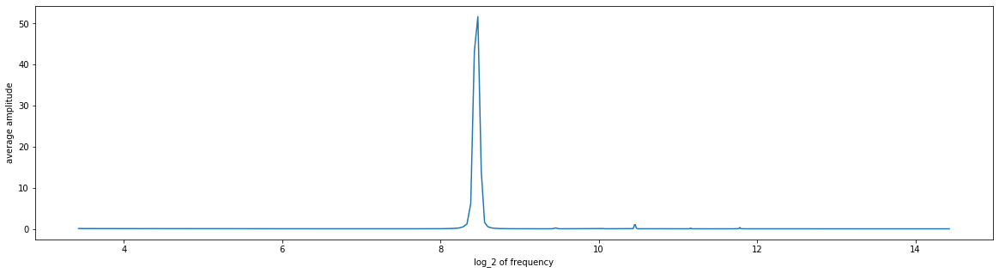

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2044
instrument_name    Vibraphone
note                       E3
expression            sustain
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2044.aif
Analyzing sample...


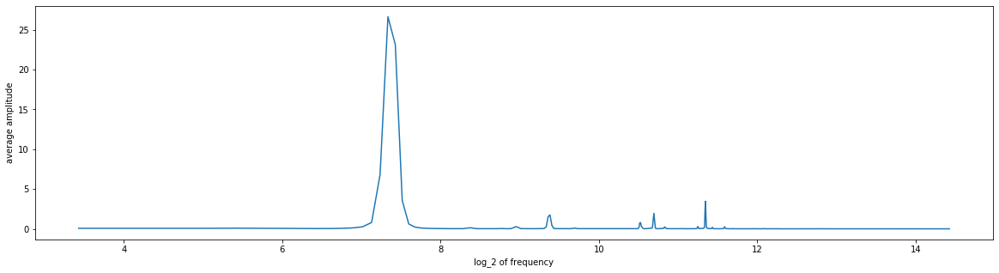

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2045
instrument_name    Vibraphone
note                      Gb4
expression            sustain
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2045.aif
Analyzing sample...


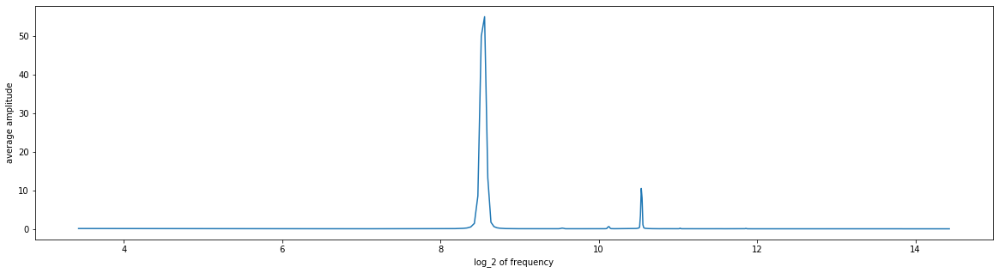

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2046
instrument_name    Vibraphone
note                       G5
expression            sustain
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2046.aif
Analyzing sample...


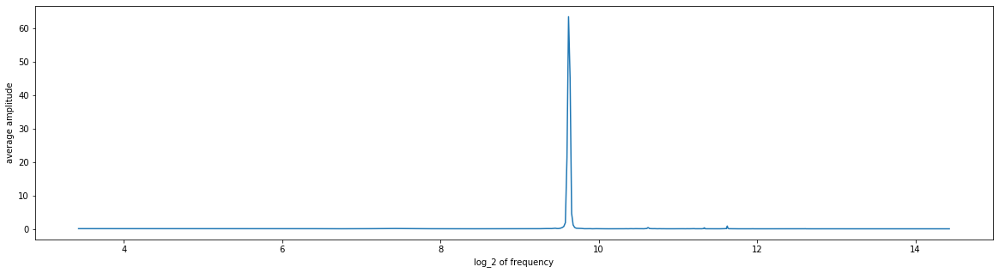

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2047
instrument_name    Vibraphone
note                       B5
expression            sustain
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2047.aif
Analyzing sample...


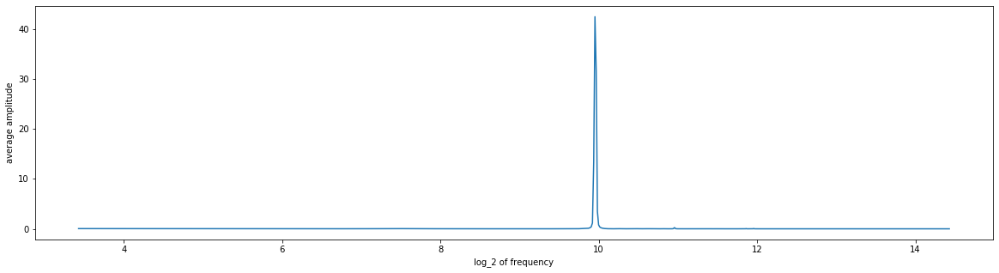

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2048
instrument_name    Vibraphone
note                      Ab4
expression            sustain
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2048.aif
Analyzing sample...


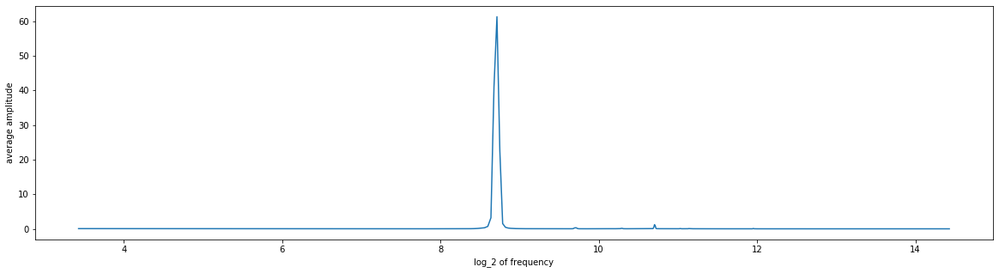

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2049
instrument_name    Vibraphone
note                       C4
expression            sustain
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2049.aif
Analyzing sample...


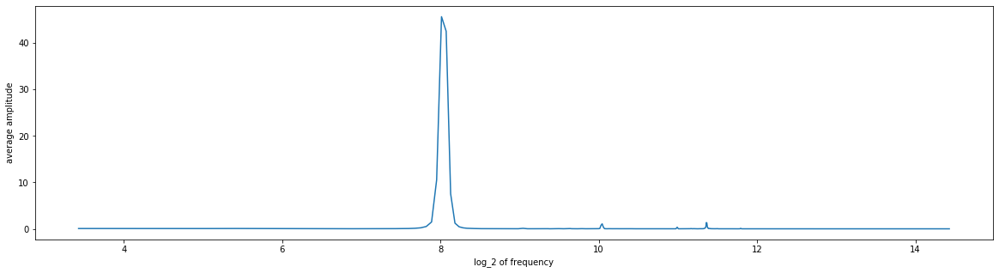

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2050
instrument_name    Vibraphone
note                       E6
expression            sustain
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2050.aif
Analyzing sample...


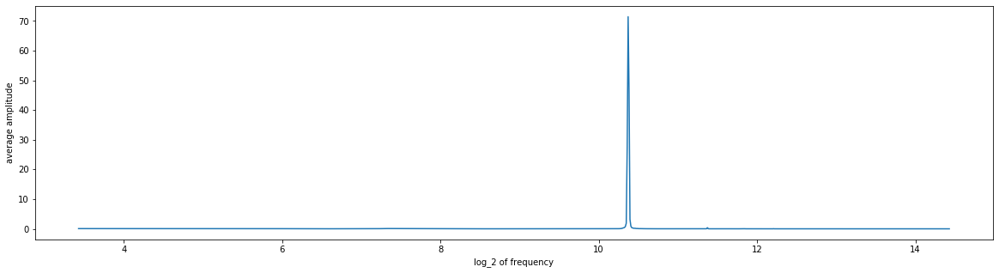

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2051
instrument_name    Vibraphone
note                       C3
expression            sustain
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2051.aif
Analyzing sample...


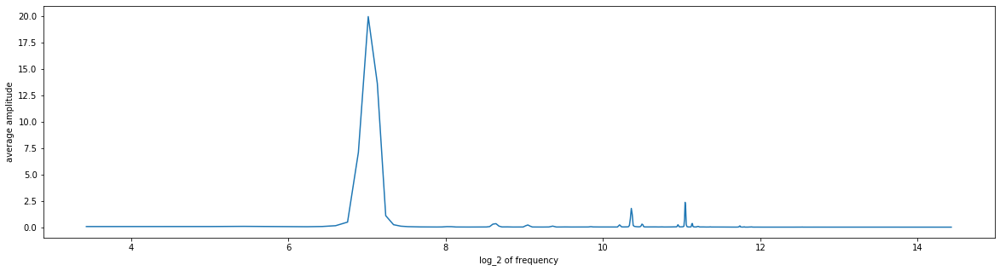

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2052
instrument_name    Vibraphone
note                       F6
expression            sustain
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2052.aif
Analyzing sample...


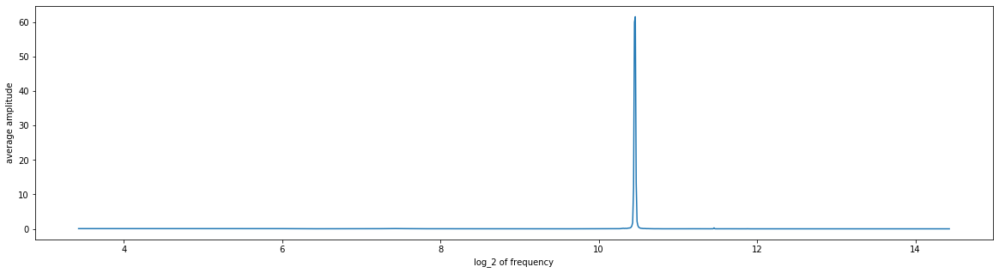

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2053
instrument_name    Vibraphone
note                      Ab3
expression            sustain
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2053.aif
Analyzing sample...


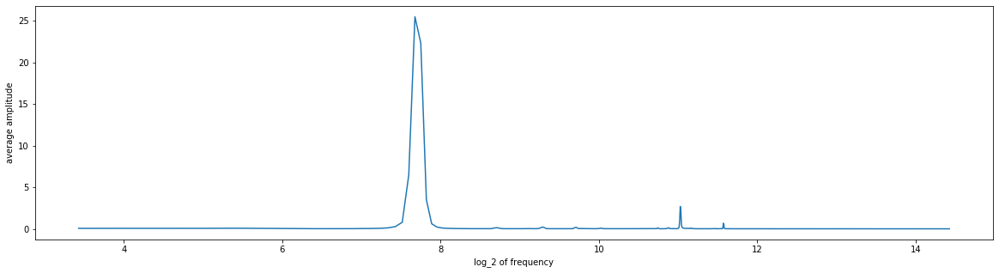

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2054
instrument_name    Vibraphone
note                       A5
expression            sustain
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2054.aif
Analyzing sample...


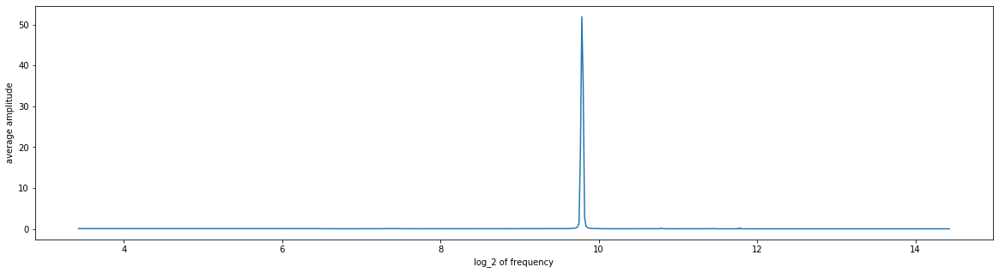

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2055
instrument_name    Vibraphone
note                      Bb5
expression            sustain
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2055.aif
Analyzing sample...


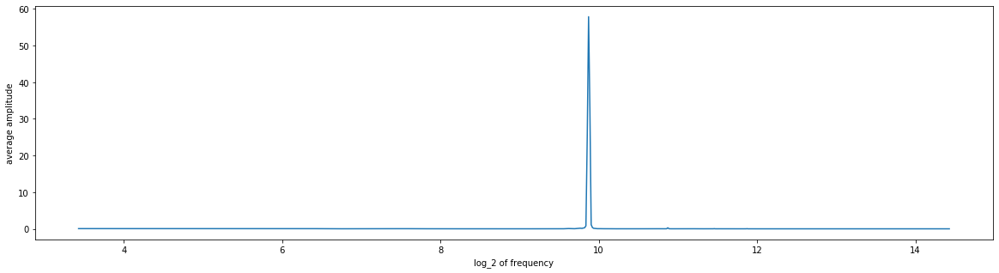

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2056
instrument_name    Vibraphone
note                      Eb5
expression            sustain
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2056.aif
Analyzing sample...


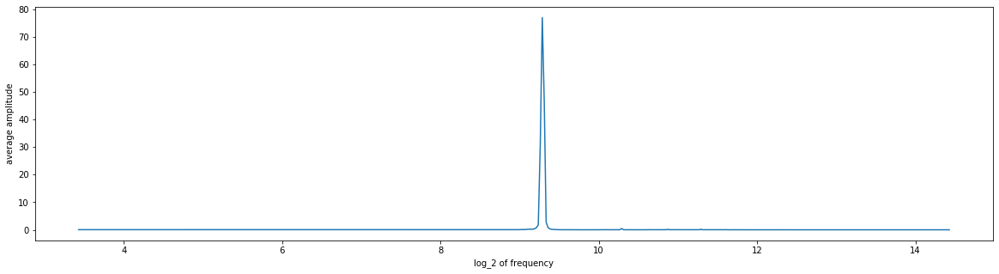

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2057
instrument_name    Vibraphone
note                       D5
expression            sustain
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2057.aif
Analyzing sample...


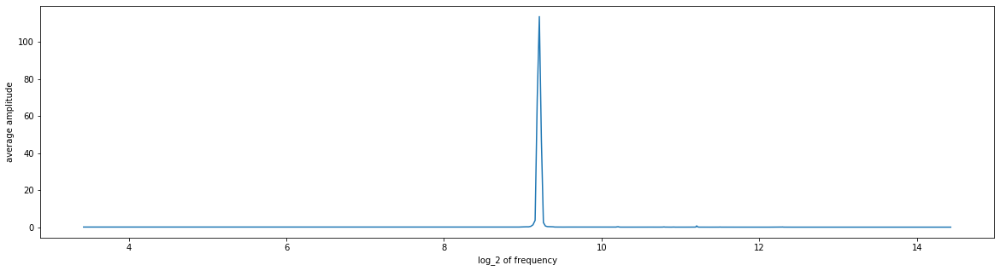

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2058
instrument_name    Vibraphone
note                      Gb3
expression            sustain
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2058.aif
Analyzing sample...


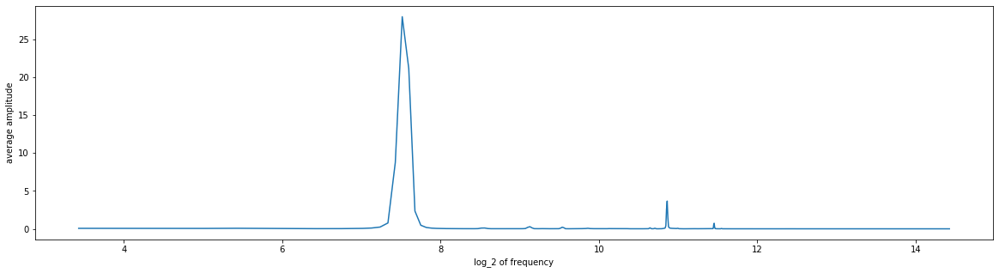

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2059
instrument_name    Vibraphone
note                      Db5
expression            sustain
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2059.aif
Analyzing sample...


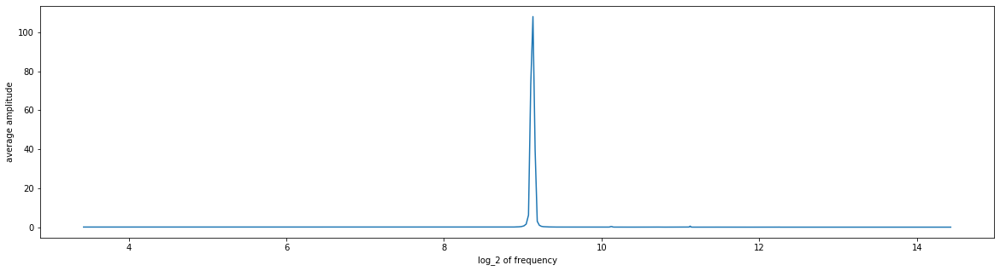

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2060
instrument_name    Vibraphone
note                       C6
expression            sustain
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2060.aif
Analyzing sample...


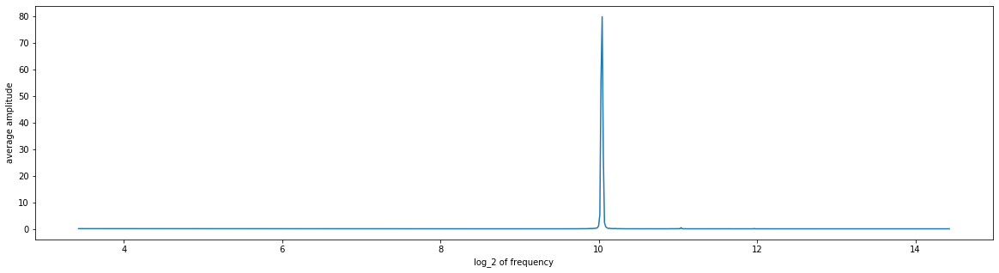

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2061
instrument_name    Vibraphone
note                       F3
expression            sustain
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2061.aif
Analyzing sample...


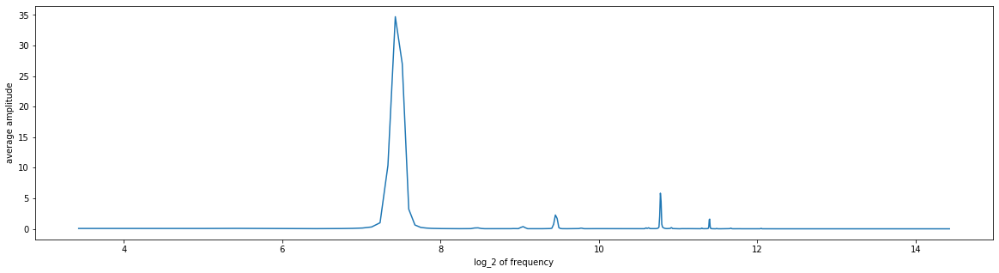

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2062
instrument_name    Vibraphone
note                       E4
expression            sustain
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2062.aif
Analyzing sample...


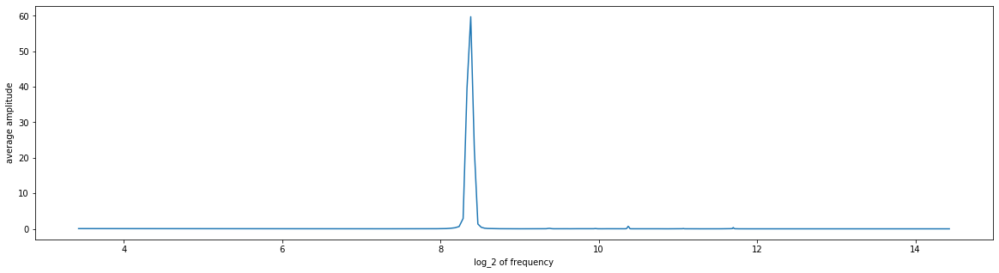

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                  2063
instrument_name      Vibraphone
note                         B5
expression         shortsustain
source                 Iowa2012
file_extension              aif
Name: 0, dtype: object
2063.aif
Analyzing sample...


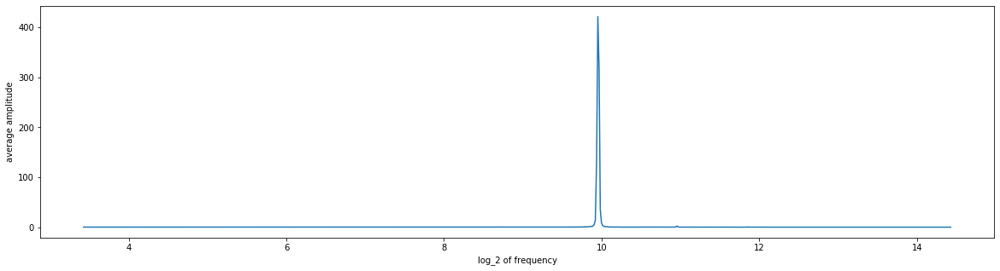

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                  2064
instrument_name      Vibraphone
note                        Db5
expression         shortsustain
source                 Iowa2012
file_extension              aif
Name: 0, dtype: object
2064.aif
Analyzing sample...


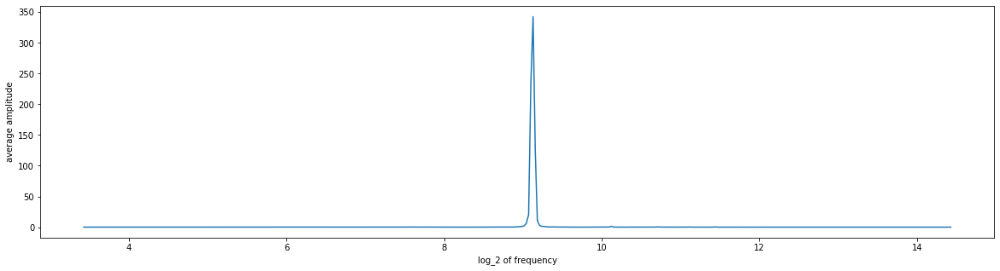

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                  2065
instrument_name      Vibraphone
note                         C4
expression         shortsustain
source                 Iowa2012
file_extension              aif
Name: 0, dtype: object
2065.aif
Analyzing sample...


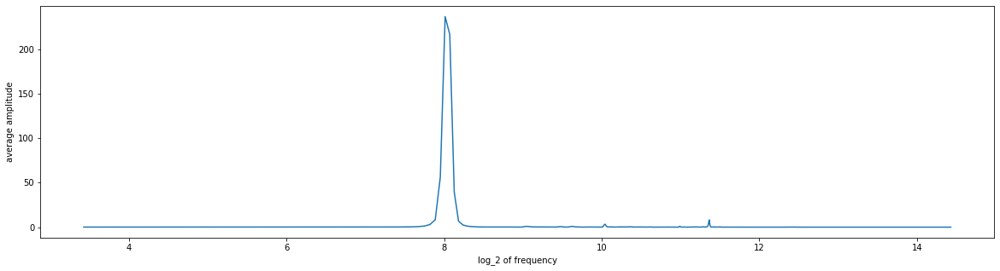

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                  2066
instrument_name      Vibraphone
note                         E6
expression         shortsustain
source                 Iowa2012
file_extension              aif
Name: 0, dtype: object
2066.aif
Analyzing sample...


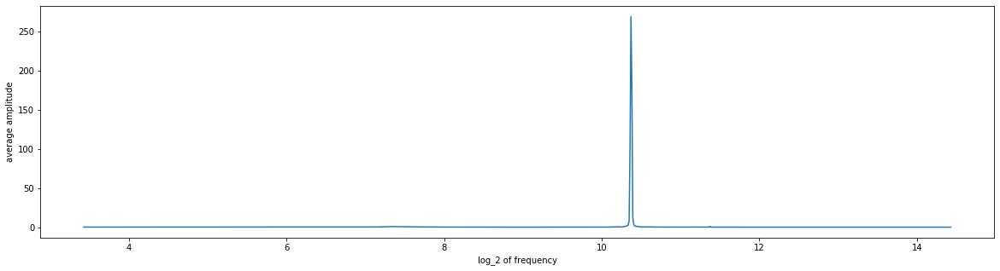

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                  2067
instrument_name      Vibraphone
note                        Gb3
expression         shortsustain
source                 Iowa2012
file_extension              aif
Name: 0, dtype: object
2067.aif
Analyzing sample...


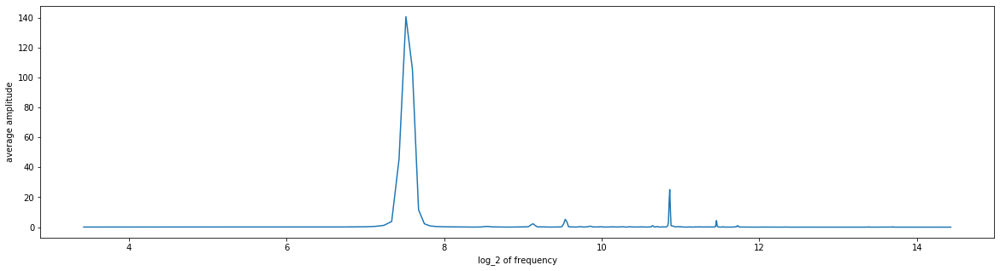

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                  2068
instrument_name      Vibraphone
note                        Bb5
expression         shortsustain
source                 Iowa2012
file_extension              aif
Name: 0, dtype: object
2068.aif
Analyzing sample...


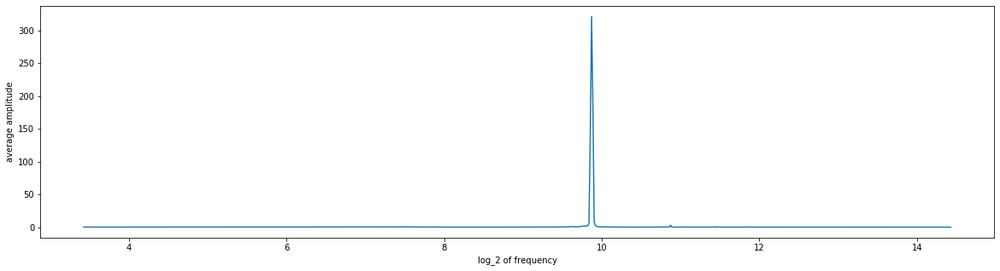

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                  2069
instrument_name      Vibraphone
note                        Eb5
expression         shortsustain
source                 Iowa2012
file_extension              aif
Name: 0, dtype: object
2069.aif
Analyzing sample...


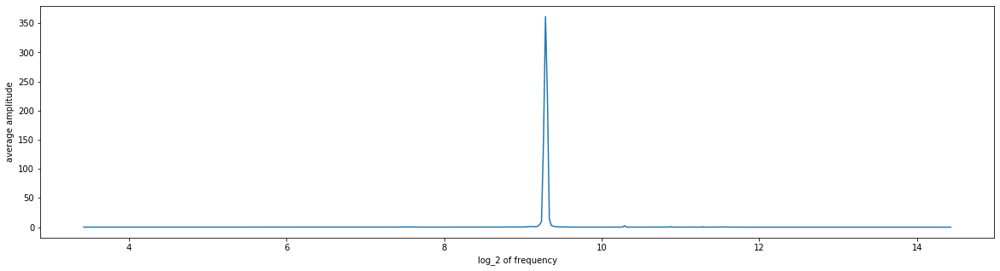

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                  2070
instrument_name      Vibraphone
note                         E3
expression         shortsustain
source                 Iowa2012
file_extension              aif
Name: 0, dtype: object
2070.aif
Analyzing sample...


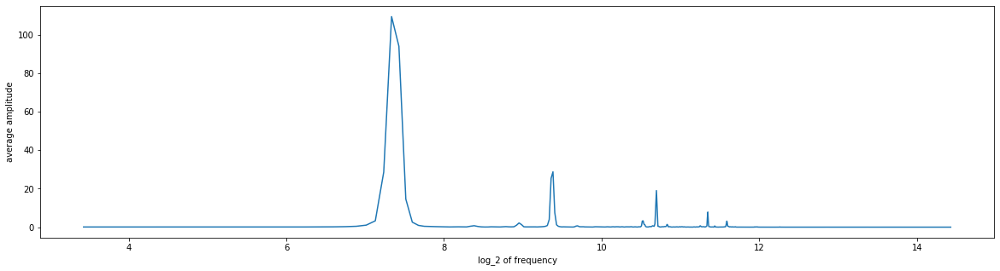

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                  2071
instrument_name      Vibraphone
note                         F4
expression         shortsustain
source                 Iowa2012
file_extension              aif
Name: 0, dtype: object
2071.aif
Analyzing sample...


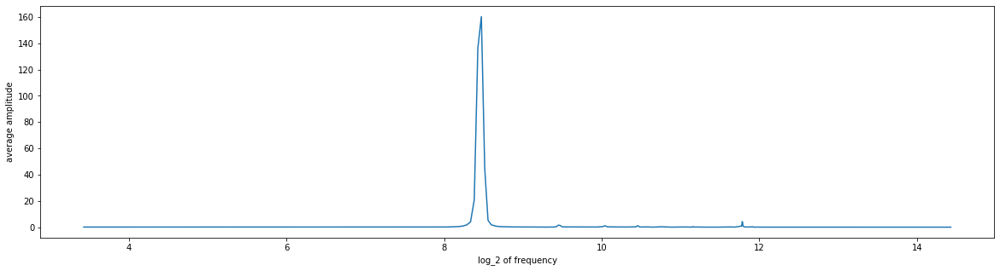

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                  2072
instrument_name      Vibraphone
note                         G5
expression         shortsustain
source                 Iowa2012
file_extension              aif
Name: 0, dtype: object
2072.aif
Analyzing sample...


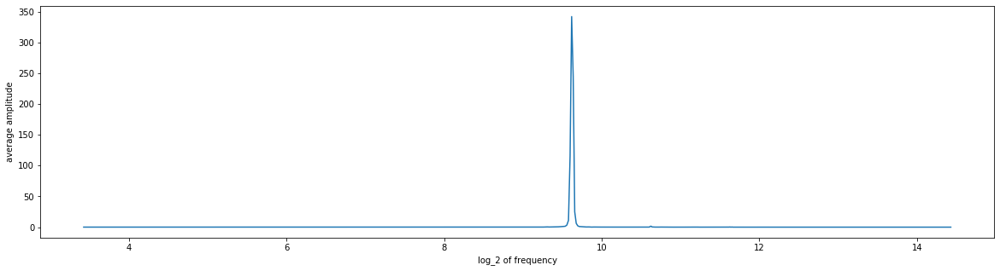

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                  2073
instrument_name      Vibraphone
note                        Ab3
expression         shortsustain
source                 Iowa2012
file_extension              aif
Name: 0, dtype: object
2073.aif
Analyzing sample...


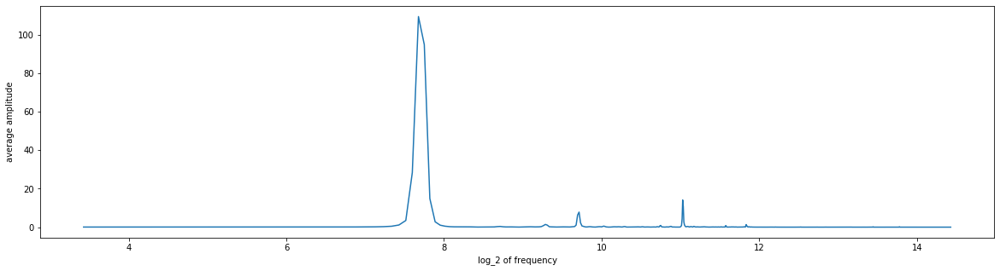

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                  2074
instrument_name      Vibraphone
note                        Ab4
expression         shortsustain
source                 Iowa2012
file_extension              aif
Name: 0, dtype: object
2074.aif
Analyzing sample...


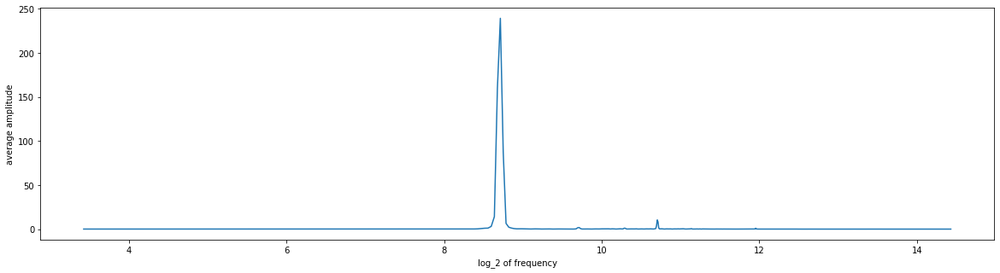

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                  2075
instrument_name      Vibraphone
note                         D5
expression         shortsustain
source                 Iowa2012
file_extension              aif
Name: 0, dtype: object
2075.aif
Analyzing sample...


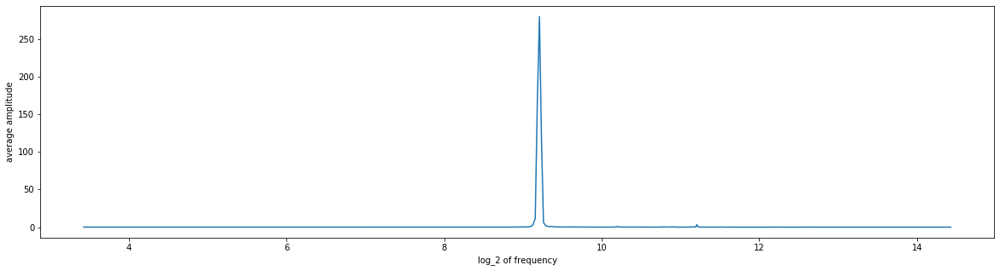

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                  2076
instrument_name      Vibraphone
note                         C6
expression         shortsustain
source                 Iowa2012
file_extension              aif
Name: 0, dtype: object
2076.aif
Analyzing sample...


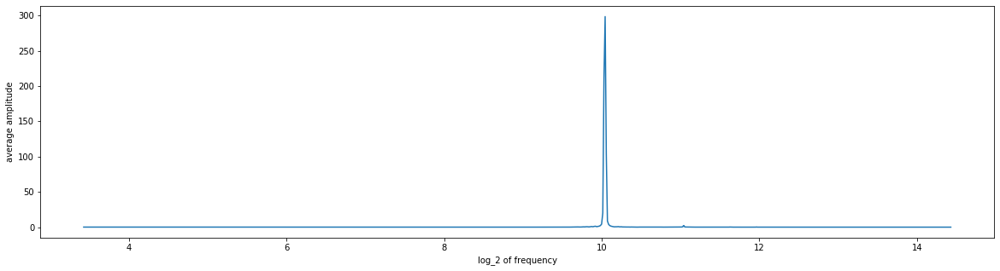

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                  2077
instrument_name      Vibraphone
note                         E4
expression         shortsustain
source                 Iowa2012
file_extension              aif
Name: 0, dtype: object
2077.aif
Analyzing sample...


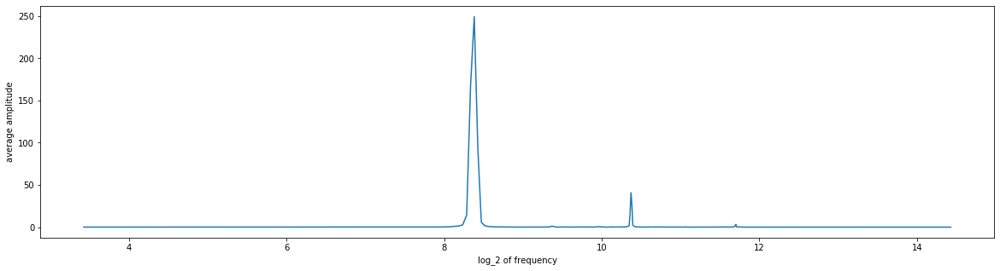

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                  2078
instrument_name      Vibraphone
note                         F3
expression         shortsustain
source                 Iowa2012
file_extension              aif
Name: 0, dtype: object
2078.aif
Analyzing sample...


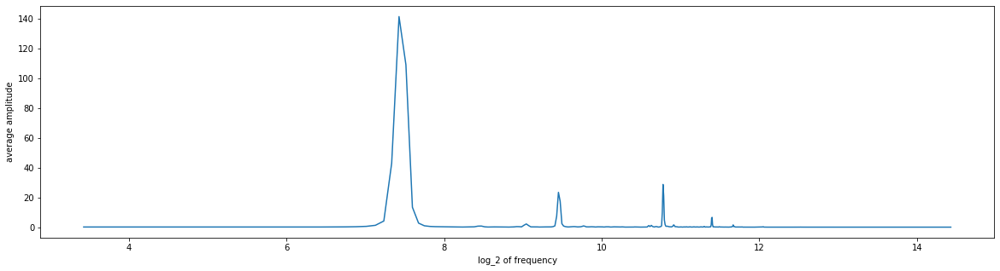

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                  2079
instrument_name      Vibraphone
note                        Gb4
expression         shortsustain
source                 Iowa2012
file_extension              aif
Name: 0, dtype: object
2079.aif
Analyzing sample...


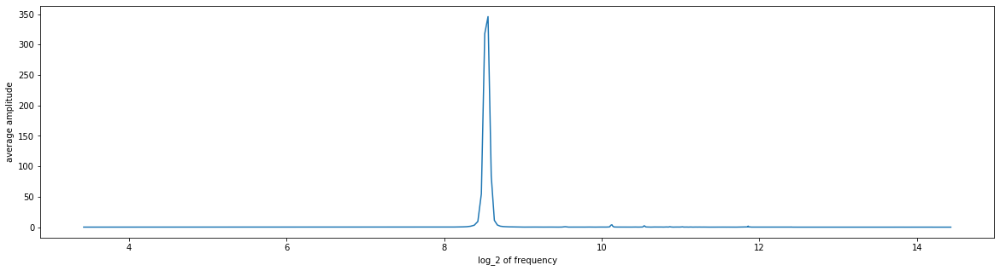

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                  2080
instrument_name      Vibraphone
note                         C3
expression         shortsustain
source                 Iowa2012
file_extension              aif
Name: 0, dtype: object
2080.aif
Analyzing sample...


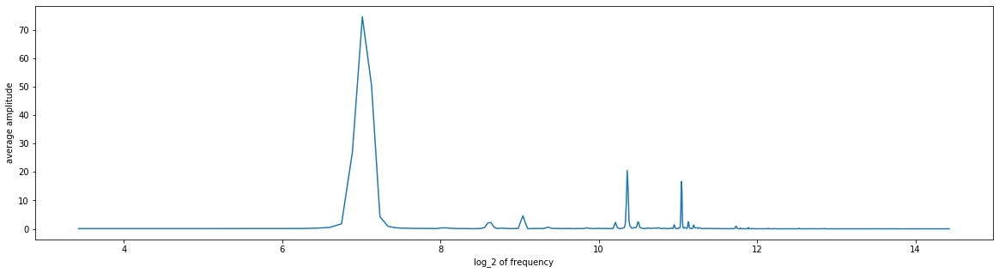

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                  2081
instrument_name      Vibraphone
note                         F6
expression         shortsustain
source                 Iowa2012
file_extension              aif
Name: 0, dtype: object
2081.aif
Analyzing sample...


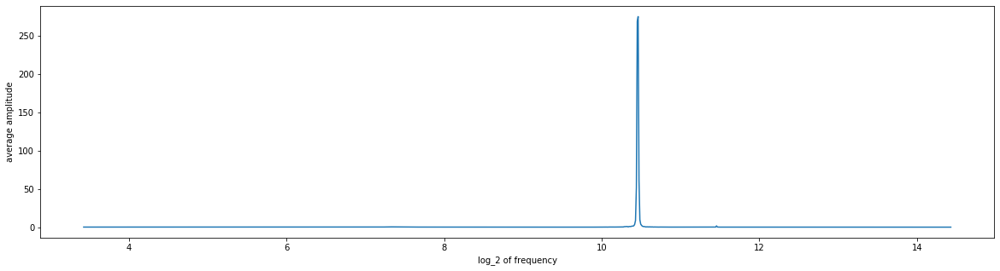

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                  2082
instrument_name      Vibraphone
note                         A5
expression         shortsustain
source                 Iowa2012
file_extension              aif
Name: 0, dtype: object
2082.aif
Analyzing sample...


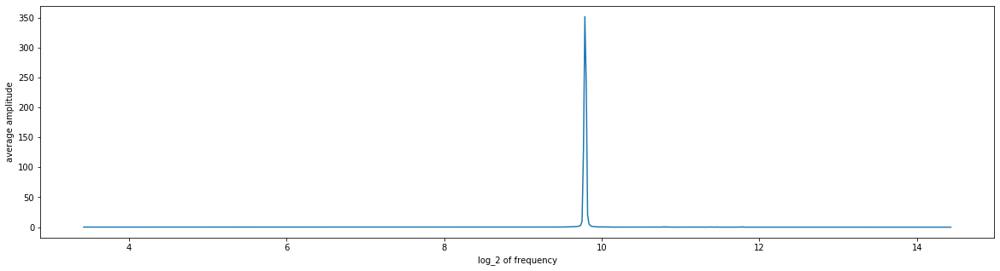

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                  2083
instrument_name      Vibraphone
note                        Bb4
expression         shortsustain
source                 Iowa2012
file_extension              aif
Name: 0, dtype: object
2083.aif
Analyzing sample...


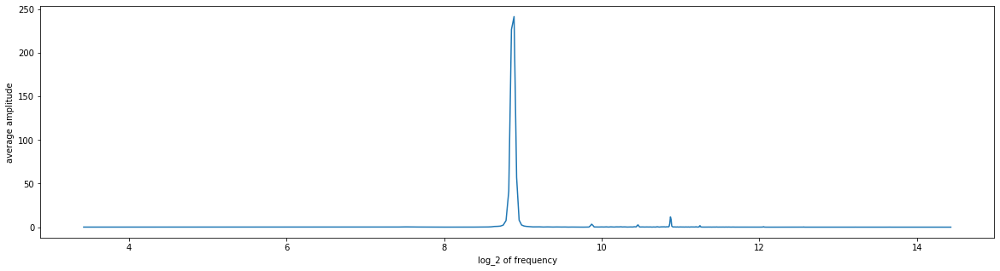

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                  2084
instrument_name      Vibraphone
note                        Eb4
expression         shortsustain
source                 Iowa2012
file_extension              aif
Name: 0, dtype: object
2084.aif
Analyzing sample...


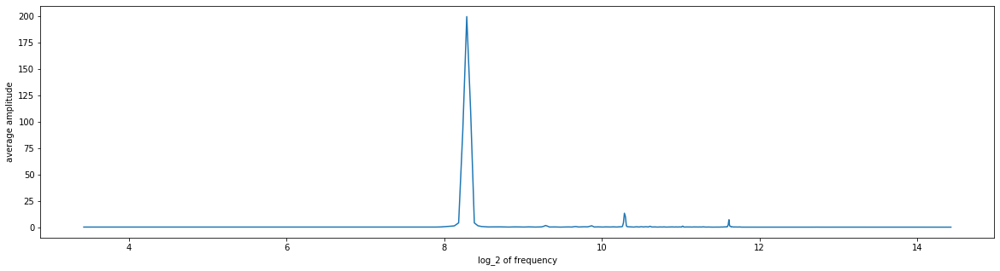

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                  2085
instrument_name      Vibraphone
note                         F5
expression         shortsustain
source                 Iowa2012
file_extension              aif
Name: 0, dtype: object
2085.aif
Analyzing sample...


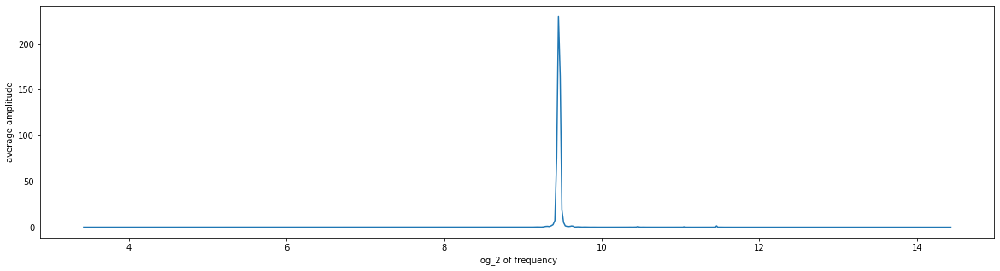

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                  2086
instrument_name      Vibraphone
note                         G4
expression         shortsustain
source                 Iowa2012
file_extension              aif
Name: 0, dtype: object
2086.aif
Analyzing sample...


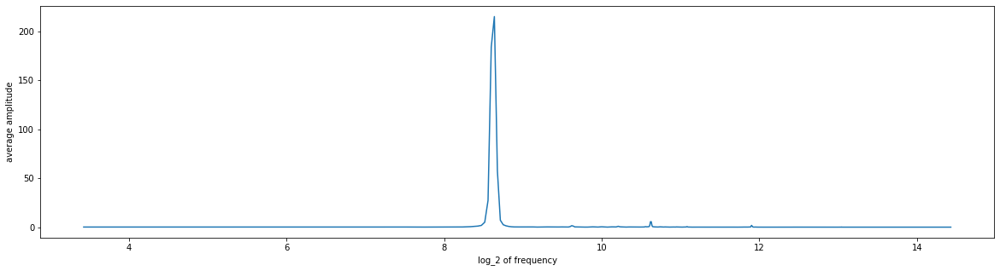

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                  2087
instrument_name      Vibraphone
note                         D3
expression         shortsustain
source                 Iowa2012
file_extension              aif
Name: 0, dtype: object
2087.aif
Analyzing sample...


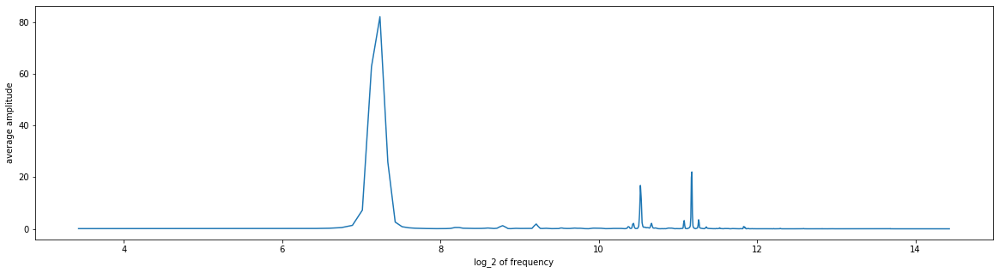

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                  2088
instrument_name      Vibraphone
note                         D6
expression         shortsustain
source                 Iowa2012
file_extension              aif
Name: 0, dtype: object
2088.aif
Analyzing sample...


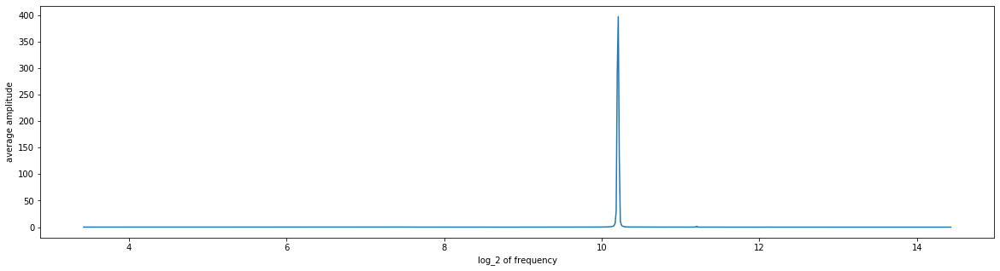

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                  2089
instrument_name      Vibraphone
note                         B4
expression         shortsustain
source                 Iowa2012
file_extension              aif
Name: 0, dtype: object
2089.aif
Analyzing sample...


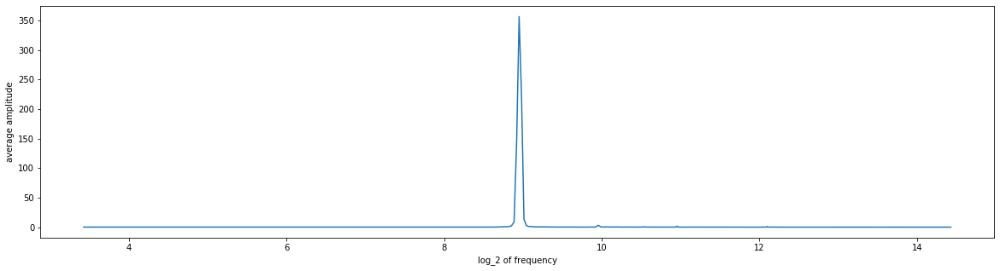

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                  2090
instrument_name      Vibraphone
note                         A3
expression         shortsustain
source                 Iowa2012
file_extension              aif
Name: 0, dtype: object
2090.aif
Analyzing sample...


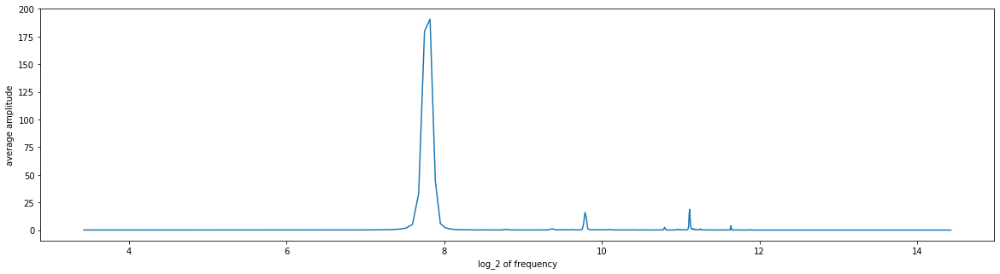

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                  2091
instrument_name      Vibraphone
note                        Db4
expression         shortsustain
source                 Iowa2012
file_extension              aif
Name: 0, dtype: object
2091.aif
Analyzing sample...


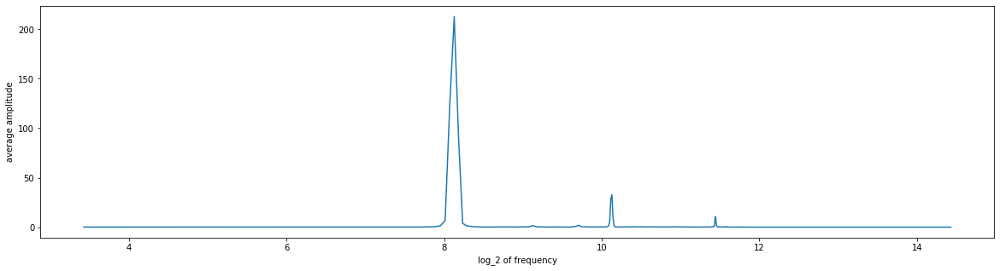

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                  2092
instrument_name      Vibraphone
note                         C5
expression         shortsustain
source                 Iowa2012
file_extension              aif
Name: 0, dtype: object
2092.aif
Analyzing sample...


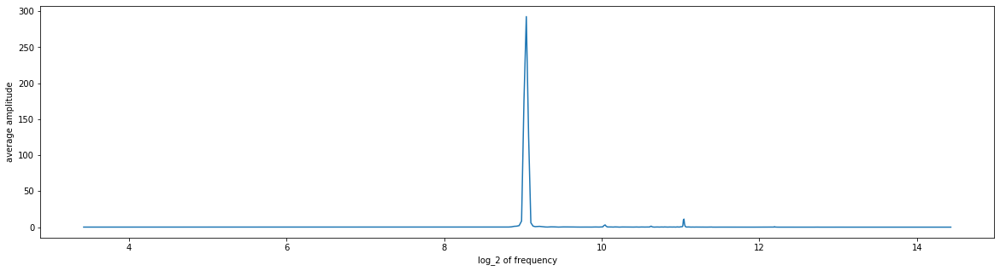

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                  2093
instrument_name      Vibraphone
note                        Gb5
expression         shortsustain
source                 Iowa2012
file_extension              aif
Name: 0, dtype: object
2093.aif
Analyzing sample...


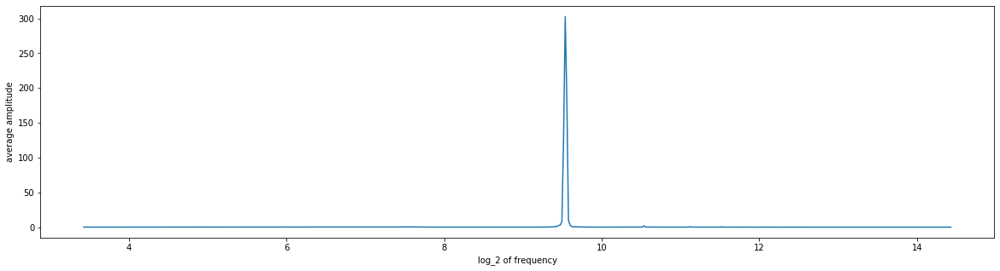

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                  2094
instrument_name      Vibraphone
note                        Eb6
expression         shortsustain
source                 Iowa2012
file_extension              aif
Name: 0, dtype: object
2094.aif
Analyzing sample...


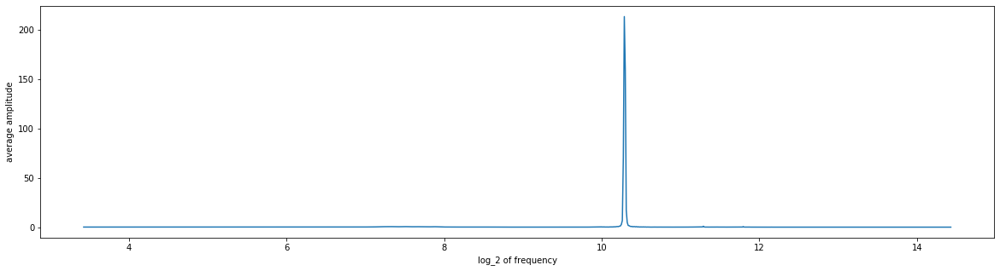

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                  2095
instrument_name      Vibraphone
note                        Db3
expression         shortsustain
source                 Iowa2012
file_extension              aif
Name: 0, dtype: object
2095.aif
Analyzing sample...


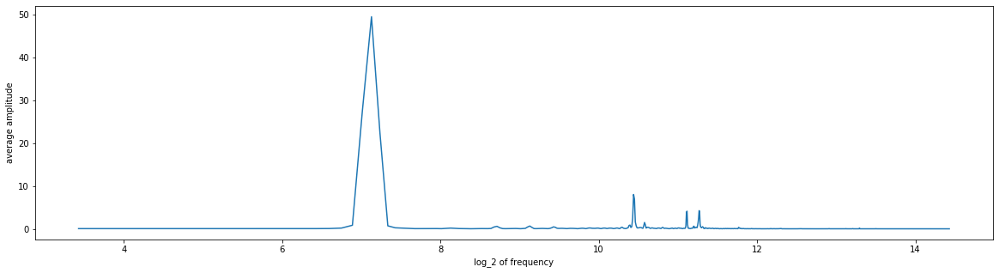

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                  2096
instrument_name      Vibraphone
note                         B3
expression         shortsustain
source                 Iowa2012
file_extension              aif
Name: 0, dtype: object
2096.aif
Analyzing sample...


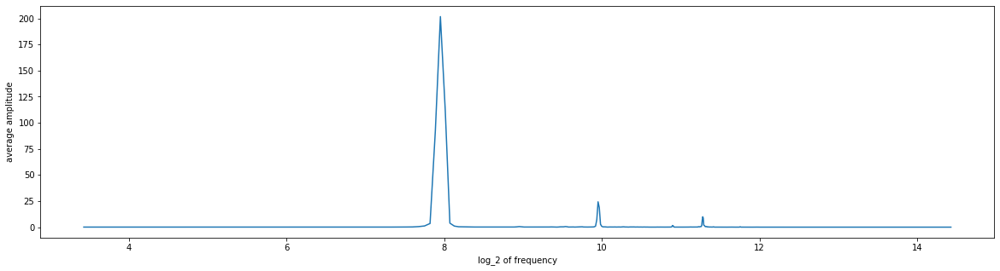

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                  2097
instrument_name      Vibraphone
note                         A4
expression         shortsustain
source                 Iowa2012
file_extension              aif
Name: 0, dtype: object
2097.aif
Analyzing sample...


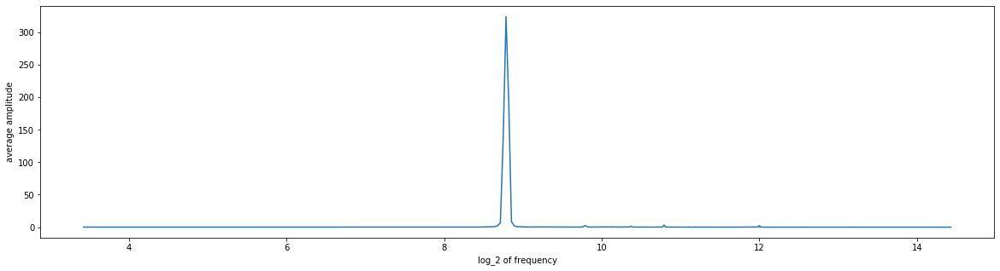

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                  2098
instrument_name      Vibraphone
note                        Db6
expression         shortsustain
source                 Iowa2012
file_extension              aif
Name: 0, dtype: object
2098.aif
Analyzing sample...


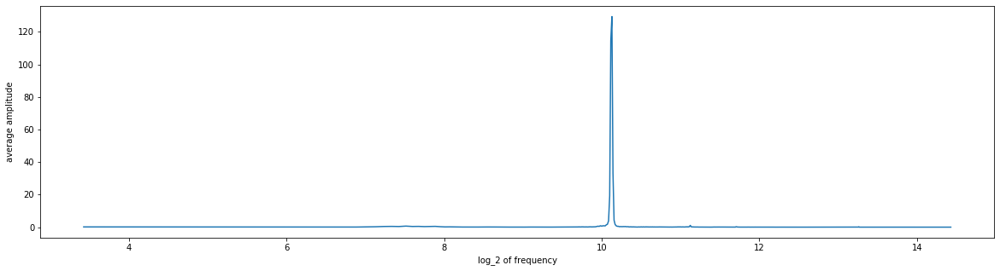

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                  2099
instrument_name      Vibraphone
note                         G3
expression         shortsustain
source                 Iowa2012
file_extension              aif
Name: 0, dtype: object
2099.aif
Analyzing sample...


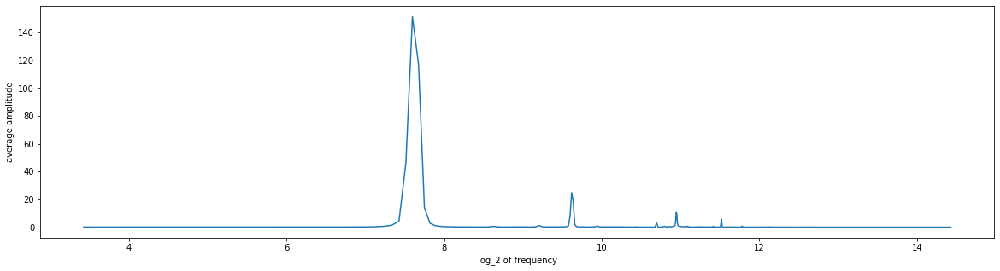

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                  2100
instrument_name      Vibraphone
note                         D4
expression         shortsustain
source                 Iowa2012
file_extension              aif
Name: 0, dtype: object
2100.aif
Analyzing sample...


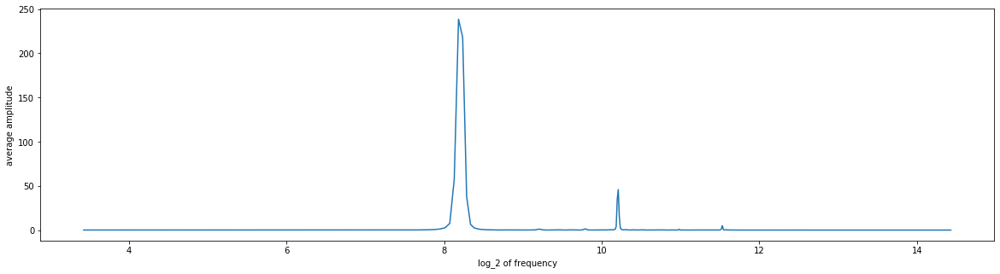

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                  2101
instrument_name      Vibraphone
note                        Ab5
expression         shortsustain
source                 Iowa2012
file_extension              aif
Name: 0, dtype: object
2101.aif
Analyzing sample...


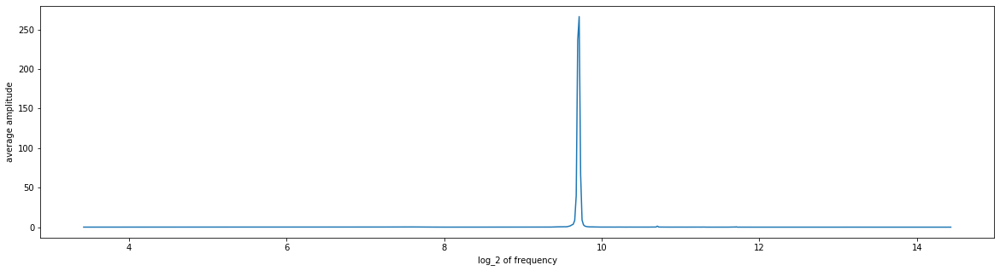

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                  2102
instrument_name      Vibraphone
note                         E5
expression         shortsustain
source                 Iowa2012
file_extension              aif
Name: 0, dtype: object
2102.aif
Analyzing sample...


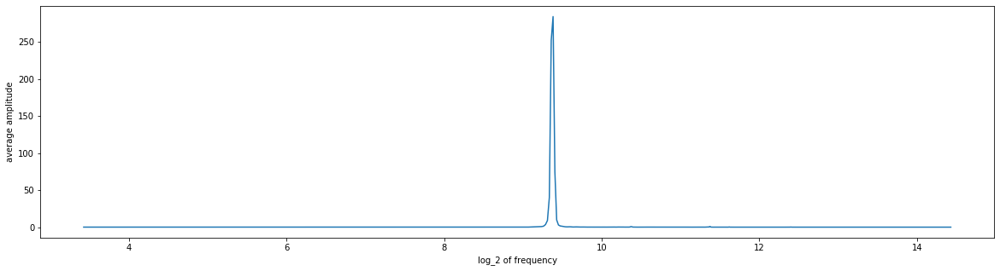

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                  2103
instrument_name      Vibraphone
note                        Bb3
expression         shortsustain
source                 Iowa2012
file_extension              aif
Name: 0, dtype: object
2103.aif
Analyzing sample...


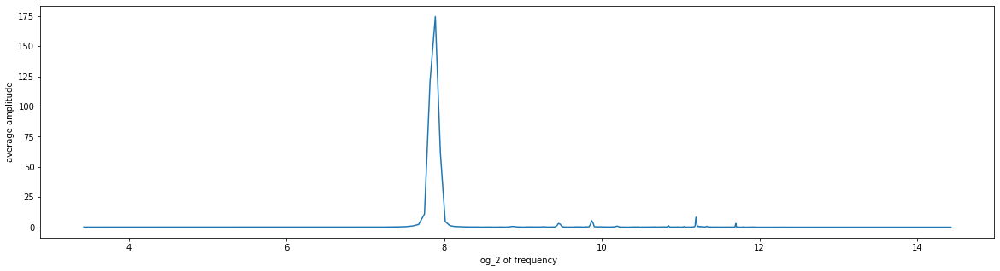

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                  2104
instrument_name      Vibraphone
note                        Eb3
expression         shortsustain
source                 Iowa2012
file_extension              aif
Name: 0, dtype: object
2104.aif
Analyzing sample...


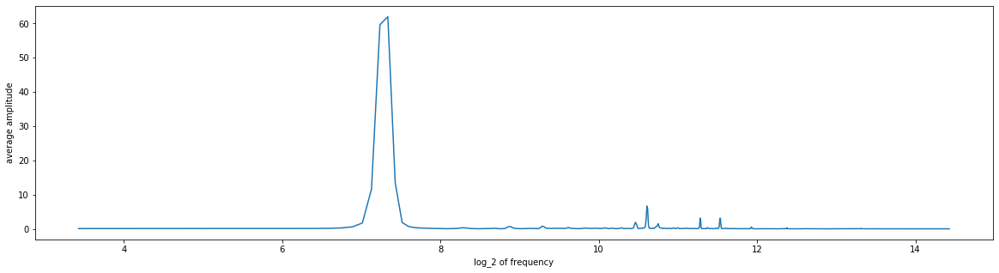

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2105
instrument_name    Vibraphone
note                      Db6
expression             dampen
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2105.aif
Analyzing sample...


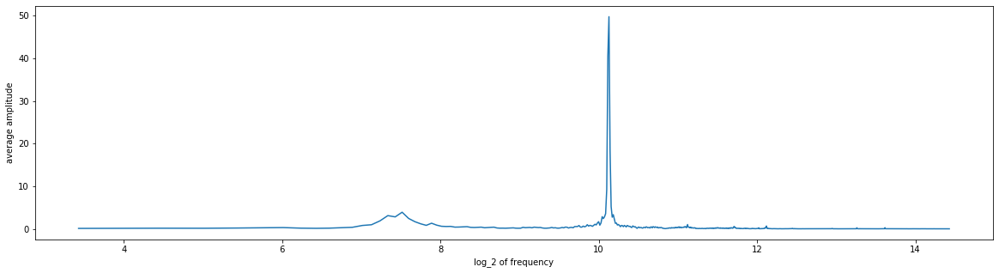

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2106
instrument_name    Vibraphone
note                       F5
expression             dampen
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2106.aif
Analyzing sample...


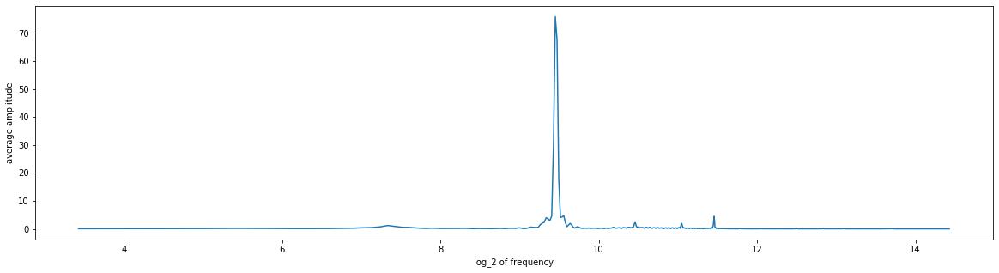

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2107
instrument_name    Vibraphone
note                      Ab5
expression             dampen
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2107.aif
Analyzing sample...


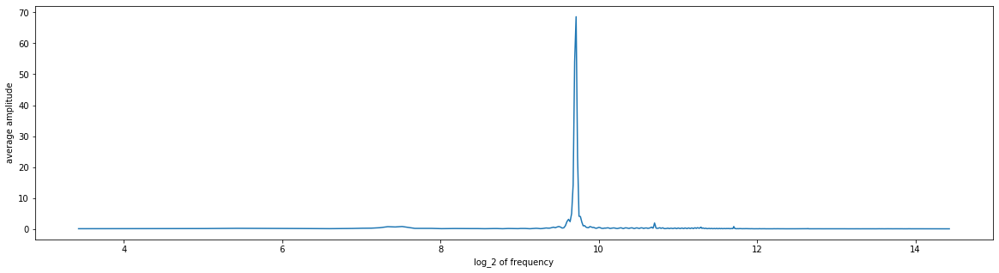

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2108
instrument_name    Vibraphone
note                       G4
expression             dampen
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2108.aif
Analyzing sample...


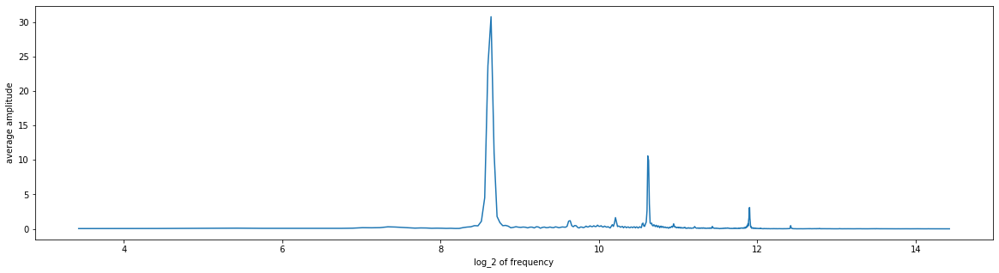

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2109
instrument_name    Vibraphone
note                       D3
expression             dampen
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2109.aif
Analyzing sample...


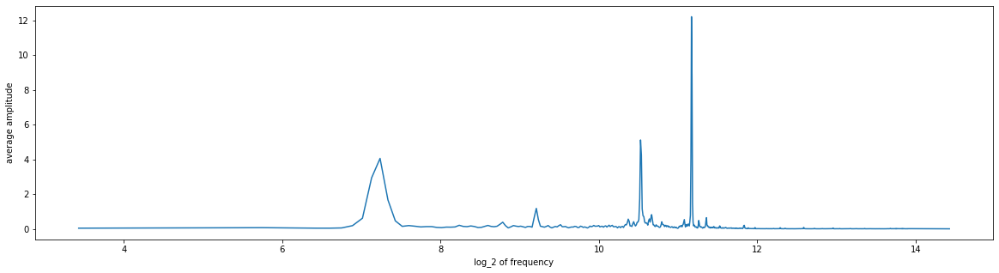

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2110
instrument_name    Vibraphone
note                      Eb3
expression             dampen
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2110.aif
Analyzing sample...


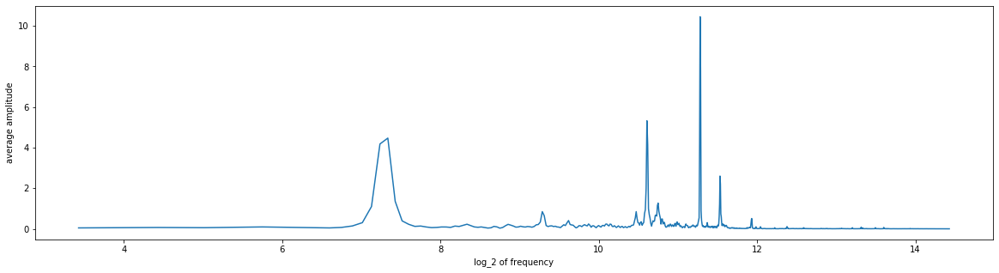

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2111
instrument_name    Vibraphone
note                      Bb3
expression             dampen
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2111.aif
Analyzing sample...


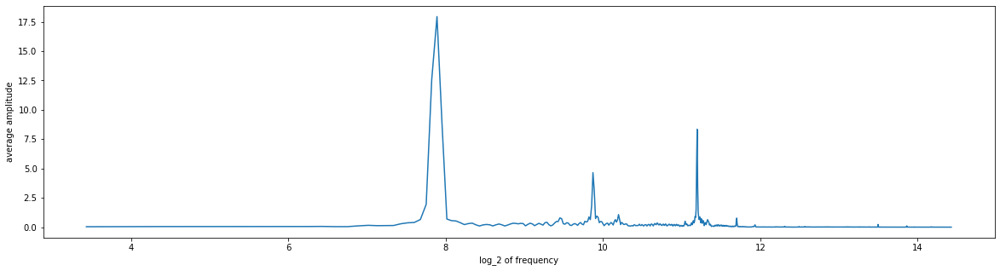

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2112
instrument_name    Vibraphone
note                       B4
expression             dampen
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2112.aif
Analyzing sample...


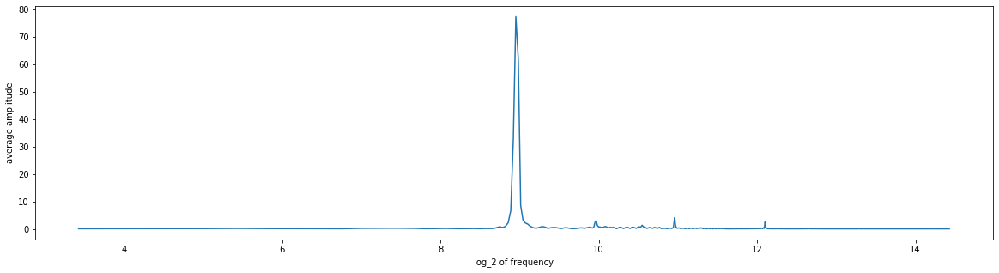

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2113
instrument_name    Vibraphone
note                       A3
expression             dampen
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2113.aif
Analyzing sample...


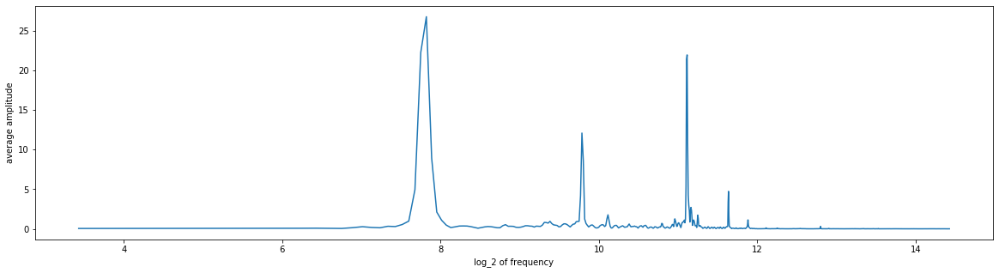

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2114
instrument_name    Vibraphone
note                      Gb5
expression             dampen
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2114.aif
Analyzing sample...


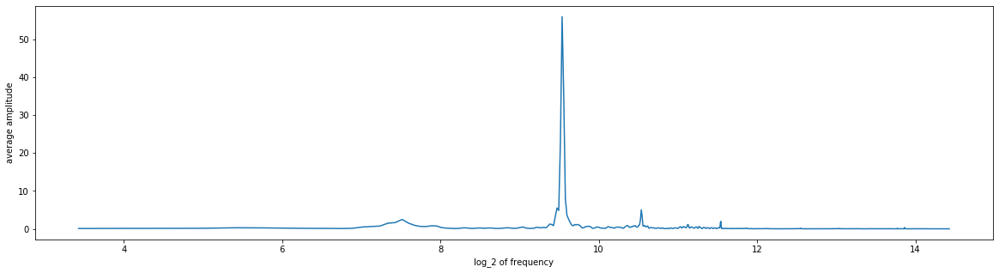

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2115
instrument_name    Vibraphone
note                       D6
expression             dampen
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2115.aif
Analyzing sample...


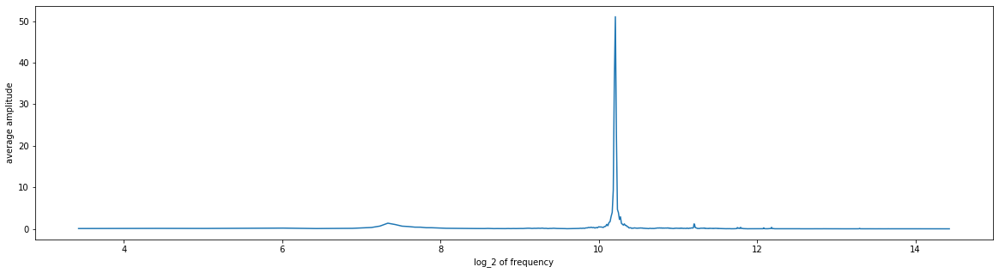

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2116
instrument_name    Vibraphone
note                      Eb6
expression             dampen
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2116.aif
Analyzing sample...


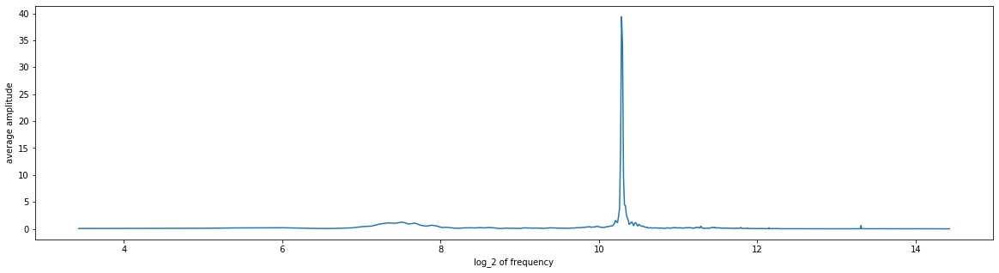

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2117
instrument_name    Vibraphone
note                      Db3
expression             dampen
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2117.aif
Analyzing sample...


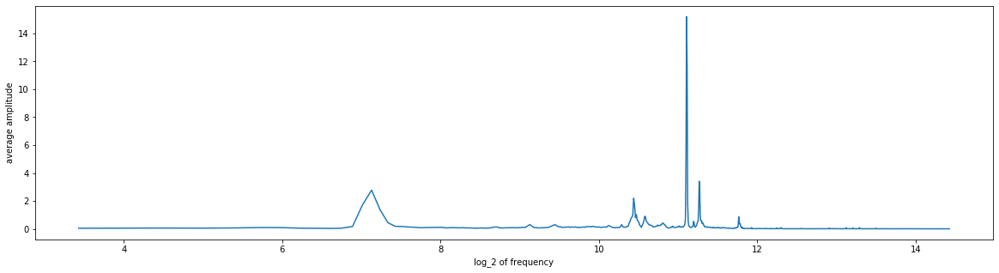

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2118
instrument_name    Vibraphone
note                       C5
expression             dampen
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2118.aif
Analyzing sample...


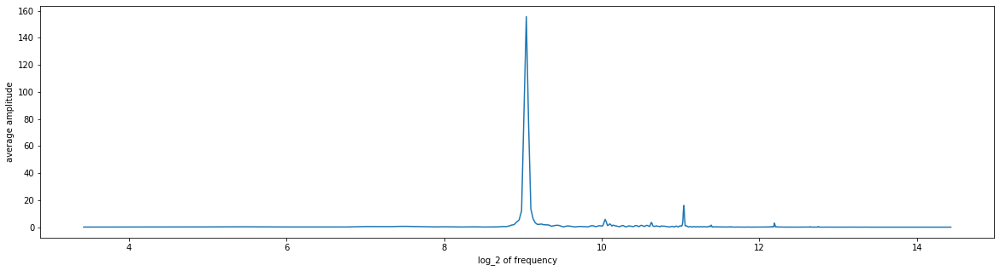

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2119
instrument_name    Vibraphone
note                      Db4
expression             dampen
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2119.aif
Analyzing sample...


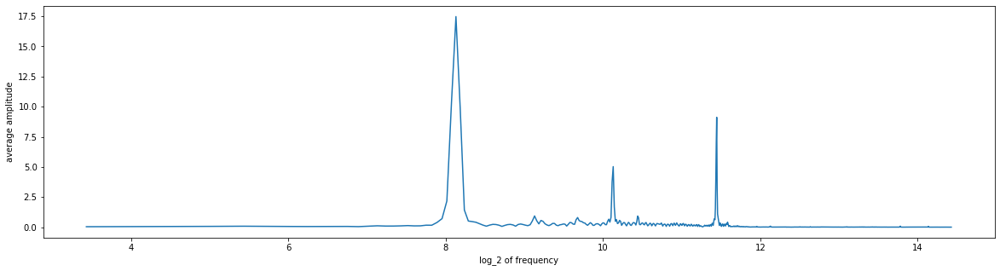

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2120
instrument_name    Vibraphone
note                       B3
expression             dampen
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2120.aif
Analyzing sample...


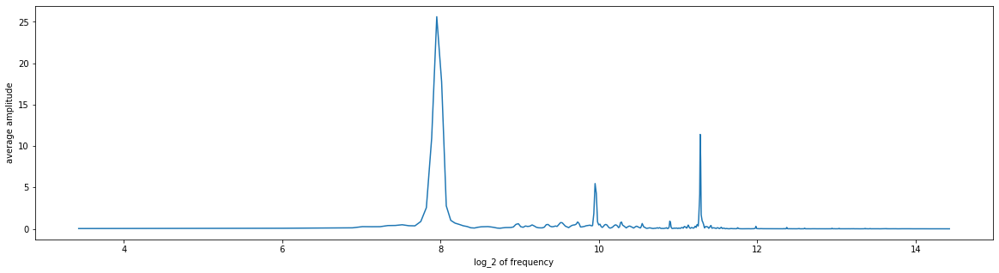

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2121
instrument_name    Vibraphone
note                       A4
expression             dampen
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2121.aif
Analyzing sample...


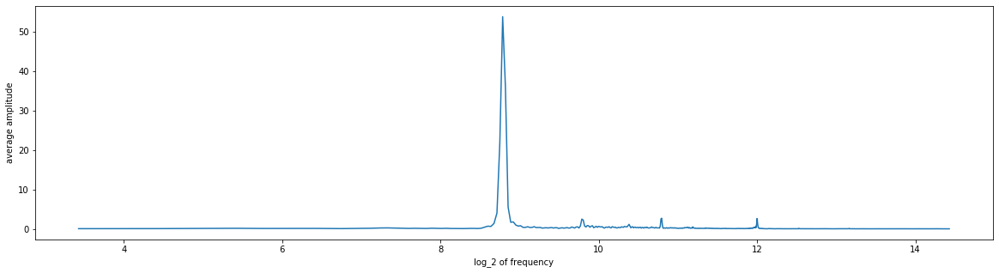

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2122
instrument_name    Vibraphone
note                      Eb4
expression             dampen
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2122.aif
Analyzing sample...


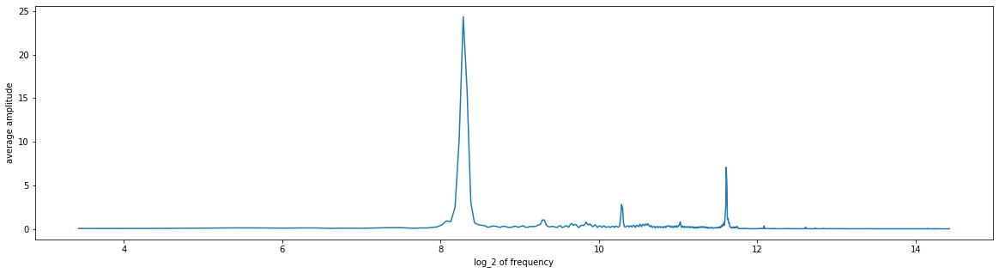

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2123
instrument_name    Vibraphone
note                      Bb4
expression             dampen
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2123.aif
Analyzing sample...


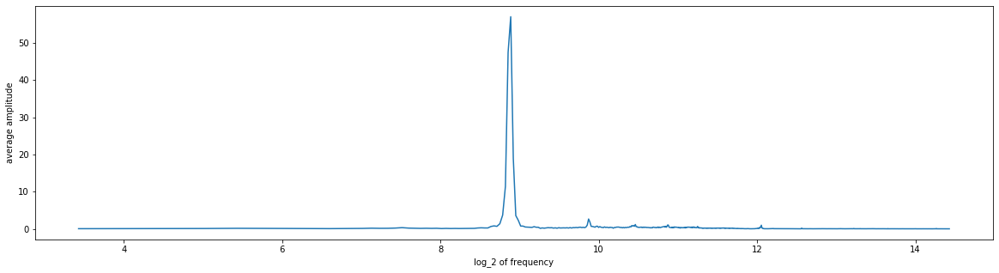

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2124
instrument_name    Vibraphone
note                       G3
expression             dampen
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2124.aif
Analyzing sample...


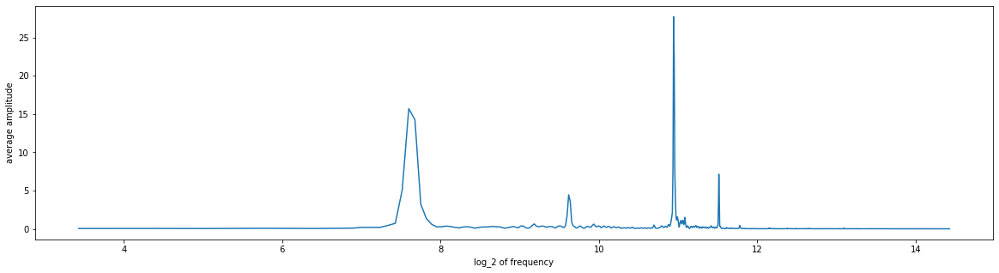

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2125
instrument_name    Vibraphone
note                       D4
expression             dampen
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2125.aif
Analyzing sample...


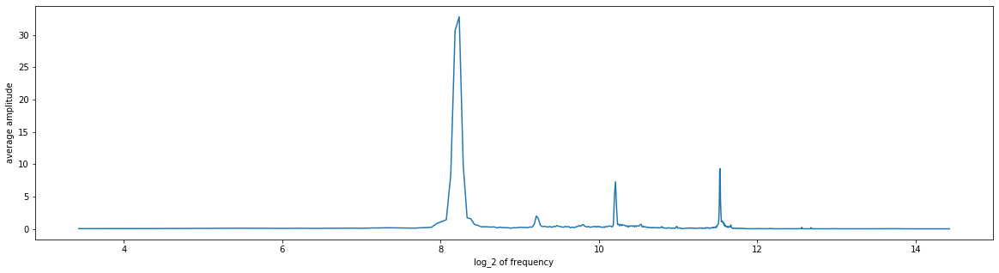

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2126
instrument_name    Vibraphone
note                       E5
expression             dampen
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2126.aif
Analyzing sample...


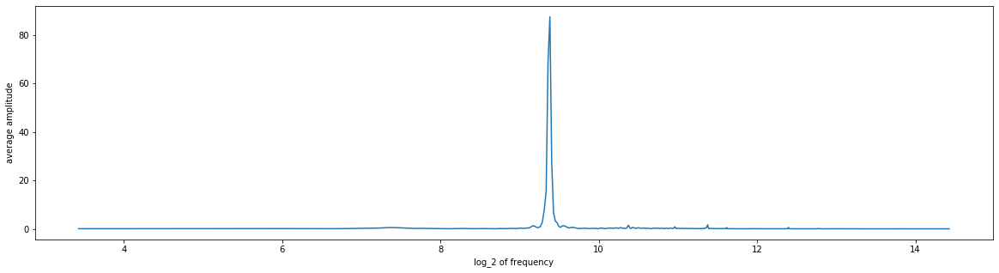

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2127
instrument_name    Vibraphone
note                       B5
expression             dampen
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2127.aif
Analyzing sample...


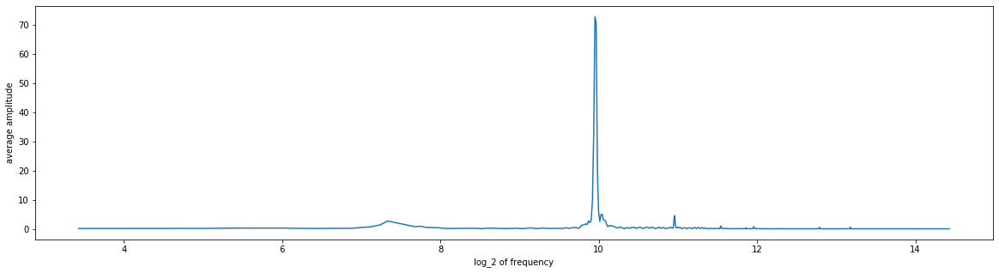

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2128
instrument_name    Vibraphone
note                      Gb4
expression             dampen
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2128.aif
Analyzing sample...


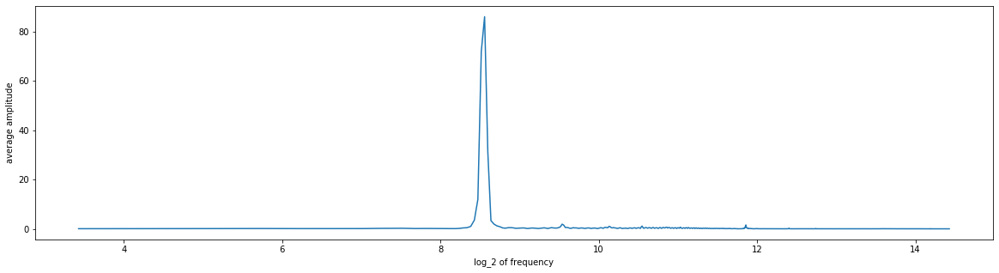

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2129
instrument_name    Vibraphone
note                       E6
expression             dampen
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2129.aif
Analyzing sample...


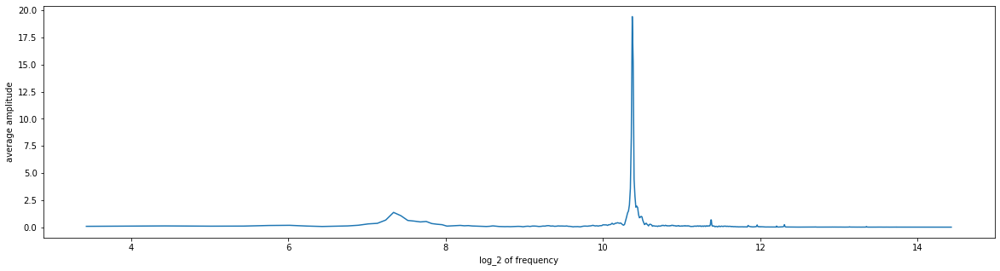

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2130
instrument_name    Vibraphone
note                       C4
expression             dampen
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2130.aif
Analyzing sample...


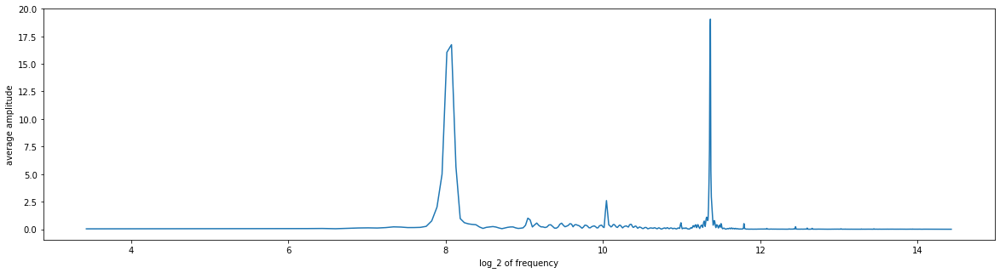

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2131
instrument_name    Vibraphone
note                       E3
expression             dampen
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2131.aif
Analyzing sample...


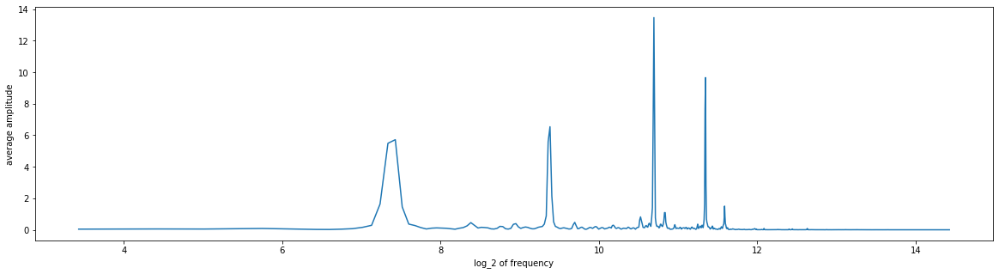

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2132
instrument_name    Vibraphone
note                       F4
expression             dampen
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2132.aif
Analyzing sample...


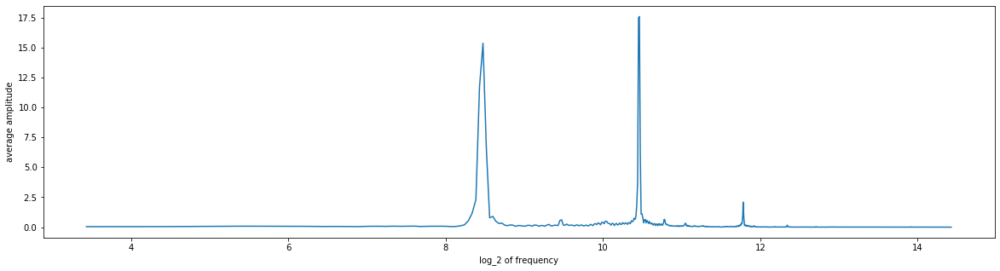

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2133
instrument_name    Vibraphone
note                      Ab4
expression             dampen
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2133.aif
Analyzing sample...


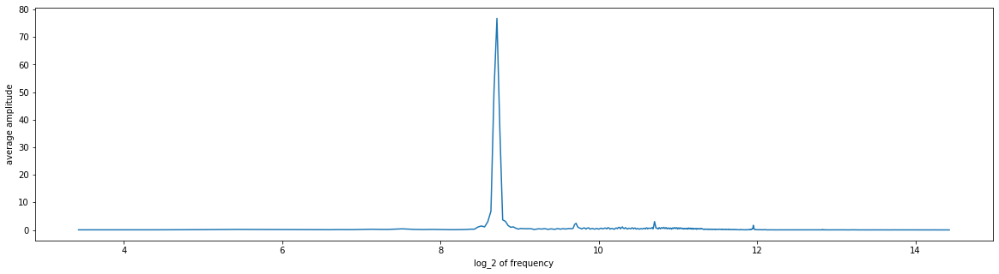

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2134
instrument_name    Vibraphone
note                       G5
expression             dampen
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2134.aif
Analyzing sample...


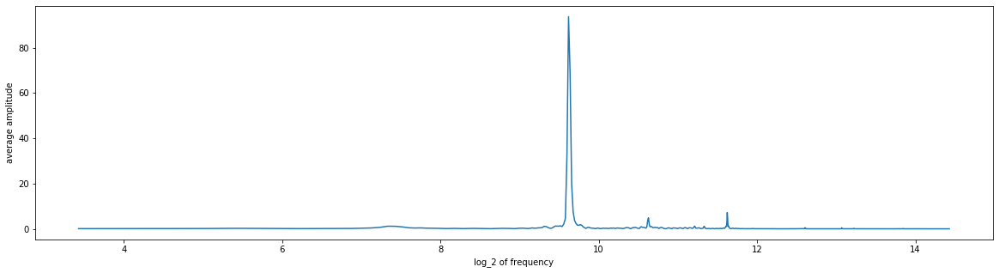

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2135
instrument_name    Vibraphone
note                      Eb5
expression             dampen
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2135.aif
Analyzing sample...


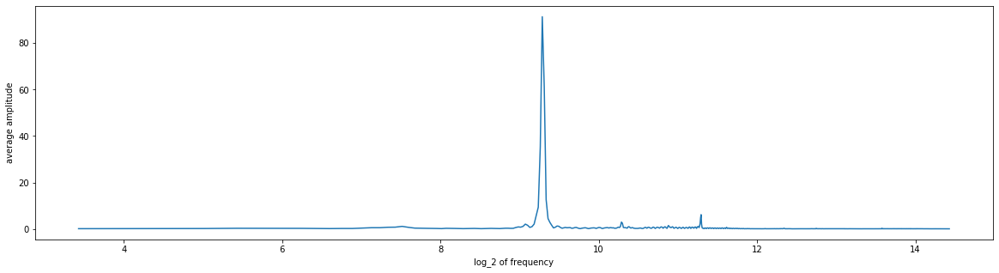

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2136
instrument_name    Vibraphone
note                      Bb5
expression             dampen
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2136.aif
Analyzing sample...


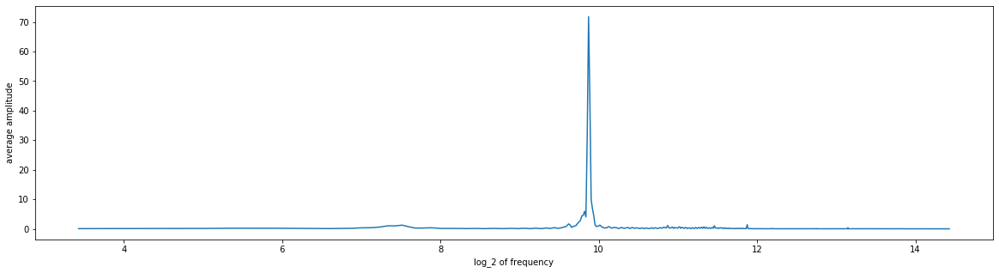

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2137
instrument_name    Vibraphone
note                       D5
expression             dampen
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2137.aif
Analyzing sample...


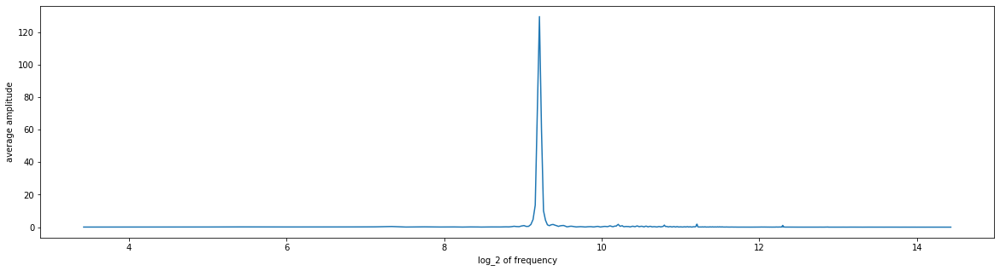

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2138
instrument_name    Vibraphone
note                       E4
expression             dampen
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2138.aif
Analyzing sample...


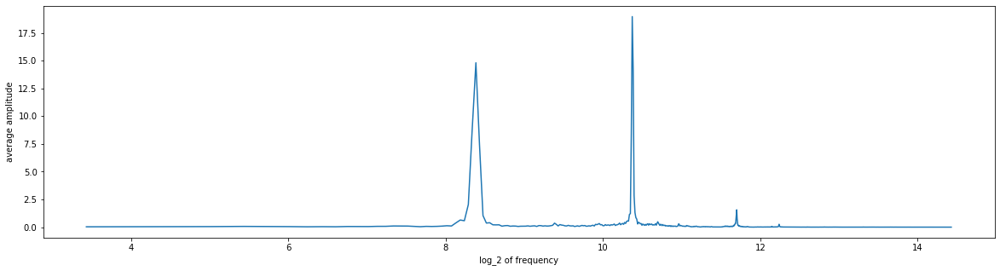

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2139
instrument_name    Vibraphone
note                       F3
expression             dampen
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2139.aif
Analyzing sample...


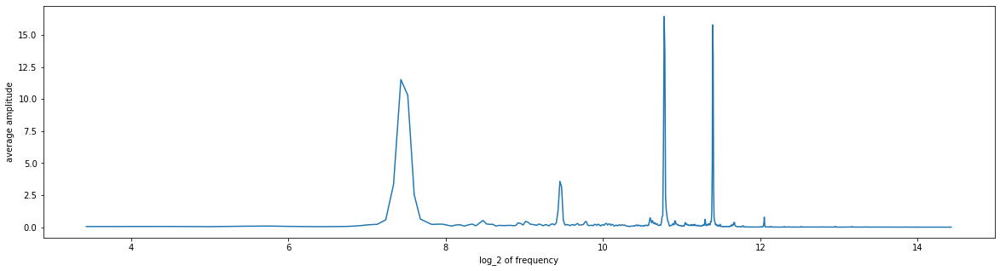

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2140
instrument_name    Vibraphone
note                      Ab3
expression             dampen
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2140.aif
Analyzing sample...


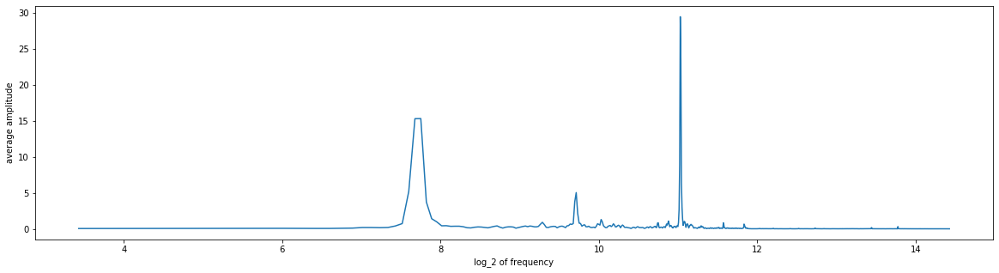

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2141
instrument_name    Vibraphone
note                       C6
expression             dampen
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2141.aif
Analyzing sample...


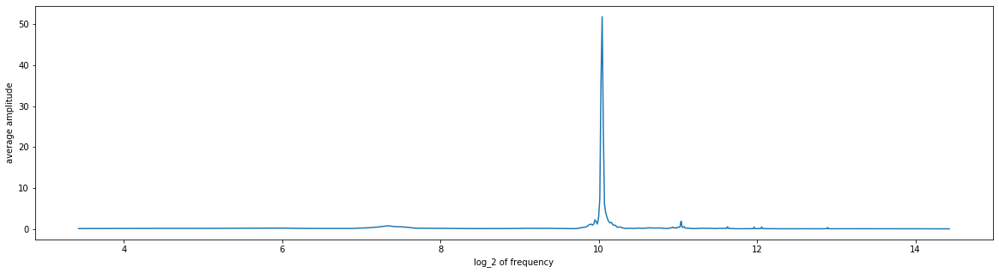

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2142
instrument_name    Vibraphone
note                       F6
expression             dampen
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2142.aif
Analyzing sample...


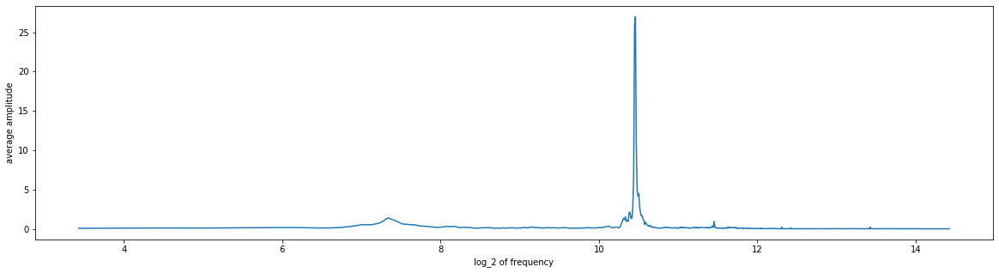

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2143
instrument_name    Vibraphone
note                       C3
expression             dampen
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2143.aif
Analyzing sample...


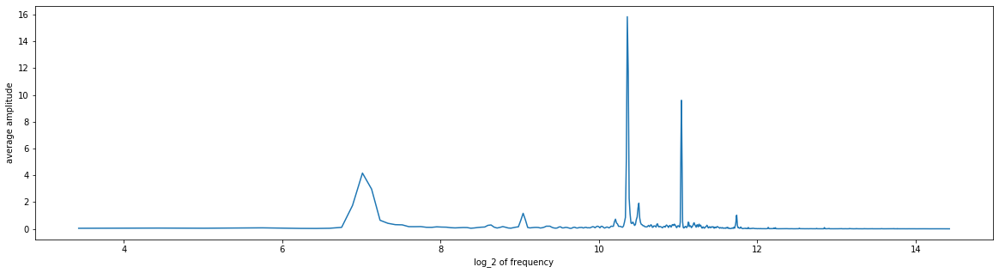

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2144
instrument_name    Vibraphone
note                      Db5
expression             dampen
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2144.aif
Analyzing sample...


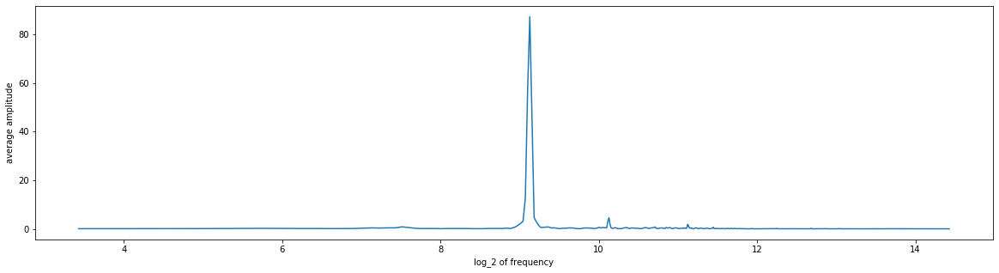

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2145
instrument_name    Vibraphone
note                       A5
expression             dampen
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2145.aif
Analyzing sample...


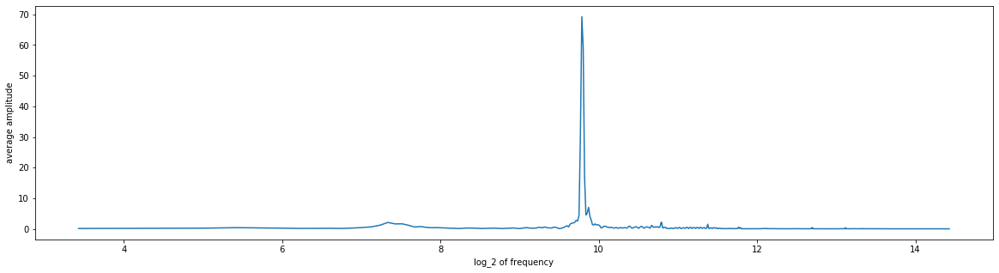

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2146
instrument_name    Vibraphone
note                      Gb3
expression             dampen
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2146.aif
Analyzing sample...


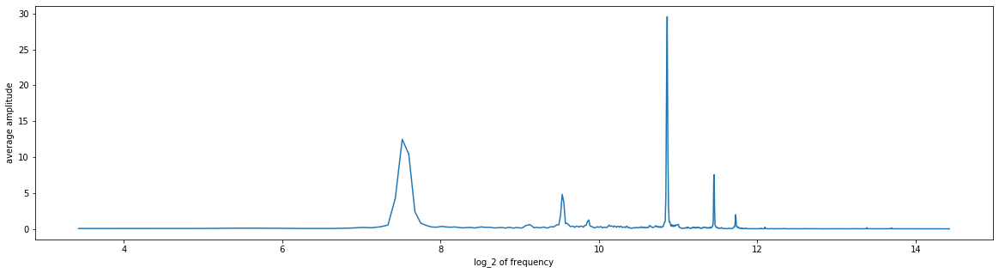

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2147
instrument_name    Vibraphone
note                      Db6
expression             dampen
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2147.aif
Analyzing sample...


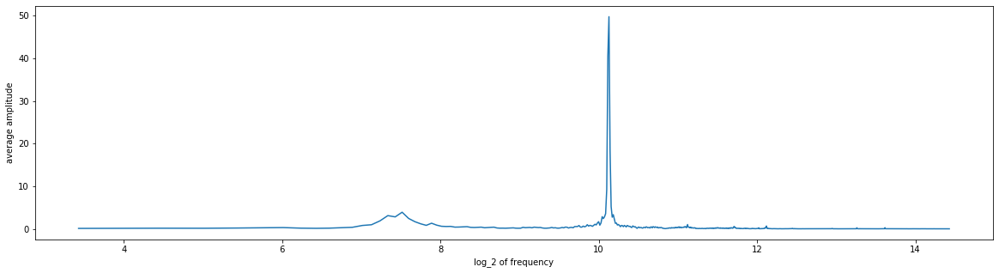

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2148
instrument_name    Vibraphone
note                       F5
expression             dampen
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2148.aif
Analyzing sample...


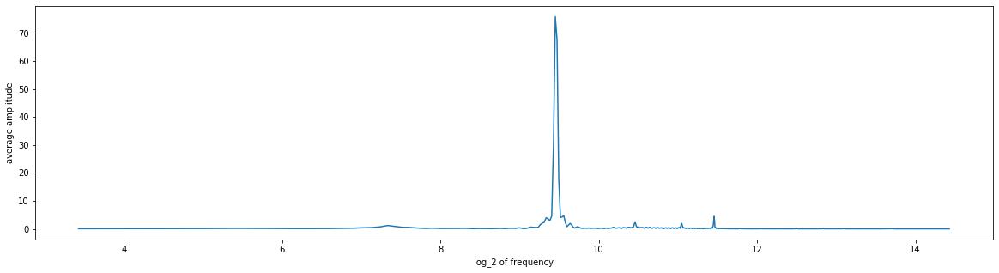

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2149
instrument_name    Vibraphone
note                      Ab5
expression             dampen
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2149.aif
Analyzing sample...


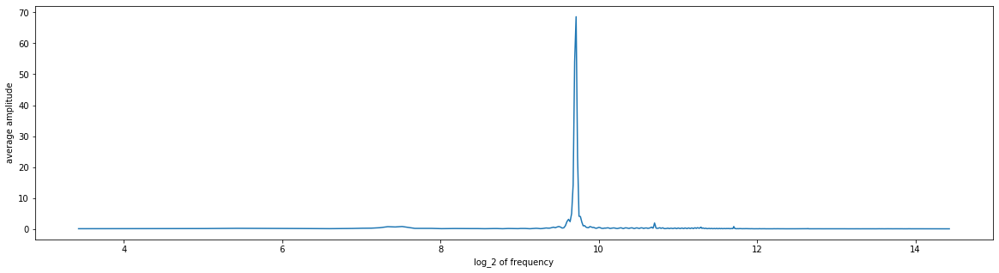

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2150
instrument_name    Vibraphone
note                       G4
expression             dampen
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2150.aif
Analyzing sample...


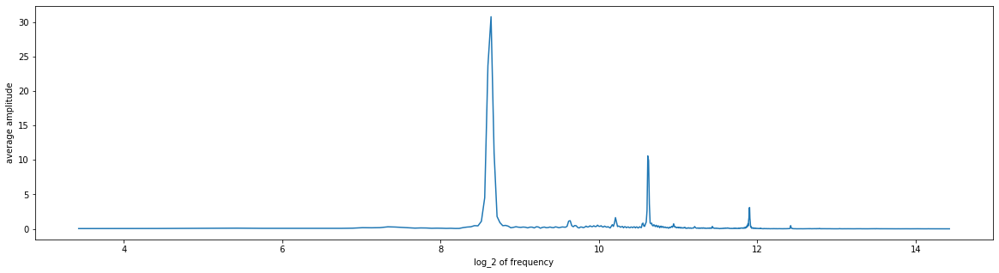

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2151
instrument_name    Vibraphone
note                       D3
expression             dampen
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2151.aif
Analyzing sample...


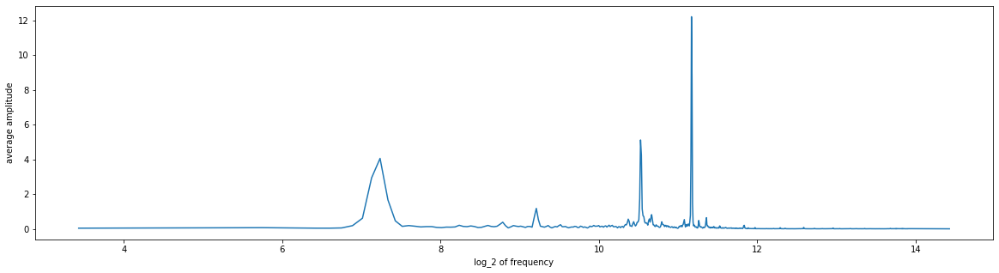

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2152
instrument_name    Vibraphone
note                      Eb3
expression             dampen
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2152.aif
Analyzing sample...


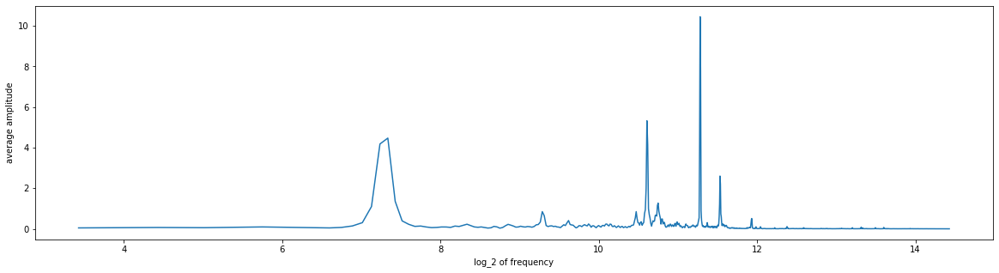

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2153
instrument_name    Vibraphone
note                      Bb3
expression             dampen
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2153.aif
Analyzing sample...


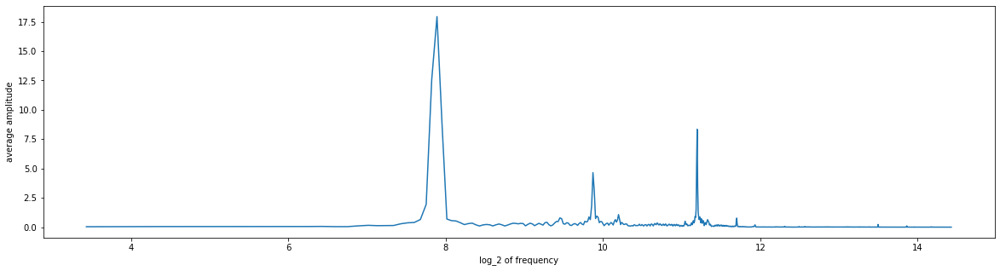

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2154
instrument_name    Vibraphone
note                       B4
expression             dampen
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2154.aif
Analyzing sample...


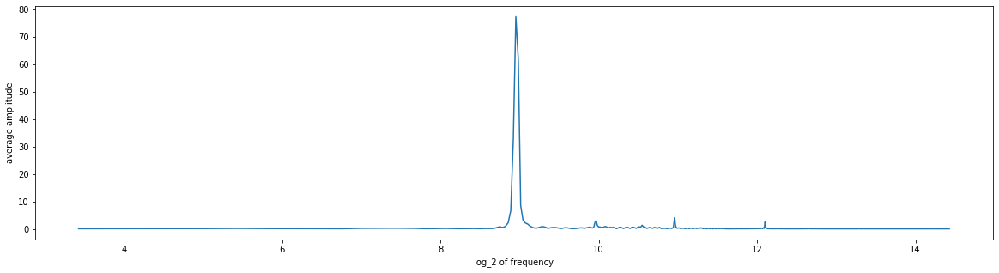

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2155
instrument_name    Vibraphone
note                       A3
expression             dampen
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2155.aif
Analyzing sample...


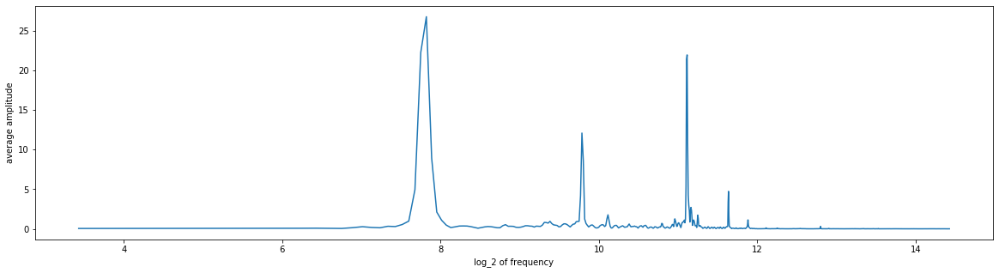

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2156
instrument_name    Vibraphone
note                      Gb5
expression             dampen
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2156.aif
Analyzing sample...


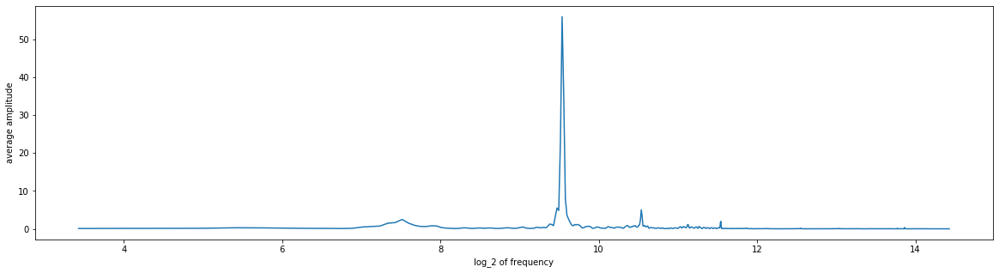

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2157
instrument_name    Vibraphone
note                       D6
expression             dampen
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2157.aif
Analyzing sample...


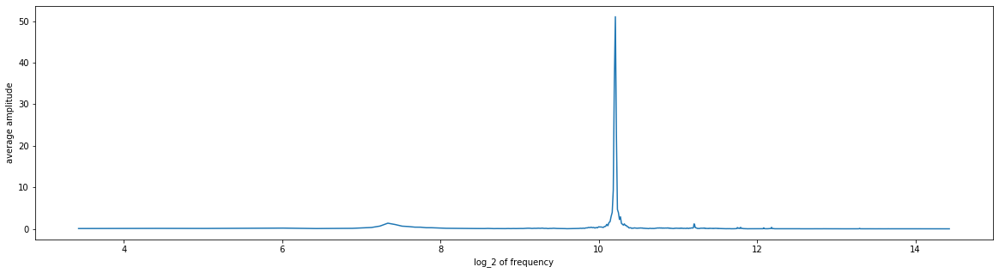

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2158
instrument_name    Vibraphone
note                      Eb6
expression             dampen
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2158.aif
Analyzing sample...


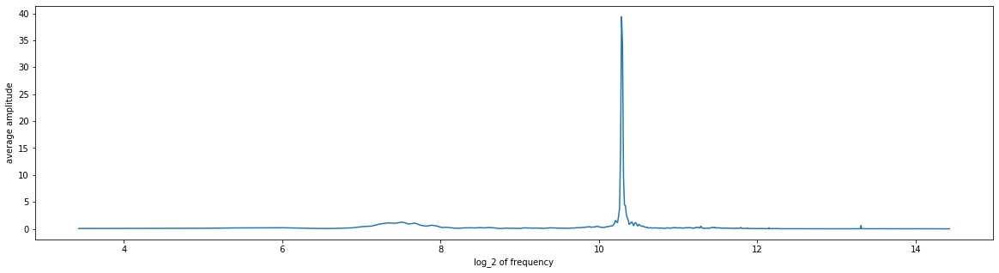

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2159
instrument_name    Vibraphone
note                      Db3
expression             dampen
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2159.aif
Analyzing sample...


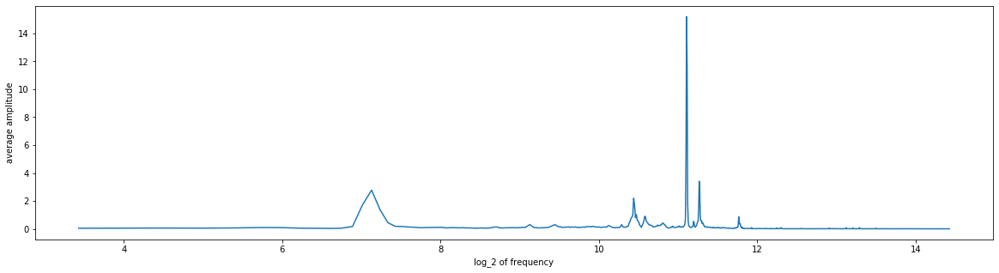

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2160
instrument_name    Vibraphone
note                       C5
expression             dampen
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2160.aif
Analyzing sample...


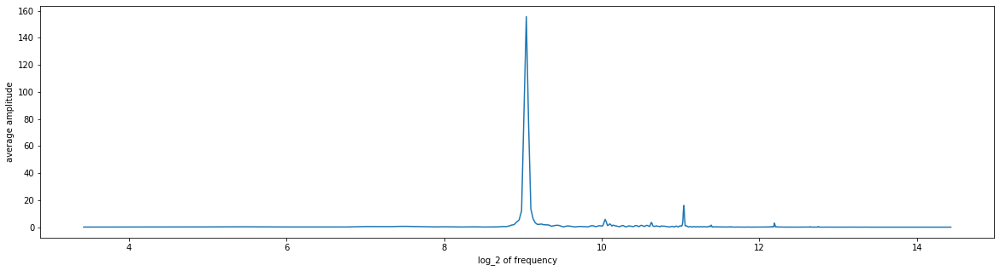

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2161
instrument_name    Vibraphone
note                      Db4
expression             dampen
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2161.aif
Analyzing sample...


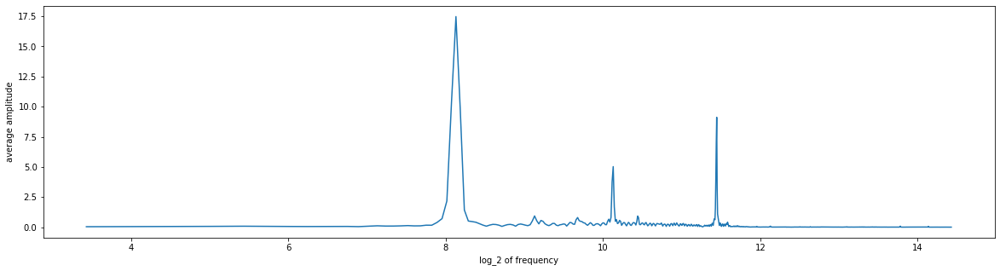

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2162
instrument_name    Vibraphone
note                       B3
expression             dampen
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2162.aif
Analyzing sample...


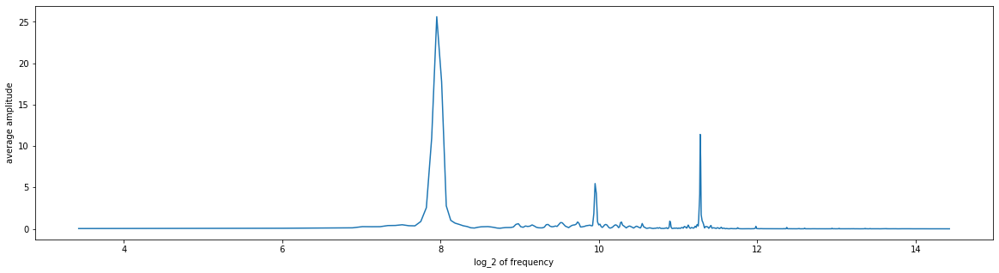

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2163
instrument_name    Vibraphone
note                       A4
expression             dampen
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2163.aif
Analyzing sample...


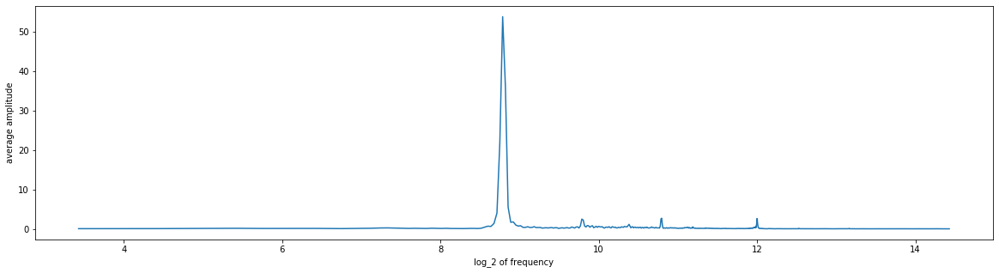

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2164
instrument_name    Vibraphone
note                      Eb4
expression             dampen
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2164.aif
Analyzing sample...


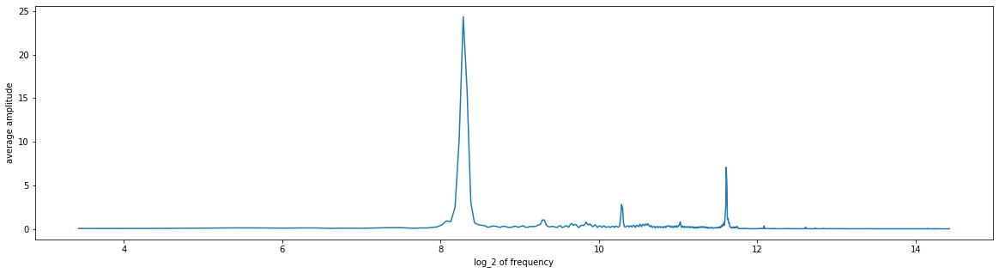

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2165
instrument_name    Vibraphone
note                      Bb4
expression             dampen
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2165.aif
Analyzing sample...


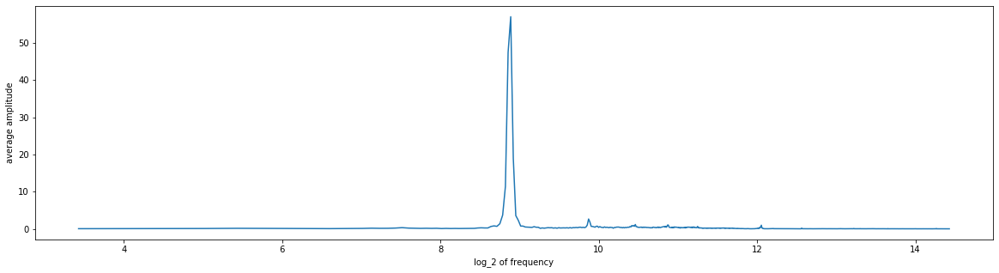

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2166
instrument_name    Vibraphone
note                       G3
expression             dampen
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2166.aif
Analyzing sample...


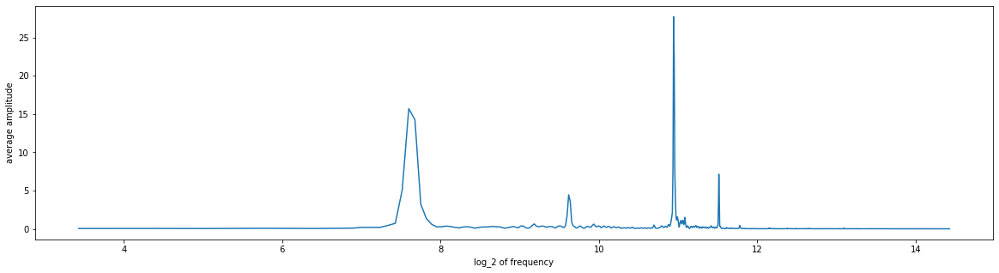

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2167
instrument_name    Vibraphone
note                       D4
expression             dampen
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2167.aif
Analyzing sample...


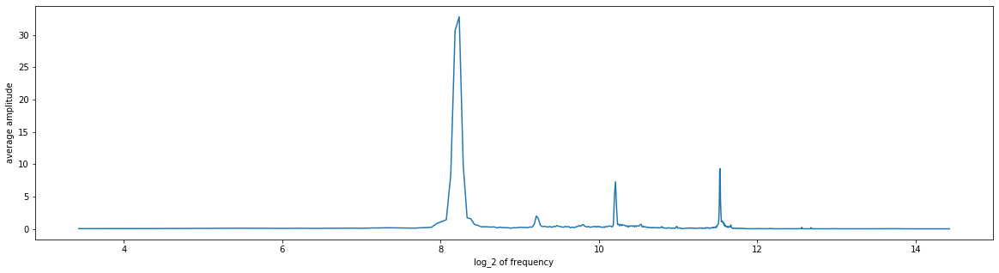

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2168
instrument_name    Vibraphone
note                       E5
expression             dampen
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2168.aif
Analyzing sample...


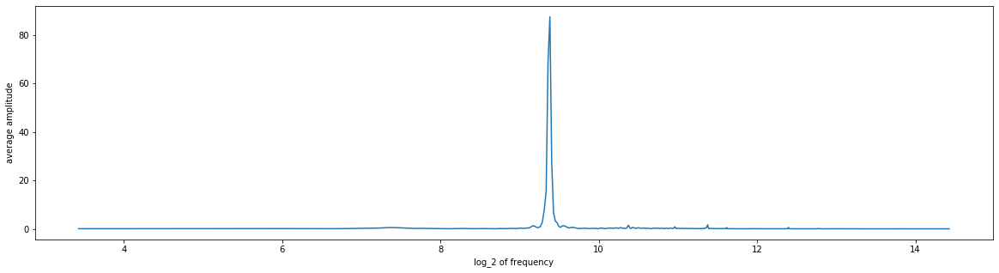

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2169
instrument_name    Vibraphone
note                       B5
expression             dampen
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2169.aif
Analyzing sample...


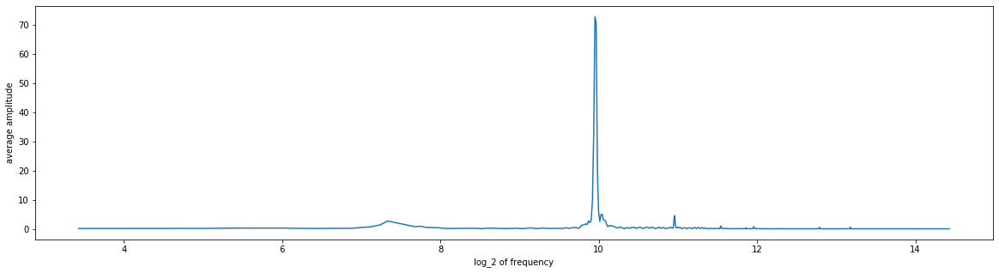

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2170
instrument_name    Vibraphone
note                      Gb4
expression             dampen
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2170.aif
Analyzing sample...


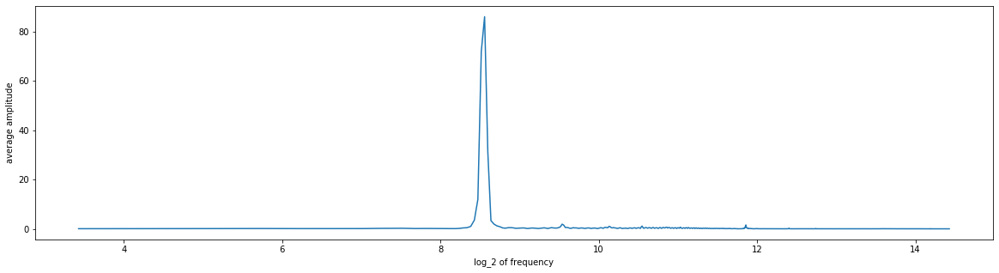

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2171
instrument_name    Vibraphone
note                       E6
expression             dampen
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2171.aif
Analyzing sample...


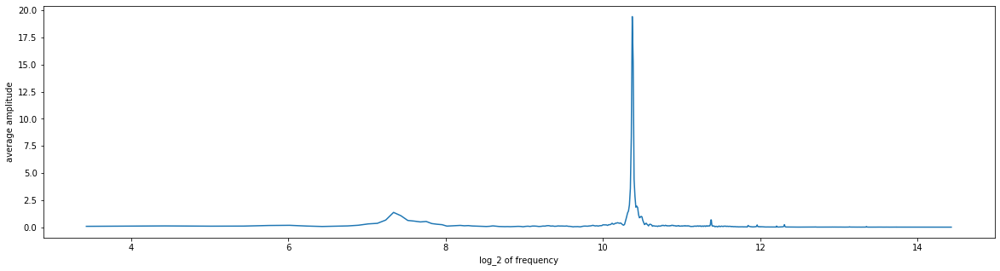

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2172
instrument_name    Vibraphone
note                       C4
expression             dampen
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2172.aif
Analyzing sample...


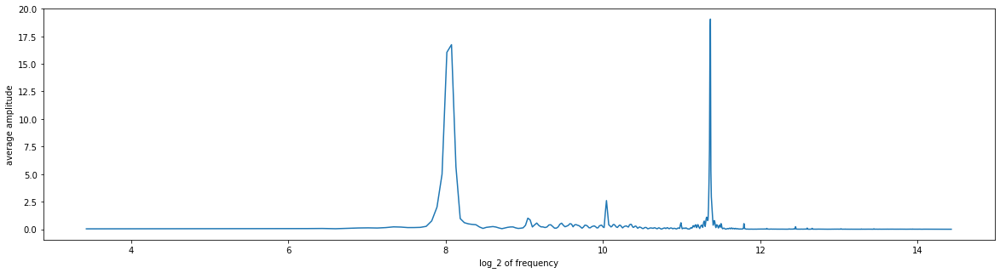

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2173
instrument_name    Vibraphone
note                       E3
expression             dampen
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2173.aif
Analyzing sample...


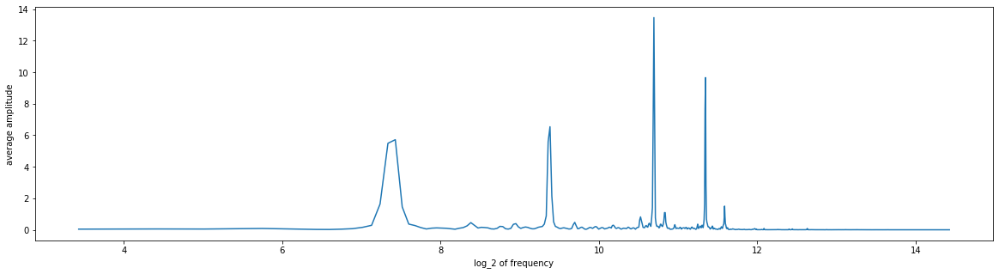

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2174
instrument_name    Vibraphone
note                       F4
expression             dampen
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2174.aif
Analyzing sample...


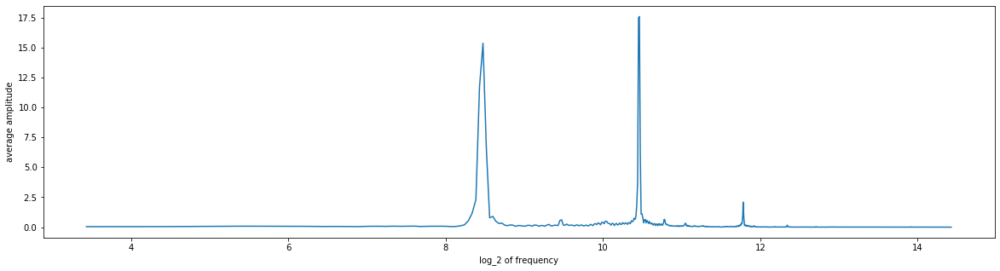

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2175
instrument_name    Vibraphone
note                      Ab4
expression             dampen
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2175.aif
Analyzing sample...


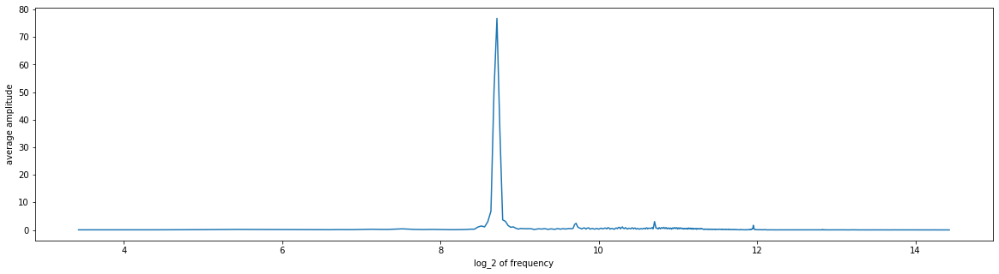

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2176
instrument_name    Vibraphone
note                       G5
expression             dampen
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2176.aif
Analyzing sample...


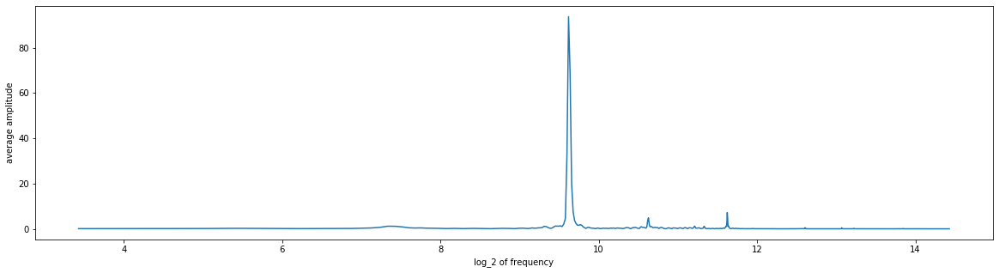

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2177
instrument_name    Vibraphone
note                      Eb5
expression             dampen
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2177.aif
Analyzing sample...


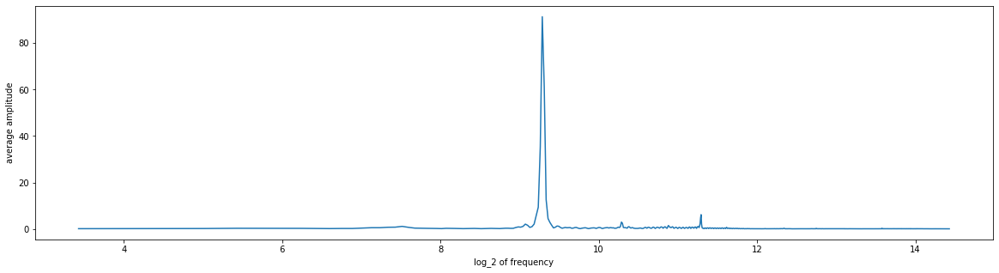

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2178
instrument_name    Vibraphone
note                      Bb5
expression             dampen
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2178.aif
Analyzing sample...


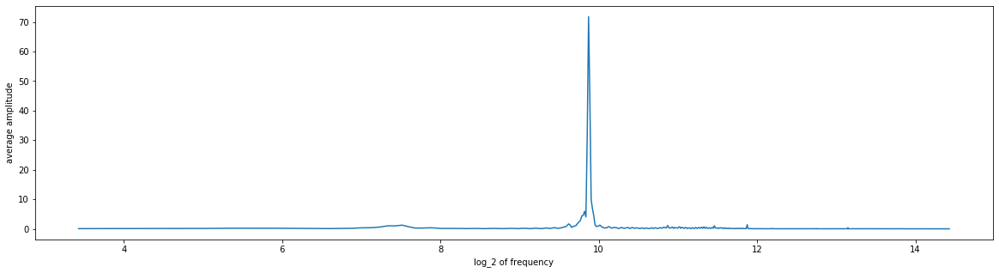

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2179
instrument_name    Vibraphone
note                       D5
expression             dampen
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2179.aif
Analyzing sample...


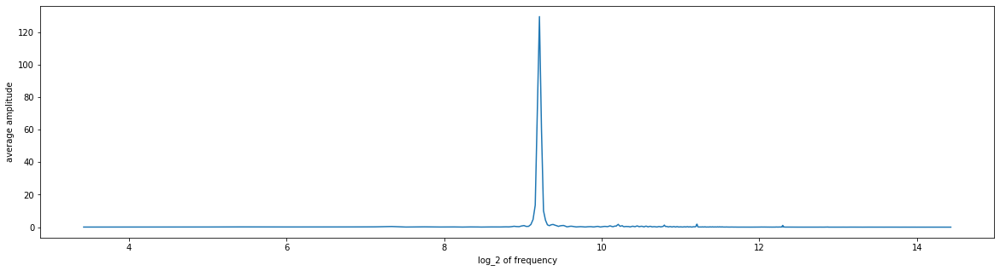

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2180
instrument_name    Vibraphone
note                       E4
expression             dampen
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2180.aif
Analyzing sample...


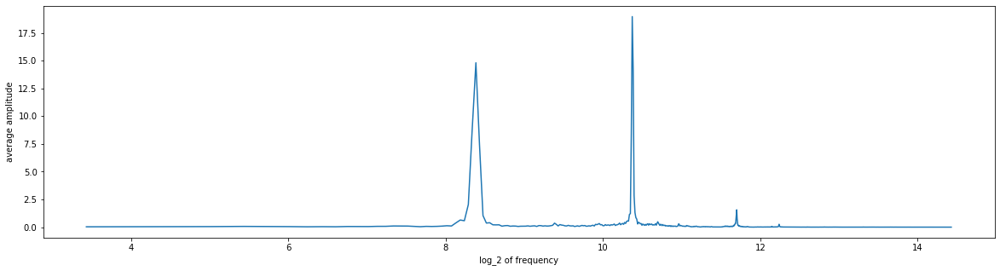

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2181
instrument_name    Vibraphone
note                       F3
expression             dampen
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2181.aif
Analyzing sample...


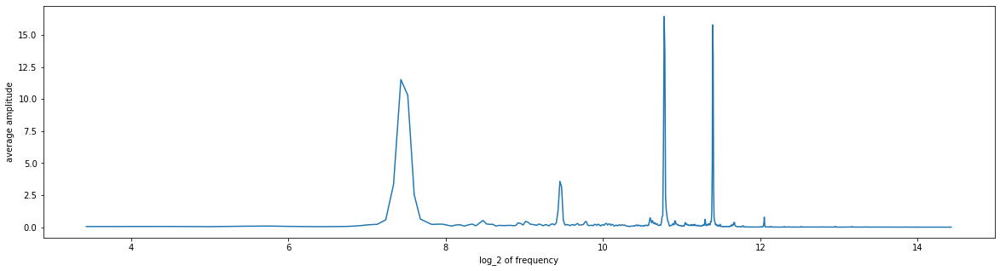

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2182
instrument_name    Vibraphone
note                      Ab3
expression             dampen
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2182.aif
Analyzing sample...


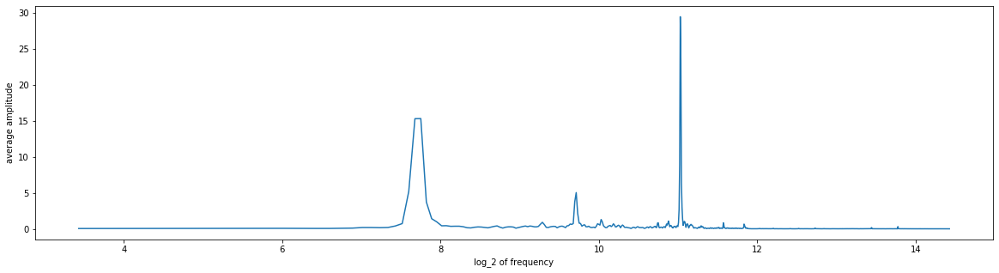

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2183
instrument_name    Vibraphone
note                       C6
expression             dampen
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2183.aif
Analyzing sample...


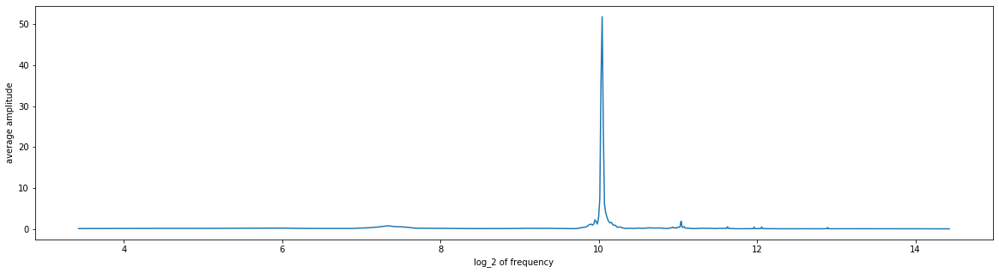

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2184
instrument_name    Vibraphone
note                       F6
expression             dampen
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2184.aif
Analyzing sample...


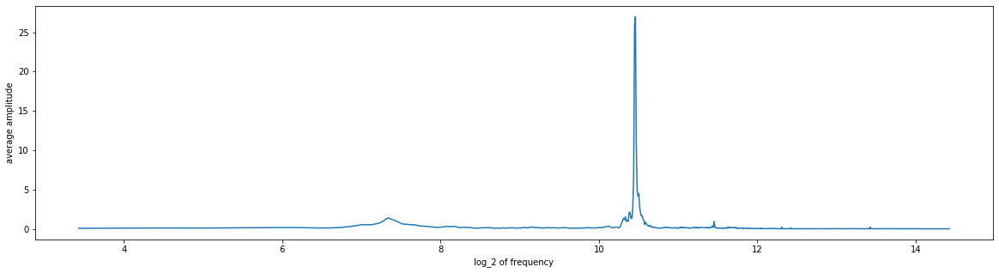

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2185
instrument_name    Vibraphone
note                       C3
expression             dampen
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2185.aif
Analyzing sample...


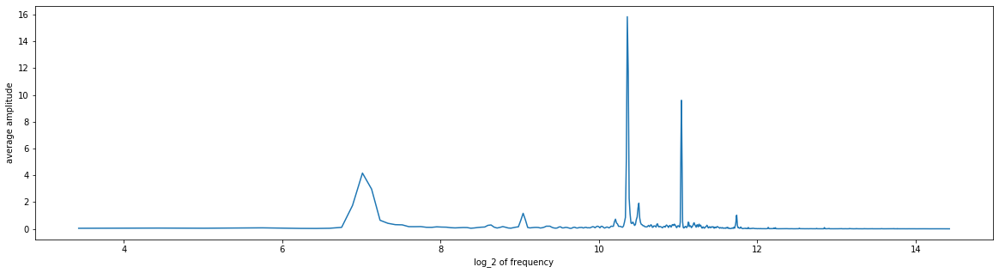

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2186
instrument_name    Vibraphone
note                      Db5
expression             dampen
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2186.aif
Analyzing sample...


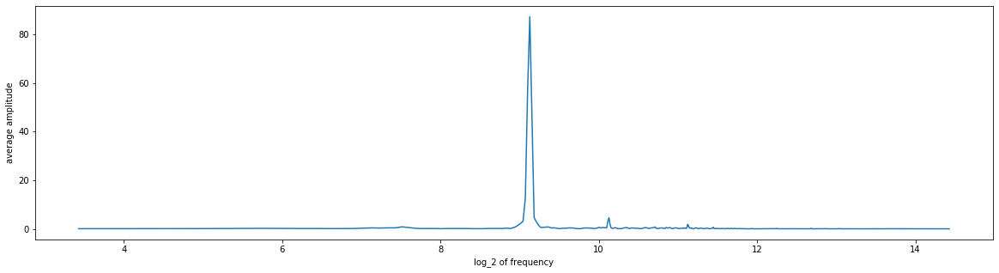

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2187
instrument_name    Vibraphone
note                       A5
expression             dampen
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2187.aif
Analyzing sample...


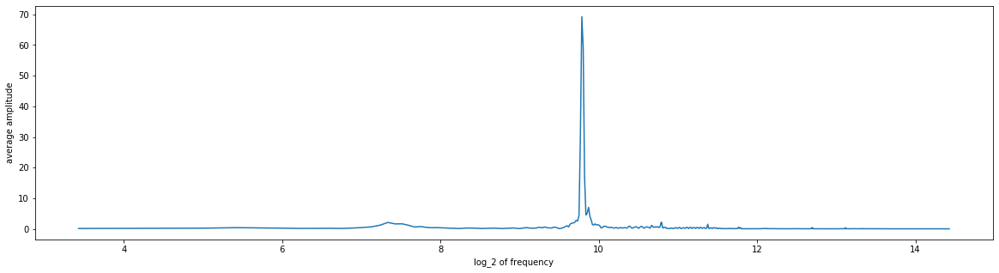

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2188
instrument_name    Vibraphone
note                      Gb3
expression             dampen
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2188.aif
Analyzing sample...


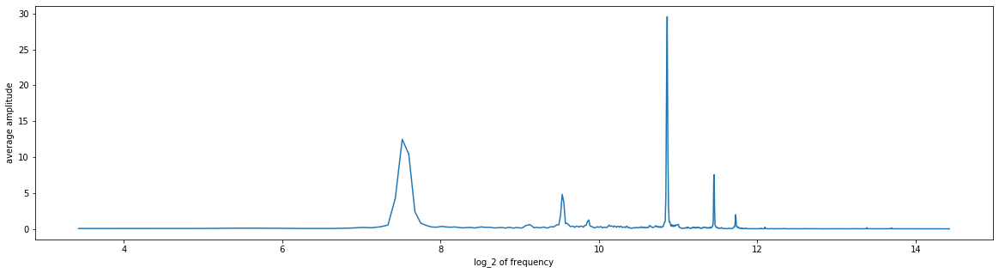

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2189
instrument_name    Vibraphone
note                       E4
expression                bow
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2189.aif
Analyzing sample...


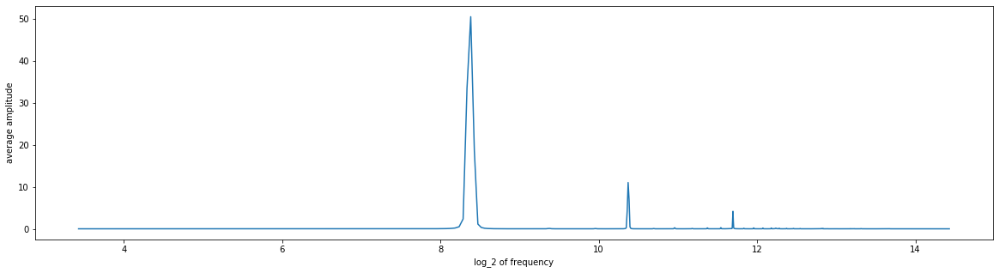

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2190
instrument_name    Vibraphone
note                       F3
expression                bow
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2190.aif
Analyzing sample...


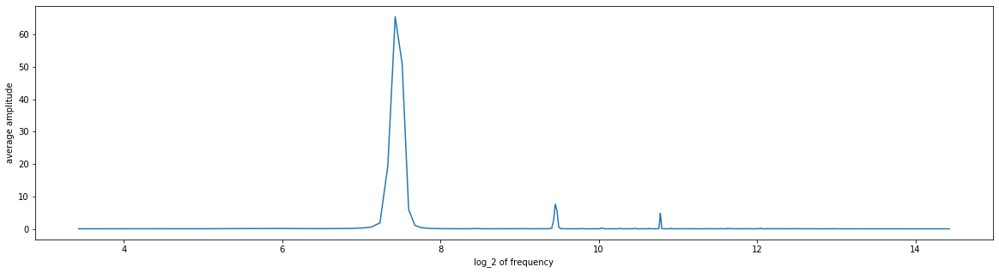

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2191
instrument_name    Vibraphone
note                       C6
expression                bow
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2191.aif
Analyzing sample...


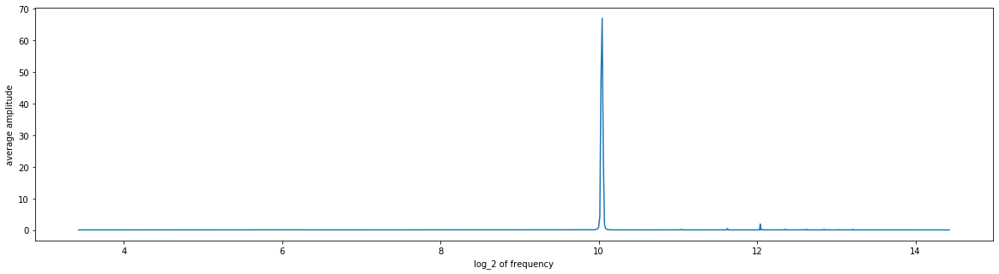

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2192
instrument_name    Vibraphone
note                      Gb4
expression                bow
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2192.aif
Analyzing sample...


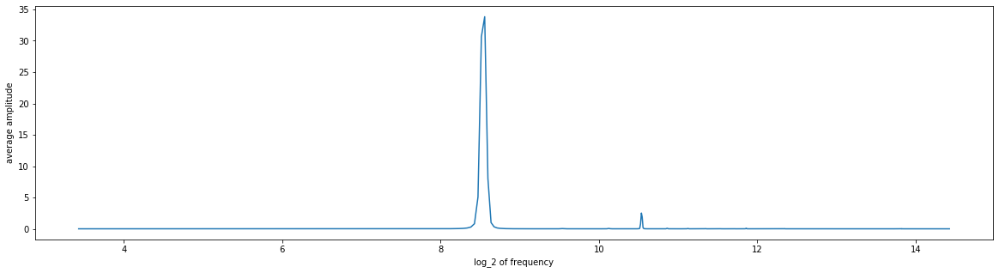

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2193
instrument_name    Vibraphone
note                       D5
expression                bow
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2193.aif
Analyzing sample...


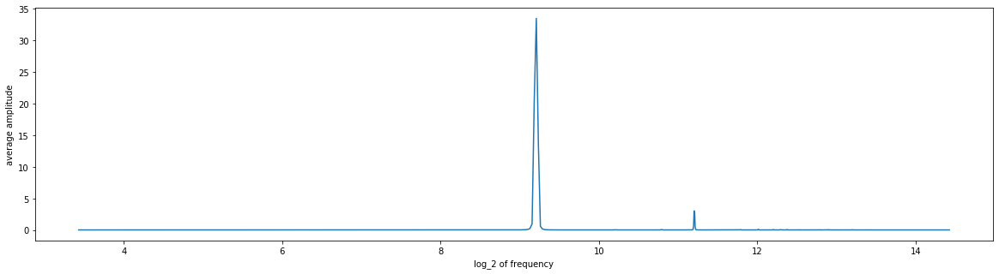

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2194
instrument_name    Vibraphone
note                      Ab4
expression                bow
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2194.aif
Analyzing sample...


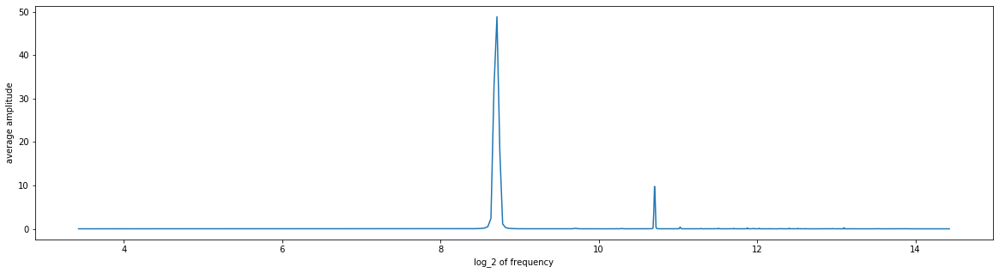

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2195
instrument_name    Vibraphone
note                       A5
expression                bow
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2195.aif
Analyzing sample...


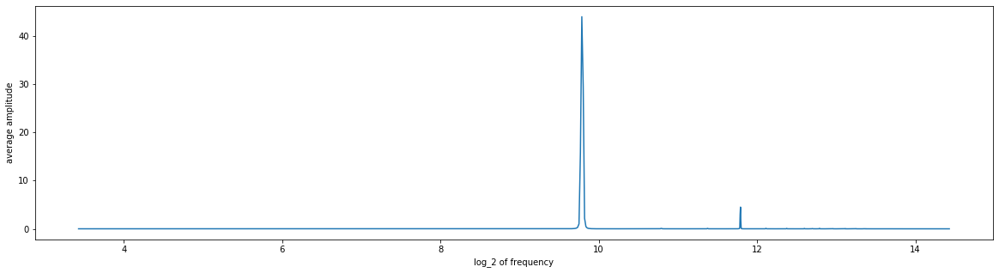

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2196
instrument_name    Vibraphone
note                       F6
expression                bow
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2196.aif
Analyzing sample...


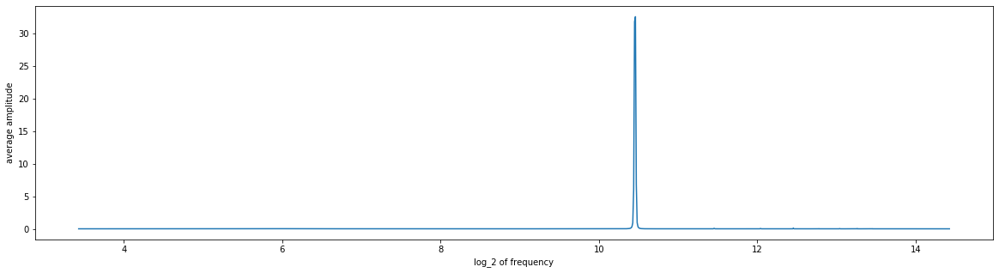

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2197
instrument_name    Vibraphone
note                       C3
expression                bow
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2197.aif
Analyzing sample...


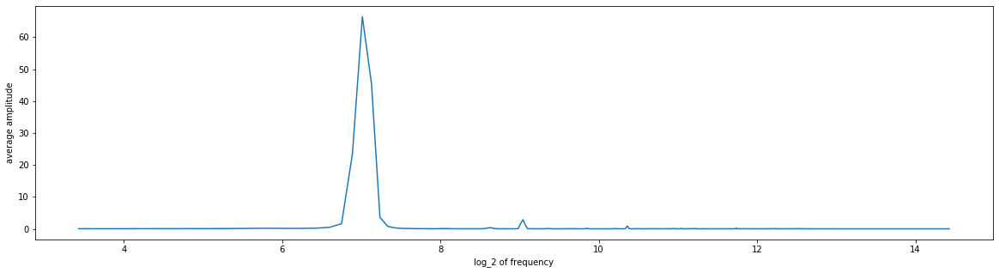

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2198
instrument_name    Vibraphone
note                      Eb5
expression                bow
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2198.aif
Analyzing sample...


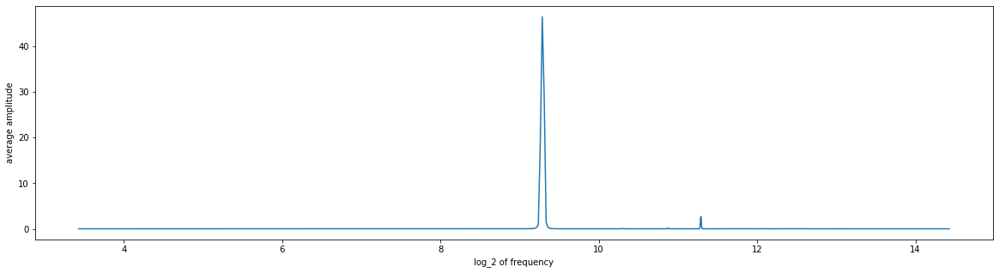

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2199
instrument_name    Vibraphone
note                       E6
expression                bow
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2199.aif
Analyzing sample...


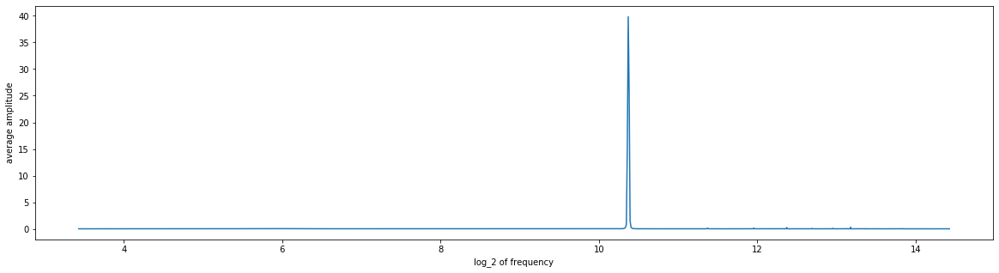

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2200
instrument_name    Vibraphone
note                      Bb5
expression                bow
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2200.aif
Analyzing sample...


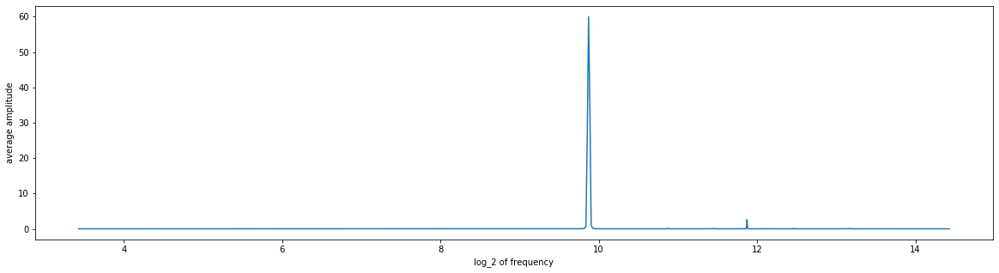

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2201
instrument_name    Vibraphone
note                       C4
expression                bow
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2201.aif
Analyzing sample...


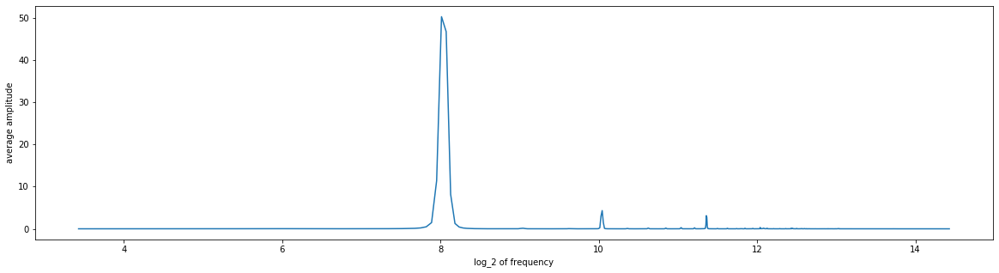

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2202
instrument_name    Vibraphone
note                       B5
expression                bow
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2202.aif
Analyzing sample...


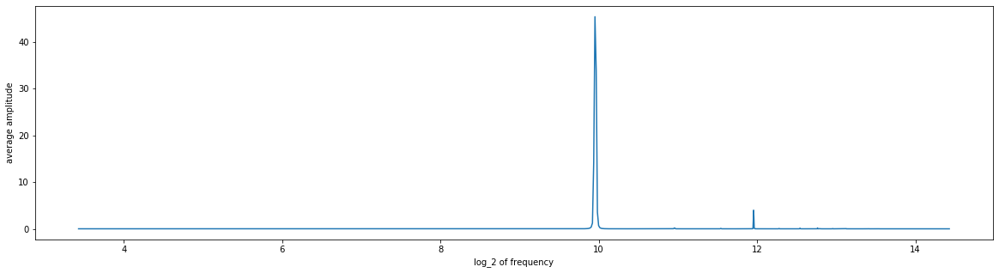

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2203
instrument_name    Vibraphone
note                      Ab3
expression                bow
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2203.aif
Analyzing sample...


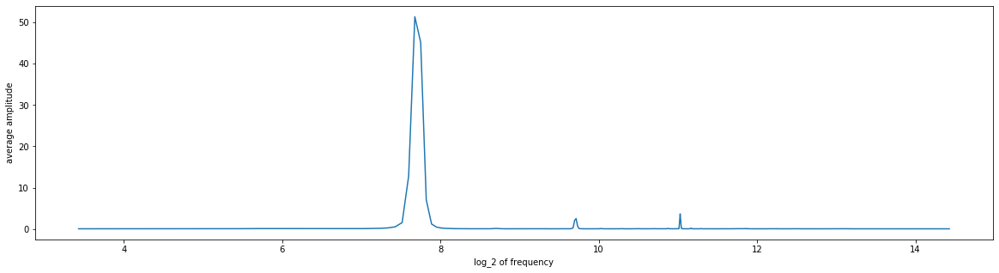

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2204
instrument_name    Vibraphone
note                       G5
expression                bow
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2204.aif
Analyzing sample...


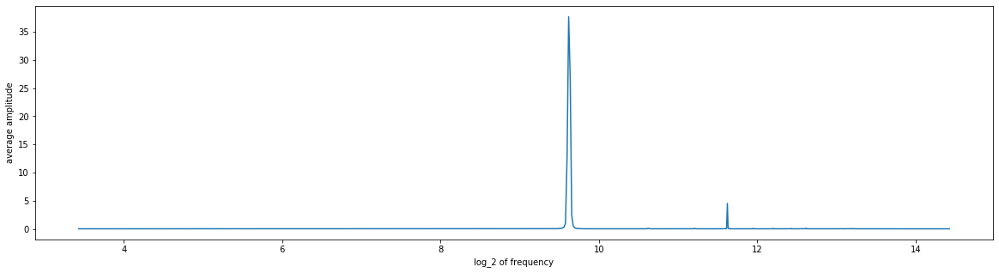

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2205
instrument_name    Vibraphone
note                      Db5
expression                bow
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2205.aif
Analyzing sample...


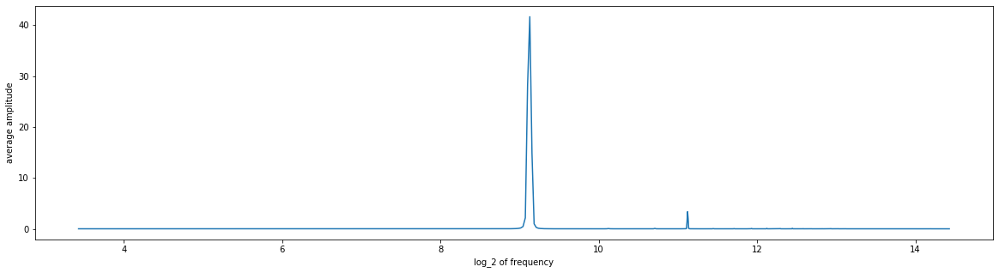

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2206
instrument_name    Vibraphone
note                      Gb3
expression                bow
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2206.aif
Analyzing sample...


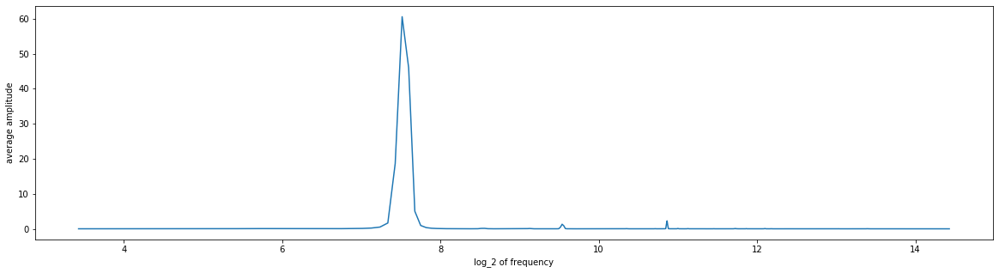

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2207
instrument_name    Vibraphone
note                       E3
expression                bow
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2207.aif
Analyzing sample...


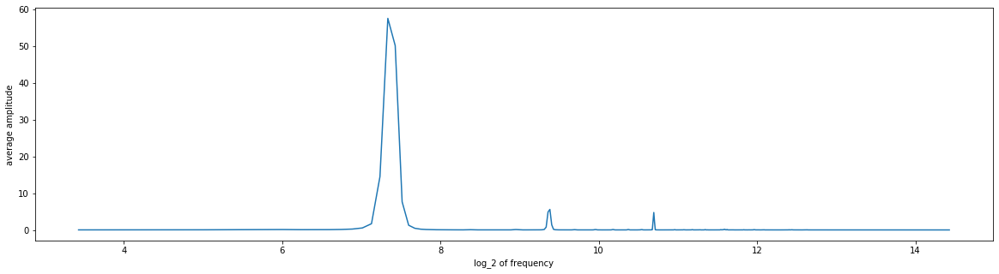

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2208
instrument_name    Vibraphone
note                       F4
expression                bow
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2208.aif
Analyzing sample...


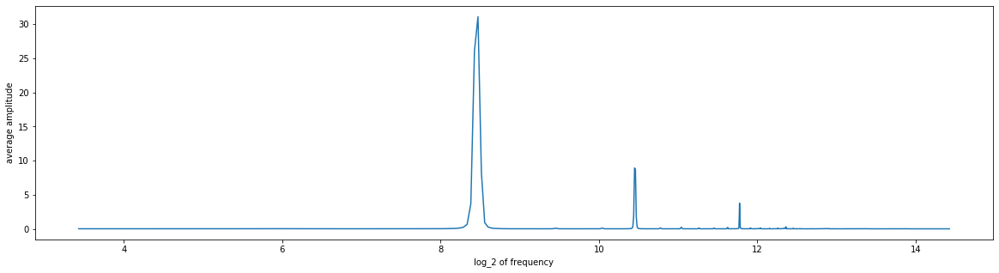

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2209
instrument_name    Vibraphone
note                      Ab5
expression                bow
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2209.aif
Analyzing sample...


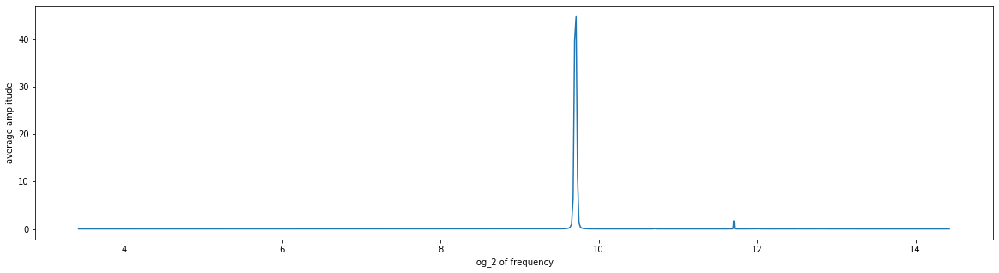

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2210
instrument_name    Vibraphone
note                       B3
expression                bow
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2210.aif
Analyzing sample...


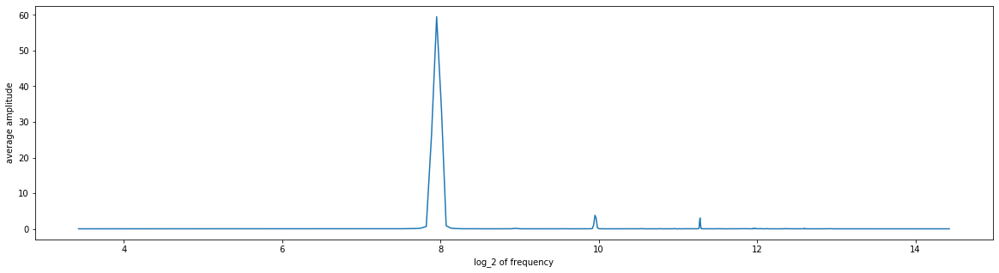

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2211
instrument_name    Vibraphone
note                       A4
expression                bow
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2211.aif
Analyzing sample...


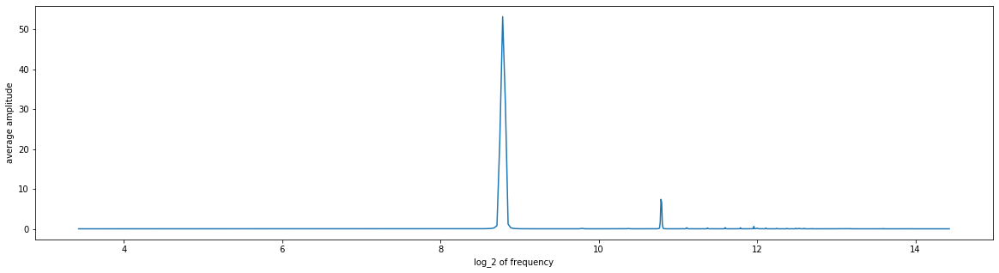

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2212
instrument_name    Vibraphone
note                      Db6
expression                bow
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2212.aif
Analyzing sample...


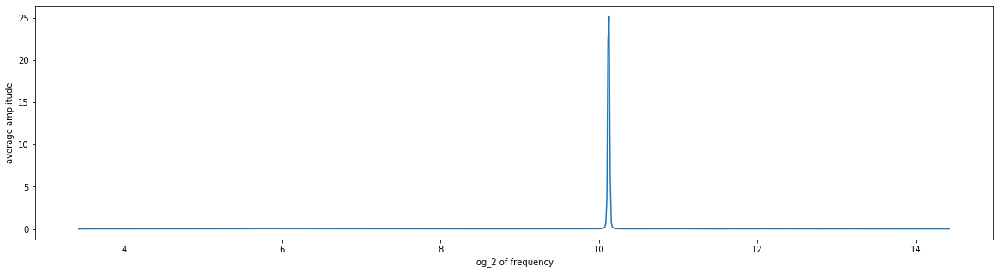

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2213
instrument_name    Vibraphone
note                      Eb3
expression                bow
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2213.aif
Analyzing sample...


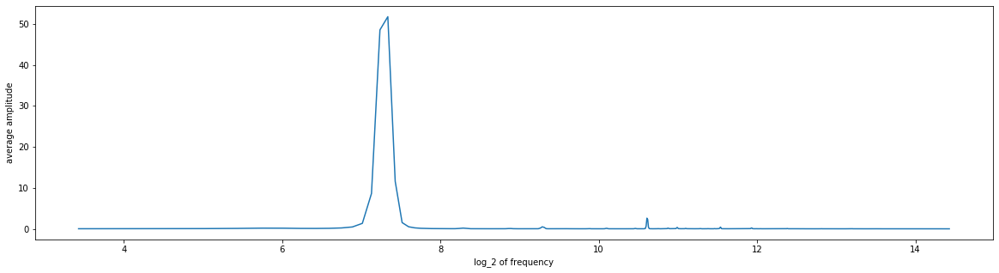

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2214
instrument_name    Vibraphone
note                      Bb3
expression                bow
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2214.aif
Analyzing sample...


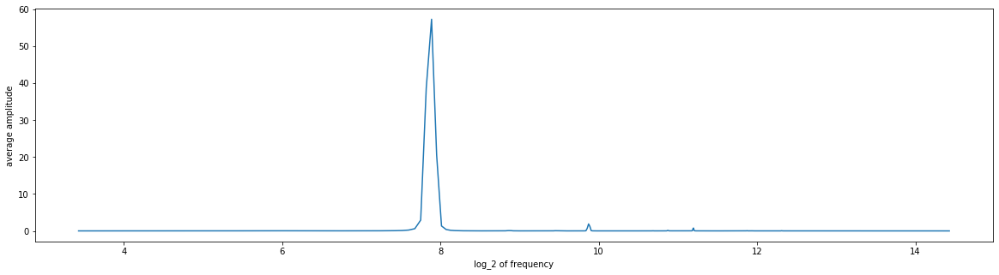

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2215
instrument_name    Vibraphone
note                      Eb6
expression                bow
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2215.aif
Analyzing sample...


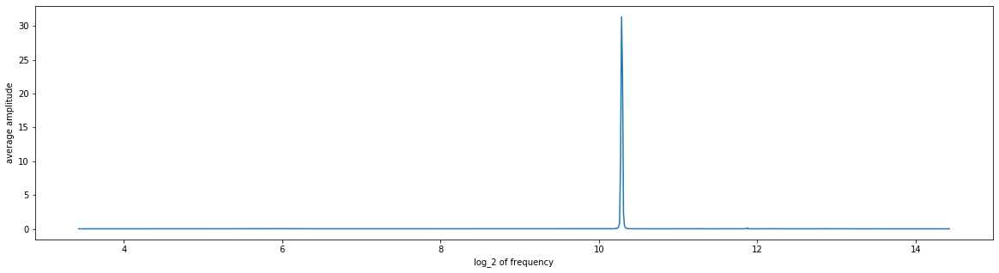

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2216
instrument_name    Vibraphone
note                       E5
expression                bow
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2216.aif
Analyzing sample...


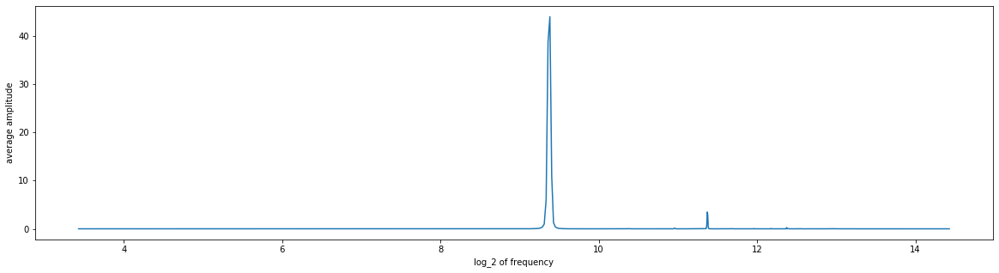

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2217
instrument_name    Vibraphone
note                      Gb5
expression                bow
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2217.aif
Analyzing sample...


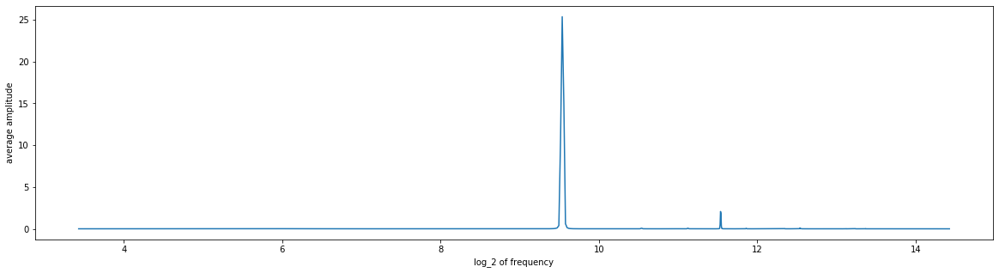

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2218
instrument_name    Vibraphone
note                       G3
expression                bow
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2218.aif
Analyzing sample...


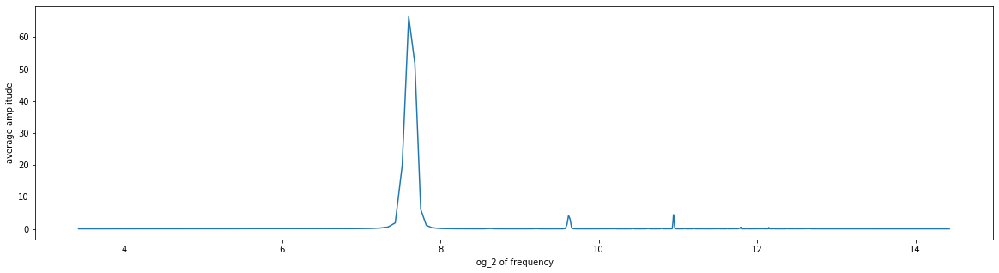

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2219
instrument_name    Vibraphone
note                      Db3
expression                bow
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2219.aif
Analyzing sample...


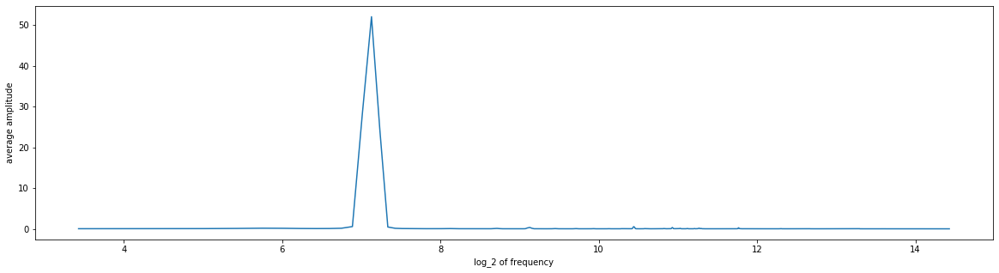

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2220
instrument_name    Vibraphone
note                       D4
expression                bow
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2220.aif
Analyzing sample...


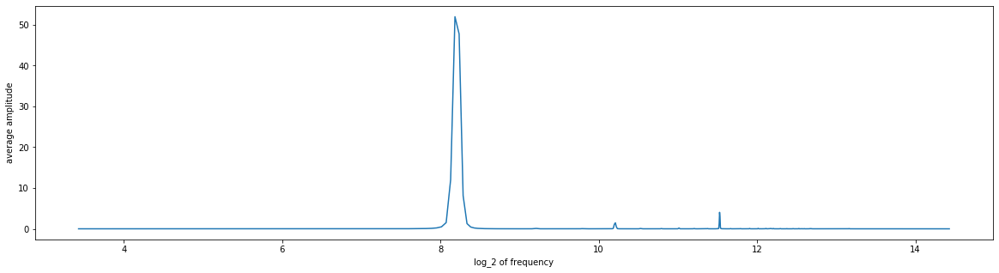

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2221
instrument_name    Vibraphone
note                      Db4
expression                bow
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2221.aif
Analyzing sample...


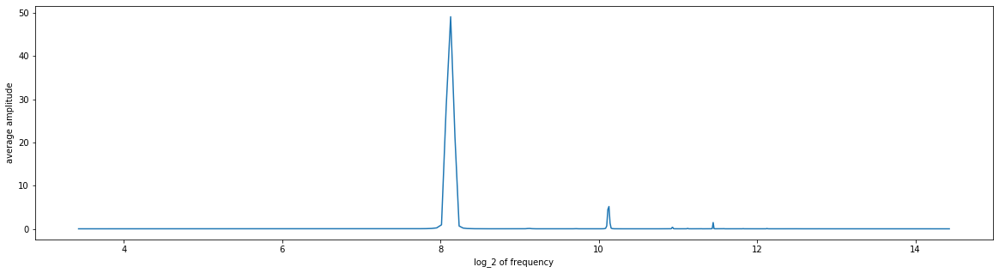

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2222
instrument_name    Vibraphone
note                       G4
expression                bow
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2222.aif
Analyzing sample...


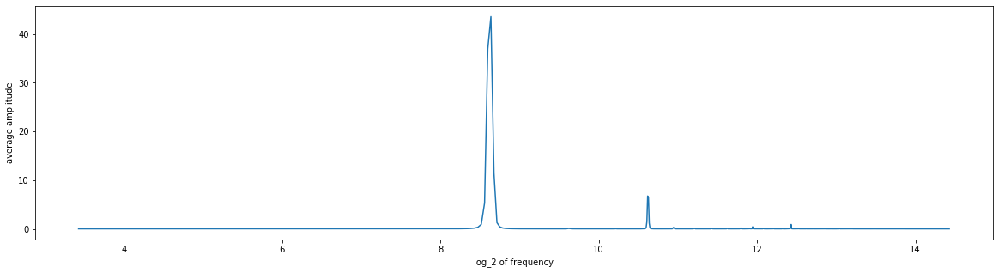

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2223
instrument_name    Vibraphone
note                       D3
expression                bow
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2223.aif
Analyzing sample...


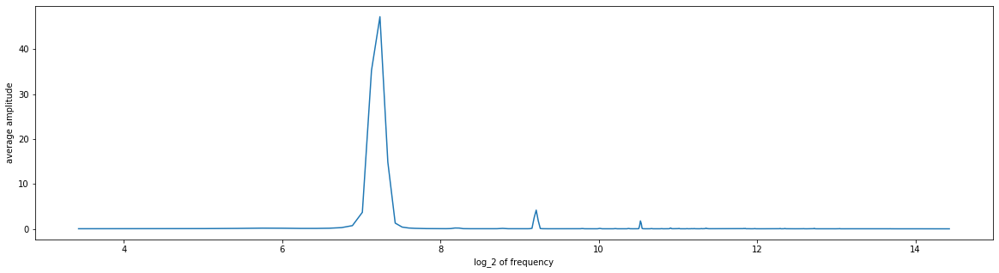

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2224
instrument_name    Vibraphone
note                       F5
expression                bow
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2224.aif
Analyzing sample...


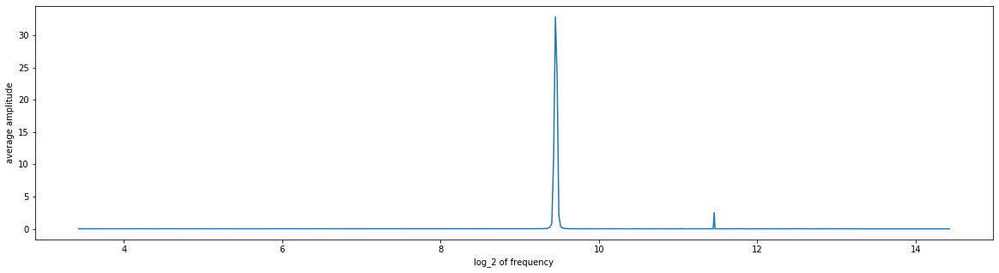

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2225
instrument_name    Vibraphone
note                      Eb4
expression                bow
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2225.aif
Analyzing sample...


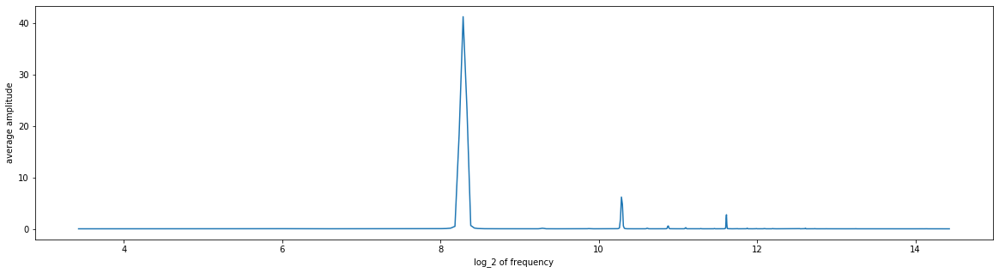

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2226
instrument_name    Vibraphone
note                      Bb4
expression                bow
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2226.aif
Analyzing sample...


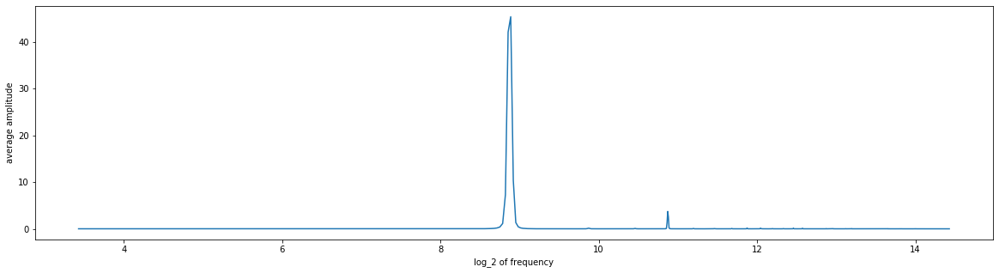

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2227
instrument_name    Vibraphone
note                       C5
expression                bow
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2227.aif
Analyzing sample...


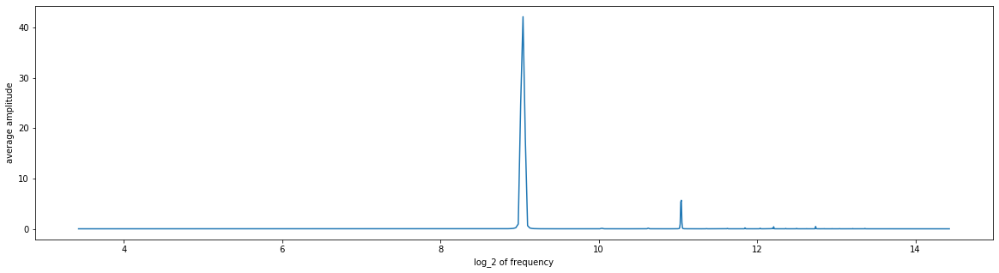

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2228
instrument_name    Vibraphone
note                       B4
expression                bow
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2228.aif
Analyzing sample...


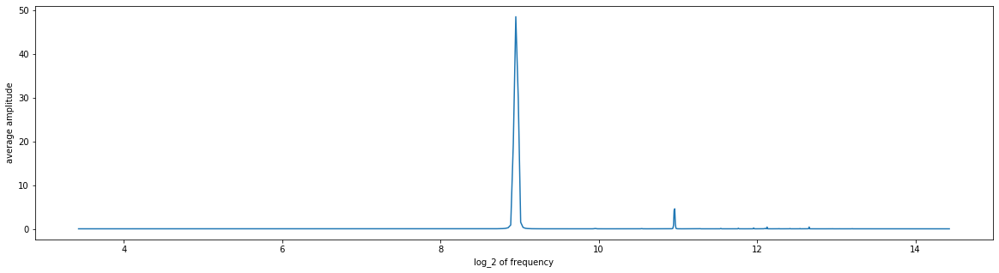

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2229
instrument_name    Vibraphone
note                       A3
expression                bow
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2229.aif
Analyzing sample...


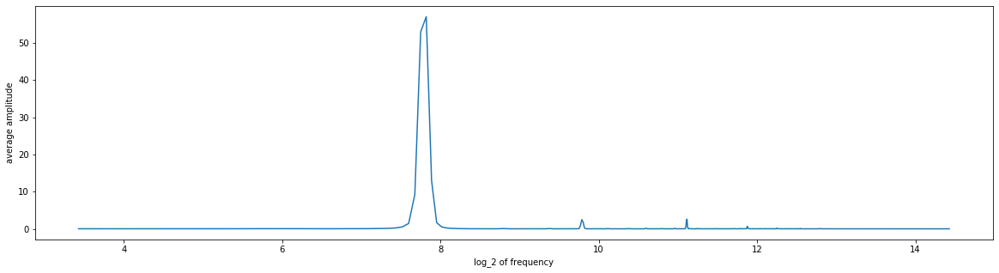

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id                2230
instrument_name    Vibraphone
note                       D6
expression                bow
source               Iowa2012
file_extension            aif
Name: 0, dtype: object
2230.aif
Analyzing sample...


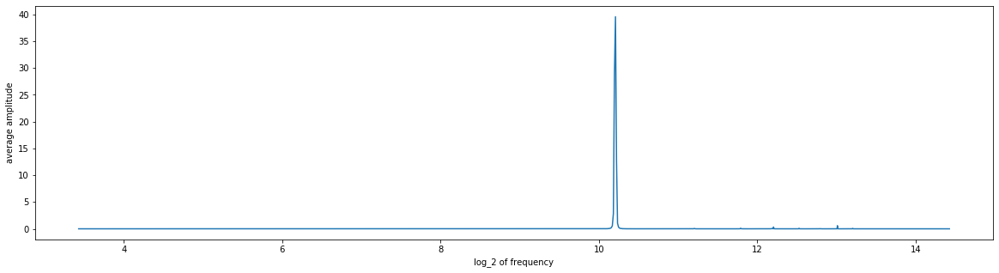

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2231
instrument_name       bells
note                     A5
expression          plastic
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2231.aif
Analyzing sample...


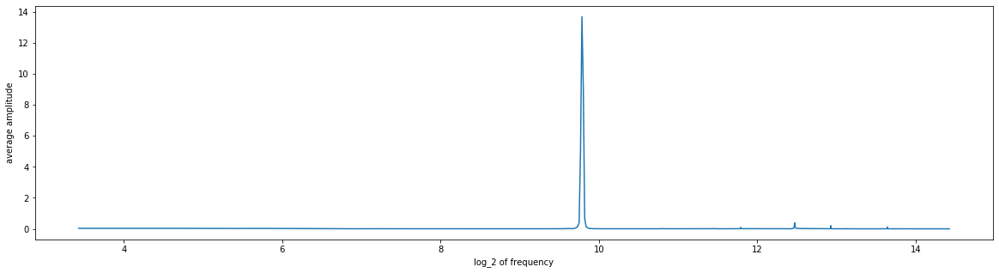

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2232
instrument_name       bells
note                     G7
expression          plastic
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2232.aif
Analyzing sample...


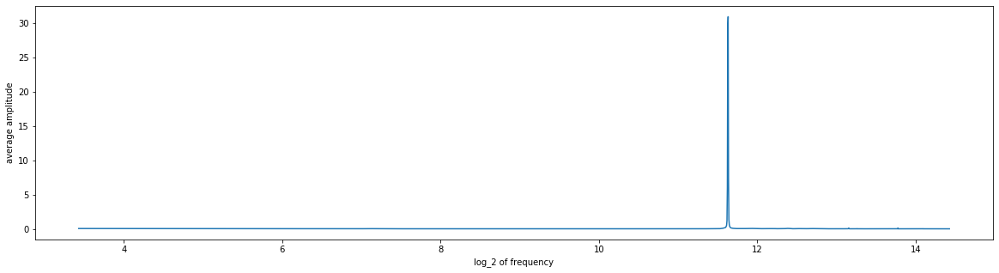

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2233
instrument_name       bells
note                     F6
expression          plastic
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2233.aif
Analyzing sample...


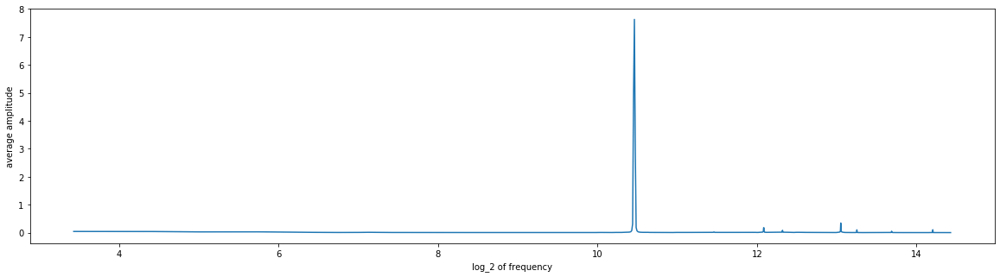

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2234
instrument_name       bells
note                    Eb7
expression          plastic
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2234.aif
Analyzing sample...


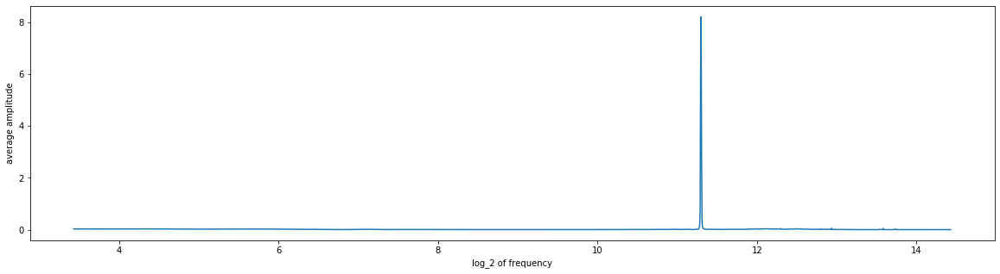

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2235
instrument_name       bells
note                    Bb7
expression          plastic
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2235.aif
Analyzing sample...


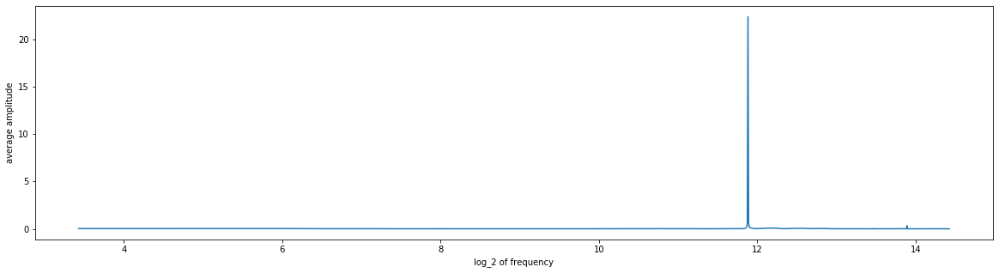

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2236
instrument_name       bells
note                     C6
expression          plastic
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2236.aif
Analyzing sample...


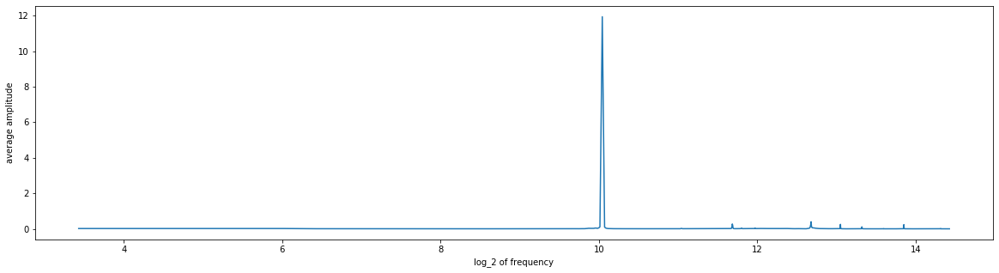

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2237
instrument_name       bells
note                     D8
expression          plastic
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2237.aif
Analyzing sample...


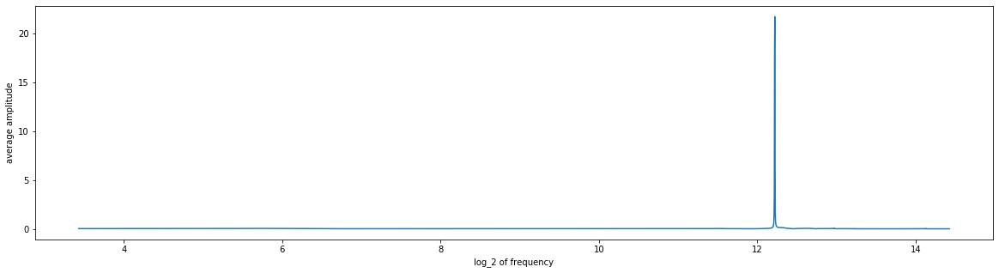

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2238
instrument_name       bells
note                    Db7
expression          plastic
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2238.aif
Analyzing sample...


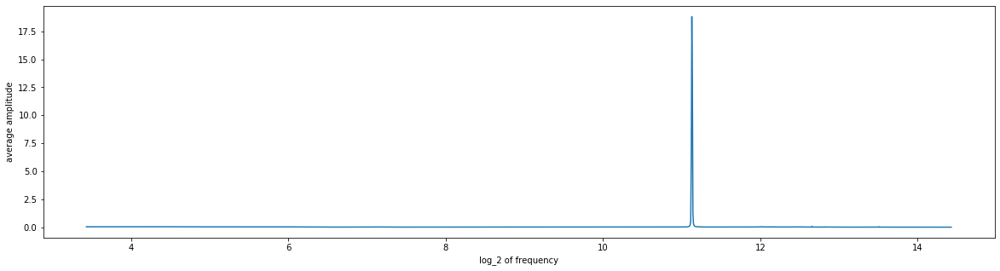

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2239
instrument_name       bells
note                     B7
expression          plastic
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2239.aif
Analyzing sample...


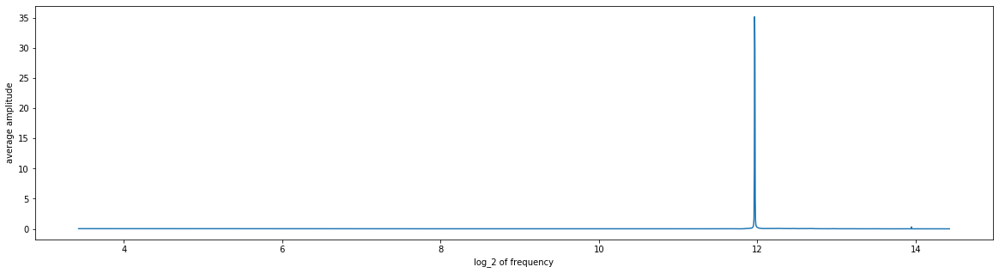

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2240
instrument_name       bells
note                     D5
expression          plastic
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2240.aif
Analyzing sample...


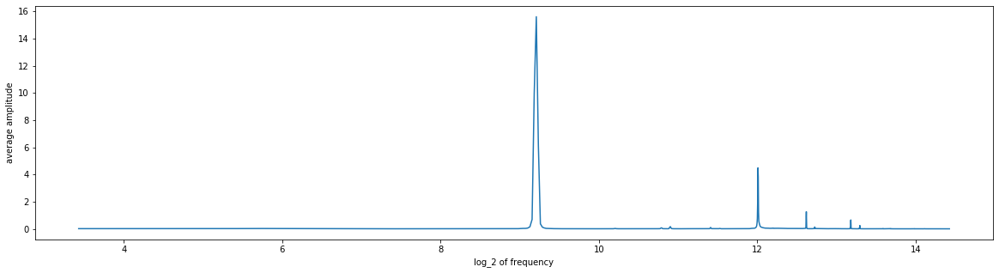

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2241
instrument_name       bells
note                     A7
expression          plastic
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2241.aif
Analyzing sample...


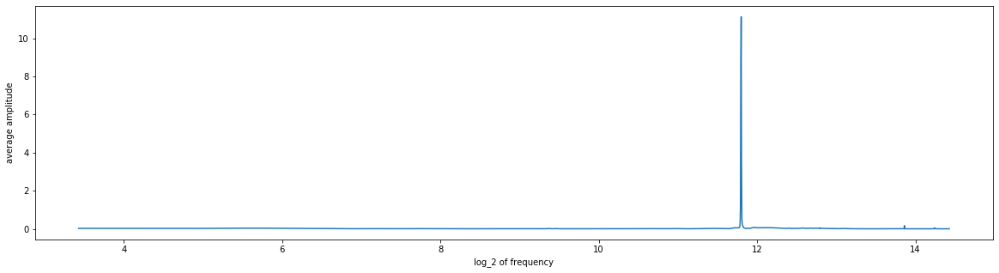

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2242
instrument_name       bells
note                     G5
expression          plastic
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2242.aif
Analyzing sample...


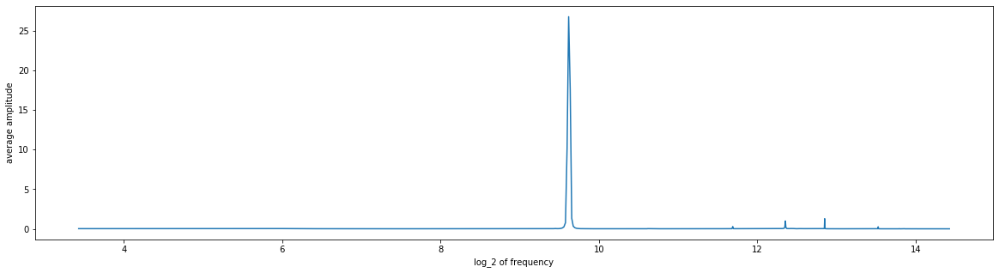

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2243
instrument_name       bells
note                    Eb8
expression          plastic
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2243.aif
Analyzing sample...


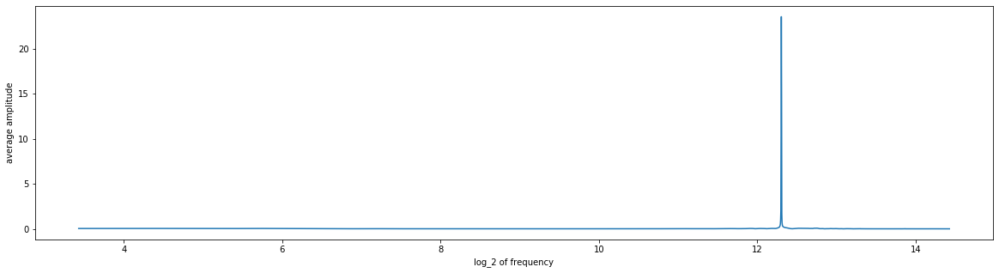

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2244
instrument_name       bells
note                    Eb5
expression          plastic
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2244.aif
Analyzing sample...


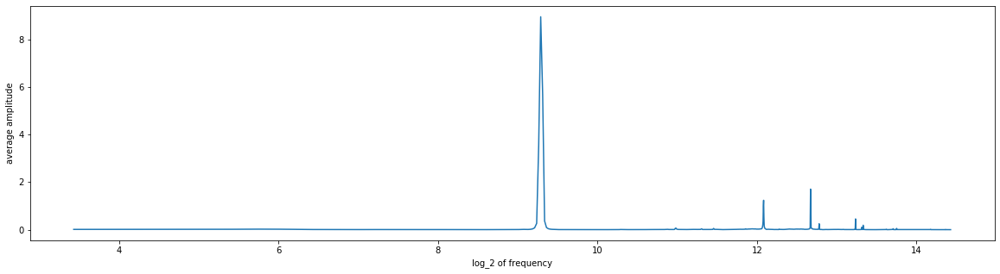

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2245
instrument_name       bells
note                    Bb5
expression          plastic
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2245.aif
Analyzing sample...


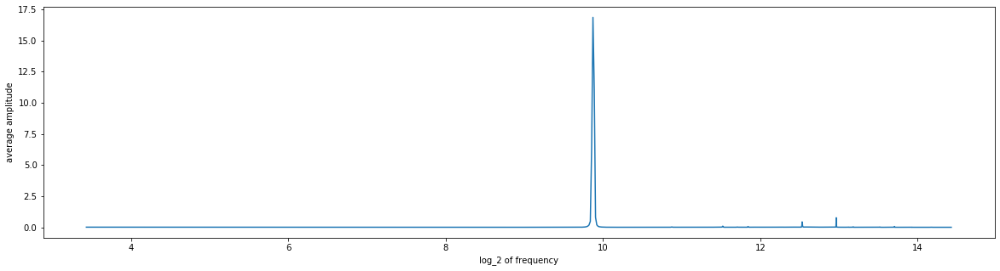

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2246
instrument_name       bells
note                    Gb6
expression          plastic
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2246.aif
Analyzing sample...


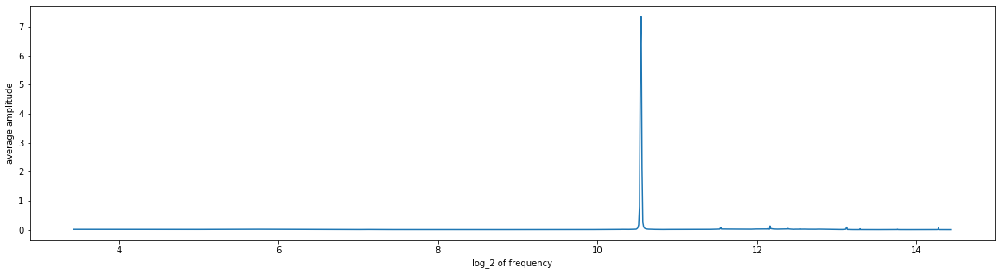

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2247
instrument_name       bells
note                     E6
expression          plastic
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2247.aif
Analyzing sample...


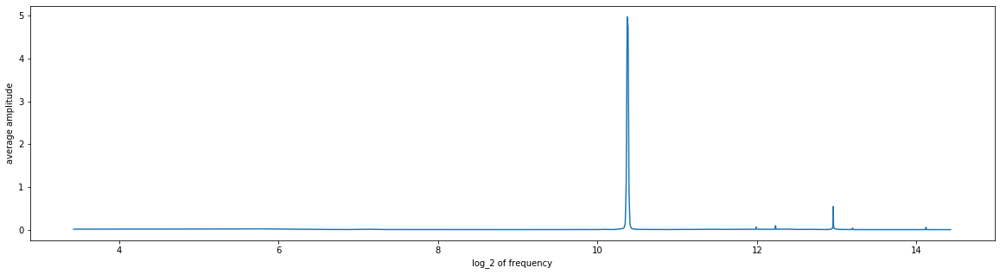

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2248
instrument_name       bells
note                    Db8
expression          plastic
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2248.aif
Analyzing sample...


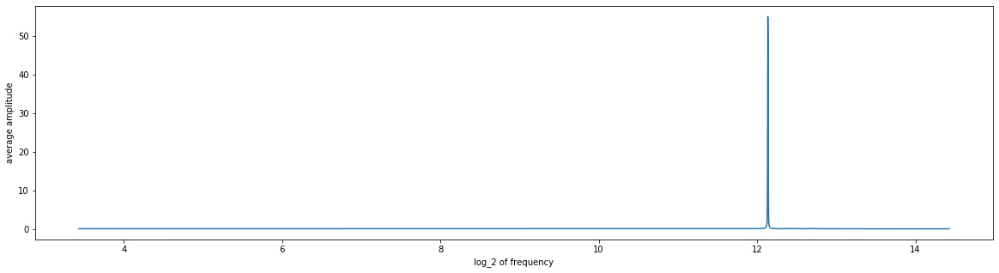

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2249
instrument_name       bells
note                    Ab6
expression          plastic
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2249.aif
Analyzing sample...


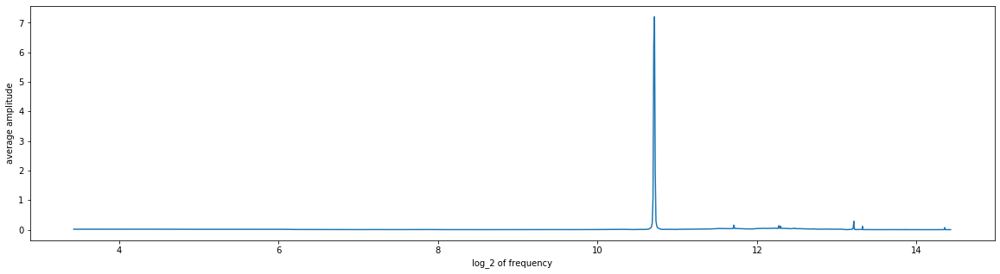

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2250
instrument_name       bells
note                     B5
expression          plastic
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2250.aif
Analyzing sample...


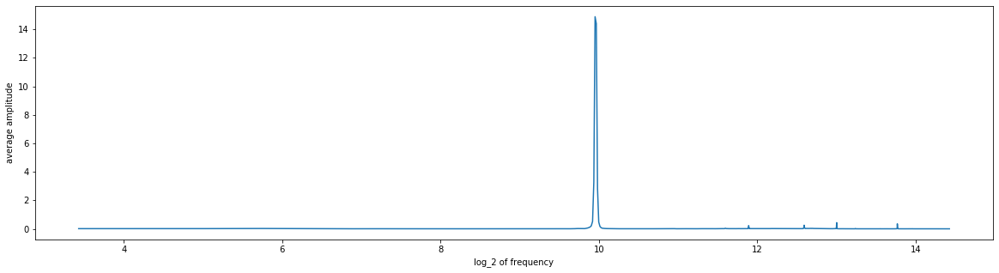

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2251
instrument_name       bells
note                     D7
expression          plastic
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2251.aif
Analyzing sample...


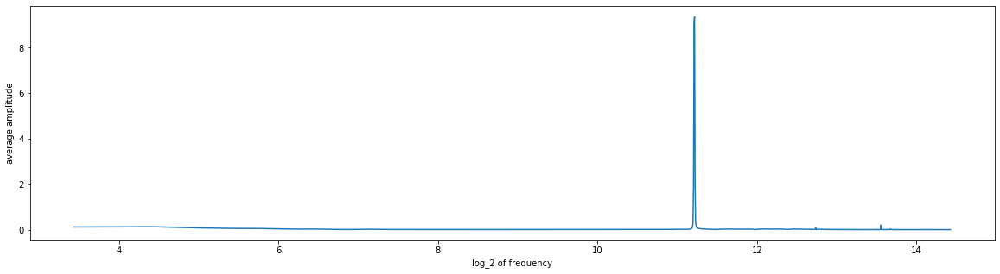

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2252
instrument_name       bells
note                    Db5
expression          plastic
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2252.aif
Analyzing sample...


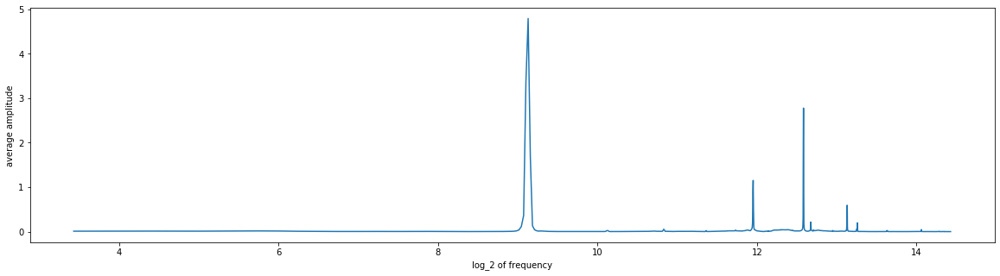

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2253
instrument_name       bells
note                     E5
expression          plastic
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2253.aif
Analyzing sample...


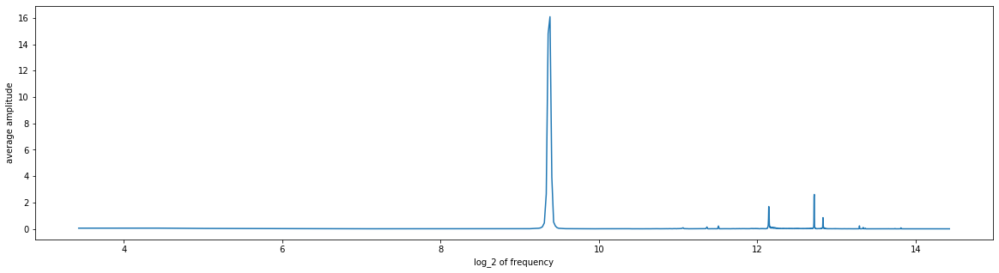

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2254
instrument_name       bells
note                     C7
expression          plastic
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2254.aif
Analyzing sample...


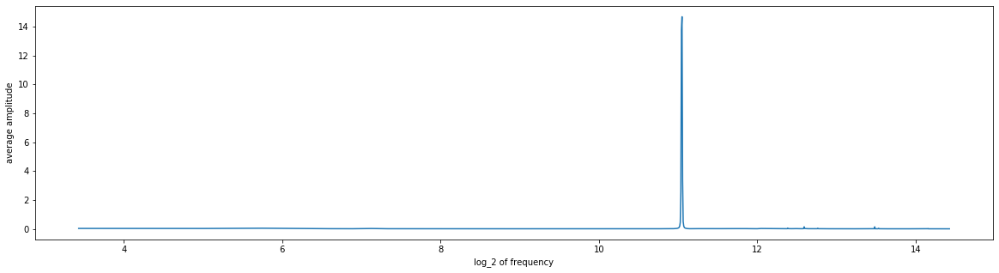

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2255
instrument_name       bells
note                     E8
expression          plastic
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2255.aif
Analyzing sample...


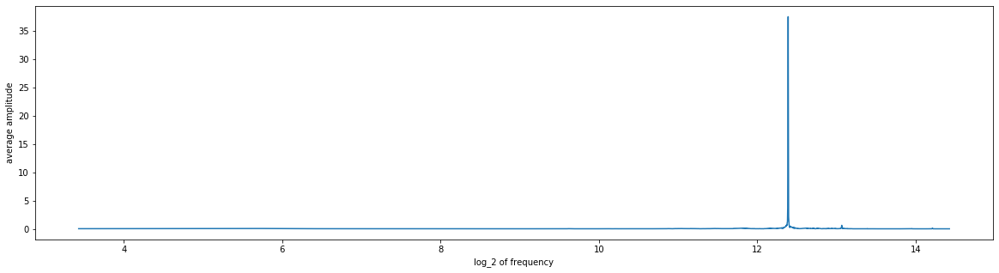

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2256
instrument_name       bells
note                    Db6
expression          plastic
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2256.aif
Analyzing sample...


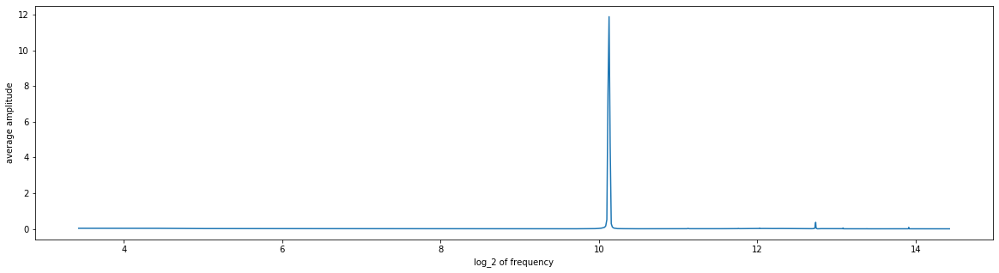

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2257
instrument_name       bells
note                     B6
expression          plastic
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2257.aif
Analyzing sample...


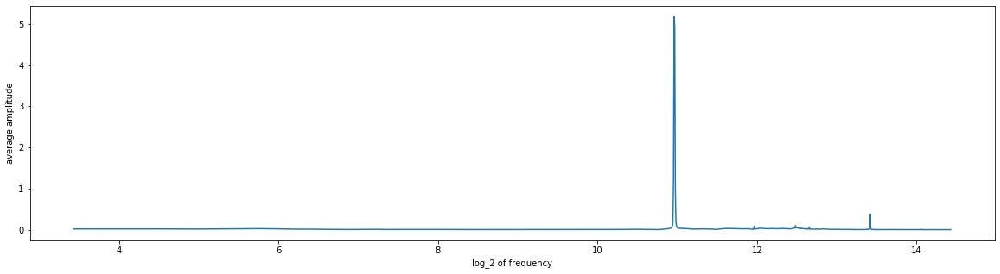

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2258
instrument_name       bells
note                    Ab5
expression          plastic
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2258.aif
Analyzing sample...


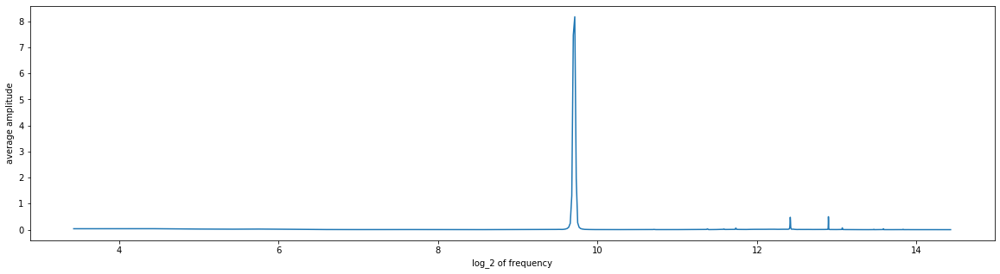

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2259
instrument_name       bells
note                     G6
expression          plastic
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2259.aif
Analyzing sample...


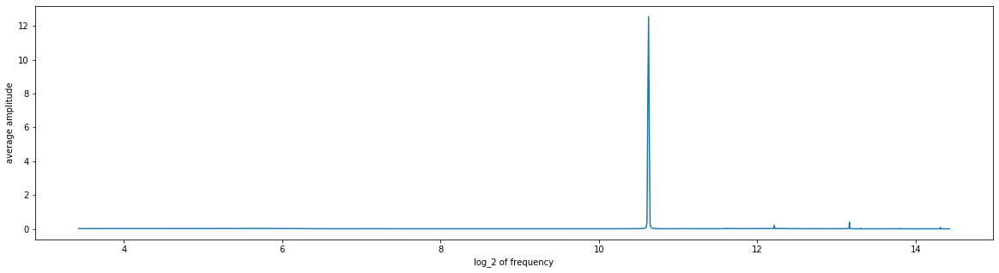

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2260
instrument_name       bells
note                     F7
expression          plastic
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2260.aif
Analyzing sample...


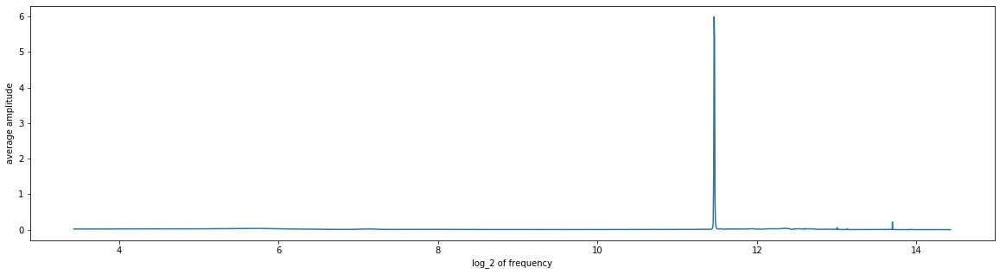

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2261
instrument_name       bells
note                    Gb5
expression          plastic
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2261.aif
Analyzing sample...


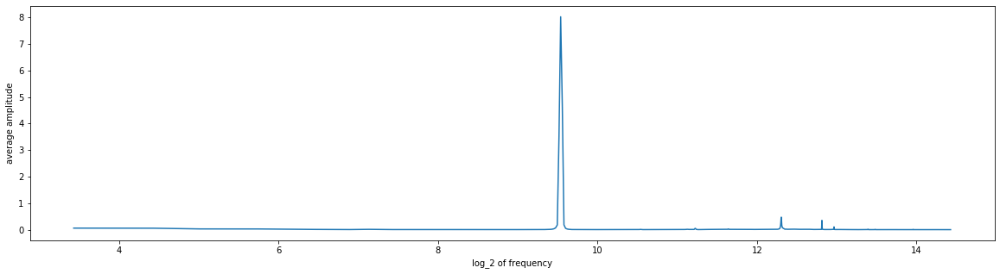

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2262
instrument_name       bells
note                    Eb6
expression          plastic
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2262.aif
Analyzing sample...


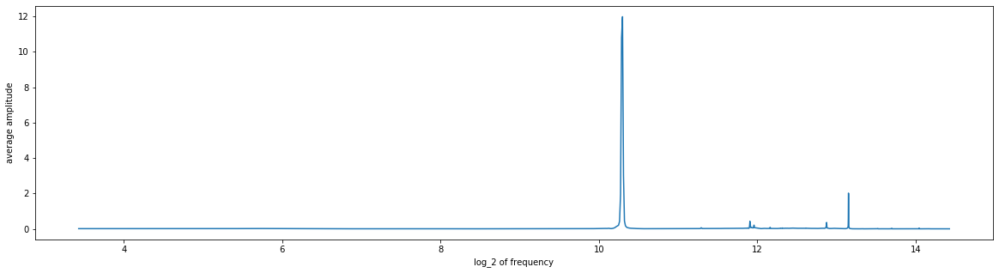

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2263
instrument_name       bells
note                    Bb6
expression          plastic
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2263.aif
Analyzing sample...


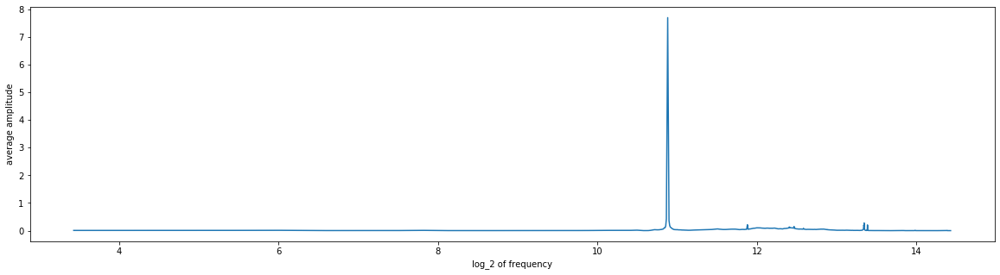

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2264
instrument_name       bells
note                     E7
expression          plastic
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2264.aif
Analyzing sample...


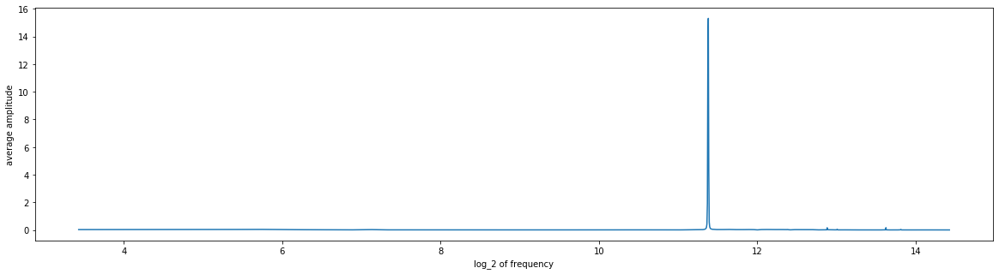

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2265
instrument_name       bells
note                     C5
expression          plastic
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2265.aif
Analyzing sample...


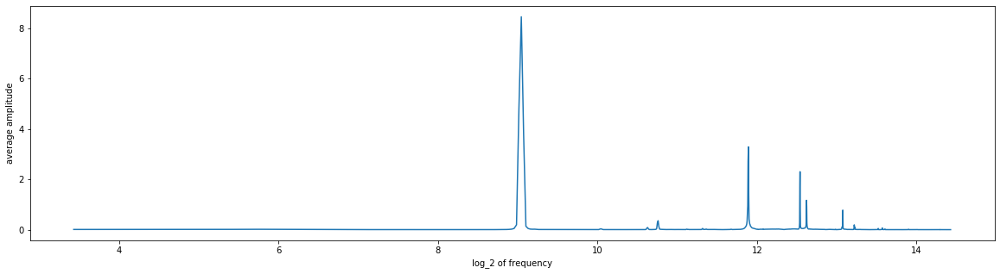

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2266
instrument_name       bells
note                     D6
expression          plastic
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2266.aif
Analyzing sample...


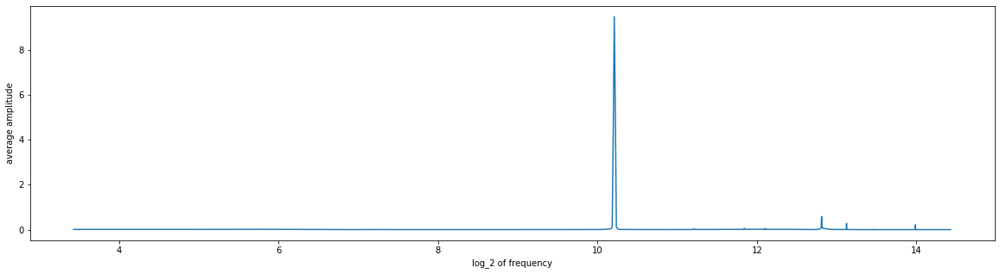

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2267
instrument_name       bells
note                    Ab7
expression          plastic
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2267.aif
Analyzing sample...


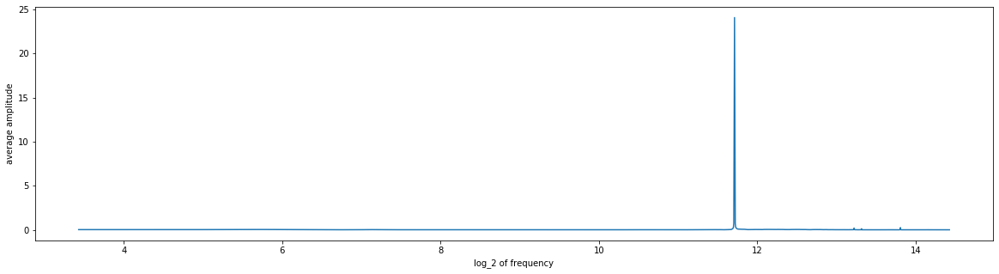

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2268
instrument_name       bells
note                     C8
expression          plastic
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2268.aif
Analyzing sample...


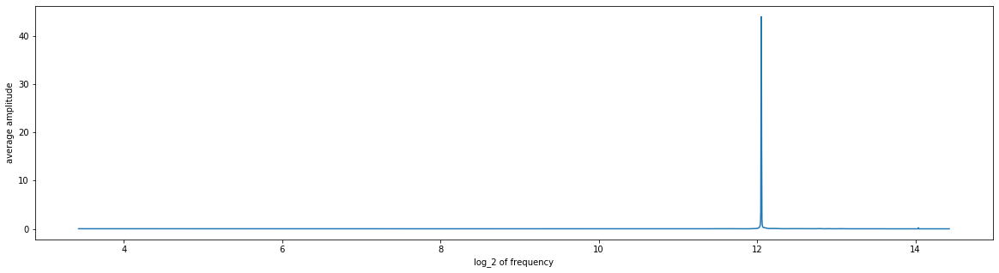

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2269
instrument_name       bells
note                     A6
expression          plastic
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2269.aif
Analyzing sample...


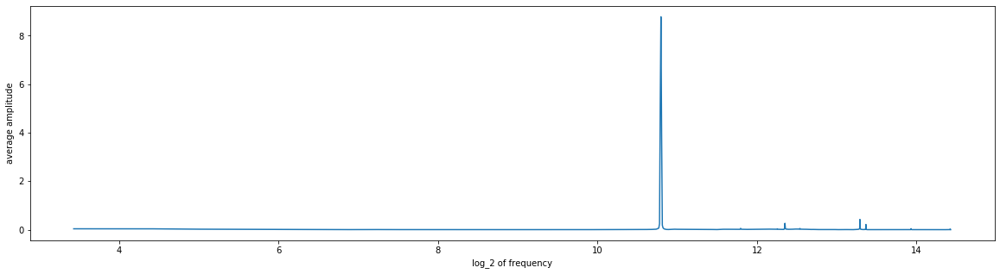

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2270
instrument_name       bells
note                     F5
expression          plastic
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2270.aif
Analyzing sample...


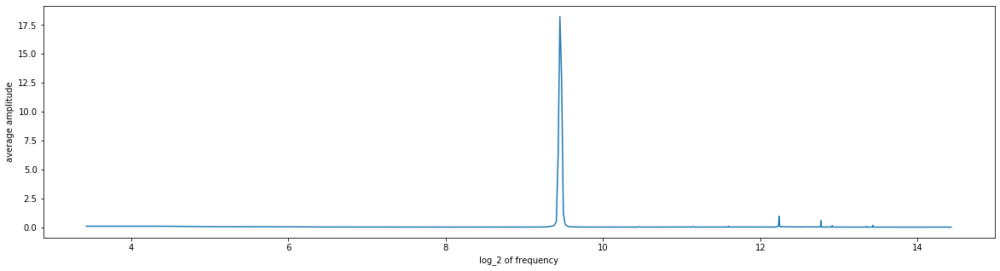

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2271
instrument_name       bells
note                    Gb7
expression          plastic
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2271.aif
Analyzing sample...


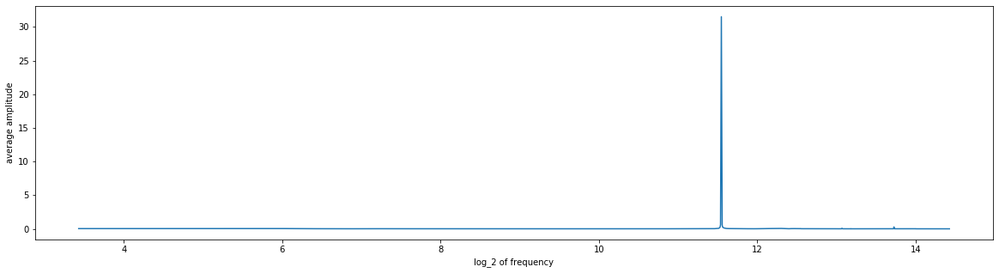

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2272
instrument_name       bells
note                     A7
expression            brass
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2272.aif
Analyzing sample...


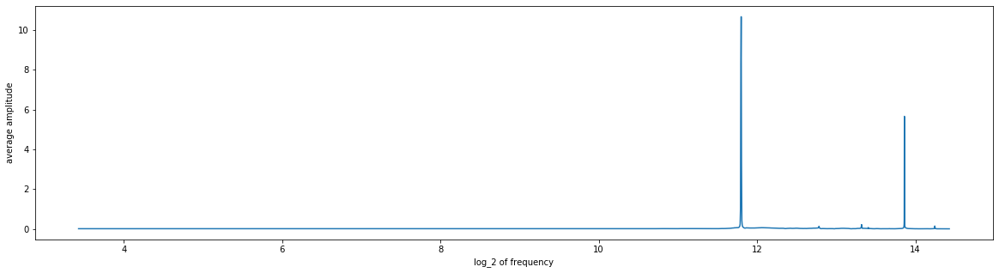

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2273
instrument_name       bells
note                     G5
expression            brass
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2273.aif
Analyzing sample...


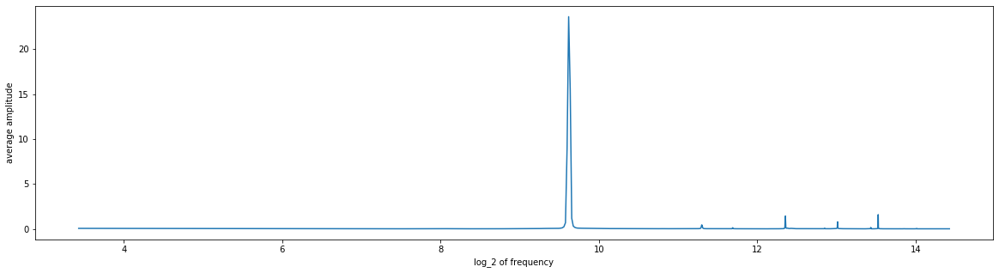

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2274
instrument_name       bells
note                    Eb7
expression            brass
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2274.aif
Analyzing sample...


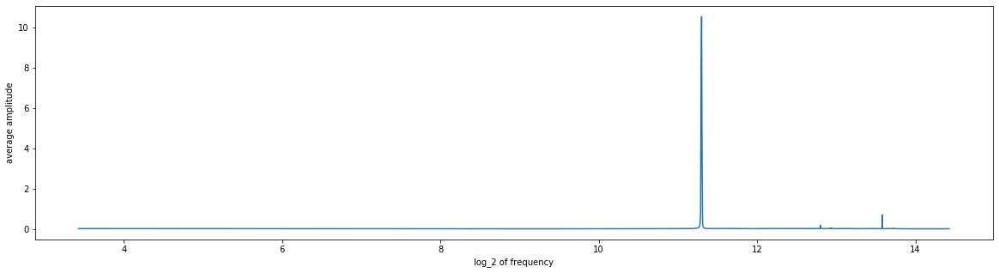

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2275
instrument_name       bells
note                    Bb7
expression            brass
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2275.aif
Analyzing sample...


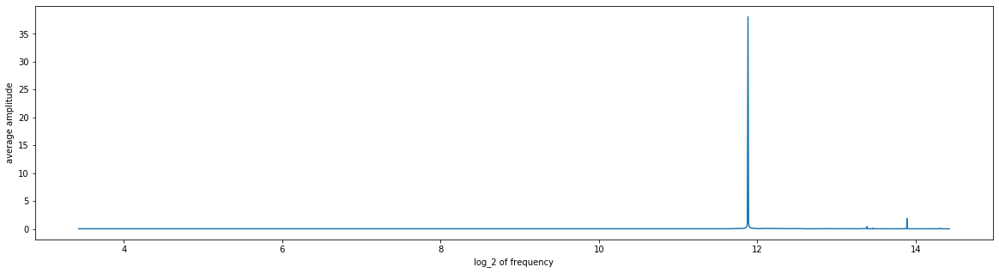

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2276
instrument_name       bells
note                     E6
expression            brass
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2276.aif
Analyzing sample...


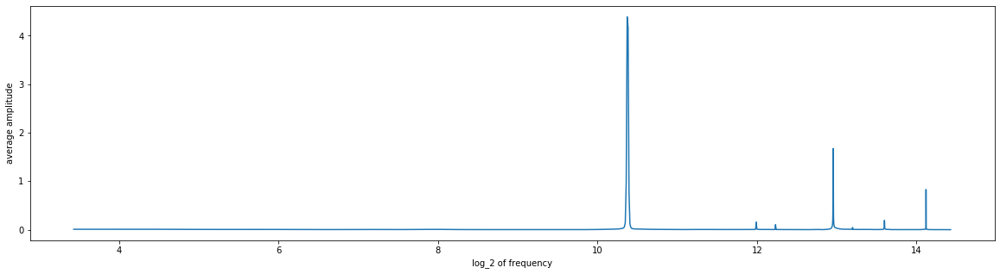

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2277
instrument_name       bells
note                    Db7
expression            brass
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2277.aif
Analyzing sample...


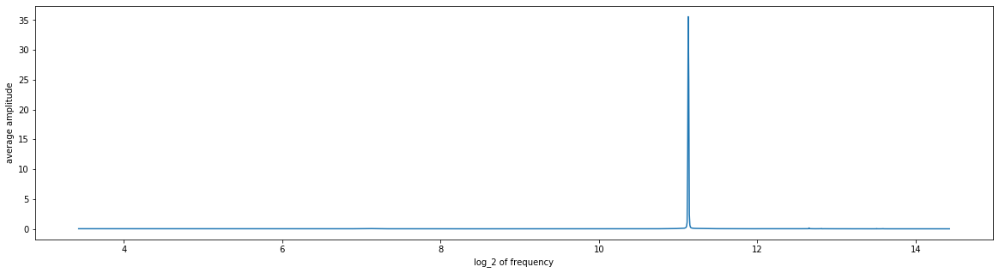

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2278
instrument_name       bells
note                     B5
expression            brass
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2278.aif
Analyzing sample...


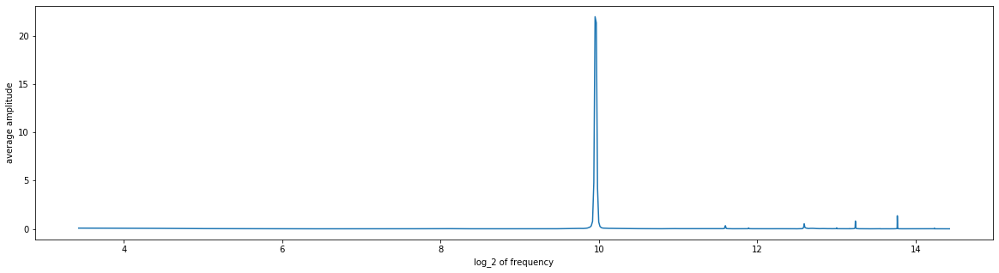

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2279
instrument_name       bells
note                     D7
expression            brass
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2279.aif
Analyzing sample...


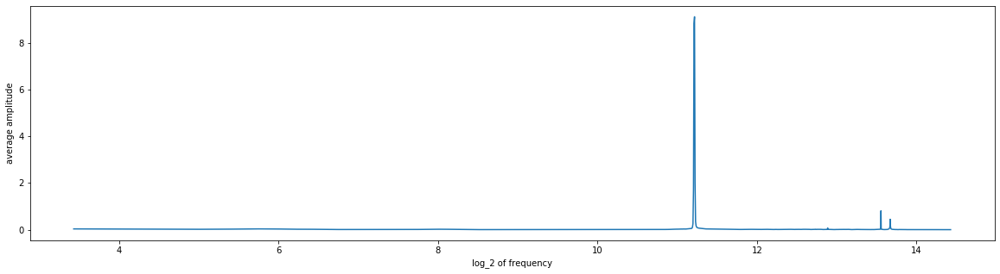

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2280
instrument_name       bells
note                    Eb8
expression            brass
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2280.aif
Analyzing sample...


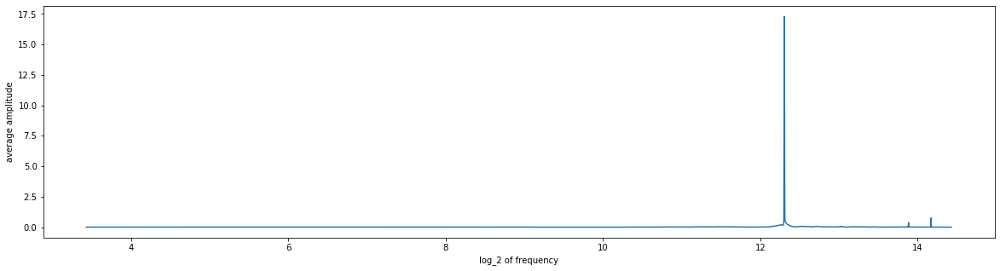

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2281
instrument_name       bells
note                     A5
expression            brass
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2281.aif
Analyzing sample...


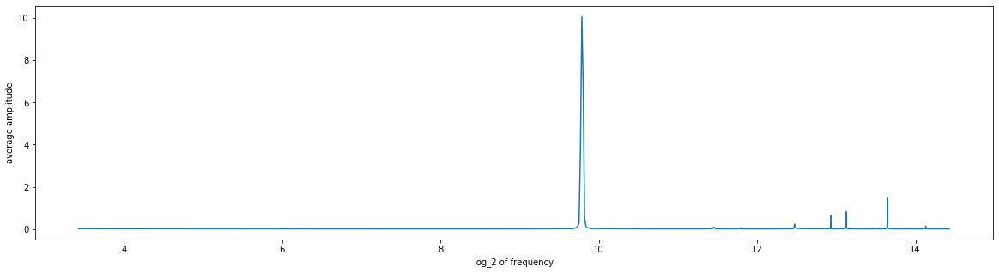

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2282
instrument_name       bells
note                     G7
expression            brass
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2282.aif
Analyzing sample...


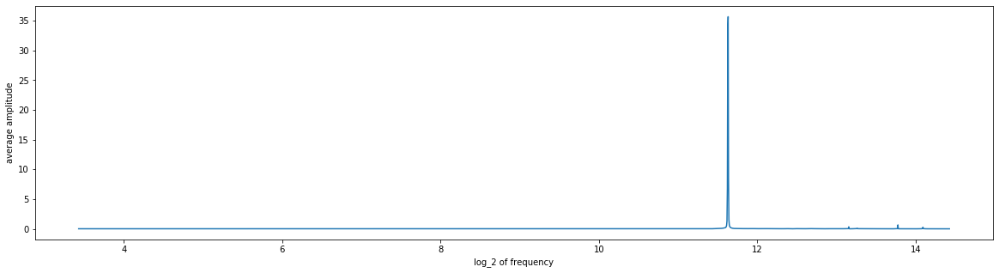

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2283
instrument_name       bells
note                    Eb5
expression            brass
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2283.aif
Analyzing sample...


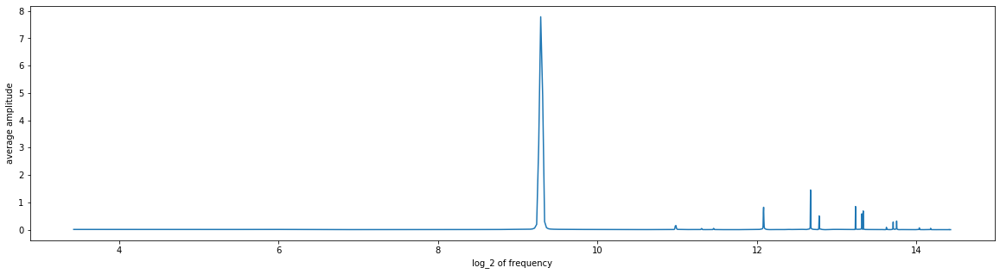

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2284
instrument_name       bells
note                    Bb5
expression            brass
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2284.aif
Analyzing sample...


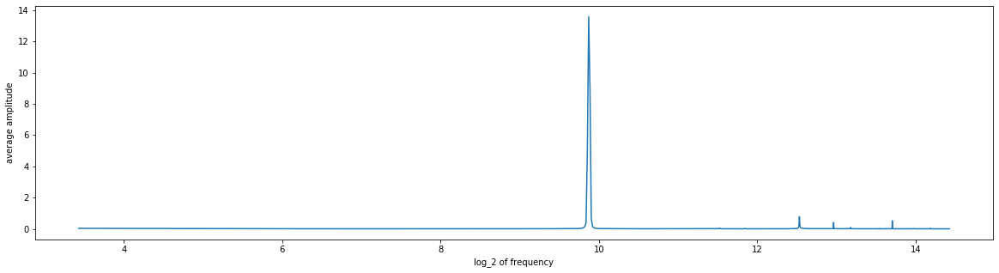

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2285
instrument_name       bells
note                     F6
expression            brass
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2285.aif
Analyzing sample...


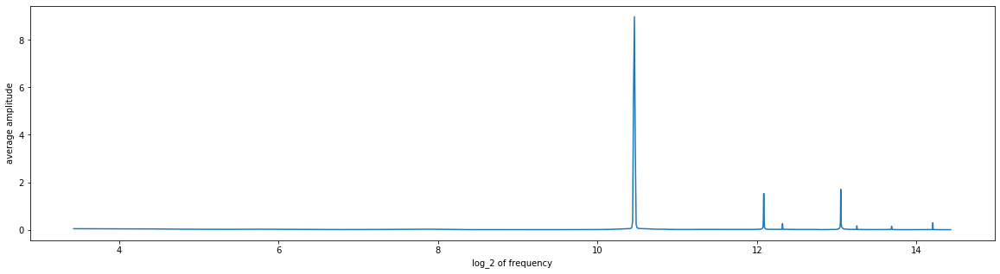

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2286
instrument_name       bells
note                    Gb6
expression            brass
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2286.aif
Analyzing sample...


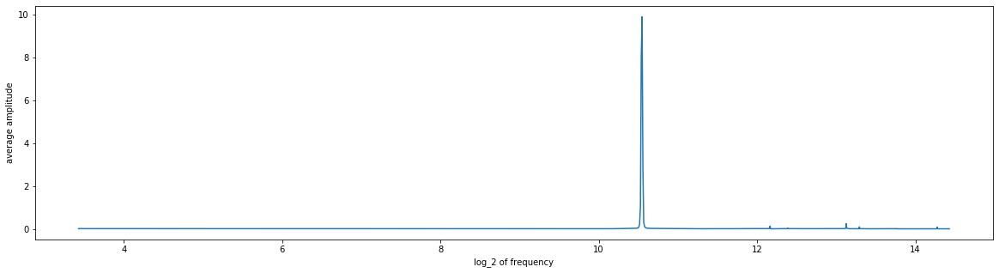

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2287
instrument_name       bells
note                     D8
expression            brass
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2287.aif
Analyzing sample...


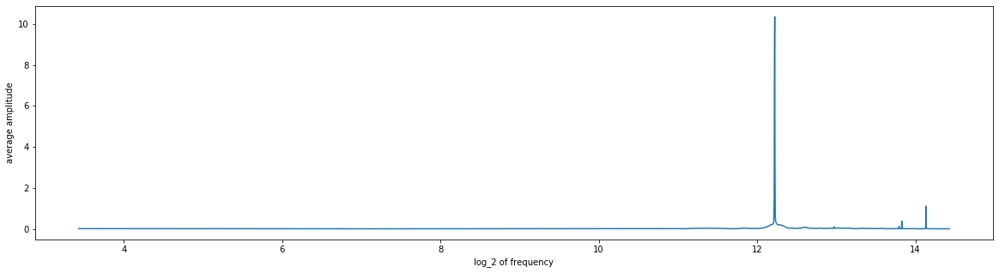

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2288
instrument_name       bells
note                    Db8
expression            brass
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2288.aif
Analyzing sample...


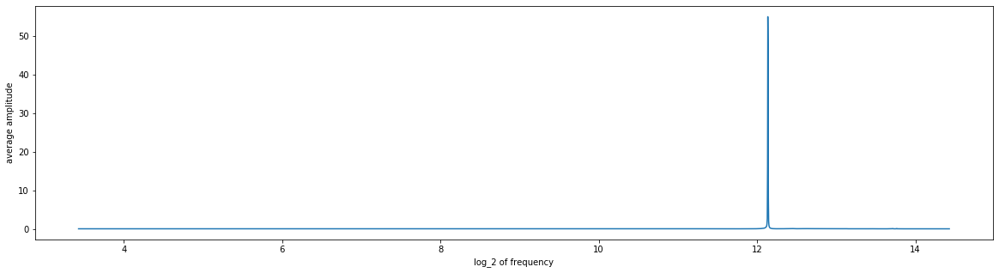

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2289
instrument_name       bells
note                     C6
expression            brass
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2289.aif
Analyzing sample...


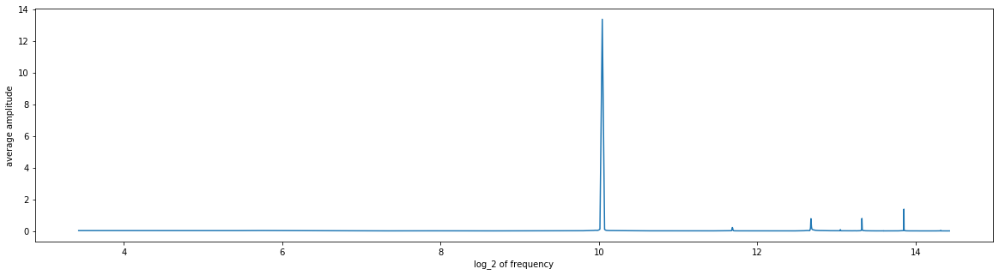

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2290
instrument_name       bells
note                     B7
expression            brass
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2290.aif
Analyzing sample...


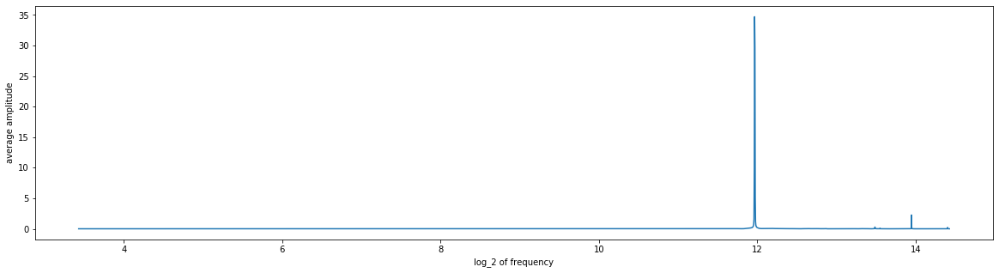

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2291
instrument_name       bells
note                     D5
expression            brass
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2291.aif
Analyzing sample...


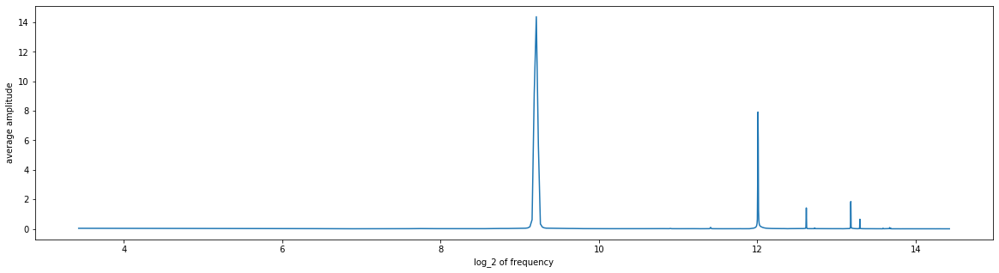

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2292
instrument_name       bells
note                    Ab6
expression            brass
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2292.aif
Analyzing sample...


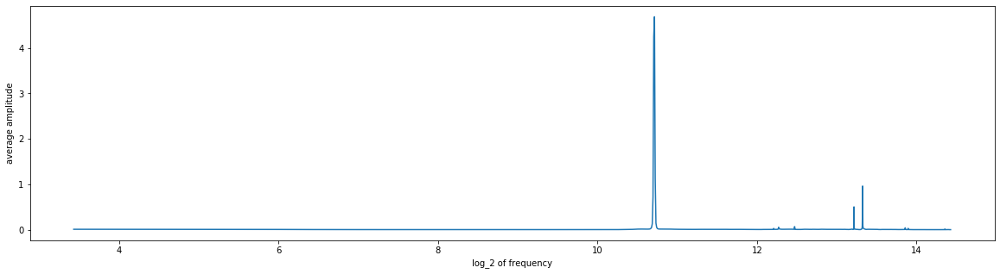

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2293
instrument_name       bells
note                    Db5
expression            brass
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2293.aif
Analyzing sample...


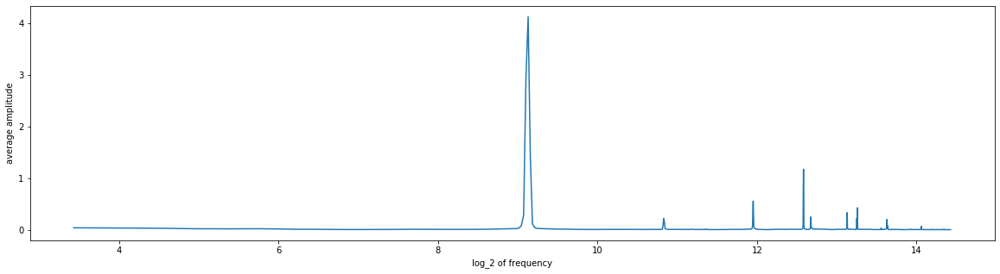

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2294
instrument_name       bells
note                     E7
expression            brass
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2294.aif
Analyzing sample...


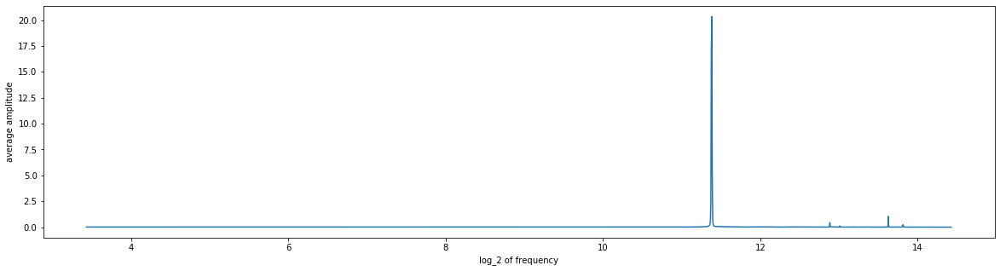

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2295
instrument_name       bells
note                     C5
expression            brass
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2295.aif
Analyzing sample...


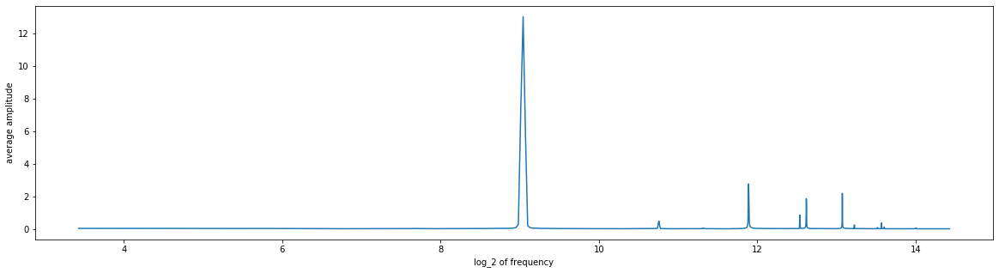

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2296
instrument_name       bells
note                    Db6
expression            brass
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2296.aif
Analyzing sample...


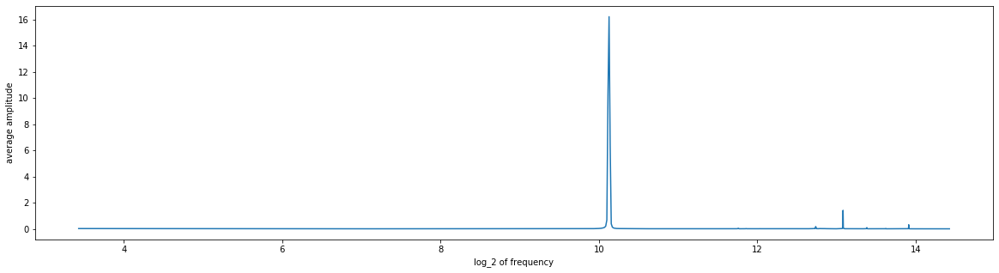

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2297
instrument_name       bells
note                     C8
expression            brass
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2297.aif
Analyzing sample...


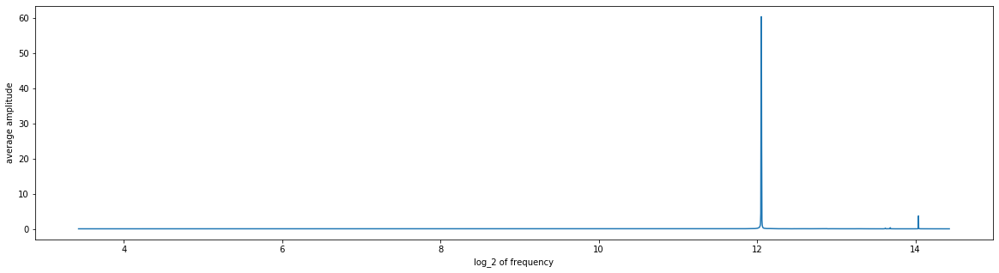

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2298
instrument_name       bells
note                    Ab5
expression            brass
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2298.aif
Analyzing sample...


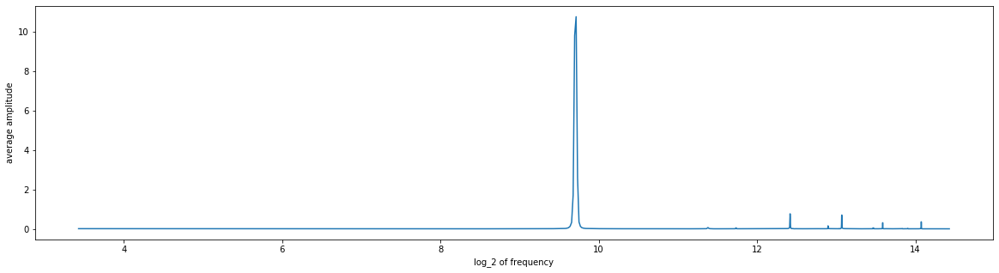

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2299
instrument_name       bells
note                     D6
expression            brass
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2299.aif
Analyzing sample...


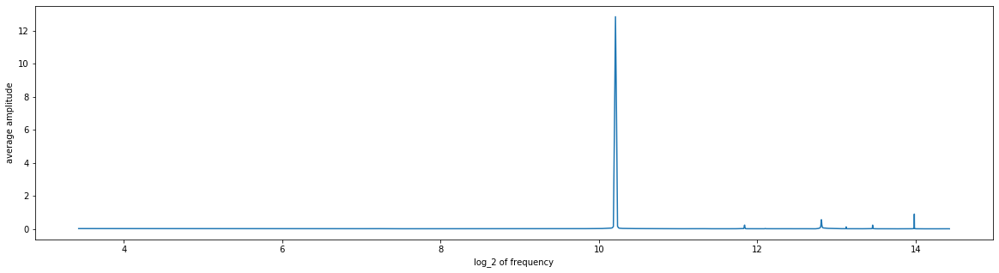

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2300
instrument_name       bells
note                     A6
expression            brass
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2300.aif
Analyzing sample...


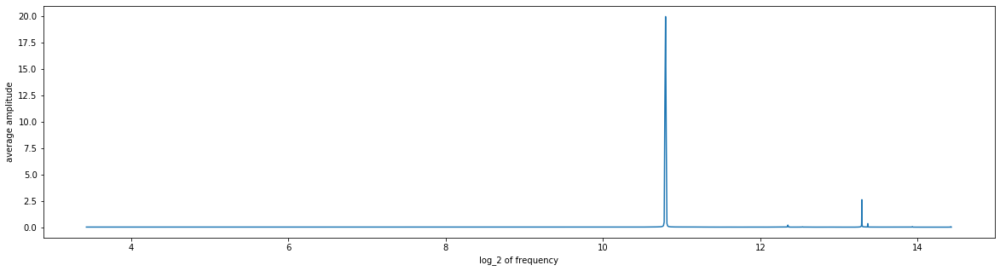

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2301
instrument_name       bells
note                    Gb5
expression            brass
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2301.aif
Analyzing sample...


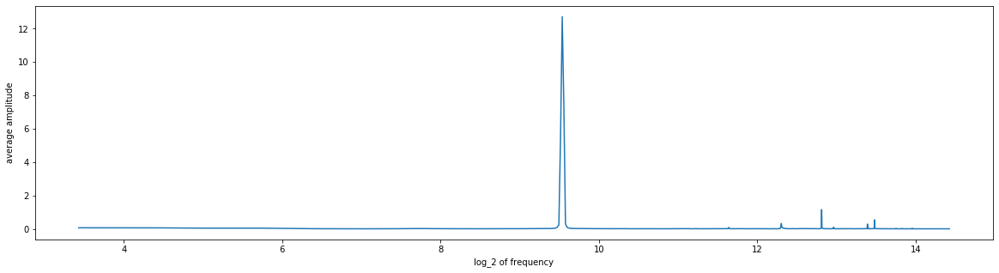

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2302
instrument_name       bells
note                     F5
expression            brass
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2302.aif
Analyzing sample...


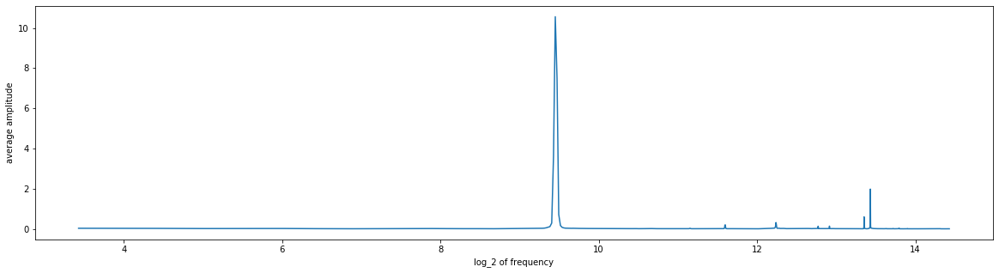

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2303
instrument_name       bells
note                    Eb6
expression            brass
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2303.aif
Analyzing sample...


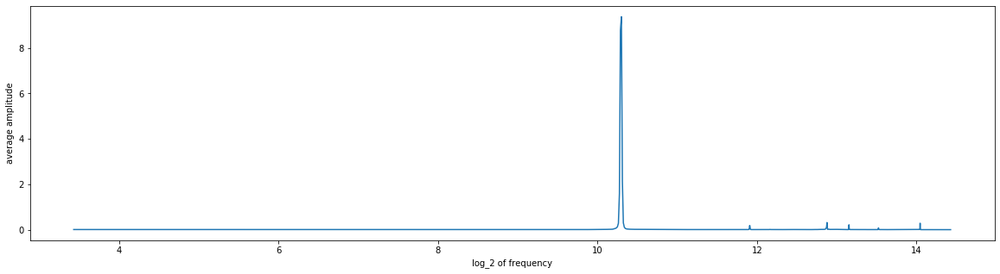

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2304
instrument_name       bells
note                    Bb6
expression            brass
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2304.aif
Analyzing sample...


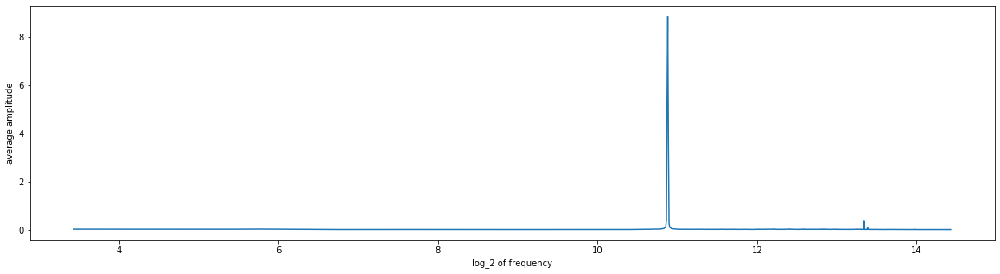

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2305
instrument_name       bells
note                     E5
expression            brass
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2305.aif
Analyzing sample...


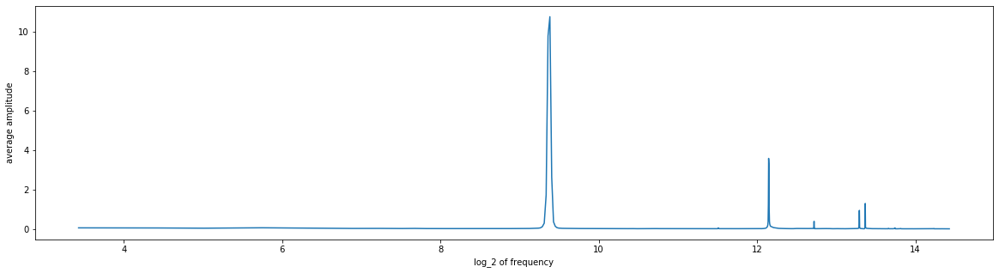

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2306
instrument_name       bells
note                     C7
expression            brass
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2306.aif
Analyzing sample...


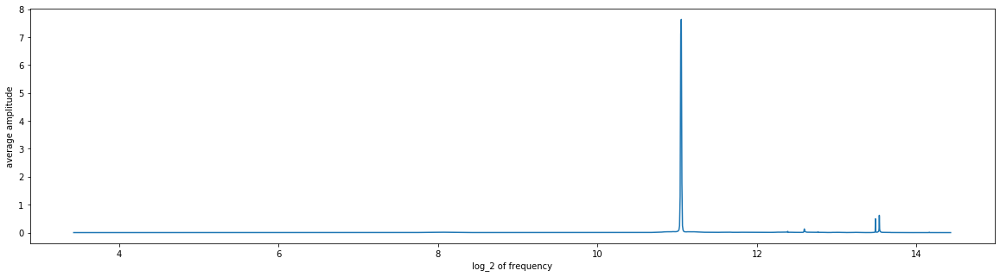

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2307
instrument_name       bells
note                    Ab7
expression            brass
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2307.aif
Analyzing sample...


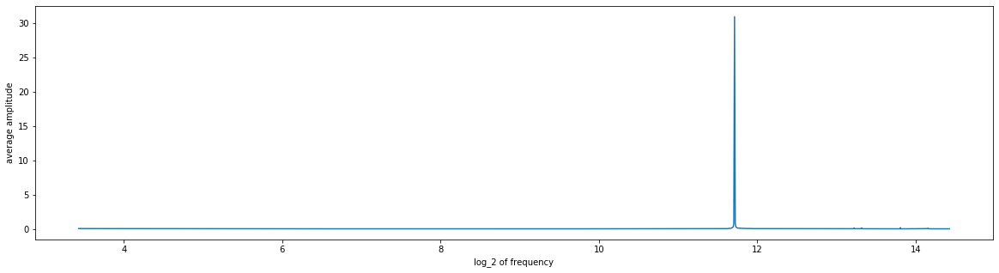

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2308
instrument_name       bells
note                     B6
expression            brass
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2308.aif
Analyzing sample...


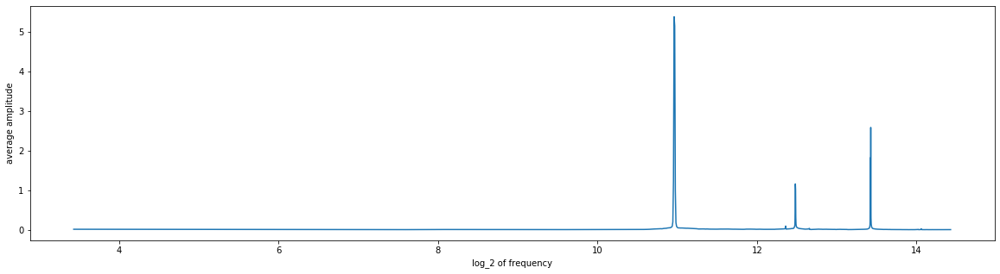

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2309
instrument_name       bells
note                     E8
expression            brass
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2309.aif
Analyzing sample...


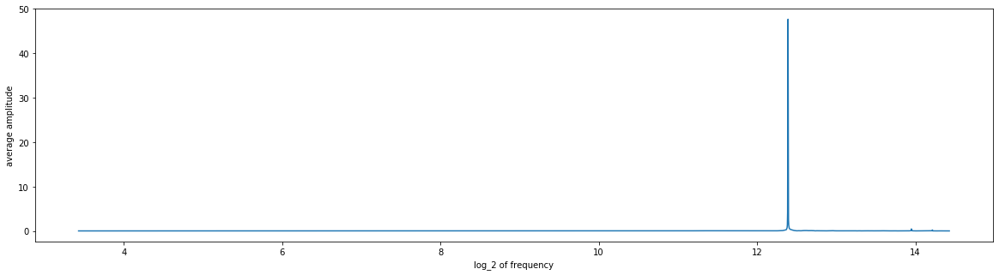

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2310
instrument_name       bells
note                     G6
expression            brass
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2310.aif
Analyzing sample...


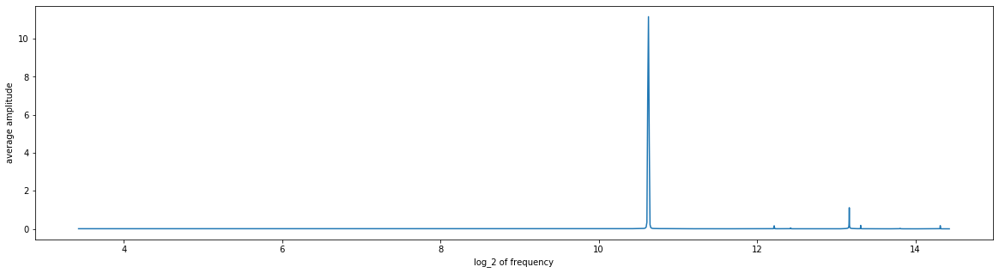

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2311
instrument_name       bells
note                    Gb7
expression            brass
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2311.aif
Analyzing sample...


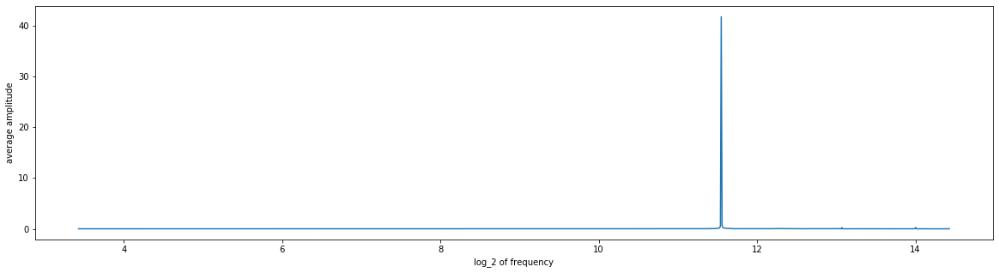

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2312
instrument_name       bells
note                     F7
expression            brass
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2312.aif
Analyzing sample...


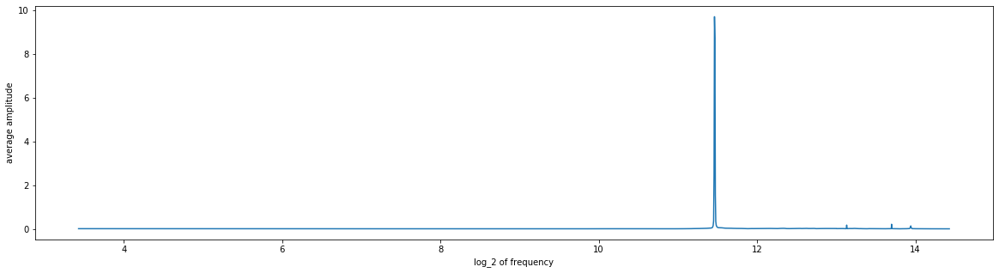

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2313
instrument_name     Crotale
note                     C7
expression                 
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2313.aif
Analyzing sample...


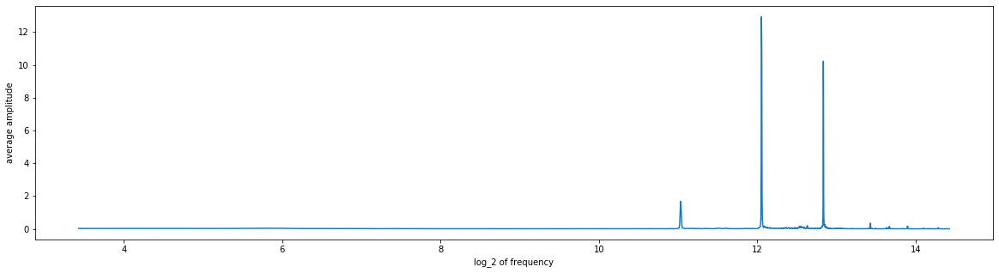

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2314
instrument_name     Crotale
note                    Db6
expression                 
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2314.aif
Analyzing sample...


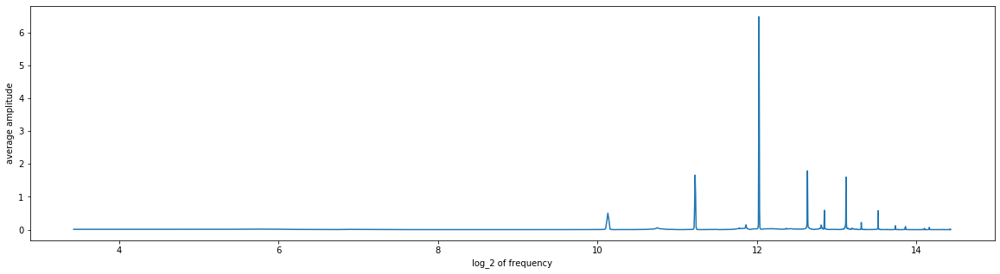

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2315
instrument_name     Crotale
note                     B6
expression                 
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2315.aif
Analyzing sample...


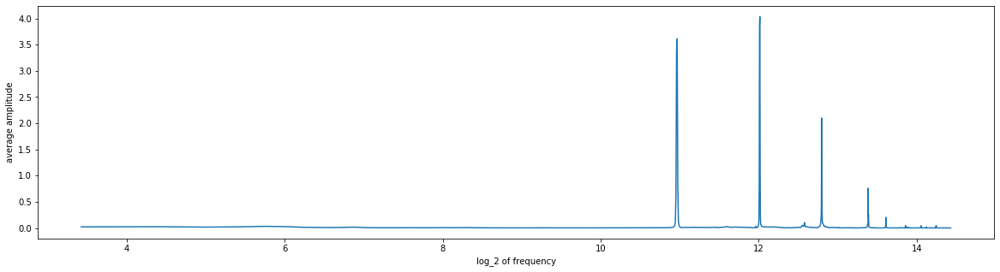

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2316
instrument_name     Crotale
note                     G6
expression                 
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2316.aif
Analyzing sample...


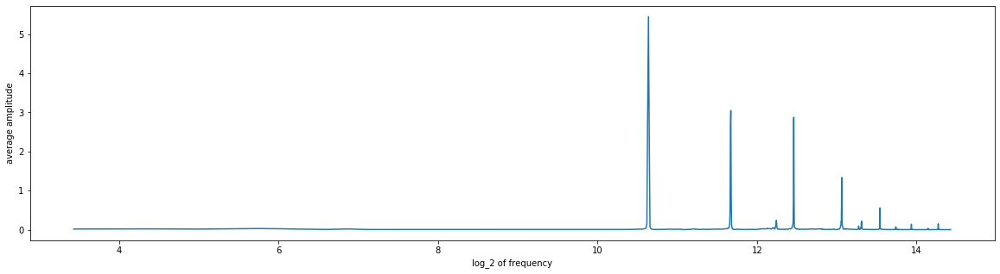

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2317
instrument_name     Crotale
note                    Eb6
expression                 
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2317.aif
Analyzing sample...


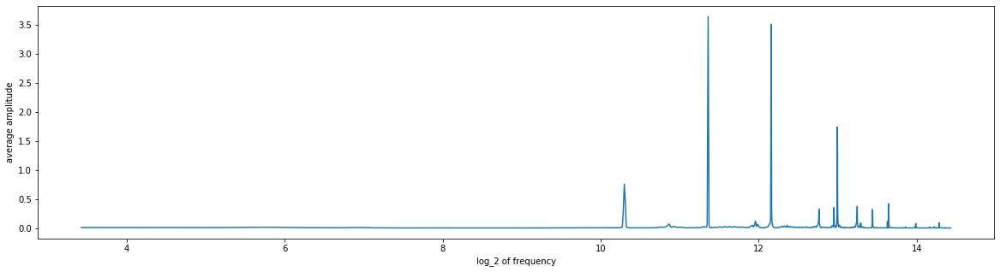

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2318
instrument_name     Crotale
note                    Bb6
expression                 
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2318.aif
Analyzing sample...


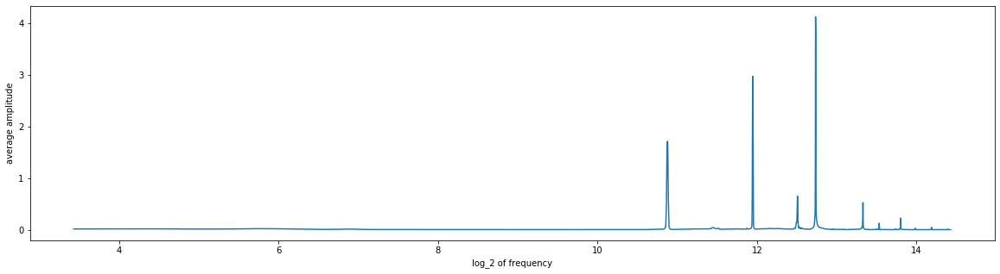

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2319
instrument_name     Crotale
note                     F7
expression                 
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2319.aif
Analyzing sample...


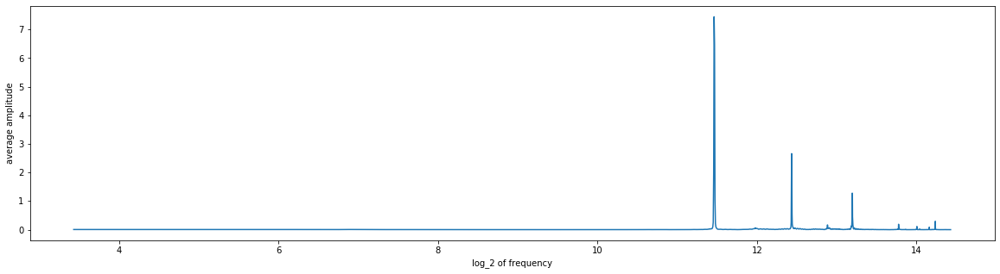

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2320
instrument_name     Crotale
note                     E7
expression                 
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2320.aif
Analyzing sample...


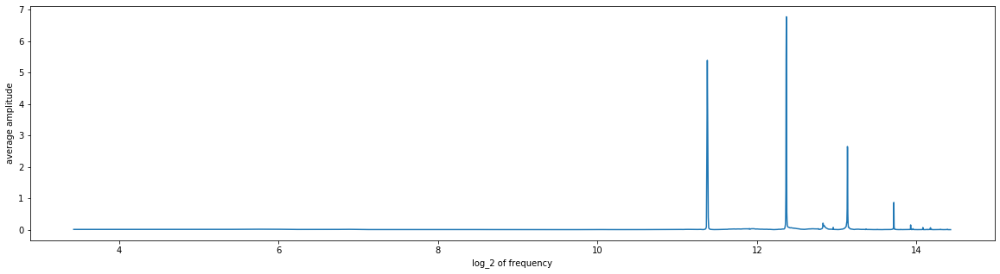

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2321
instrument_name     Crotale
note                    Ab7
expression                 
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2321.aif
Analyzing sample...


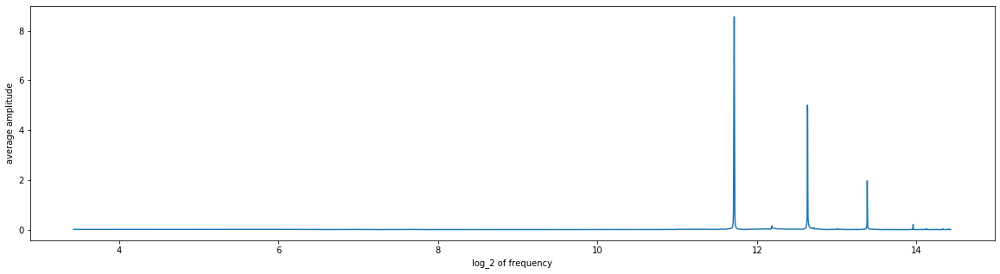

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2322
instrument_name     Crotale
note                     C8
expression                 
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2322.aif
Analyzing sample...


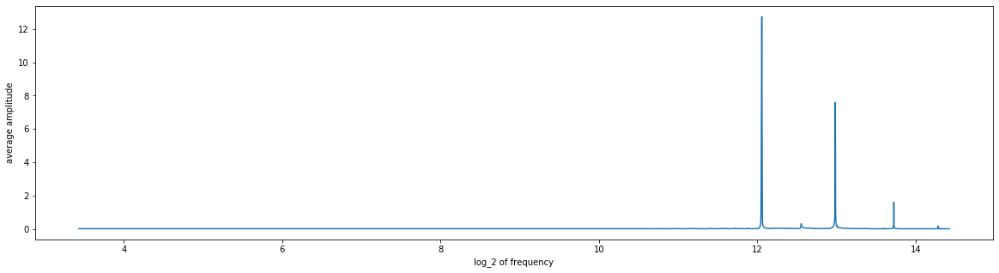

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2323
instrument_name     Crotale
note                     D6
expression                 
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2323.aif
Analyzing sample...


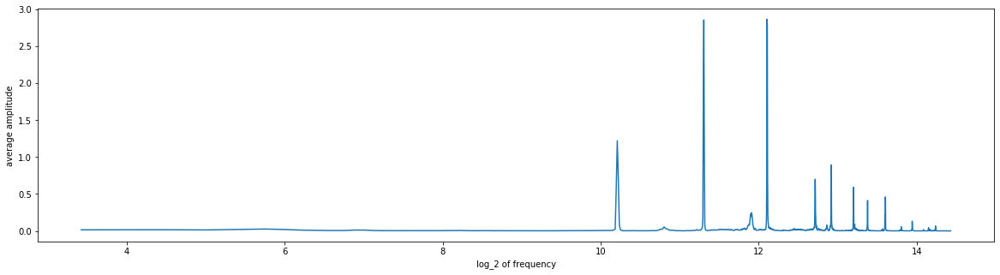

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2324
instrument_name     Crotale
note                    Gb7
expression                 
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2324.aif
Analyzing sample...


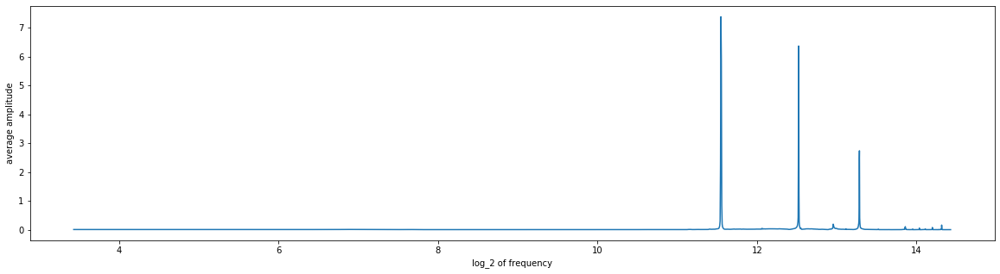

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2325
instrument_name     Crotale
note                     A6
expression                 
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2325.aif
Analyzing sample...


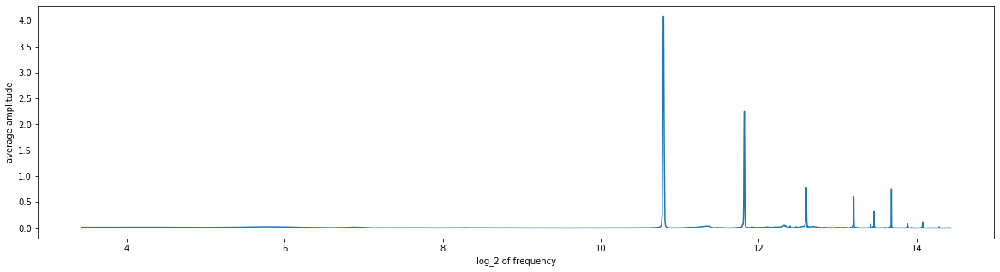

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2326
instrument_name     Crotale
note                     G7
expression                 
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2326.aif
Analyzing sample...


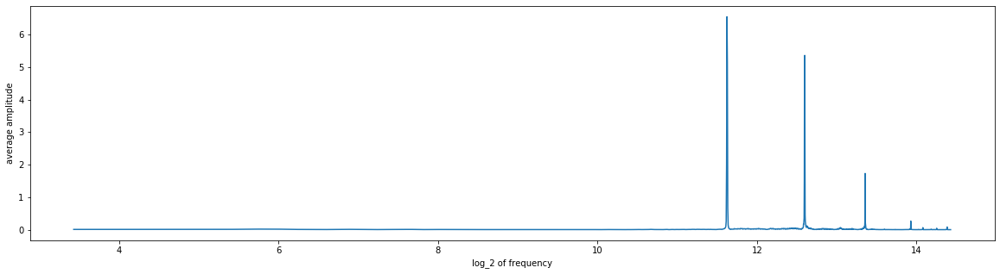

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2327
instrument_name     Crotale
note                    Eb7
expression                 
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2327.aif
Analyzing sample...


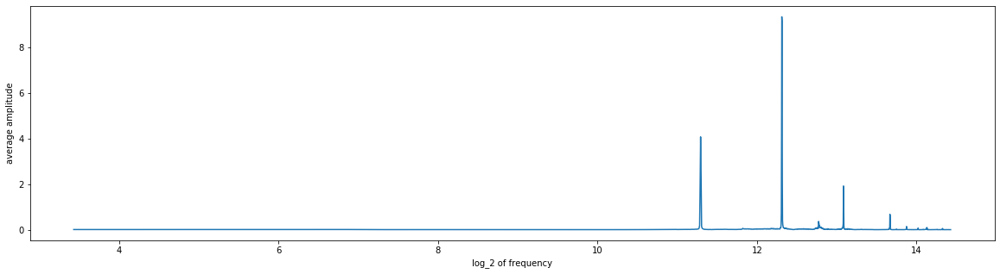

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2328
instrument_name     Crotale
note                    Bb7
expression                 
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2328.aif
Analyzing sample...


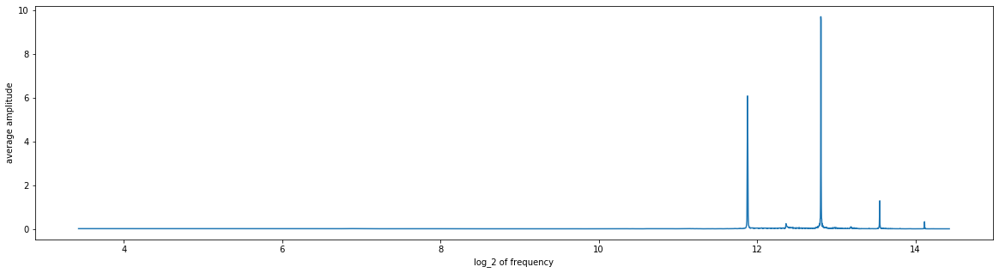

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2329
instrument_name     Crotale
note                     F6
expression                 
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2329.aif
Analyzing sample...


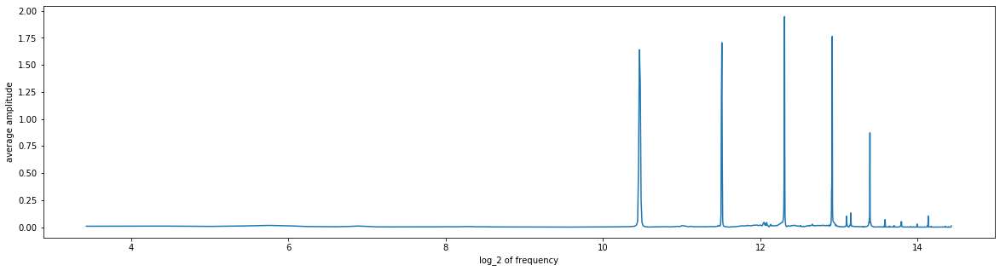

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2330
instrument_name     Crotale
note                     C6
expression                 
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2330.aif
Analyzing sample...


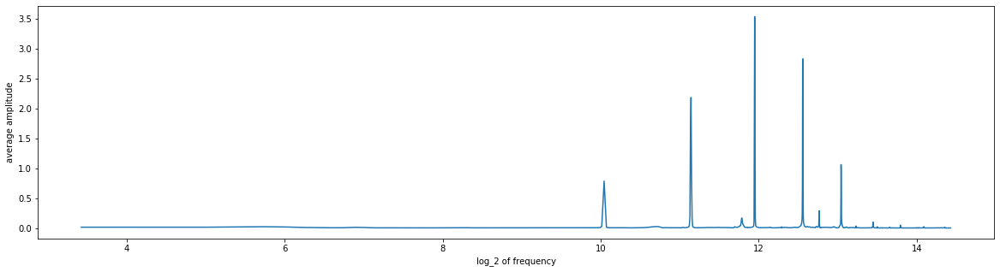

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2331
instrument_name     Crotale
note                    Db7
expression                 
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2331.aif
Analyzing sample...


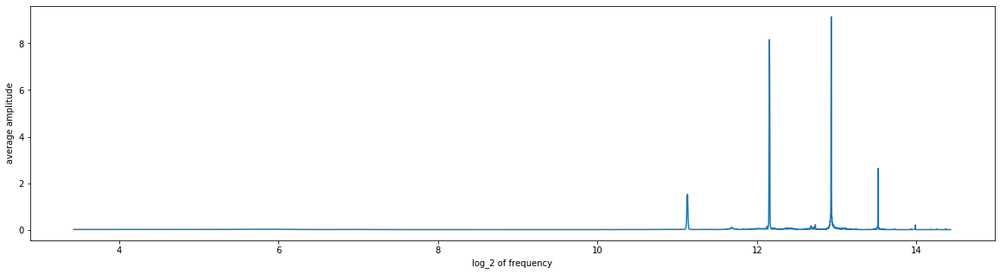

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2332
instrument_name     Crotale
note                     B7
expression                 
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2332.aif
Analyzing sample...


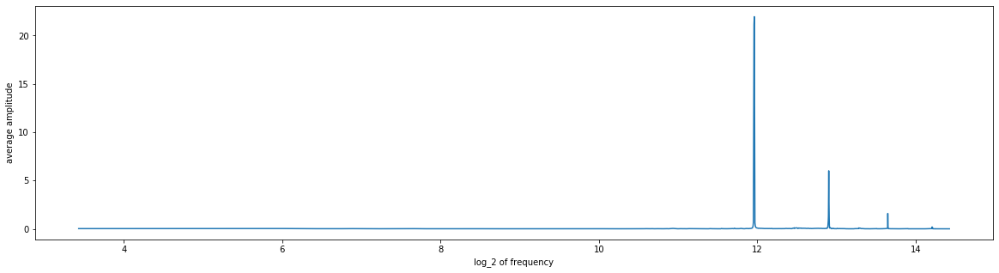

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2333
instrument_name     Crotale
note                    Gb6
expression                 
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2333.aif
Analyzing sample...


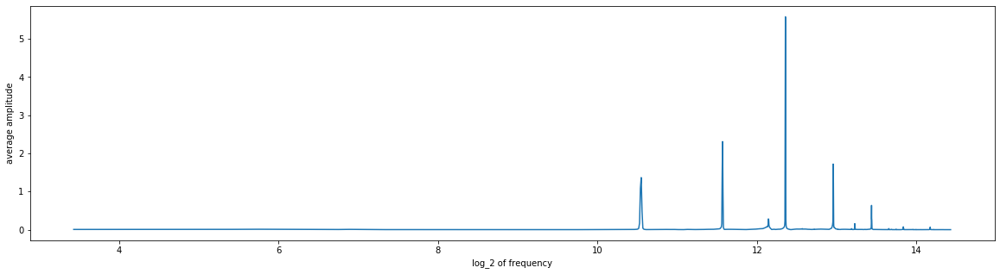

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2334
instrument_name     Crotale
note                     A7
expression                 
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2334.aif
Analyzing sample...


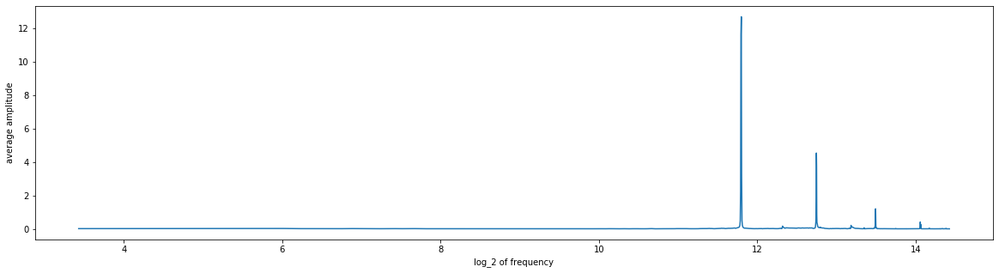

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2335
instrument_name     Crotale
note                     E6
expression                 
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2335.aif
Analyzing sample...


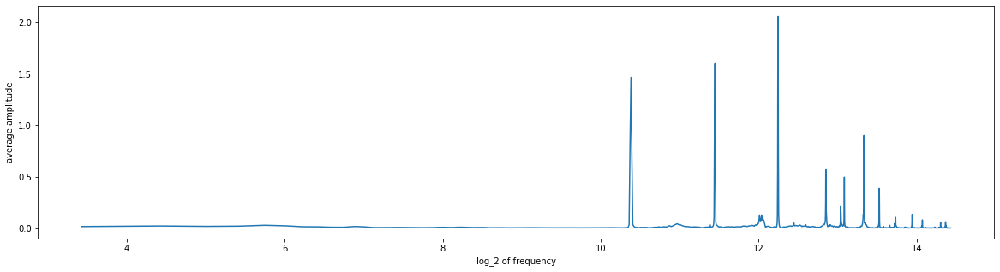

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2336
instrument_name     Crotale
note                    Ab6
expression                 
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2336.aif
Analyzing sample...


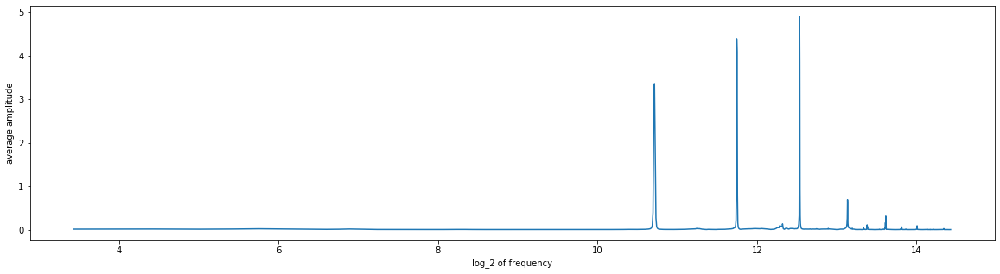

Inserting harmonic content into database...
Done!
Attemping to download the following sample:
sample_id              2337
instrument_name     Crotale
note                     D7
expression                 
source             Iowa2012
file_extension          aif
Name: 0, dtype: object
2337.aif
Analyzing sample...


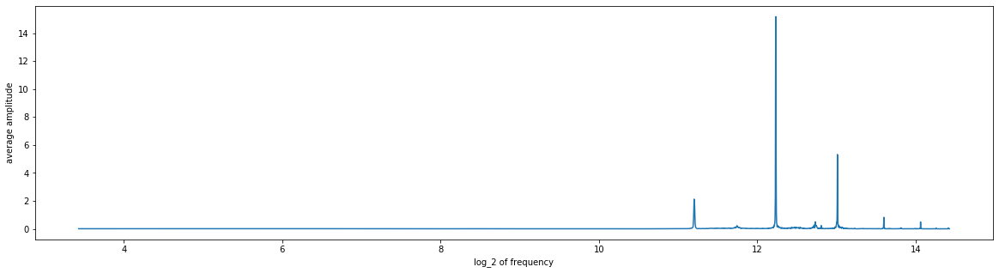

Inserting harmonic content into database...
Done!


In [69]:
for i in range(1,2338):
    process_sample(i)